In [26]:
%%HTML
<style> code {background-color : pink !important;} </style>

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

In [27]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# %matplotlib qt

rows=6
cols=9

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((rows*cols,3), np.float32)
objp[:,:2] = np.mgrid[0:cols, 0:rows].T.reshape(-1,2)


In [28]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (cols,rows), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (cols,rows), corners, ret)
        write_name = 'camera_cal/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
#         cv2.waitKey(500)

cv2.destroyAllWindows()


### Undistort a calibration image and store output

Text(0.5, 1.0, 'Undistorted Image')

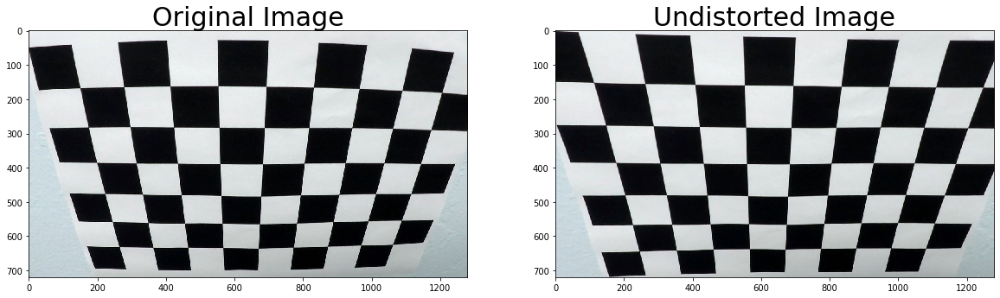

In [29]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist_calibration2.jpg',dst)

# Visualize undistorted Images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Calculate Perspective Transformation matrix

In [30]:
# Using the first image to calculate perspective transform
# src = np.float32([[240,702],[1044,702],[703,461],[582,461]])
# dst = np.float32([[240,702],[1044,702],[1044,461],[240,461]])


img = mpimg.imread('test_images/straight_lines1.jpg')

#Get image data
max_y = img.shape[0]
max_x = img.shape[1]

img_size = (max_x, max_y)

#Create source image points
src = np.float32([[max_x*0.46, max_y*0.625], #top left # 0.465
                 [max_x*0.1, max_y],      #bottom left # 0.156
                 [max_x*0.9, max_y],     #bottom right
                 [max_x*0.54, max_y*0.625]]) #top right # 0.539

#Create destination image points
dst = np.float32([[max_x*0.234,0],
                 [max_x*0.234, max_y],
                 [max_x*0.742, max_y],
                 [max_x*0.742, 0]])
src = np.float32(
    [[(img_size[0] / 2) - 68, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 60), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 68), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
M = cv2.getPerspectiveTransform(src,dst)
Minv = cv2.getPerspectiveTransform(dst, src)

## Class to keep track of lanes

In [31]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        self.prev_radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        # No of frames skipped without detections
        self.frame_skipped = 5
        # Max skipped frame allowed
        self._max_frame_skip = 5
        # Y Coordinates
        self.ploty = []
        
    def reinitialize_required(self):
        if self.frame_skipped<self._max_frame_skip:
            return False
        else:
            return True
        
    def skip_frame(self):
        self.current_fit = self.best_fit
        self.recent_xfitted = self.bestx
        self.frame_skipped = self.frame_skipped + 1
        self.detected = False
        
    def accept_fit(self):
        self.best_fit = self.current_fit
        self.bestx = self.recent_xfitted
        self.detected = True
        self.frame_skipped = 0
        
    def set_rad_of_cur(self,radius):
        self.prev_radius_of_curvature = self.radius_of_curvature
        self.radius_of_curvature = radius

## Lane Detection Helper Functions

In [32]:
def undistortStep(image, mtx, dist, debug=False):
    undist_image = cv2.undistort(image, mtx, dist, None, mtx)
    if debug:
        print("Undistort step output:")
        plt.figure()
        plt.imshow(undist_image)
        plt.show()
    return undist_image

In [33]:

def region_of_interest(img, vertices, invert = False):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    if invert:
        mask = cv2.bitwise_not(mask)
        
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def regionSelStep(image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, invert = False, debug = False):
    # Region Selecting From Each Image
    region_select = np.copy(image)
    ysize = image.shape[0]
    xsize = image.shape[1]

    # Vertices of a quadrilateral
    left_bottom = np.array([xsize*bottomLeftXOffset, ysize])
    right_bottom = np.array([xsize*bottomRightXOffset,ysize])
    left_top = np.array([xsize*topLeftXOffset, ysize*horizon])
    right_top = np.array([xsize*topRightXOffset, ysize*horizon])
    vertices = np.array( [[left_top,left_bottom,right_bottom,right_top]], dtype=np.int32 )
    if debug:
        ## plot final masked images
        print("Region select pipe output:")
        plt.figure()
        
    regionImage = region_of_interest(image, vertices, invert)
    
    if debug:
        plt.imshow(regionImage, cmap='gray')
        plt.show()
    return(regionImage)

In [34]:
def perspectiveStep(image, M, debug=False):
    warped_color = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

    
    if debug:
        print("Perspective Transformation output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(warped_color, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return(warped_color)

In [35]:
def sobelThresh(img_channel, chan_val_thresh, sx_thresh):
    """
    Calculates gradient of image to be used to detect edges.
    """
    #Apply x gradient to emphasize verticle lines
    sobelx = np.absolute(cv2.Sobel(img_channel, cv2.CV_64F, 1, 0))
    #Resize to an 8-bit integer
    scaled_sobel = np.uint8(255*sobelx/np.max(sobelx))
    
    #Create binary image based on X-Gradient
    sobel = np.zeros_like(scaled_sobel)
    sobel[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    #Create binary image based on Sobel only
    chanThresh = np.zeros_like(img_channel)
    chanThresh[(img_channel >= chan_val_thresh[0]) & (img_channel <= chan_val_thresh[1])] = 1
    
    #Combine x-gradient and sobel binary image
    combined = np.zeros_like(chanThresh)
    combined[(chanThresh == 1) | (sobel == 1)] = 1
    
    return combined


def getThrImg(img, debug = False):
    """
    Uses various color transforms to detect the lane pixels
    """
    
    #RGB color space
    B_channel = img[:,:,2]
    B_channel = sobelThresh(B_channel, (200,255), (50,100))
    
    if debug:
        print("Blue Activation output:")
        plt.figure()
        plt.imshow(B_channel, cmap = 'gray')
        plt.show()
    
    #HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    H_channel = hls[:,:,0]
    H_channel = sobelThresh(H_channel, (15,30), (20,100))
    HS_channel = hls[:,:,2]
    HS_channel = sobelThresh(HS_channel, (90,255), (20,100))
    HL_channel = hls[:,:,1]
    HL_channel = sobelThresh(HL_channel, (10,255), (20,100))
    
    S_channel = hls[:,:,2]
    S_channel = sobelThresh(S_channel, (90,255), (20,100))
    
    L_channel = hls[:,:,1]
    L_channel = sobelThresh(L_channel, (110,255), (20,100))
    
    
    if debug:
        print("Saturation Activation output:")
        plt.figure()
        plt.imshow(((S_channel == 1)&(L_channel == 1)), cmap = 'gray')
        plt.show()
    if debug:
        print("Hue Activation output:")
        plt.figure()
        plt.imshow(H_channel & (HS_channel == 1) & (HL_channel == 1), cmap = 'gray')
        plt.show()
    
    #HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    v_channel = hls[:,:,2]
    v_channel = sobelThresh(v_channel, (255,254), (100,99))
    
    if debug:
        print("Value Activation output:")
        plt.figure()
        plt.imshow(v_channel, cmap = 'gray')
        plt.show()
       
    #Combine the best channels from each color space
    thresh = np.zeros_like(S_channel)
    thresh[((S_channel == 1)&(L_channel == 1)) | (B_channel == 1) | (v_channel == 1)] = 1
    
    return thresh

# Edit this function to create your own pipeline.
def binaryActivationStep(img, debug = False):
    img = np.copy(img)
    kernel_size =7
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
       
    colorSelectImage = getThrImg(img, debug = debug)  
    if debug:
        print("Binary Activation output:")
        plt.figure()
        plt.imshow(colorSelectImage, cmap = 'gray')
        plt.show()
    
    return colorSelectImage



Test Image Original:


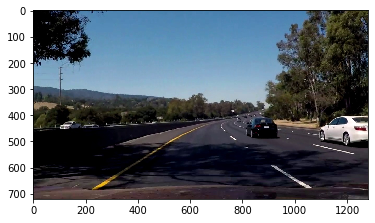

Blue Activation output:


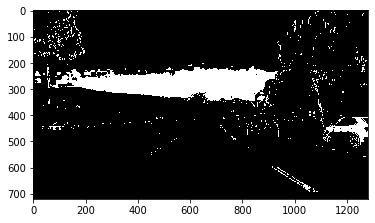

Saturation Activation output:


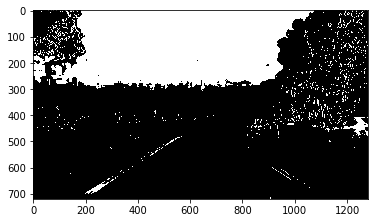

Hue Activation output:


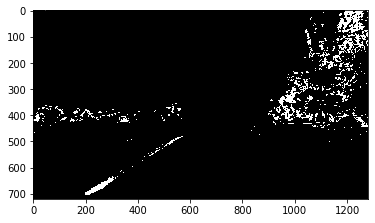

Value Activation output:


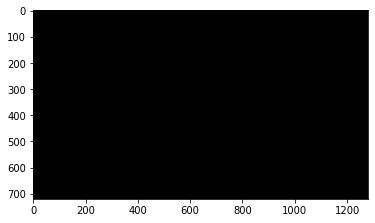

Binary Activation output:


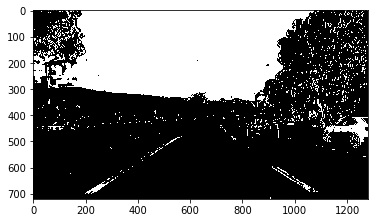

Region select pipe output:


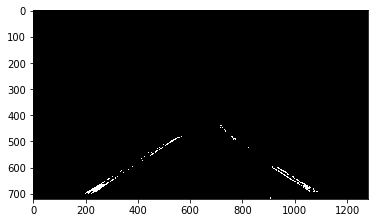

In [36]:
for file in glob.glob('test_images/*Shadow.jpg'):
    image = mpimg.imread(file)
    print("Test Image Original:")
    plt.figure()
    # Display the test images
    plt.imshow(image)
    plt.show()
    
    #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = False)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = True)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = True)

In [37]:
def warpStep(image, M,  debug=False):
    result = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    if debug:
        print("Warp Image output:")
        # Plot the result
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.imshow(image, cmap='gray')
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(result, cmap='gray')
        ax2.set_title('Warped Binary Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
    return result

In [38]:


def find_lane_pixels(binary_warped, left_lane_line, right_lane_line):
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 20
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 400

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    weighted_image = np.transpose(np.multiply(np.transpose(binary_warped),np.arange(binary_warped.shape[0])))

    # Take a histogram of the bottom half of the image
    histogram = np.sum(weighted_image[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx= nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    return out_img


def reinitialize_fit(binary_warped, left_lane_line, right_lane_line, debug = False):
    # Find our lane pixels first
    out_img = find_lane_pixels(binary_warped, left_lane_line, right_lane_line)

    # Fit a second order polynomial to each using `np.polyfit`
    if (left_lane_line.allx.size >3) and (right_lane_line.allx.size>3) and\
        (left_lane_line.ally.size >3) and (right_lane_line.ally.size>3):
        left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2, w=left_lane_line.ally)
        right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2, w=right_lane_line.ally)
    else:
        left_lane_line.current_fit = [0, 0, 0]
        right_lane_line.current_fit = [0, 0, 0]
    
    # Erase previous best fits
    left_lane_line.best_fit = left_lane_line.current_fit
    right_lane_line.best_fit = right_lane_line.current_fit
    
    if debug:
        print("Fit Polynomial output:")
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        try:
            left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
            left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
            right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
            right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    
        left_lane_line.recent_xfitted = left_fitx
        left_lane_line.recent_ploty = ploty
        right_lane_line.recent_xfitted = right_fitx
        right_lane_line.recent_ploty = ploty
        
        ## Visualization ##
        # Colors in the left and right lane regions
        out_img[left_lane_line.ally, left_lane_line.allx] = [255, 0, 0]
        out_img[right_lane_line.ally, right_lane_line.allx] = [0, 0, 255]
        plt.figure()
        plt.imshow(out_img)
        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.show()
    

In [39]:
def fit_poly(img_shape, left_lane_line, right_lane_line): #leftx,lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    if (left_lane_line.allx.size >3) and (right_lane_line.allx.size>3) and\
        (left_lane_line.ally.size >3) and (right_lane_line.ally.size>3):
        left_lane_line.current_fit = np.polyfit(left_lane_line.ally, left_lane_line.allx, 2, w=left_lane_line.ally)
        right_lane_line.current_fit = np.polyfit(right_lane_line.ally, right_lane_line.allx, 2, w=right_lane_line.ally)
    else:
        left_lane_line.current_fit = [0, 0, 0]
        right_lane_line.current_fit = [0, 0, 0]
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_lane_line.current_fit[0]*ploty**2 +\
    left_lane_line.current_fit[1]*ploty + left_lane_line.current_fit[2]
    right_fitx = right_lane_line.current_fit[0]*ploty**2 +\
    right_lane_line.current_fit[1]*ploty + right_lane_line.current_fit[2]
    
    left_lane_line.recent_xfitted = left_fitx
    left_lane_line.recent_ploty = ploty
    right_lane_line.recent_xfitted = right_fitx
    right_lane_line.recent_ploty = ploty
    
    return

def search_around_poly(binary_warped, left_lane_line, right_lane_line, debug = False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Grab the best fit over last n iterations and check for a new lane within the margin
    left_fit = left_lane_line.best_fit
    right_fit = right_lane_line.best_fit
    ### St the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    left_lane_line.allx = nonzerox[left_lane_inds]
    left_lane_line.ally = nonzeroy[left_lane_inds] 
    right_lane_line.allx = nonzerox[right_lane_inds]
    right_lane_line.ally = nonzeroy[right_lane_inds]

    # Fit new polynomials
    fit_poly(binary_warped.shape, left_lane_line, right_lane_line)
    
    ## Visualization ##
       
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    if debug:
        print("Search Lane With Prior Poly output:")
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_lane_line.recent_xfitted+margin, 
                                  left_lane_line.recent_ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_lane_line.recent_xfitted-margin, left_lane_line.recent_ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted+margin, 
                                  right_lane_line.recent_ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
        
        plt.figure()
        plt.imshow(result)
        # Plot the polynomial lines onto the image
        plt.plot(left_lane_line.recent_xfitted, left_lane_line.recent_ploty, color='yellow')
        plt.plot(right_lane_line.recent_xfitted, right_lane_line.recent_ploty, color='yellow')
        plt.show()
        ## End visualization steps ##
    
    return out_img


In [40]:
def measure_curvature_pixels( ploty, left_lane_line, right_lane_line, image_shape, debug = False):
    '''
    Calculates the curvature of polynomial functions in pixels and meters.
    '''
    # Define conversions in x and y from pixels space to meters
    my = 30/720 # meters per pixel in y dimension
    mx = 3.7/650 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)*my
    
    # Calculation of R_curve (radius of curvature)
    lradius = ((1 + (2*left_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                        left_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*left_lane_line.current_fit[0]*(mx/(my**2)))
    rradius = ((1 + (2*right_lane_line.current_fit[0]*y_eval*(mx/(my**2)) + \
                         right_lane_line.current_fit[1]*(mx/my))**2)**1.5) / np.absolute(2*right_lane_line.current_fit[0]*(mx/(my**2)))
    if lradius<50000:
        left_lane_line.set_rad_of_cur(lradius)
    else:
        left_lane_line.set_rad_of_cur(50000)
    if rradius<50000: 
        right_lane_line.set_rad_of_cur(rradius)
    else:
        right_lane_line.set_rad_of_cur(50000)

    #if both lines fitted, calculate distance from lane center
#     if right_curve.radius_of_curvature is not None and left_lane_line.radius_of_curvature is not None:
    #True center of image - represents where the car is
    img_center = image_shape[0] * mx
    #Real world integer value of the lines location
    Lfit_int = left_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        left_lane_line.current_fit[1]*y_eval*(mx/my) + left_lane_line.current_fit[2]*mx
    Rfit_int = right_lane_line.current_fit[0]*(y_eval**2)*(mx/(my**2)) + \
        right_lane_line.current_fit[1]*y_eval*(mx/my) + right_lane_line.current_fit[2]*mx
    
    #Shows where the line center is in the image
    car_position = (Rfit_int + Lfit_int) / 2
    #Determine distance from the center of the frame to the center of the lane
    center_dist = (img_center - car_position)
    
    left_lane_line.line_base_pos = (Lfit_int-img_center)
    right_lane_line.line_base_pos = (Rfit_int-img_center)
    
    if debug:
        print('center: ',center_dist, 'm')
        print(left_lane_line.radius_of_curvature, 'm', right_lane_line.radius_of_curvature, 'm')
        
    return center_dist

In [41]:
def checkFit(left_lane_line, right_lane_line):
    """
    Checks if frames can be skipped by taking last few iterations into account
    """
    if (left_lane_line.radius_of_curvature is None) or (right_lane_line.radius_of_curvature is None) or \
        (left_lane_line.prev_radius_of_curvature is None) or (right_lane_line.prev_radius_of_curvature is None):
        return("Initial iteration: Radius of curvature is none")
    elif ((np.abs(left_lane_line.radius_of_curvature)<2000 or np.abs(right_lane_line.radius_of_curvature)<2000)\
          and(np.abs(left_lane_line.radius_of_curvature - right_lane_line.radius_of_curvature)>5000) or \
        (np.abs(left_lane_line.prev_radius_of_curvature - left_lane_line.radius_of_curvature)>500) or \
        (np.abs(right_lane_line.prev_radius_of_curvature - right_lane_line.radius_of_curvature)>500)):
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: Radius of curvature variation high")
    elif (left_lane_line.line_base_pos>-0.8) or (left_lane_line.line_base_pos<-3):
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: LL base position problem")
    elif (right_lane_line.line_base_pos<0.8) or (right_lane_line.line_base_pos>3): # Checking line base positon here
        left_lane_line.skip_frame()
        right_lane_line.skip_frame()
        return("Skipping: RL base position problem")
    else:
        left_lane_line.accept_fit()
        right_lane_line.accept_fit()
        return("Fit Accepted")

### Process Images

Test Image Original:


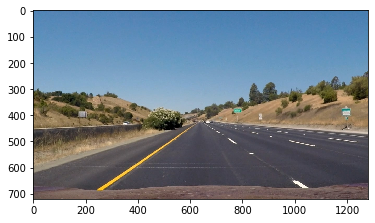

Undistort step output:


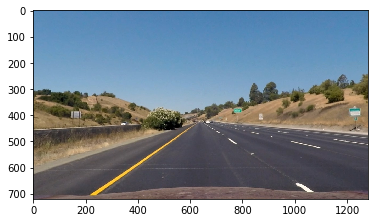

Blue Activation output:


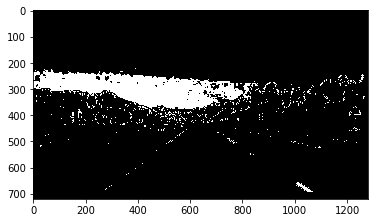

Saturation Activation output:


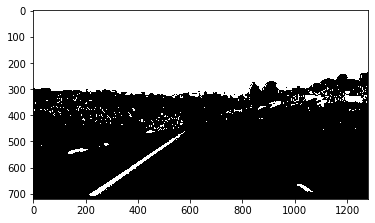

Hue Activation output:


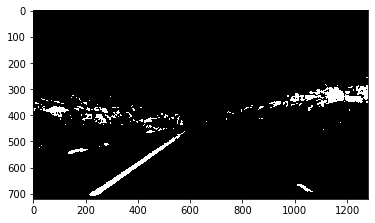

Value Activation output:


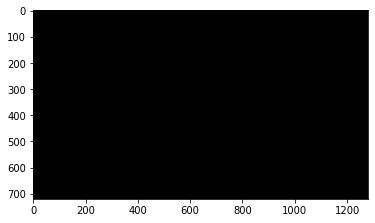

Binary Activation output:


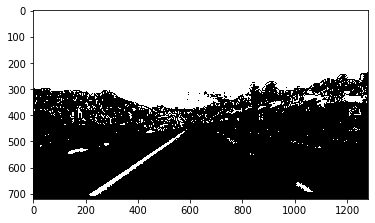

Region select pipe output:


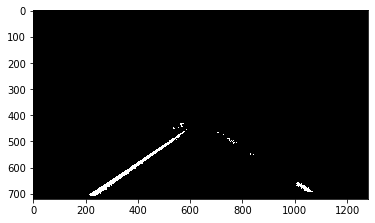

Region select pipe output:


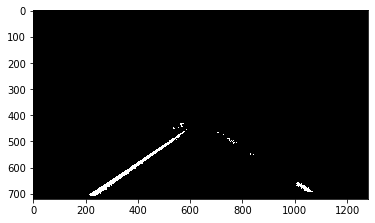

Warp Image output:


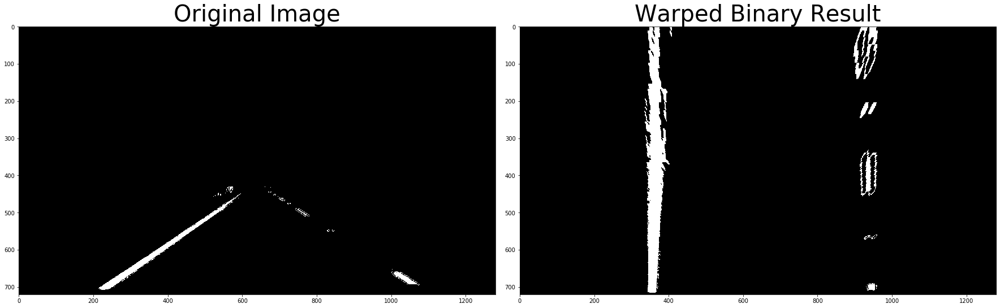

Fit Polynomial output:


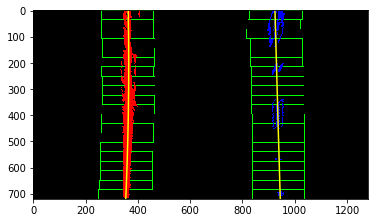

Search Lane With Prior Poly output:


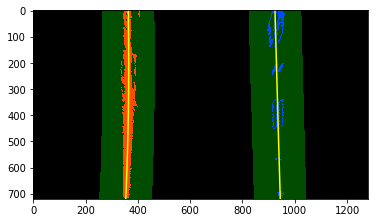

center:  0.40297131175657874 m
3511.9430712595768 m 50000 m


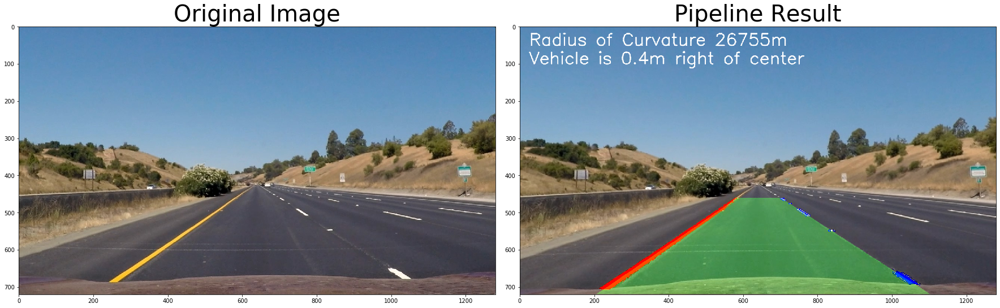

Test Image Original:


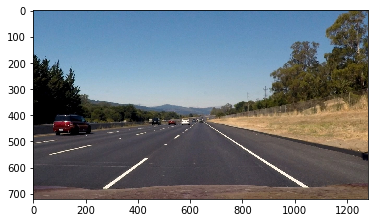

Undistort step output:


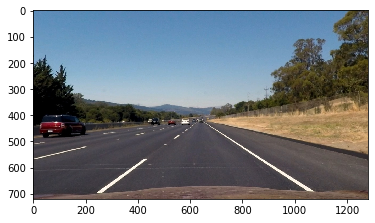

Blue Activation output:


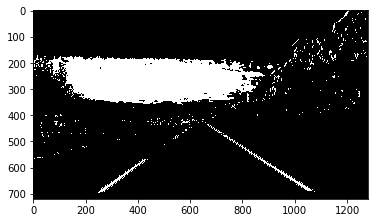

Saturation Activation output:


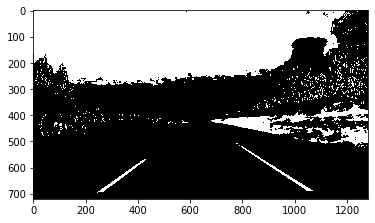

Hue Activation output:


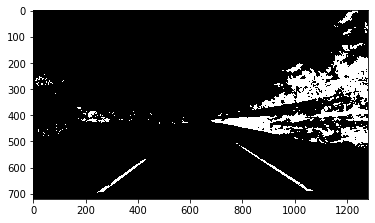

Value Activation output:


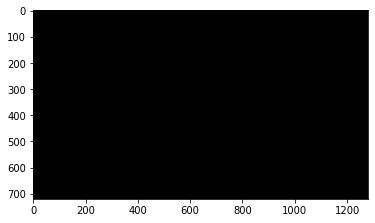

Binary Activation output:


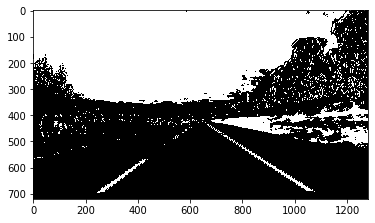

Region select pipe output:


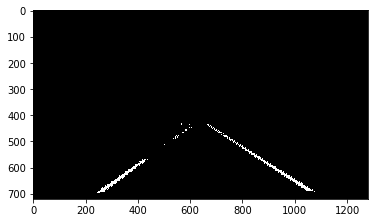

Region select pipe output:


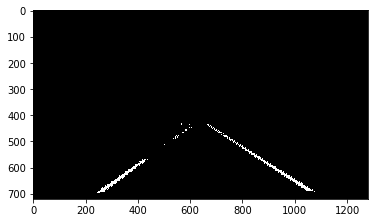

Warp Image output:


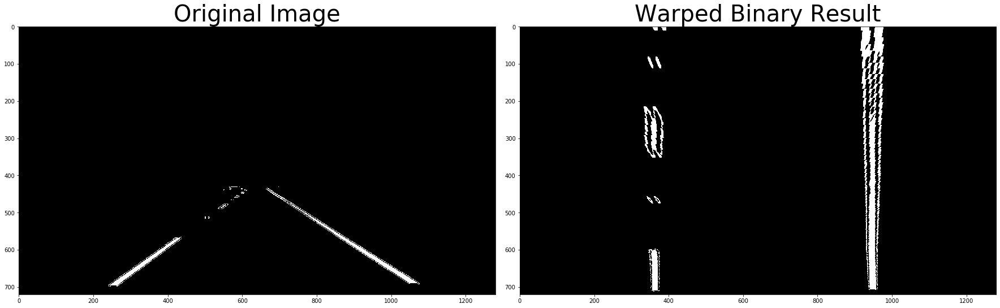

Fit Polynomial output:


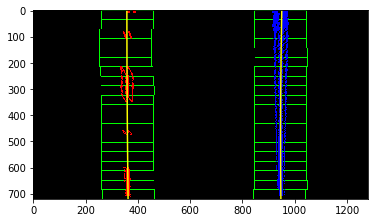

Search Lane With Prior Poly output:


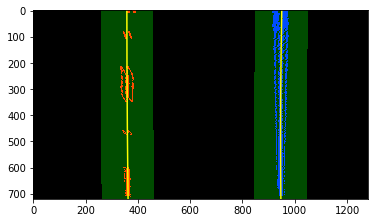

center:  0.3712560529256588 m
18078.99743651254 m 7939.6554669950665 m


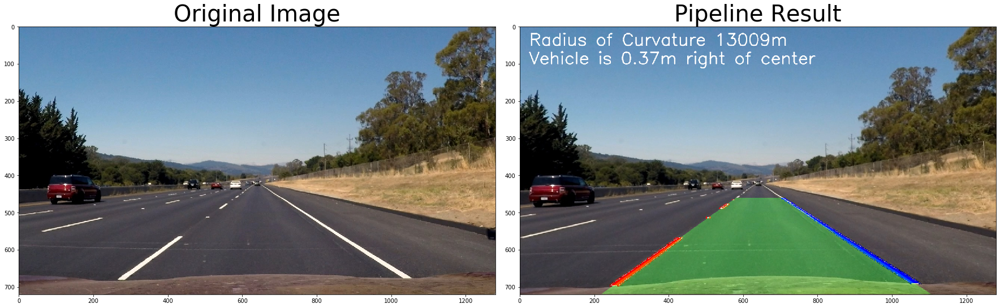

Test Image Original:


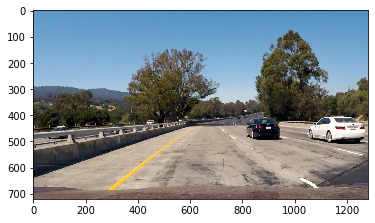

Undistort step output:


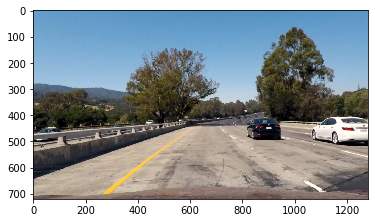

Blue Activation output:


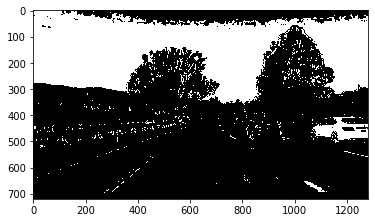

Saturation Activation output:


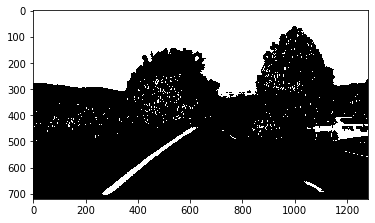

Hue Activation output:


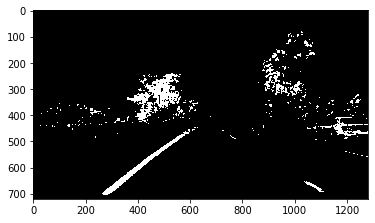

Value Activation output:


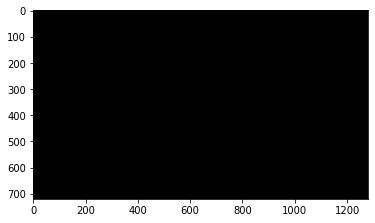

Binary Activation output:


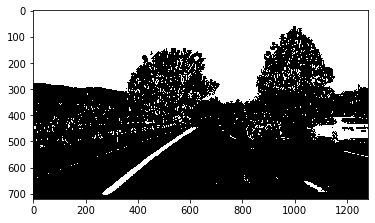

Region select pipe output:


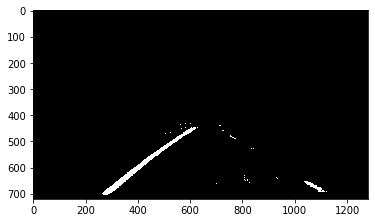

Region select pipe output:


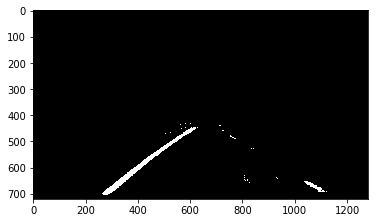

Warp Image output:


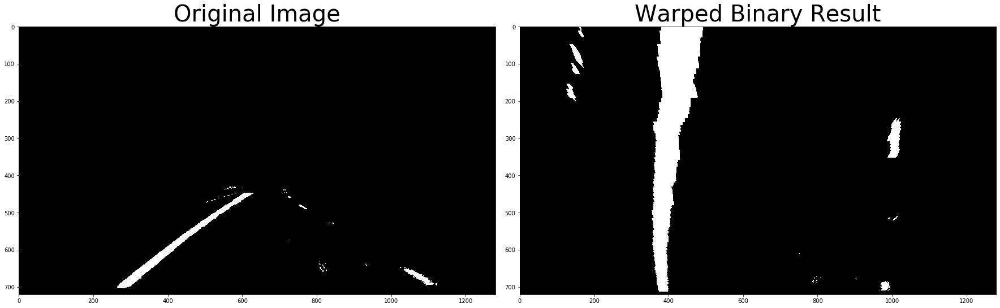

Fit Polynomial output:


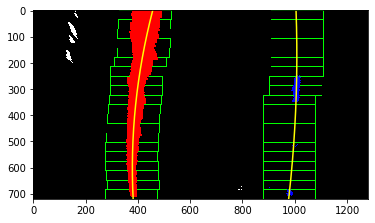

Search Lane With Prior Poly output:


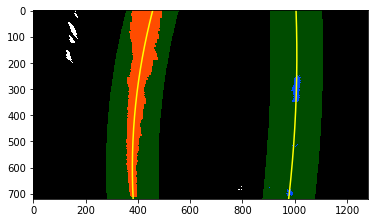

center:  0.23098012831859904 m
711.6431136962141 m 1470.444888431374 m


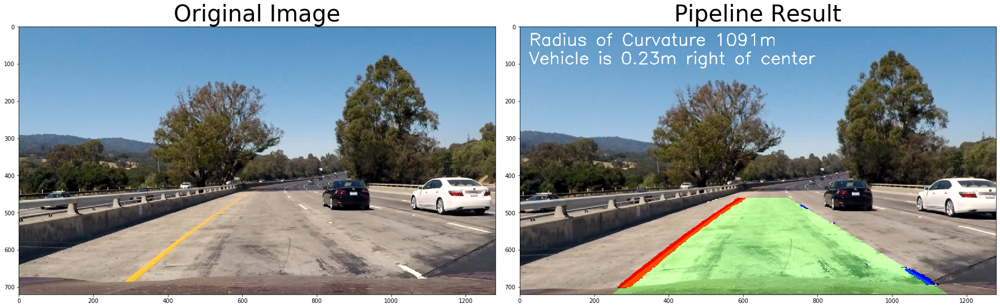

Test Image Original:


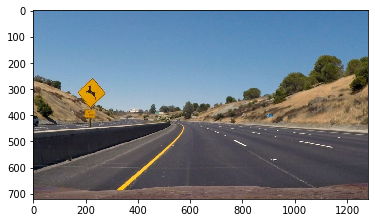

Undistort step output:


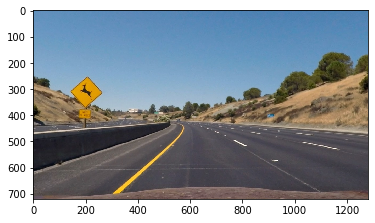

Blue Activation output:


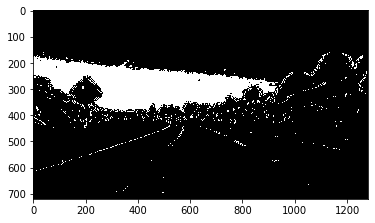

Saturation Activation output:


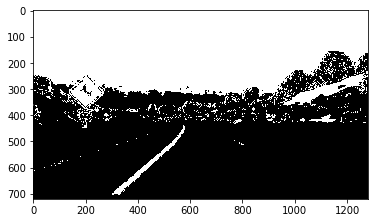

Hue Activation output:


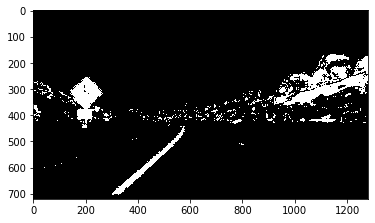

Value Activation output:


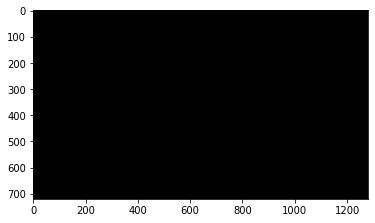

Binary Activation output:


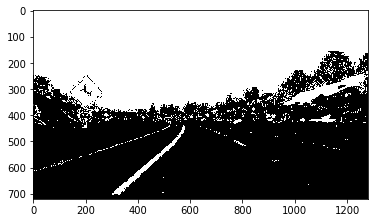

Region select pipe output:


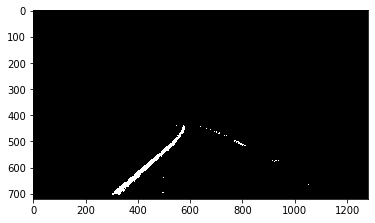

Region select pipe output:


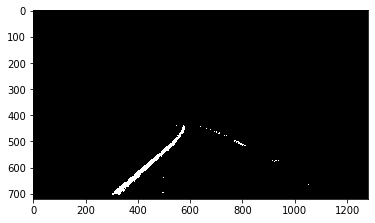

Warp Image output:


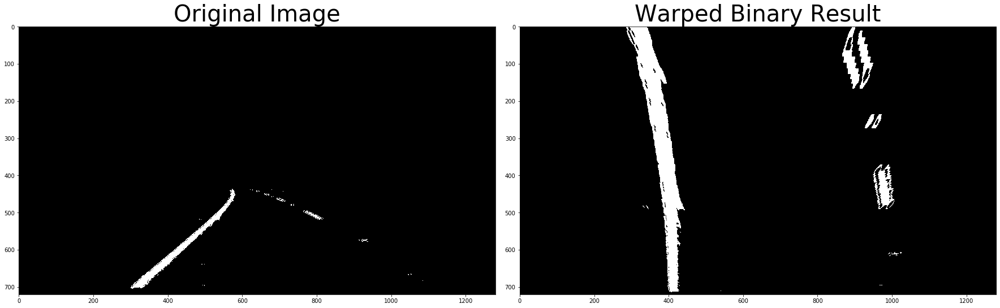

Fit Polynomial output:


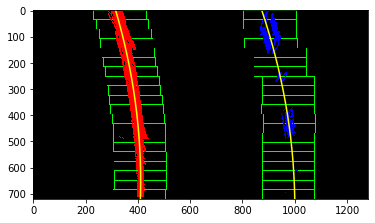

Search Lane With Prior Poly output:


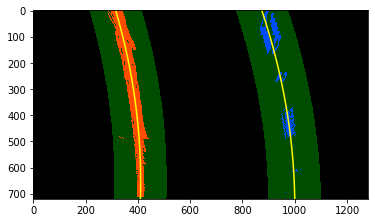

center:  0.0861388723822909 m
679.1970973195591 m 688.2737453902496 m


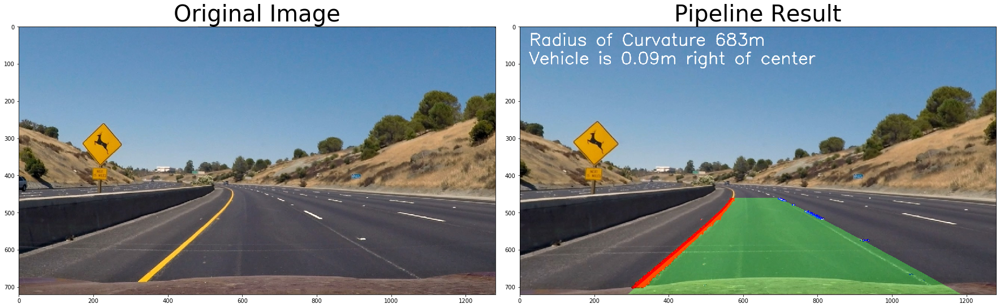

Test Image Original:


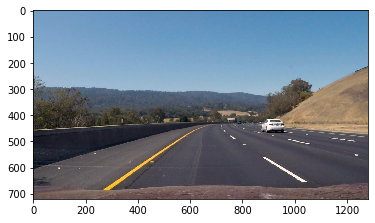

Undistort step output:


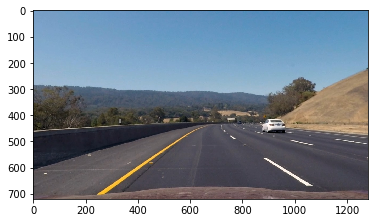

Blue Activation output:


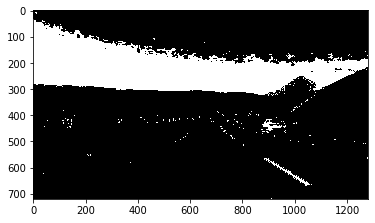

Saturation Activation output:


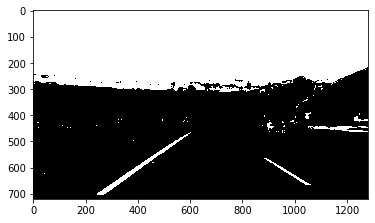

Hue Activation output:


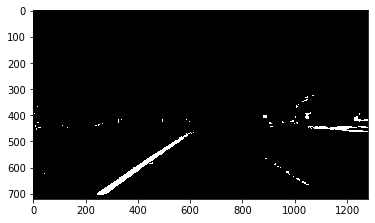

Value Activation output:


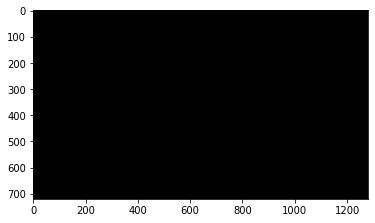

Binary Activation output:


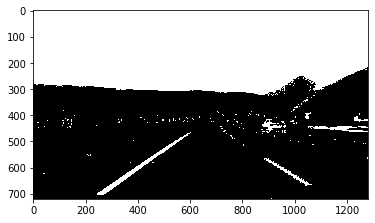

Region select pipe output:


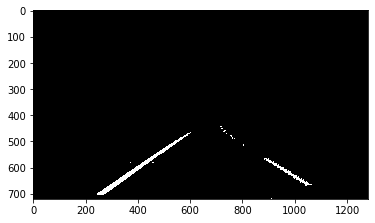

Region select pipe output:


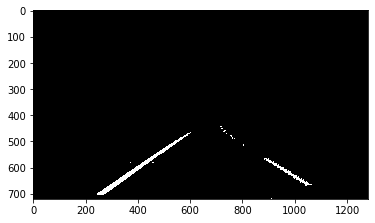

Warp Image output:


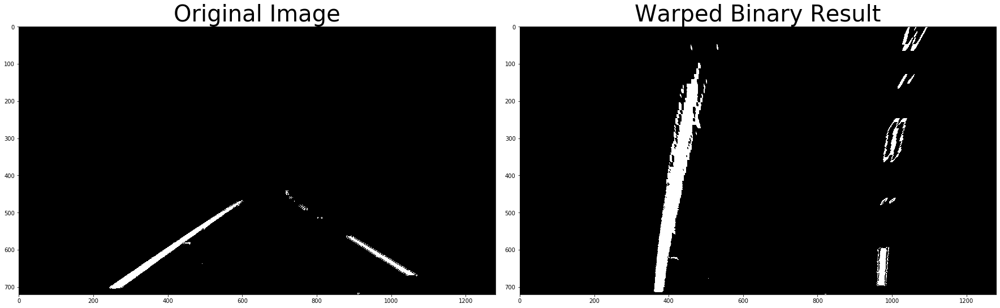

Fit Polynomial output:


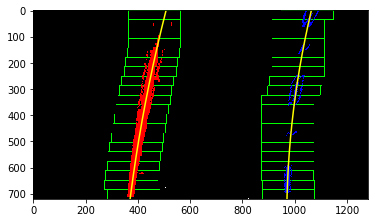

Search Lane With Prior Poly output:


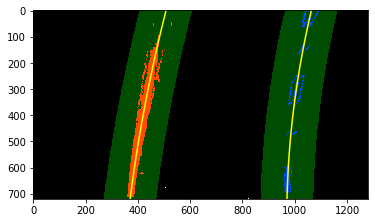

center:  0.2816513285687714 m
1705.113572344585 m 1034.3799465295388 m


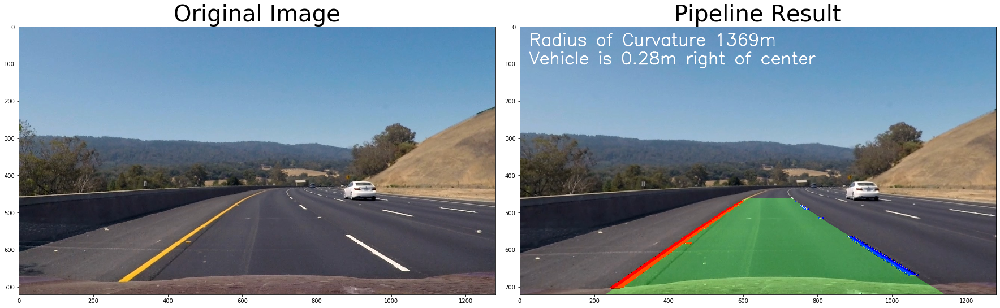

Test Image Original:


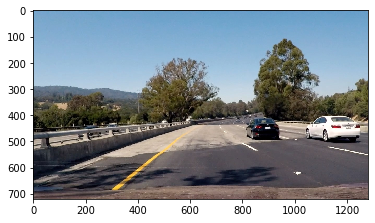

Undistort step output:


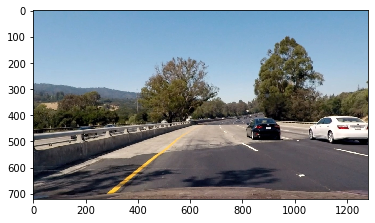

Blue Activation output:


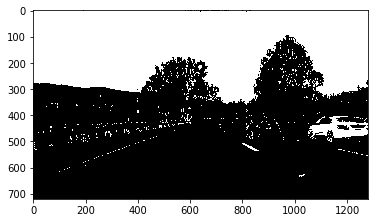

Saturation Activation output:


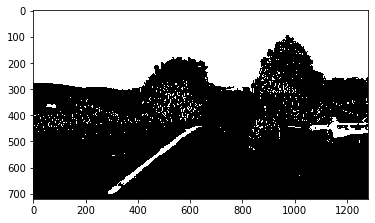

Hue Activation output:


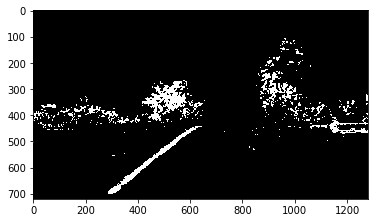

Value Activation output:


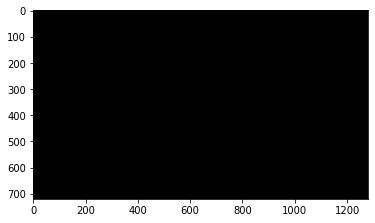

Binary Activation output:


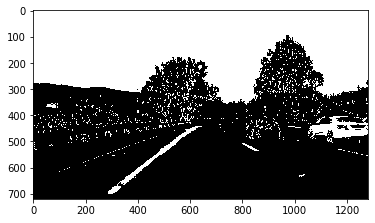

Region select pipe output:


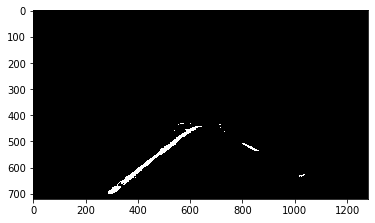

Region select pipe output:


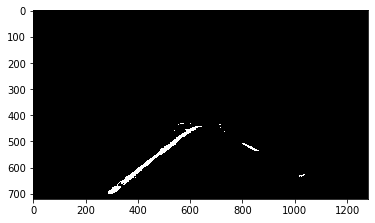

Warp Image output:


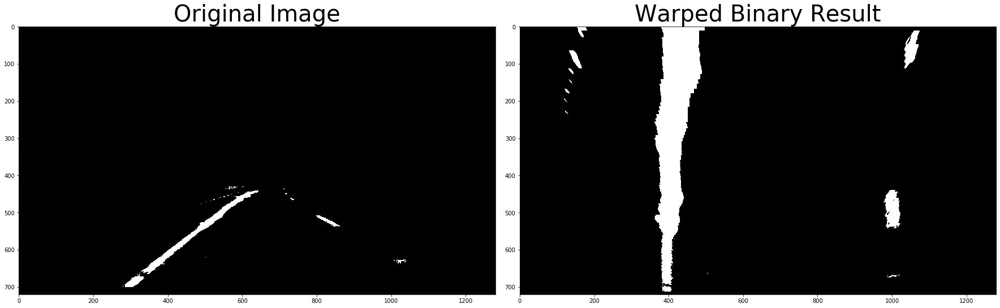

Fit Polynomial output:


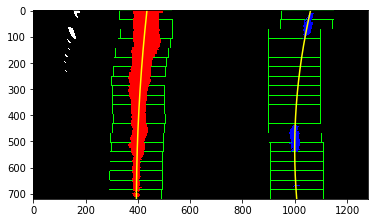

Search Lane With Prior Poly output:


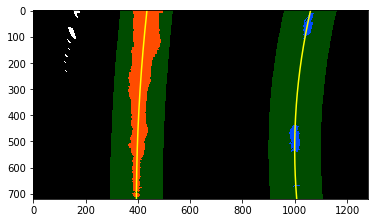

center:  0.10828294039090558 m
2076.8718828107217 m 710.9035359782201 m


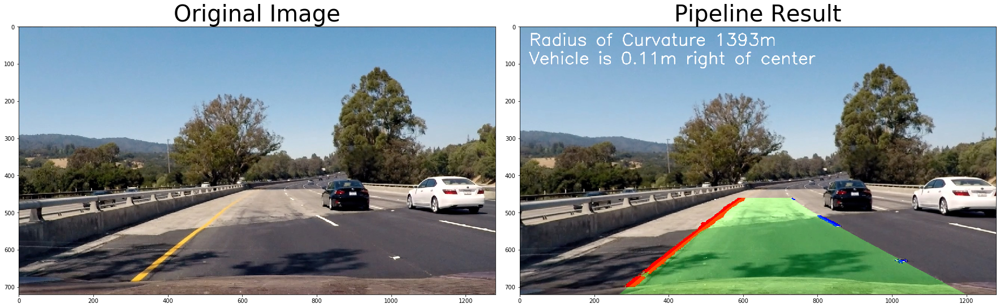

Test Image Original:


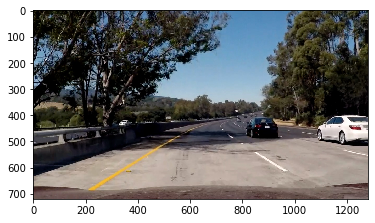

Undistort step output:


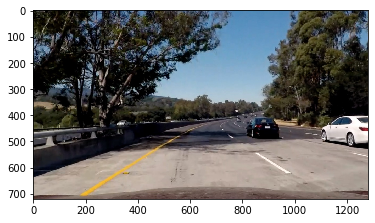

Blue Activation output:


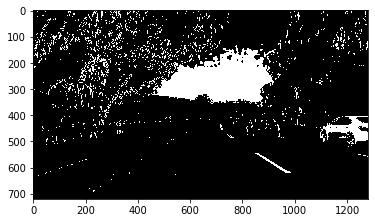

Saturation Activation output:


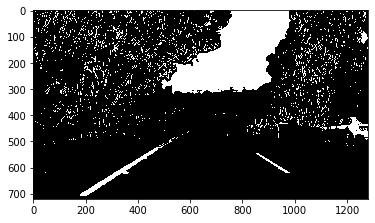

Hue Activation output:


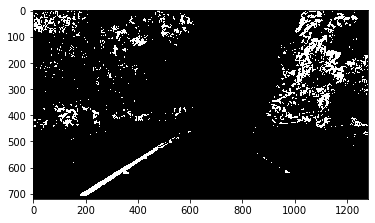

Value Activation output:


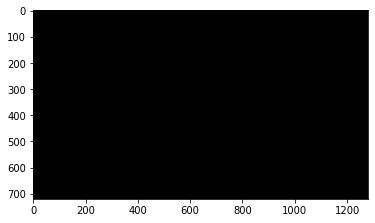

Binary Activation output:


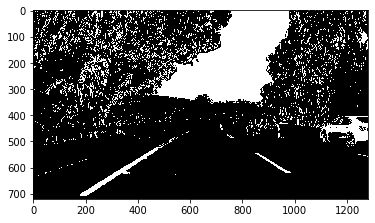

Region select pipe output:


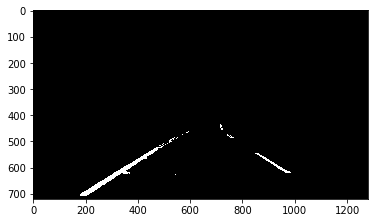

Region select pipe output:


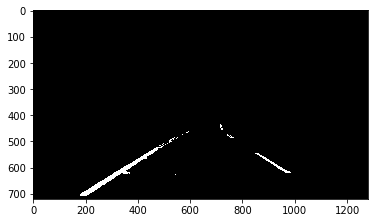

Warp Image output:


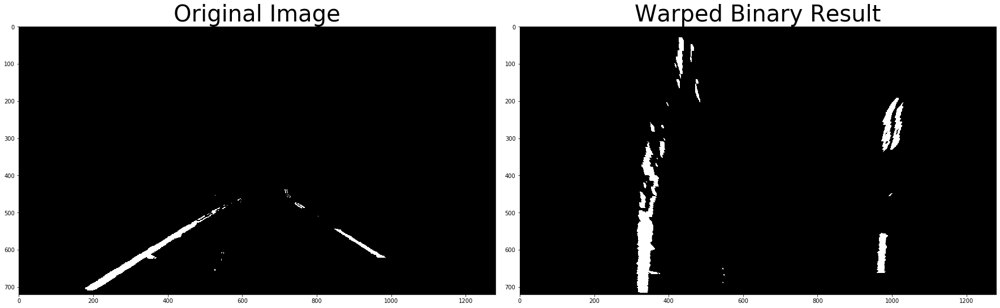

Fit Polynomial output:


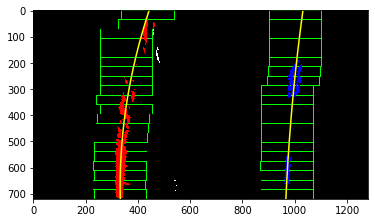

Search Lane With Prior Poly output:


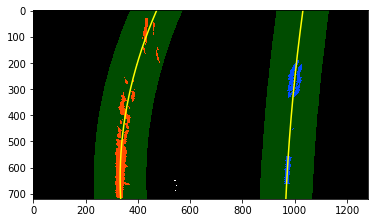

center:  0.3970775441163359 m
451.0114420638436 m 2410.6857390363184 m


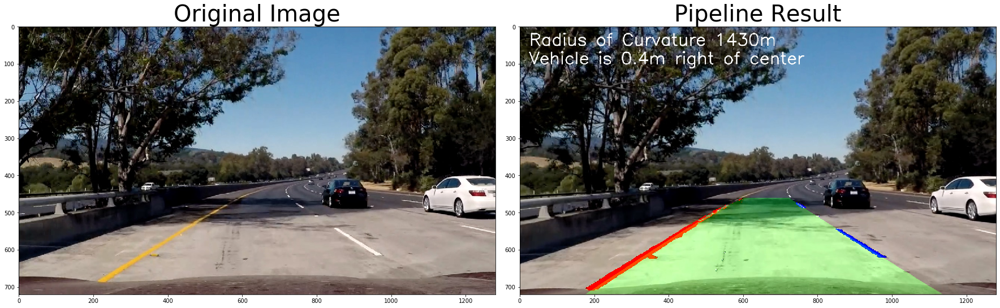

Test Image Original:


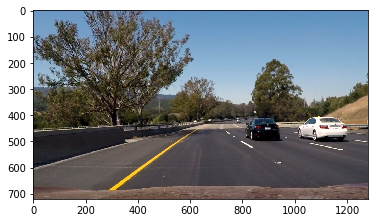

Undistort step output:


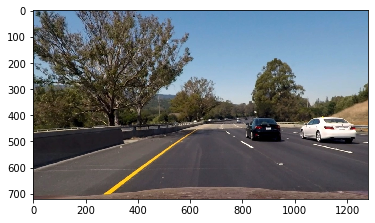

Blue Activation output:


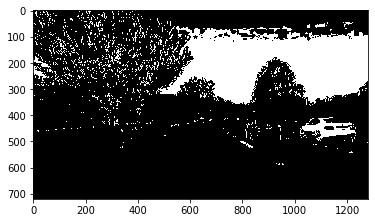

Saturation Activation output:


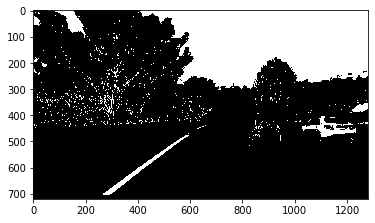

Hue Activation output:


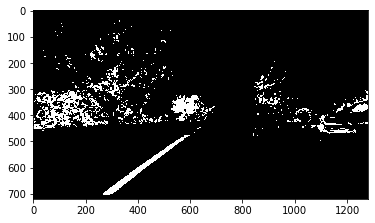

Value Activation output:


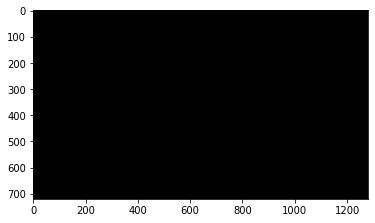

Binary Activation output:


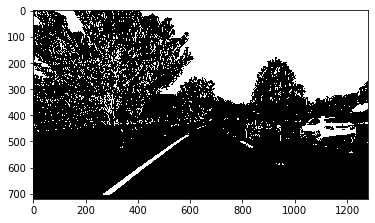

Region select pipe output:


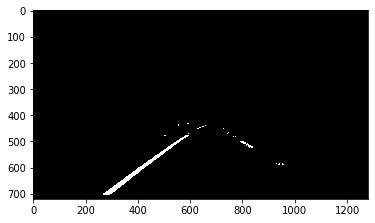

Region select pipe output:


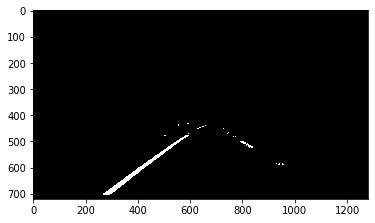

Warp Image output:


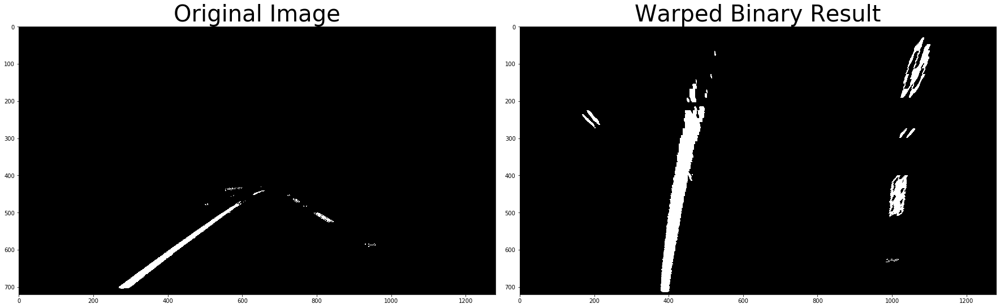

Fit Polynomial output:


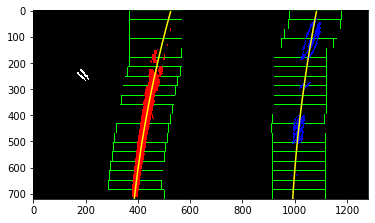

Search Lane With Prior Poly output:


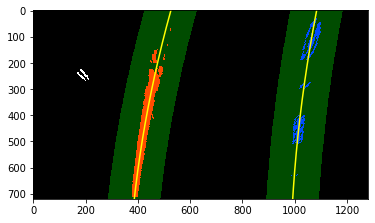

center:  0.17430995188937626 m
1314.7968998136396 m 1658.4039876081838 m


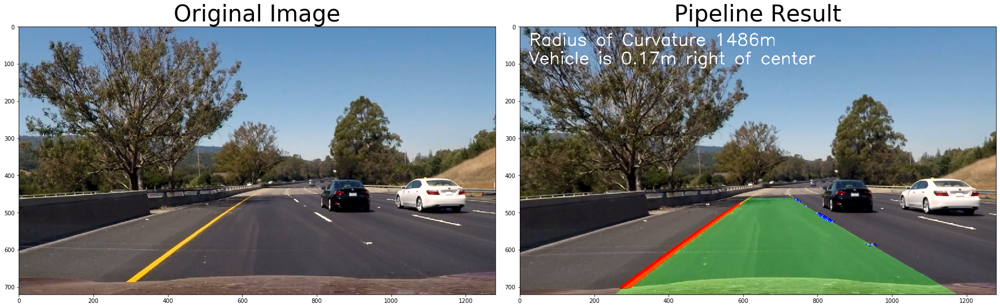

Test Image Original:


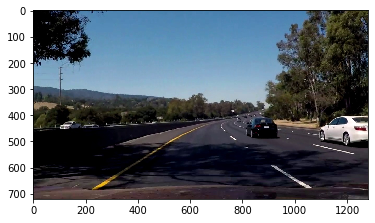

Undistort step output:


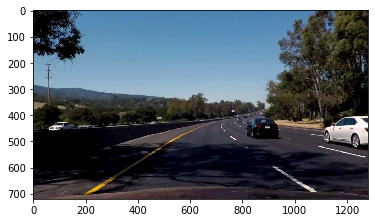

Blue Activation output:


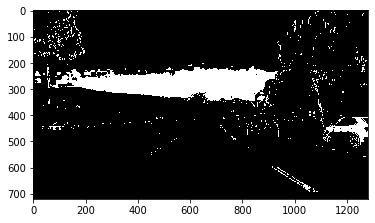

Saturation Activation output:


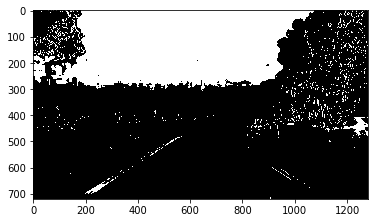

Hue Activation output:


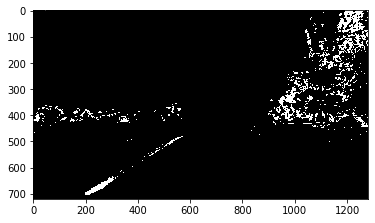

Value Activation output:


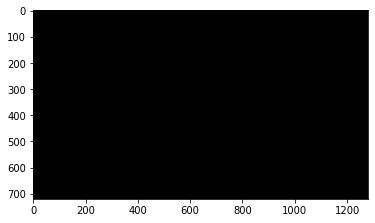

Binary Activation output:


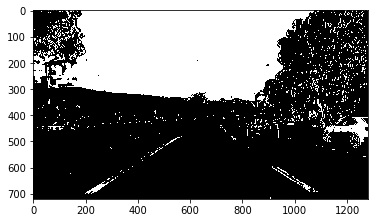

Region select pipe output:


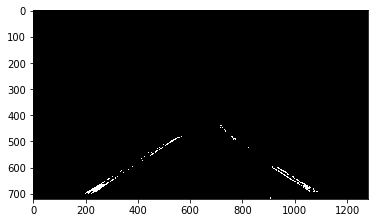

Region select pipe output:


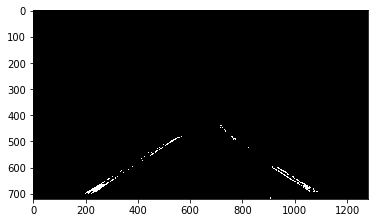

Warp Image output:


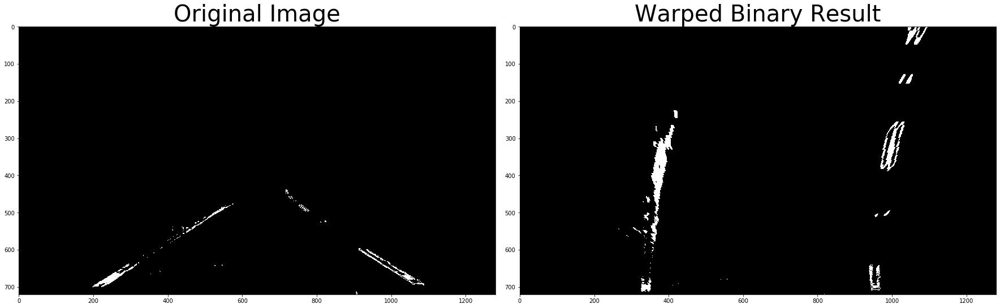

Fit Polynomial output:


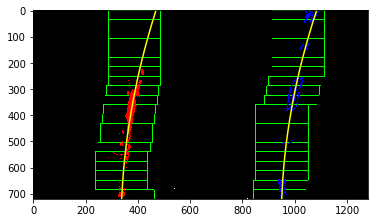

Search Lane With Prior Poly output:


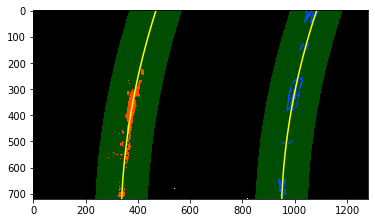

center:  0.4311608329429957 m
803.1663623806363 m 748.5208906228087 m


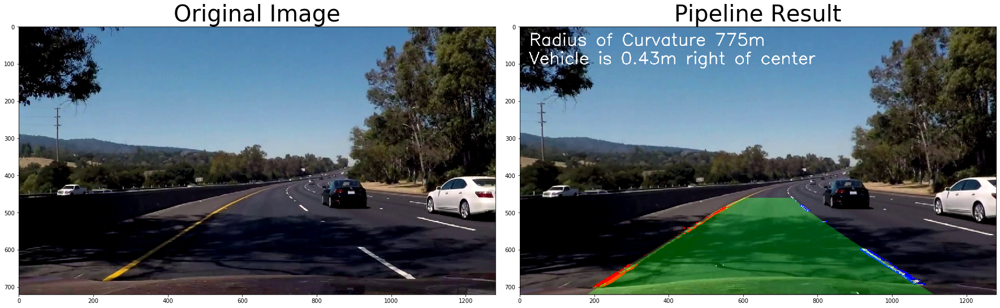

In [42]:
# Read Test Images

DEBUG = True
lane_detected = False
left_lane_line = Line()
right_lane_line = Line()
txt7=""
for file in glob.glob('test_images/*.jpg'):
    image = mpimg.imread(file)
    print("Test Image Original:")
    plt.figure()
    # Display the test images
    plt.imshow(image)
    plt.show()
    
    # Lane lines
    left_lane_line = Line()
    right_lane_line = Line()
    
    #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)
    
    #Negative Region mask images
    masked_image = regionSelStep(masked_image, bottomLeftXOffset = 0.4,bottomRightXOffset = 0.6,
               topLeftXOffset = 0.49, topRightXOffset = 0.51,
               horizon = 0.8, invert = True, debug = DEBUG)
    
    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    
    if right_lane_line.detected and right_lane_line.detected:
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        
        checkFit(left_lane_line, right_lane_line)
        
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
        
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
       
    plt.show()
    
    #Save results in file
    mpimg.imsave(file.replace("test", "output"), result)

In [43]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Routine for image by image analysis of videos

In [44]:
DEBUG = False
# Lane lines
left_lane_line = Line()
right_lane_line = Line()
txt7=""
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    txt7=""
    
       #Undistort the images
    undistort_image = undistortStep(image, mtx, dist, debug = DEBUG)
    
    #Detect Lanes
    binary_image = binaryActivationStep(undistort_image, debug = DEBUG)
    
    #Region mask images
    masked_image = regionSelStep(binary_image, bottomLeftXOffset = 0.08,bottomRightXOffset = 0.94,
               topLeftXOffset = 0.44, topRightXOffset = 0.552,
               horizon = 0.598, debug = DEBUG)
    #Negative Region mask images
    masked_image = regionSelStep(masked_image, bottomLeftXOffset = 0.4,bottomRightXOffset = 0.6,
               topLeftXOffset = 0.49, topRightXOffset = 0.51,
               horizon = 0.8, invert = True, debug = DEBUG)
    
    #Warp Images
    bird_eye_image = warpStep(masked_image, M, debug = DEBUG)
    lane_line_img = np.zeros_like(undistort_image)
    
    if not (right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required()):
        # Search around previous polynomial
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
       
        
    txt5=checkFit(left_lane_line, right_lane_line)
    
    if left_lane_line.detected or right_lane_line.detected:
        # For debugging
        narrow_search_worked = True
    else:
        narrow_search_worked = False
#         lane_line_img = np.zeros_like(undistort_image)
            
    reinitializing = False
    print(str(left_lane_line.radius_of_curvature)+' '+str(right_lane_line.radius_of_curvature))
    if  right_lane_line.reinitialize_required() or left_lane_line.reinitialize_required():
        reinitializing = True
        reinitialize_fit(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        lane_line_img = \
        search_around_poly(bird_eye_image, left_lane_line, right_lane_line, debug = DEBUG)
        center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, undistort_image.shape, debug = DEBUG)
#         left_lane_line.accept_fit()
#         right_lane_line.accept_fit()
        tx7 = checkFit(left_lane_line, right_lane_line)
       
    ## Visualization ##
    # Create a blank warped image
    gray_warp = np.zeros_like(bird_eye_image).astype(np.uint8)
    color_warp = np.dstack((gray_warp, gray_warp, gray_warp))
        
    # Use the left and right lanes to run fillpoly
    pts_left = np.array([np.transpose(np.vstack([left_lane_line.recent_xfitted, left_lane_line.recent_ploty ]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_lane_line.recent_xfitted, right_lane_line.recent_ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Inverse warp the polygon back to image
    lanePoly = warpStep(color_warp, Minv, debug = False)
    lane_line_unwarped_img = warpStep(lane_line_img, Minv, debug = False)

    # Now create a mask of lane lines and create its inverse mask also
    img2gray = cv2.cvtColor(lane_line_unwarped_img,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    # Now black-out the area of lane of in the image
    undistort_image = cv2.bitwise_and(undistort_image,undistort_image,mask = mask_inv)
    # Put the lane lines on the masked image
    undistort_image = cv2.add(undistort_image,lane_line_unwarped_img)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_image, 1, lanePoly, 0.3, 0)
    
    ## End Visualizations ##
    
    center_dist = measure_curvature_pixels( left_lane_line.recent_ploty, left_lane_line,\
                                           right_lane_line, result.shape, debug = DEBUG)
    
    #Print curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    curve = round(int((left_lane_line.radius_of_curvature + right_lane_line.radius_of_curvature) / 2))
    txt = "Radius of Curvature " + str(curve) + "m "
    cv2.putText(result, txt, (25,50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
    #Print vehicle center distance on image
    center_dist = round(center_dist, 2)
    if center_dist < 0:
        txt2 = "Vehicle is " + str(center_dist) + "m left of center"
    elif center_dist > 0:
        txt2 = "Vehicle is " + str(center_dist) + "m right of center"
    else:
        txt2 = "Distance from Center: " + str(center_dist) + "m"
    cv2.putText(result, txt2, (25,100), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    
   
    #Debug Messages
    
#     if narrow_search_worked:
#         txt3 = "LL: Narrow Search Worked"
#     elif reinitializing:
#         txt3 = "LL: Reinitializing fit"
#     else:
#         txt3 = "LL: Skipping frame"
#     txt3 = txt3 + str(left_lane_line.radius_of_curvature)
#     cv2.putText(result, txt3, (25,150), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)
    
#     if narrow_search_worked:
#         txt4 = "RL: Narrow Search Worked"
#     elif reinitializing:
#         txt4 = "RL: Reinitializing fit"
#     else:
#         txt4 = "RL: Skipping frame"
#     txt4 = txt4 + str(right_lane_line.radius_of_curvature)
#     cv2.putText(result, txt4, (25,175), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
#     cv2.putText(result, txt5, (25,200), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)

#     # Sixth line
#     txt6 = "RL line base:"+str(round(right_lane_line.line_base_pos,2))+\
#             "LL line base:"+str(round(left_lane_line.line_base_pos,2))
#     cv2.putText(result, txt6, (25,225), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
    
#     # Seventh Line
#     txt7 = "Reinit:" + txt7
#     cv2.putText(result, txt7, (25,250), font, 0.5, (255, 255, 255), 2, cv2.LINE_AA)   
    
    #END of Debug Messages
    
    return result

    

In [45]:
# clip1.reader.close()
# clip1.audio.reader.close_proc()
project_output_video = 'output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("project_video.mp4")
#     clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(project_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

None None
Moviepy - Building video output_images/project_video.mp4.
Moviepy - Writing video output_images/project_video.mp4



t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

975.8936414778576 1112.6922685636707


t:   0%|                                                                    | 2/1260 [00:00<02:42,  7.73it/s, now=None]

796.8556804193149 1018.4131149935231


t:   0%|▏                                                                   | 3/1260 [00:00<03:36,  5.80it/s, now=None]

672.8319204882173 1156.7351162349512


t:   0%|▏                                                                   | 4/1260 [00:00<04:12,  4.98it/s, now=None]

592.6744308391001 1120.5645779378115


t:   0%|▎                                                                   | 5/1260 [00:01<04:39,  4.49it/s, now=None]

640.6991730438906 911.1661473963792


t:   0%|▎                                                                   | 6/1260 [00:01<04:56,  4.23it/s, now=None]

610.0384663666383 812.879158878176


t:   1%|▍                                                                   | 7/1260 [00:01<05:06,  4.09it/s, now=None]

640.9692682641877 767.9619595687061


t:   1%|▍                                                                   | 8/1260 [00:01<05:14,  3.98it/s, now=None]

643.9032785836837 841.2635370108102


t:   1%|▍                                                                   | 9/1260 [00:02<05:20,  3.90it/s, now=None]

661.7612390807913 885.7821843246805


t:   1%|▌                                                                  | 10/1260 [00:02<05:28,  3.80it/s, now=None]

702.7460756498338 854.0292218605451


t:   1%|▌                                                                  | 11/1260 [00:02<05:32,  3.76it/s, now=None]

718.8754056959367 1041.4478388817256


t:   1%|▋                                                                  | 12/1260 [00:02<05:31,  3.76it/s, now=None]

764.3552283662766 966.7508344916879


t:   1%|▋                                                                  | 13/1260 [00:03<05:33,  3.74it/s, now=None]

761.6034346724973 1445.392139082785


t:   1%|▋                                                                  | 14/1260 [00:03<05:34,  3.72it/s, now=None]

782.4943321139842 3263.2651273654624


t:   1%|▊                                                                  | 15/1260 [00:03<05:36,  3.70it/s, now=None]

728.9666407118631 2580.4401285662316


t:   1%|▊                                                                  | 16/1260 [00:04<05:35,  3.71it/s, now=None]

688.6392888189131 1532.8640353351745


t:   1%|▉                                                                  | 17/1260 [00:04<05:34,  3.72it/s, now=None]

710.3781884477478 1341.9254641796108


t:   1%|▉                                                                  | 18/1260 [00:04<05:32,  3.74it/s, now=None]

793.0986634367896 1219.5782428730988


t:   2%|█                                                                  | 19/1260 [00:04<05:32,  3.73it/s, now=None]

838.3606948870433 1173.225359081896


t:   2%|█                                                                  | 20/1260 [00:05<05:32,  3.73it/s, now=None]

1004.7561116860431 1137.8769887500569


t:   2%|█                                                                  | 21/1260 [00:05<05:32,  3.73it/s, now=None]

1307.3273697345514 709.6212573031082


t:   2%|█▏                                                                 | 22/1260 [00:05<05:30,  3.74it/s, now=None]

1741.012590456882 727.0905182613304


t:   2%|█▏                                                                 | 23/1260 [00:05<05:31,  3.73it/s, now=None]

2628.6431055769167 820.2708948758201


t:   2%|█▎                                                                 | 24/1260 [00:06<05:30,  3.74it/s, now=None]

2384.070985312236 831.770558733538


t:   2%|█▎                                                                 | 25/1260 [00:06<05:29,  3.75it/s, now=None]

1709.6746058408276 869.7483559770342


t:   2%|█▍                                                                 | 26/1260 [00:06<05:30,  3.74it/s, now=None]

1709.5831448763352 894.6975126021842


t:   2%|█▍                                                                 | 27/1260 [00:06<05:30,  3.74it/s, now=None]

1578.7247051641052 948.1217589267627


t:   2%|█▍                                                                 | 28/1260 [00:07<05:28,  3.75it/s, now=None]

1502.538437644008 1103.158000413639


t:   2%|█▌                                                                 | 29/1260 [00:07<05:29,  3.74it/s, now=None]

1136.233902159344 1154.9321510384927


t:   2%|█▌                                                                 | 30/1260 [00:07<05:31,  3.71it/s, now=None]

914.6929243444097 1164.7116848602773


t:   2%|█▋                                                                 | 31/1260 [00:08<05:27,  3.75it/s, now=None]

870.3721070541994 1036.3231518967211


t:   3%|█▋                                                                 | 32/1260 [00:08<05:28,  3.74it/s, now=None]

784.915070816338 742.2118457832642


t:   3%|█▊                                                                 | 33/1260 [00:08<05:25,  3.77it/s, now=None]

823.9310737825892 716.6885420240465


t:   3%|█▊                                                                 | 34/1260 [00:08<05:23,  3.79it/s, now=None]

764.9765108506652 673.4447701970101


t:   3%|█▊                                                                 | 35/1260 [00:09<05:23,  3.79it/s, now=None]

747.6719393520767 764.6727321011299


t:   3%|█▉                                                                 | 36/1260 [00:09<05:26,  3.75it/s, now=None]

725.0006740229823 753.5717289981704


t:   3%|█▉                                                                 | 37/1260 [00:09<05:24,  3.77it/s, now=None]

714.8480548337453 731.6091868475104


t:   3%|██                                                                 | 38/1260 [00:09<05:21,  3.81it/s, now=None]

666.8285276550533 705.1312016503757


t:   3%|██                                                                 | 39/1260 [00:10<05:21,  3.79it/s, now=None]

641.2683338360987 813.7148884631735


t:   3%|██▏                                                                | 40/1260 [00:10<05:20,  3.81it/s, now=None]

613.5627411234675 888.0265356983105


t:   3%|██▏                                                                | 41/1260 [00:10<05:22,  3.78it/s, now=None]

573.130330717794 994.6515582066987


t:   3%|██▏                                                                | 42/1260 [00:10<05:20,  3.80it/s, now=None]

557.5069270177761 954.6858369466488


t:   3%|██▎                                                                | 43/1260 [00:11<05:21,  3.78it/s, now=None]

566.8884780492359 911.4896733875227


t:   3%|██▎                                                                | 44/1260 [00:11<05:22,  3.77it/s, now=None]

557.9206249514431 810.6420653646225


t:   4%|██▍                                                                | 45/1260 [00:11<05:33,  3.65it/s, now=None]

570.2575446780155 748.3646561852249


t:   4%|██▍                                                                | 46/1260 [00:12<05:32,  3.65it/s, now=None]

560.8737446575975 624.434790507764


t:   4%|██▍                                                                | 47/1260 [00:12<05:27,  3.70it/s, now=None]

568.8566030696406 667.6525851926305


t:   4%|██▌                                                                | 48/1260 [00:12<05:26,  3.72it/s, now=None]

575.4454036375987 652.5969596112423


t:   4%|██▌                                                                | 49/1260 [00:12<05:26,  3.70it/s, now=None]

619.6509396756564 659.7229940317278


t:   4%|██▋                                                                | 50/1260 [00:13<05:30,  3.66it/s, now=None]

654.1317380018638 683.5994516354458


t:   4%|██▋                                                                | 51/1260 [00:13<05:26,  3.70it/s, now=None]

697.7698436805993 722.7702731335463


t:   4%|██▊                                                                | 52/1260 [00:13<05:25,  3.71it/s, now=None]

696.4798100865326 752.5636054587136


t:   4%|██▊                                                                | 53/1260 [00:13<05:24,  3.72it/s, now=None]

689.1625951683852 853.8278362371188


t:   4%|██▊                                                                | 54/1260 [00:14<05:24,  3.72it/s, now=None]

705.7252095200308 929.3904689641735


t:   4%|██▉                                                                | 55/1260 [00:14<05:23,  3.72it/s, now=None]

771.2893037976683 903.6106505471043


t:   4%|██▉                                                                | 56/1260 [00:14<05:22,  3.73it/s, now=None]

831.8878350019846 807.7316412471376


t:   5%|███                                                                | 57/1260 [00:15<05:21,  3.74it/s, now=None]

900.6388426185216 724.609299048975


t:   5%|███                                                                | 58/1260 [00:15<05:31,  3.63it/s, now=None]

1065.170402576439 691.6080524642806


t:   5%|███▏                                                               | 59/1260 [00:15<05:26,  3.68it/s, now=None]

1183.9074637956933 637.1562031547874


t:   5%|███▏                                                               | 60/1260 [00:15<05:21,  3.73it/s, now=None]

1356.9054010267128 613.2389039047976


t:   5%|███▏                                                               | 61/1260 [00:16<05:19,  3.75it/s, now=None]

1396.832152780392 702.93501264562


t:   5%|███▎                                                               | 62/1260 [00:16<05:17,  3.77it/s, now=None]

1396.2968000354194 768.1887811290942


t:   5%|███▎                                                               | 63/1260 [00:16<05:17,  3.77it/s, now=None]

1387.4191927445247 947.8753782947133


t:   5%|███▍                                                               | 64/1260 [00:16<05:15,  3.79it/s, now=None]

1260.7128704539236 896.5572495399123


t:   5%|███▍                                                               | 65/1260 [00:17<05:16,  3.78it/s, now=None]

1061.5944041083344 1252.3084135179404


t:   5%|███▌                                                               | 66/1260 [00:17<05:17,  3.76it/s, now=None]

897.9723799313003 1012.2695692450967


t:   5%|███▌                                                               | 67/1260 [00:17<05:16,  3.77it/s, now=None]

804.2004428093047 953.4571440602234


t:   5%|███▌                                                               | 68/1260 [00:17<05:17,  3.76it/s, now=None]

807.6995325439715 969.5466046670559


t:   5%|███▋                                                               | 69/1260 [00:18<05:17,  3.75it/s, now=None]

732.8821957712645 1039.3666029048907


t:   6%|███▋                                                               | 70/1260 [00:18<05:14,  3.79it/s, now=None]

680.5529993970849 1092.9237095141618


t:   6%|███▊                                                               | 71/1260 [00:18<05:13,  3.79it/s, now=None]

709.3496988388858 958.8022561613809


t:   6%|███▊                                                               | 72/1260 [00:18<05:15,  3.77it/s, now=None]

702.327446127235 1053.2993588193287


t:   6%|███▉                                                               | 73/1260 [00:19<05:13,  3.78it/s, now=None]

735.9870893103091 1048.157067032865


t:   6%|███▉                                                               | 74/1260 [00:19<05:12,  3.79it/s, now=None]

814.0074161215559 1082.6885040866925


t:   6%|███▉                                                               | 75/1260 [00:19<05:10,  3.81it/s, now=None]

925.4618760697704 1117.196520809542


t:   6%|████                                                               | 76/1260 [00:20<05:09,  3.82it/s, now=None]

1070.1823651784543 734.7309212390767


t:   6%|████                                                               | 77/1260 [00:20<05:13,  3.77it/s, now=None]

1326.2163743164356 874.6891711438495


t:   6%|████▏                                                              | 78/1260 [00:20<05:12,  3.78it/s, now=None]

1460.5353435377692 1070.540780921122


t:   6%|████▏                                                              | 79/1260 [00:20<05:15,  3.75it/s, now=None]

1928.6736893207515 1233.9427243743355


t:   6%|████▎                                                              | 80/1260 [00:21<05:12,  3.78it/s, now=None]

1994.1639035666387 1244.1289494828331


t:   6%|████▎                                                              | 81/1260 [00:21<05:14,  3.75it/s, now=None]

3187.987436349343 854.4337857969276


t:   7%|████▎                                                              | 82/1260 [00:21<05:11,  3.78it/s, now=None]

3265.660958959895 813.602755557516


t:   7%|████▍                                                              | 83/1260 [00:21<05:10,  3.79it/s, now=None]

3590.261208239524 779.4016697123465


t:   7%|████▍                                                              | 84/1260 [00:22<05:12,  3.77it/s, now=None]

6039.773008037904 668.961110171663


t:   7%|████▌                                                              | 85/1260 [00:22<05:15,  3.73it/s, now=None]

5563.371743148578 688.2089574383622


t:   7%|████▌                                                              | 86/1260 [00:22<05:31,  3.54it/s, now=None]

3315.0602559856375 743.948622818141


t:   7%|████▋                                                              | 87/1260 [00:23<05:24,  3.62it/s, now=None]

2285.52862627508 770.4871309794045


t:   7%|████▋                                                              | 88/1260 [00:23<05:20,  3.66it/s, now=None]

1578.2979963346943 856.9542280977422


t:   7%|████▋                                                              | 89/1260 [00:23<05:21,  3.65it/s, now=None]

1247.4171487009444 1242.1352484109145


t:   7%|████▊                                                              | 90/1260 [00:23<05:19,  3.66it/s, now=None]

966.5075409600109 1079.2497989126132


t:   7%|████▊                                                              | 91/1260 [00:24<05:30,  3.54it/s, now=None]

950.9856979716039 1251.6869673121869


t:   7%|████▉                                                              | 92/1260 [00:24<05:29,  3.55it/s, now=None]

892.3562281673453 1069.4233695068367


t:   7%|████▉                                                              | 93/1260 [00:24<05:23,  3.61it/s, now=None]

896.4030778238528 1061.930504702473


t:   7%|████▉                                                              | 94/1260 [00:24<05:19,  3.65it/s, now=None]

823.7568123555213 916.5440782380215


t:   8%|█████                                                              | 95/1260 [00:25<05:18,  3.66it/s, now=None]

788.0609423147328 921.4245680983703


t:   8%|█████                                                              | 96/1260 [00:25<05:15,  3.69it/s, now=None]

735.0971744889758 679.941382432496


t:   8%|█████▏                                                             | 97/1260 [00:25<05:12,  3.73it/s, now=None]

731.4260755540657 804.3287765763727


t:   8%|█████▏                                                             | 98/1260 [00:26<05:10,  3.75it/s, now=None]

801.1175851147955 818.6438874436235


t:   8%|█████▎                                                             | 99/1260 [00:26<05:12,  3.71it/s, now=None]

798.0065850629562 894.1419113458182


t:   8%|█████▏                                                            | 100/1260 [00:26<05:10,  3.74it/s, now=None]

834.7263895099745 895.840763424827


t:   8%|█████▎                                                            | 101/1260 [00:26<05:09,  3.75it/s, now=None]

800.5540437190458 792.6875543586368


t:   8%|█████▎                                                            | 102/1260 [00:27<05:06,  3.77it/s, now=None]

818.3015882683382 703.1074362509039


t:   8%|█████▍                                                            | 103/1260 [00:27<05:07,  3.76it/s, now=None]

815.6365898813228 874.273269521476


t:   8%|█████▍                                                            | 104/1260 [00:27<05:08,  3.75it/s, now=None]

838.0954802505199 944.2608239908072


t:   8%|█████▌                                                            | 105/1260 [00:27<05:08,  3.75it/s, now=None]

836.0891618015933 1003.5600318682916


t:   8%|█████▌                                                            | 106/1260 [00:28<05:06,  3.76it/s, now=None]

924.1362828067673 1031.7516770389504


t:   8%|█████▌                                                            | 107/1260 [00:28<05:09,  3.73it/s, now=None]

925.1022726537925 920.4986603075198


t:   9%|█████▋                                                            | 108/1260 [00:28<05:10,  3.71it/s, now=None]

909.3250848412873 774.5954370498415


t:   9%|█████▋                                                            | 109/1260 [00:28<05:06,  3.75it/s, now=None]

883.2747005220086 725.4171511155314


t:   9%|█████▊                                                            | 110/1260 [00:29<05:08,  3.73it/s, now=None]

967.8036391545438 692.1930660092969


t:   9%|█████▊                                                            | 111/1260 [00:29<05:09,  3.72it/s, now=None]

919.5707164980985 802.9325861591516


t:   9%|█████▊                                                            | 112/1260 [00:29<05:07,  3.73it/s, now=None]

877.4890183283956 866.7676706541414


t:   9%|█████▉                                                            | 113/1260 [00:30<05:06,  3.74it/s, now=None]

859.3211100092644 837.4542603550151


t:   9%|█████▉                                                            | 114/1260 [00:30<05:06,  3.74it/s, now=None]

837.0939959370561 915.2953850353468


t:   9%|██████                                                            | 115/1260 [00:30<05:05,  3.75it/s, now=None]

765.1311078395568 1111.221650049671


t:   9%|██████                                                            | 116/1260 [00:30<05:03,  3.77it/s, now=None]

714.0605321888705 1110.4156109181713


t:   9%|██████▏                                                           | 117/1260 [00:31<05:06,  3.73it/s, now=None]

676.9531250400831 981.0272646332753


t:   9%|██████▏                                                           | 118/1260 [00:31<05:06,  3.72it/s, now=None]

721.5801090935613 794.4878985674459


t:   9%|██████▏                                                           | 119/1260 [00:31<05:03,  3.76it/s, now=None]

718.6971027884875 639.7711003850713


t:  10%|██████▎                                                           | 120/1260 [00:31<05:02,  3.77it/s, now=None]

671.3230316851129 593.6736341874927


t:  10%|██████▎                                                           | 121/1260 [00:32<05:02,  3.76it/s, now=None]

689.3745816779892 569.4627438170902


t:  10%|██████▍                                                           | 122/1260 [00:32<05:03,  3.75it/s, now=None]

679.724697225177 465.8241303264954


t:  10%|██████▍                                                           | 123/1260 [00:32<05:03,  3.75it/s, now=None]

678.3999396658676 540.0003404435485


t:  10%|██████▍                                                           | 124/1260 [00:32<05:01,  3.76it/s, now=None]

687.0688771985041 529.3435974490071


t:  10%|██████▌                                                           | 125/1260 [00:33<05:00,  3.77it/s, now=None]

680.8725377113218 532.419435424985


t:  10%|██████▌                                                           | 126/1260 [00:33<05:01,  3.76it/s, now=None]

706.6966506350982 532.5280872139637


t:  10%|██████▋                                                           | 127/1260 [00:33<04:58,  3.79it/s, now=None]

673.4200740721512 585.4342430443979


t:  10%|██████▋                                                           | 128/1260 [00:34<04:59,  3.78it/s, now=None]

671.613009925877 645.1192536530767


t:  10%|██████▊                                                           | 129/1260 [00:34<04:59,  3.77it/s, now=None]

621.2403097732467 739.5148544798752


t:  10%|██████▊                                                           | 130/1260 [00:34<05:02,  3.74it/s, now=None]

621.7924510149462 670.5037746542132


t:  10%|██████▊                                                           | 131/1260 [00:34<05:01,  3.74it/s, now=None]

638.6022360484682 675.7438410354162


t:  10%|██████▉                                                           | 132/1260 [00:35<04:59,  3.77it/s, now=None]

636.153484720108 641.2408488957612


t:  11%|██████▉                                                           | 133/1260 [00:35<04:58,  3.78it/s, now=None]

657.4238187984889 646.175537709775


t:  11%|███████                                                           | 134/1260 [00:35<04:58,  3.78it/s, now=None]

683.275141471796 587.5455492441259


t:  11%|███████                                                           | 135/1260 [00:35<05:01,  3.74it/s, now=None]

734.8599532745002 626.7768008222645


t:  11%|███████                                                           | 136/1260 [00:36<04:58,  3.76it/s, now=None]

766.5124167044418 651.6532951106261


t:  11%|███████▏                                                          | 137/1260 [00:36<04:58,  3.76it/s, now=None]

788.1684658043856 681.6379768387849


t:  11%|███████▏                                                          | 138/1260 [00:36<04:58,  3.76it/s, now=None]

822.189303884708 733.0615057382817


t:  11%|███████▎                                                          | 139/1260 [00:36<05:00,  3.73it/s, now=None]

844.9063302248107 850.1320076175036


t:  11%|███████▎                                                          | 140/1260 [00:37<04:59,  3.74it/s, now=None]

878.0431758141277 828.4880995976166


t:  11%|███████▍                                                          | 141/1260 [00:37<04:56,  3.77it/s, now=None]

888.0920555962869 989.1173558652725


t:  11%|███████▍                                                          | 142/1260 [00:37<05:00,  3.73it/s, now=None]

873.3252292555151 918.4790304952963


t:  11%|███████▍                                                          | 143/1260 [00:38<04:59,  3.73it/s, now=None]

884.8589608717783 969.7979160612738


t:  11%|███████▌                                                          | 144/1260 [00:38<04:57,  3.75it/s, now=None]

880.6207913576445 1011.3782415036513


t:  12%|███████▌                                                          | 145/1260 [00:38<04:55,  3.77it/s, now=None]

877.3992262279603 1044.4519968717414


t:  12%|███████▋                                                          | 146/1260 [00:38<04:54,  3.78it/s, now=None]

849.6599114624457 972.4030744264369


t:  12%|███████▋                                                          | 147/1260 [00:39<04:54,  3.77it/s, now=None]

848.9706136568104 1185.6471462501493


t:  12%|███████▊                                                          | 148/1260 [00:39<04:56,  3.75it/s, now=None]

839.8482111799514 1345.2125274297478


t:  12%|███████▊                                                          | 149/1260 [00:39<04:55,  3.76it/s, now=None]

866.5874906222149 1126.0608348845744


t:  12%|███████▊                                                          | 150/1260 [00:39<04:57,  3.73it/s, now=None]

953.7798221136082 1118.2460819982655


t:  12%|███████▉                                                          | 151/1260 [00:40<04:55,  3.76it/s, now=None]

1079.9812530772406 1068.2579283913476


t:  12%|███████▉                                                          | 152/1260 [00:40<04:51,  3.80it/s, now=None]

1135.0454250680466 1373.881579214982


t:  12%|████████                                                          | 153/1260 [00:40<04:50,  3.81it/s, now=None]

1116.805759686862 1161.7378510443543


t:  12%|████████                                                          | 154/1260 [00:40<04:51,  3.79it/s, now=None]

1189.1111344797519 1293.5719955223874


t:  12%|████████                                                          | 155/1260 [00:41<05:02,  3.66it/s, now=None]

1229.3202334228708 1162.382225095637


t:  12%|████████▏                                                         | 156/1260 [00:41<05:04,  3.62it/s, now=None]

1274.4358283859278 909.1517199723038


t:  12%|████████▏                                                         | 157/1260 [00:41<05:20,  3.44it/s, now=None]

1245.2593825005486 739.4430284771279


t:  13%|████████▎                                                         | 158/1260 [00:42<05:11,  3.54it/s, now=None]

1096.9591583835145 639.3923826266548


t:  13%|████████▎                                                         | 159/1260 [00:42<05:06,  3.60it/s, now=None]

1039.8084002157034 658.4350701548376


t:  13%|████████▍                                                         | 160/1260 [00:42<05:05,  3.60it/s, now=None]

937.5332166387196 756.7851159765431


t:  13%|████████▍                                                         | 161/1260 [00:42<05:02,  3.64it/s, now=None]

890.7339423313841 812.0308781093895


t:  13%|████████▍                                                         | 162/1260 [00:43<05:09,  3.55it/s, now=None]

856.3637812482712 858.8245186803177


t:  13%|████████▌                                                         | 163/1260 [00:43<05:07,  3.57it/s, now=None]

855.7081803980643 853.5132632356751


t:  13%|████████▌                                                         | 164/1260 [00:43<05:01,  3.64it/s, now=None]

827.0495645191097 1541.7861471328433


t:  13%|████████▋                                                         | 165/1260 [00:43<04:55,  3.70it/s, now=None]

806.9809129164317 1479.5689457366257


t:  13%|████████▋                                                         | 166/1260 [00:44<04:54,  3.72it/s, now=None]

800.9073684581103 1814.6354738179803


t:  13%|████████▋                                                         | 167/1260 [00:44<04:51,  3.76it/s, now=None]

705.2777179588925 1452.6210757730412


t:  13%|████████▊                                                         | 168/1260 [00:44<04:51,  3.75it/s, now=None]

802.6710441997255 1674.2076226387298


t:  13%|████████▊                                                         | 169/1260 [00:45<05:04,  3.58it/s, now=None]

808.0066816530206 2064.502028957033


t:  13%|████████▉                                                         | 170/1260 [00:45<05:02,  3.61it/s, now=None]

809.6211159432465 2085.4803139528185


t:  14%|████████▉                                                         | 171/1260 [00:45<04:57,  3.67it/s, now=None]

818.145507011821 998.3854101051182


t:  14%|█████████                                                         | 172/1260 [00:45<04:51,  3.73it/s, now=None]

840.9754517185253 680.2828987942929


t:  14%|█████████                                                         | 173/1260 [00:46<04:50,  3.74it/s, now=None]

868.8076652373185 627.1619868634888


t:  14%|█████████                                                         | 174/1260 [00:46<04:50,  3.74it/s, now=None]

936.4189713911893 677.4189509400301


t:  14%|█████████▏                                                        | 175/1260 [00:46<04:48,  3.76it/s, now=None]

1014.9137848107691 632.2197204597344


t:  14%|█████████▏                                                        | 176/1260 [00:46<05:00,  3.61it/s, now=None]

1034.628087937042 460.95560696163943


t:  14%|█████████▎                                                        | 177/1260 [00:47<04:55,  3.66it/s, now=None]

1142.3151339326625 482.90731376915153


t:  14%|█████████▎                                                        | 178/1260 [00:47<04:52,  3.70it/s, now=None]

1326.7047259814283 499.2075183729158


t:  14%|█████████▍                                                        | 179/1260 [00:47<04:52,  3.70it/s, now=None]

1358.4827345003305 548.2398383561493


t:  14%|█████████▍                                                        | 180/1260 [00:48<04:48,  3.74it/s, now=None]

1572.0205966526826 575.8374471556527


t:  14%|█████████▍                                                        | 181/1260 [00:48<04:48,  3.74it/s, now=None]

1294.676797241382 476.04368096454897


t:  14%|█████████▌                                                        | 182/1260 [00:48<04:46,  3.76it/s, now=None]

1315.8709036486787 508.0667741018569


t:  15%|█████████▌                                                        | 183/1260 [00:48<04:45,  3.77it/s, now=None]

1100.9564007002118 468.0921089978583


t:  15%|█████████▋                                                        | 184/1260 [00:49<04:42,  3.81it/s, now=None]

945.3739779359871 422.34222645002615


t:  15%|█████████▋                                                        | 185/1260 [00:49<04:43,  3.80it/s, now=None]

801.8482277741274 400.7981514711395


t:  15%|█████████▋                                                        | 186/1260 [00:49<04:43,  3.79it/s, now=None]

624.2807446759816 416.61135866559096


t:  15%|█████████▊                                                        | 187/1260 [00:49<04:42,  3.80it/s, now=None]

571.8852961957073 443.52388820136315


t:  15%|█████████▊                                                        | 188/1260 [00:50<04:49,  3.70it/s, now=None]

525.8876710804533 474.2443680120891


t:  15%|█████████▉                                                        | 189/1260 [00:50<04:46,  3.74it/s, now=None]

495.50384575196455 529.7132766653557


t:  15%|█████████▉                                                        | 190/1260 [00:50<04:45,  3.74it/s, now=None]

485.875650625279 600.4842279948022


t:  15%|██████████                                                        | 191/1260 [00:50<04:45,  3.75it/s, now=None]

490.32145013689285 574.9431431616005


t:  15%|██████████                                                        | 192/1260 [00:51<04:45,  3.74it/s, now=None]

519.9376866163356 626.2806334570876


t:  15%|██████████                                                        | 193/1260 [00:51<04:44,  3.76it/s, now=None]

536.1388748352974 634.1961919783203


t:  15%|██████████▏                                                       | 194/1260 [00:51<04:43,  3.76it/s, now=None]

564.8996710167628 610.3084514432511


t:  15%|██████████▏                                                       | 195/1260 [00:52<04:41,  3.78it/s, now=None]

603.9025156810306 605.8806247813388


t:  16%|██████████▎                                                       | 196/1260 [00:52<04:38,  3.82it/s, now=None]

685.8777325813912 524.4808134805148


t:  16%|██████████▎                                                       | 197/1260 [00:52<04:41,  3.77it/s, now=None]

737.9109933454001 661.4216183206197


t:  16%|██████████▎                                                       | 198/1260 [00:52<04:39,  3.80it/s, now=None]

777.1140342482082 770.8509052847551


t:  16%|██████████▍                                                       | 199/1260 [00:53<04:40,  3.78it/s, now=None]

829.8225319203543 795.1323749200617


t:  16%|██████████▍                                                       | 200/1260 [00:53<04:40,  3.79it/s, now=None]

837.171084794507 789.7108608624363


t:  16%|██████████▌                                                       | 201/1260 [00:53<04:42,  3.75it/s, now=None]

836.3630678137889 910.0191168936097


t:  16%|██████████▌                                                       | 202/1260 [00:53<04:42,  3.75it/s, now=None]

850.5966885315199 1069.589180914835


t:  16%|██████████▋                                                       | 203/1260 [00:54<04:39,  3.78it/s, now=None]

849.4022629594319 1000.5331795684576


t:  16%|██████████▋                                                       | 204/1260 [00:54<04:39,  3.78it/s, now=None]

771.991481753894 1000.2564568607207


t:  16%|██████████▋                                                       | 205/1260 [00:54<04:38,  3.78it/s, now=None]

869.9218711917334 822.2354552440976


t:  16%|██████████▊                                                       | 206/1260 [00:54<04:41,  3.75it/s, now=None]

872.916888735524 729.597435231311


t:  16%|██████████▊                                                       | 207/1260 [00:55<04:39,  3.76it/s, now=None]

836.6805488089848 705.2031609985556


t:  17%|██████████▉                                                       | 208/1260 [00:55<04:38,  3.77it/s, now=None]

796.9453688295497 560.0203253932559


t:  17%|██████████▉                                                       | 209/1260 [00:55<04:37,  3.79it/s, now=None]

845.1508014414858 604.9793087890405


t:  17%|███████████                                                       | 210/1260 [00:55<04:36,  3.80it/s, now=None]

890.8994174983611 607.2815405248668


t:  17%|███████████                                                       | 211/1260 [00:56<04:37,  3.78it/s, now=None]

928.6046135848695 616.329453066841


t:  17%|███████████                                                       | 212/1260 [00:56<04:36,  3.79it/s, now=None]

867.9569530882641 635.4857869156821


t:  17%|███████████▏                                                      | 213/1260 [00:56<04:43,  3.70it/s, now=None]

854.2109375884421 643.6361422312038


t:  17%|███████████▏                                                      | 214/1260 [00:57<04:41,  3.71it/s, now=None]

775.2155513285362 745.194065377094


t:  17%|███████████▎                                                      | 215/1260 [00:57<04:40,  3.72it/s, now=None]

717.698015240779 695.9587132536024


t:  17%|███████████▎                                                      | 216/1260 [00:57<04:37,  3.76it/s, now=None]

653.6767942735008 831.1495424951775


t:  17%|███████████▎                                                      | 217/1260 [00:57<04:36,  3.77it/s, now=None]

639.0608387489862 735.9040833967272


t:  17%|███████████▍                                                      | 218/1260 [00:58<04:36,  3.76it/s, now=None]

641.0038920993741 719.895643467312


t:  17%|███████████▍                                                      | 219/1260 [00:58<04:35,  3.78it/s, now=None]

613.4308297681342 730.3130839155065


t:  17%|███████████▌                                                      | 220/1260 [00:58<04:38,  3.74it/s, now=None]

664.9987651053397 829.7379072565076


t:  18%|███████████▌                                                      | 221/1260 [00:58<04:35,  3.77it/s, now=None]

711.5708208689475 956.1477276586119


t:  18%|███████████▋                                                      | 222/1260 [00:59<04:36,  3.75it/s, now=None]

751.9776547089026 1181.5744012550538


t:  18%|███████████▋                                                      | 223/1260 [00:59<04:35,  3.77it/s, now=None]

796.2186651052895 1031.2914439419153


t:  18%|███████████▋                                                      | 224/1260 [00:59<04:35,  3.77it/s, now=None]

809.4420218551141 1110.5000978203493


t:  18%|███████████▊                                                      | 225/1260 [00:59<04:34,  3.77it/s, now=None]

852.5508136988202 2250.6699071413404


t:  18%|███████████▊                                                      | 226/1260 [01:00<04:33,  3.78it/s, now=None]

828.695089655682 1967.3612186524467


t:  18%|███████████▉                                                      | 227/1260 [01:00<04:33,  3.77it/s, now=None]

833.3881964997041 2006.1100315994124


t:  18%|███████████▉                                                      | 228/1260 [01:00<04:33,  3.78it/s, now=None]

875.003882802485 1982.490735433498


t:  18%|███████████▉                                                      | 229/1260 [01:01<04:31,  3.80it/s, now=None]

838.5402195281091 1751.0165355431732


t:  18%|████████████                                                      | 230/1260 [01:01<04:45,  3.61it/s, now=None]

891.7225892153003 1622.9264997959904


t:  18%|████████████                                                      | 231/1260 [01:01<04:41,  3.65it/s, now=None]

909.686738748002 1197.9450398758086


t:  18%|████████████▏                                                     | 232/1260 [01:01<04:38,  3.69it/s, now=None]

965.5275440962038 1051.0989219705373


t:  18%|████████████▏                                                     | 233/1260 [01:02<04:41,  3.65it/s, now=None]

1051.2508719020461 796.7125473135719


t:  19%|████████████▎                                                     | 234/1260 [01:02<04:39,  3.67it/s, now=None]

1101.5813472281247 812.0692732046614


t:  19%|████████████▎                                                     | 235/1260 [01:02<04:36,  3.71it/s, now=None]

1197.9724144289787 769.9001012725795


t:  19%|████████████▎                                                     | 236/1260 [01:02<04:34,  3.74it/s, now=None]

1131.811997534099 725.6434017572802


t:  19%|████████████▍                                                     | 237/1260 [01:03<04:33,  3.74it/s, now=None]

1183.41917765648 620.7815262717102


t:  19%|████████████▍                                                     | 238/1260 [01:03<04:34,  3.72it/s, now=None]

1172.4588101328911 611.9448741987173


t:  19%|████████████▌                                                     | 239/1260 [01:03<04:35,  3.70it/s, now=None]

1240.3620686480656 699.8383146898693


t:  19%|████████████▌                                                     | 240/1260 [01:04<04:33,  3.73it/s, now=None]

1223.747283333272 666.3952574548156


t:  19%|████████████▌                                                     | 241/1260 [01:04<04:31,  3.75it/s, now=None]

1161.204156566642 716.8852164172895


t:  19%|████████████▋                                                     | 242/1260 [01:04<04:32,  3.73it/s, now=None]

1274.5685847318362 742.1044525688362


t:  19%|████████████▋                                                     | 243/1260 [01:04<04:29,  3.77it/s, now=None]

1113.1882808027385 613.293601319154


t:  19%|████████████▊                                                     | 244/1260 [01:05<04:30,  3.76it/s, now=None]

1136.3655680051825 580.8188322093787


t:  19%|████████████▊                                                     | 245/1260 [01:05<04:29,  3.77it/s, now=None]

1070.921419372352 550.2560186597475


t:  20%|████████████▉                                                     | 246/1260 [01:05<04:31,  3.73it/s, now=None]

941.1058641109875 575.3770228377698


t:  20%|████████████▉                                                     | 247/1260 [01:05<04:30,  3.75it/s, now=None]

929.2761996321333 594.6977473094277


t:  20%|████████████▉                                                     | 248/1260 [01:06<04:28,  3.76it/s, now=None]

923.5871369517242 581.3105887613884


t:  20%|█████████████                                                     | 249/1260 [01:06<04:27,  3.78it/s, now=None]

911.7930217341353 454.5932582760819


t:  20%|█████████████                                                     | 250/1260 [01:06<04:28,  3.76it/s, now=None]

862.3844911480877 511.4354158747875


t:  20%|█████████████▏                                                    | 251/1260 [01:06<04:28,  3.76it/s, now=None]

885.8453181767273 636.8377290907149


t:  20%|█████████████▏                                                    | 252/1260 [01:07<04:27,  3.77it/s, now=None]

915.1224585055256 743.08896791145


t:  20%|█████████████▎                                                    | 253/1260 [01:07<04:25,  3.79it/s, now=None]

882.260578877363 768.2297331250404


t:  20%|█████████████▎                                                    | 254/1260 [01:07<04:26,  3.78it/s, now=None]

979.647245200568 735.6076139503423


t:  20%|█████████████▎                                                    | 255/1260 [01:08<04:28,  3.75it/s, now=None]

914.3420936303072 701.3805574135725


t:  20%|█████████████▍                                                    | 256/1260 [01:08<04:27,  3.76it/s, now=None]

944.8000253247546 686.0207741767512


t:  20%|█████████████▍                                                    | 257/1260 [01:08<04:24,  3.80it/s, now=None]

950.2675329148229 773.8043022351552


t:  20%|█████████████▌                                                    | 258/1260 [01:08<04:24,  3.79it/s, now=None]

886.1686062444877 718.8190981178445


t:  21%|█████████████▌                                                    | 259/1260 [01:09<04:22,  3.81it/s, now=None]

886.1065844460771 787.4999498598655


t:  21%|█████████████▌                                                    | 260/1260 [01:09<04:25,  3.76it/s, now=None]

908.6590212978641 783.2101817132179


t:  21%|█████████████▋                                                    | 261/1260 [01:09<04:24,  3.78it/s, now=None]

1033.5527841445728 725.0138517812121


t:  21%|█████████████▋                                                    | 262/1260 [01:09<04:24,  3.77it/s, now=None]

1151.8518132740596 824.8192826736365


t:  21%|█████████████▊                                                    | 263/1260 [01:10<04:22,  3.80it/s, now=None]

1264.7664610797265 739.6921897633414


t:  21%|█████████████▊                                                    | 264/1260 [01:10<04:24,  3.77it/s, now=None]

1280.1244097112262 843.3627533956618


t:  21%|█████████████▉                                                    | 265/1260 [01:10<04:26,  3.74it/s, now=None]

1275.2605361154697 709.0715948998671


t:  21%|█████████████▉                                                    | 266/1260 [01:10<04:25,  3.74it/s, now=None]

1301.5064249253653 762.8063602294824


t:  21%|█████████████▉                                                    | 267/1260 [01:11<04:26,  3.73it/s, now=None]

1148.3959644881293 677.0163237384818


t:  21%|██████████████                                                    | 268/1260 [01:11<04:25,  3.74it/s, now=None]

1124.3380713910535 650.9382608752402


t:  21%|██████████████                                                    | 269/1260 [01:11<04:27,  3.70it/s, now=None]

1093.5552949872776 671.1168032229446


t:  21%|██████████████▏                                                   | 270/1260 [01:12<04:28,  3.69it/s, now=None]

1046.954358544725 658.5824312260726


t:  22%|██████████████▏                                                   | 271/1260 [01:12<04:29,  3.67it/s, now=None]

1035.9264824622426 662.4793102883623


t:  22%|██████████████▏                                                   | 272/1260 [01:12<04:27,  3.70it/s, now=None]

978.3476961062042 666.4421179818892


t:  22%|██████████████▎                                                   | 273/1260 [01:12<04:26,  3.70it/s, now=None]

1078.373163870149 702.2646532716299


t:  22%|██████████████▎                                                   | 274/1260 [01:13<04:24,  3.73it/s, now=None]

978.2459584953305 787.3820975884195


t:  22%|██████████████▍                                                   | 275/1260 [01:13<04:24,  3.72it/s, now=None]

1146.350051848167 1045.7677148571709


t:  22%|██████████████▍                                                   | 276/1260 [01:13<04:23,  3.73it/s, now=None]

1204.053996019818 1043.1722073003327


t:  22%|██████████████▌                                                   | 277/1260 [01:13<04:23,  3.73it/s, now=None]

1157.002780311967 938.2537917413548


t:  22%|██████████████▌                                                   | 278/1260 [01:14<04:24,  3.72it/s, now=None]

1046.7411416482564 989.5423379911645


t:  22%|██████████████▌                                                   | 279/1260 [01:14<04:23,  3.72it/s, now=None]

980.7482446830827 857.7729951539042


t:  22%|██████████████▋                                                   | 280/1260 [01:14<04:23,  3.72it/s, now=None]

887.1869833879277 838.4001032900077


t:  22%|██████████████▋                                                   | 281/1260 [01:14<04:20,  3.76it/s, now=None]

903.2641672365472 815.1067432739394


t:  22%|██████████████▊                                                   | 282/1260 [01:15<04:21,  3.75it/s, now=None]

952.1878872908148 787.8158229335985


t:  22%|██████████████▊                                                   | 283/1260 [01:15<04:18,  3.78it/s, now=None]

1009.9560428461683 879.8414679879584


t:  23%|██████████████▉                                                   | 284/1260 [01:15<04:18,  3.77it/s, now=None]

1031.0092621152144 997.789701646327


t:  23%|██████████████▉                                                   | 285/1260 [01:16<04:17,  3.79it/s, now=None]

1154.1495703592507 930.4246060010752


t:  23%|██████████████▉                                                   | 286/1260 [01:16<04:17,  3.79it/s, now=None]

1296.7360198664765 1226.9058161431014


t:  23%|███████████████                                                   | 287/1260 [01:16<04:19,  3.74it/s, now=None]

1369.9389163493397 2160.004394331309


t:  23%|███████████████                                                   | 288/1260 [01:16<04:16,  3.79it/s, now=None]

1309.5714259991316 2049.2220478210306


t:  23%|███████████████▏                                                  | 289/1260 [01:17<04:14,  3.81it/s, now=None]

1388.6332110080095 1385.8803039872873


t:  23%|███████████████▏                                                  | 290/1260 [01:17<04:16,  3.78it/s, now=None]

1423.8016734463456 1271.1151939941321


t:  23%|███████████████▏                                                  | 291/1260 [01:17<04:19,  3.74it/s, now=None]

1374.3747833661262 1091.791541915184


t:  23%|███████████████▎                                                  | 292/1260 [01:17<04:19,  3.73it/s, now=None]

1579.5351523972743 1040.3986856240197


t:  23%|███████████████▎                                                  | 293/1260 [01:18<04:19,  3.73it/s, now=None]

1679.0673197494098 834.7131496116984


t:  23%|███████████████▍                                                  | 294/1260 [01:18<04:18,  3.74it/s, now=None]

1716.5399301599732 938.0310440655875


t:  23%|███████████████▍                                                  | 295/1260 [01:18<04:18,  3.74it/s, now=None]

2054.957991391882 992.2936603158392


t:  23%|███████████████▌                                                  | 296/1260 [01:18<04:18,  3.73it/s, now=None]

1926.7893832992843 1125.3047954914248


t:  24%|███████████████▌                                                  | 297/1260 [01:19<04:17,  3.74it/s, now=None]

2114.9665640151097 1116.980260200012


t:  24%|███████████████▌                                                  | 298/1260 [01:19<04:16,  3.75it/s, now=None]

2621.0024436014005 1118.9415581583391


t:  24%|███████████████▋                                                  | 299/1260 [01:19<04:14,  3.77it/s, now=None]

3091.907732670167 1332.894110644678


t:  24%|███████████████▋                                                  | 300/1260 [01:20<04:15,  3.76it/s, now=None]

2591.427809786517 1234.5553789188311


t:  24%|███████████████▊                                                  | 301/1260 [01:20<04:15,  3.75it/s, now=None]

1655.804315013249 1191.305337036277


t:  24%|███████████████▊                                                  | 302/1260 [01:20<04:13,  3.78it/s, now=None]

1914.5517730116098 1213.5594866070612


t:  24%|███████████████▊                                                  | 303/1260 [01:20<04:12,  3.80it/s, now=None]

1795.744197872552 1175.0080572612824


t:  24%|███████████████▉                                                  | 304/1260 [01:21<04:12,  3.78it/s, now=None]

1671.817462995273 1160.831466954347


t:  24%|███████████████▉                                                  | 305/1260 [01:21<04:13,  3.76it/s, now=None]

2161.481605930651 1254.543040636587


t:  24%|████████████████                                                  | 306/1260 [01:21<04:12,  3.77it/s, now=None]

2417.445200386117 1551.3772273664395


t:  24%|████████████████                                                  | 307/1260 [01:21<04:12,  3.77it/s, now=None]

2310.8918648924823 1592.304294888229


t:  24%|████████████████▏                                                 | 308/1260 [01:22<04:12,  3.77it/s, now=None]

2208.5810632112557 1626.6501554870933


t:  25%|████████████████▏                                                 | 309/1260 [01:22<04:13,  3.75it/s, now=None]

2794.05361819465 1719.041747241774


t:  25%|████████████████▏                                                 | 310/1260 [01:22<04:12,  3.76it/s, now=None]

3791.7880178130504 5536.981965382569


t:  25%|████████████████▎                                                 | 311/1260 [01:22<04:12,  3.76it/s, now=None]

3333.065693938616 6041.88466033397


t:  25%|████████████████▎                                                 | 312/1260 [01:23<04:12,  3.75it/s, now=None]

4730.572092473288 6996.597399155295


t:  25%|████████████████▍                                                 | 313/1260 [01:23<04:10,  3.78it/s, now=None]

4086.820930938908 9028.883911789586


t:  25%|████████████████▍                                                 | 314/1260 [01:23<04:23,  3.59it/s, now=None]

9544.259347447482 7468.204516419684


t:  25%|████████████████▌                                                 | 315/1260 [01:24<04:18,  3.66it/s, now=None]

5551.583894519375 6012.708665466101


t:  25%|████████████████▌                                                 | 316/1260 [01:24<04:14,  3.72it/s, now=None]

7711.496294340319 6895.457356291493


t:  25%|████████████████▌                                                 | 317/1260 [01:24<04:11,  3.75it/s, now=None]

13472.332547000571 8221.333690342828


t:  25%|████████████████▋                                                 | 318/1260 [01:24<04:12,  3.74it/s, now=None]

50000 5160.605347177116


t:  25%|████████████████▋                                                 | 319/1260 [01:25<04:21,  3.61it/s, now=None]

45671.02130768787 50000


t:  25%|████████████████▊                                                 | 320/1260 [01:25<04:18,  3.64it/s, now=None]

23995.456907976608 6422.401614158091


t:  25%|████████████████▊                                                 | 321/1260 [01:25<04:12,  3.72it/s, now=None]

12115.047702338545 4460.631136468923


t:  26%|████████████████▊                                                 | 322/1260 [01:25<04:12,  3.72it/s, now=None]

6683.711135875984 3791.016837741651


t:  26%|████████████████▉                                                 | 323/1260 [01:26<04:11,  3.73it/s, now=None]

3889.251244161674 2774.821000486649


t:  26%|████████████████▉                                                 | 324/1260 [01:26<04:22,  3.57it/s, now=None]

3288.921159376326 3027.0518812816345


t:  26%|█████████████████                                                 | 325/1260 [01:26<04:17,  3.63it/s, now=None]

3444.670312980491 3042.36993380837


t:  26%|█████████████████                                                 | 326/1260 [01:27<04:13,  3.69it/s, now=None]

3225.8088884821505 2414.1125362451958


t:  26%|█████████████████▏                                                | 327/1260 [01:27<04:14,  3.66it/s, now=None]

3233.2174005032134 1942.8407948114088


t:  26%|█████████████████▏                                                | 328/1260 [01:27<04:13,  3.68it/s, now=None]

3720.4700018284884 1857.341051660985


t:  26%|█████████████████▏                                                | 329/1260 [01:27<04:10,  3.72it/s, now=None]

3432.516940017311 1706.6879962153475


t:  26%|█████████████████▎                                                | 330/1260 [01:28<04:08,  3.74it/s, now=None]

6097.857784869252 1706.2774150640741


t:  26%|█████████████████▎                                                | 331/1260 [01:28<04:23,  3.52it/s, now=None]

4506.694593883866 1872.0583117810966


t:  26%|█████████████████▍                                                | 332/1260 [01:28<04:19,  3.57it/s, now=None]

4258.932461727345 2097.8412019485622


t:  26%|█████████████████▍                                                | 333/1260 [01:28<04:15,  3.62it/s, now=None]

5401.658526870753 1666.519972700774


t:  27%|█████████████████▍                                                | 334/1260 [01:29<04:12,  3.67it/s, now=None]

11023.92394835797 2056.556592092059


t:  27%|█████████████████▌                                                | 335/1260 [01:29<04:11,  3.68it/s, now=None]

8223.173000520293 1942.5850555150994


t:  27%|█████████████████▌                                                | 336/1260 [01:29<04:21,  3.53it/s, now=None]

8223.173000514313 1942.5850555157817


t:  27%|█████████████████▋                                                | 337/1260 [01:30<04:22,  3.51it/s, now=None]

9983.118137142144 2155.992820068753


t:  27%|█████████████████▋                                                | 338/1260 [01:30<04:11,  3.67it/s, now=None]

26987.04788744736 3933.7260166213973


t:  27%|█████████████████▊                                                | 339/1260 [01:30<04:09,  3.69it/s, now=None]

50000 4432.491898386617


t:  27%|█████████████████▊                                                | 340/1260 [01:30<04:08,  3.70it/s, now=None]

28569.657761650702 7508.988906555035


t:  27%|█████████████████▊                                                | 341/1260 [01:31<04:07,  3.72it/s, now=None]

25355.265075765667 18440.049842714197


t:  27%|█████████████████▉                                                | 342/1260 [01:31<04:05,  3.74it/s, now=None]

31270.569618027952 5335.606526162925


t:  27%|█████████████████▉                                                | 343/1260 [01:31<04:15,  3.59it/s, now=None]

50000 6463.491866928455


t:  27%|██████████████████                                                | 344/1260 [01:31<04:12,  3.63it/s, now=None]

13539.789983828878 8129.168923493009


t:  27%|██████████████████                                                | 345/1260 [01:32<04:09,  3.67it/s, now=None]

7673.0537494021355 18508.47704551396


t:  27%|██████████████████                                                | 346/1260 [01:32<04:06,  3.71it/s, now=None]

3933.1503574291464 5547.78854053218


t:  28%|██████████████████▏                                               | 347/1260 [01:32<04:05,  3.71it/s, now=None]

3993.7382521186887 8695.50569052301


t:  28%|██████████████████▏                                               | 348/1260 [01:33<04:16,  3.55it/s, now=None]

3269.7959715208754 6040.67535664789


t:  28%|██████████████████▎                                               | 349/1260 [01:33<04:13,  3.60it/s, now=None]

3594.0649602532394 49926.05882156755


t:  28%|██████████████████▎                                               | 350/1260 [01:33<04:08,  3.66it/s, now=None]

2193.951290264025 6288.708127575731


t:  28%|██████████████████▍                                               | 351/1260 [01:33<04:08,  3.66it/s, now=None]

2139.644750363993 3892.654483194223


t:  28%|██████████████████▍                                               | 352/1260 [01:34<04:04,  3.71it/s, now=None]

2240.1458855957644 4543.610647756168


t:  28%|██████████████████▍                                               | 353/1260 [01:34<04:18,  3.51it/s, now=None]

2811.349274701993 4352.70090905293


t:  28%|██████████████████▌                                               | 354/1260 [01:34<04:13,  3.58it/s, now=None]

4992.629473154337 4273.629338607157


t:  28%|██████████████████▌                                               | 355/1260 [01:35<04:08,  3.64it/s, now=None]

50000 9057.730753170246


t:  28%|██████████████████▋                                               | 356/1260 [01:35<04:07,  3.66it/s, now=None]

13885.664238702328 5370.889228469655


t:  28%|██████████████████▋                                               | 357/1260 [01:35<04:04,  3.69it/s, now=None]

3782.562119238089 28396.482352137904


t:  28%|██████████████████▊                                               | 358/1260 [01:35<04:12,  3.57it/s, now=None]

2569.8655536046863 11450.87364186731


t:  28%|██████████████████▊                                               | 359/1260 [01:36<04:08,  3.63it/s, now=None]

1838.3269761086663 5161.910623060407


t:  29%|██████████████████▊                                               | 360/1260 [01:36<04:06,  3.64it/s, now=None]

1871.3830555604388 4195.794303282564


t:  29%|██████████████████▉                                               | 361/1260 [01:36<04:05,  3.66it/s, now=None]

1807.5824162204003 8000.904061683762


t:  29%|██████████████████▉                                               | 362/1260 [01:36<04:03,  3.69it/s, now=None]

2108.8564499359313 3419.889015744109


t:  29%|███████████████████                                               | 363/1260 [01:37<04:12,  3.55it/s, now=None]

3002.683629850929 2602.1384714506953


t:  29%|███████████████████                                               | 364/1260 [01:37<04:10,  3.57it/s, now=None]

4841.500736710512 2997.5685656983487


t:  29%|███████████████████                                               | 365/1260 [01:37<04:05,  3.65it/s, now=None]

18387.80635774371 1821.1982850179802


t:  29%|███████████████████▏                                              | 366/1260 [01:38<04:03,  3.67it/s, now=None]

12024.302193669693 2146.41001112342


t:  29%|███████████████████▏                                              | 367/1260 [01:38<04:02,  3.68it/s, now=None]

2748.787225068513 2924.135382285278


t:  29%|███████████████████▎                                              | 368/1260 [01:38<04:11,  3.55it/s, now=None]

2043.8309966029508 2743.500285025428


t:  29%|███████████████████▎                                              | 369/1260 [01:38<04:07,  3.60it/s, now=None]

1377.457025782562 3155.308090479416


t:  29%|███████████████████▍                                              | 370/1260 [01:39<04:04,  3.63it/s, now=None]

1347.8305594662204 19770.60833176618


t:  29%|███████████████████▍                                              | 371/1260 [01:39<04:01,  3.69it/s, now=None]

1022.8381867492534 3258.849934334361


t:  30%|███████████████████▍                                              | 372/1260 [01:39<03:59,  3.70it/s, now=None]

1007.0591700993945 6933.1385957571665


t:  30%|███████████████████▌                                              | 373/1260 [01:39<04:08,  3.57it/s, now=None]

1007.0591700992921 6933.138595755299


t:  30%|███████████████████▌                                              | 374/1260 [01:40<04:11,  3.53it/s, now=None]

1033.0395374054106 17742.716449666354


t:  30%|███████████████████▋                                              | 375/1260 [01:40<04:14,  3.48it/s, now=None]

932.8518832646952 8258.95189715701


t:  30%|███████████████████▋                                              | 376/1260 [01:40<04:14,  3.48it/s, now=None]

1121.705407307841 4172.630196071935


t:  30%|███████████████████▋                                              | 377/1260 [01:41<04:02,  3.64it/s, now=None]

1527.012975678038 8731.794255845996


t:  30%|███████████████████▊                                              | 378/1260 [01:41<03:59,  3.68it/s, now=None]

1968.362579161688 8594.210235181086


t:  30%|███████████████████▊                                              | 379/1260 [01:41<03:57,  3.71it/s, now=None]

2735.4460645466243 16960.82244350387


t:  30%|███████████████████▉                                              | 380/1260 [01:41<03:57,  3.71it/s, now=None]

4517.047118718349 11181.985960916802


t:  30%|███████████████████▉                                              | 381/1260 [01:42<03:55,  3.73it/s, now=None]

7326.435323666446 14939.761972591534


t:  30%|████████████████████                                              | 382/1260 [01:42<04:04,  3.59it/s, now=None]

50000 4973.703069165971


t:  30%|████████████████████                                              | 383/1260 [01:42<04:05,  3.58it/s, now=None]

8057.004782910456 6539.046431953386


t:  30%|████████████████████                                              | 384/1260 [01:43<04:00,  3.65it/s, now=None]

4829.749558430361 9184.614393417976


t:  31%|████████████████████▏                                             | 385/1260 [01:43<03:58,  3.67it/s, now=None]

2961.433166981406 9481.823164733067


t:  31%|████████████████████▏                                             | 386/1260 [01:43<03:59,  3.66it/s, now=None]

2820.694194042536 37148.33721006918


t:  31%|████████████████████▎                                             | 387/1260 [01:43<04:07,  3.52it/s, now=None]

2643.1158785767107 33221.05693185342


t:  31%|████████████████████▎                                             | 388/1260 [01:44<04:03,  3.58it/s, now=None]

2719.2819263783413 7998.762949631239


t:  31%|████████████████████▍                                             | 389/1260 [01:44<03:59,  3.64it/s, now=None]

3350.964284970673 6870.546427070998


t:  31%|████████████████████▍                                             | 390/1260 [01:44<03:56,  3.67it/s, now=None]

4134.805371277629 3131.4764230378396


t:  31%|████████████████████▍                                             | 391/1260 [01:44<03:55,  3.69it/s, now=None]

5500.23401820556 5061.447582411002


t:  31%|████████████████████▌                                             | 392/1260 [01:45<04:06,  3.52it/s, now=None]

50000 9639.04964607562


t:  31%|████████████████████▌                                             | 393/1260 [01:45<04:00,  3.60it/s, now=None]

10125.130437603773 14316.737192283836


t:  31%|████████████████████▋                                             | 394/1260 [01:45<03:56,  3.66it/s, now=None]

9970.495264903224 3039.811174430216


t:  31%|████████████████████▋                                             | 395/1260 [01:46<03:57,  3.64it/s, now=None]

4769.734676494515 6946.972189915105


t:  31%|████████████████████▋                                             | 396/1260 [01:46<03:56,  3.65it/s, now=None]

7211.496349943441 50000


t:  32%|████████████████████▊                                             | 397/1260 [01:46<04:03,  3.54it/s, now=None]

12738.06898681629 19990.647013547758


t:  32%|████████████████████▊                                             | 398/1260 [01:46<03:58,  3.62it/s, now=None]

50000 11607.336470708653


t:  32%|████████████████████▉                                             | 399/1260 [01:47<03:54,  3.67it/s, now=None]

5857.652738659952 7564.739262175818


t:  32%|████████████████████▉                                             | 400/1260 [01:47<03:54,  3.67it/s, now=None]

5105.651513244995 28838.40806891835


t:  32%|█████████████████████                                             | 401/1260 [01:47<03:52,  3.69it/s, now=None]

3279.133526601886 50000


t:  32%|█████████████████████                                             | 402/1260 [01:47<03:59,  3.58it/s, now=None]

3411.228371518546 9862.052017044845


t:  32%|█████████████████████                                             | 403/1260 [01:48<03:55,  3.64it/s, now=None]

3042.035205241399 8759.851705637117


t:  32%|█████████████████████▏                                            | 404/1260 [01:48<03:53,  3.67it/s, now=None]

2964.051028184032 4326.199185568923


t:  32%|█████████████████████▏                                            | 405/1260 [01:48<03:52,  3.68it/s, now=None]

3390.003622170841 4028.778598259877


t:  32%|█████████████████████▎                                            | 406/1260 [01:49<03:51,  3.69it/s, now=None]

3514.5281142940394 7426.182710105358


t:  32%|█████████████████████▎                                            | 407/1260 [01:49<03:58,  3.58it/s, now=None]

5795.05072233608 2277.4420481780985


t:  32%|█████████████████████▎                                            | 408/1260 [01:49<03:52,  3.66it/s, now=None]

14112.406192413551 2737.4319209396313


t:  32%|█████████████████████▍                                            | 409/1260 [01:49<03:51,  3.68it/s, now=None]

20095.54690122271 2265.018715125145


t:  33%|█████████████████████▍                                            | 410/1260 [01:50<03:49,  3.70it/s, now=None]

7283.379137327691 1923.1808993472223


t:  33%|█████████████████████▌                                            | 411/1260 [01:50<03:50,  3.68it/s, now=None]

4945.653500611205 3681.681870275327


t:  33%|█████████████████████▌                                            | 412/1260 [01:50<03:59,  3.54it/s, now=None]

3859.036317572882 8880.21672927151


t:  33%|█████████████████████▋                                            | 413/1260 [01:50<03:55,  3.59it/s, now=None]

3489.3933788136546 3149.1517990662715


t:  33%|█████████████████████▋                                            | 414/1260 [01:51<03:50,  3.66it/s, now=None]

3768.9970518373234 1831.5069726413246


t:  33%|█████████████████████▋                                            | 415/1260 [01:51<03:48,  3.71it/s, now=None]

5483.71366132896 3681.1037677906716


t:  33%|█████████████████████▊                                            | 416/1260 [01:51<03:45,  3.75it/s, now=None]

10656.064970530975 4056.6855258307905


t:  33%|█████████████████████▊                                            | 417/1260 [01:52<03:55,  3.58it/s, now=None]

19762.922225300845 6624.866695430813


t:  33%|█████████████████████▉                                            | 418/1260 [01:52<03:53,  3.61it/s, now=None]

50000 3529.048241848562


t:  33%|█████████████████████▉                                            | 419/1260 [01:52<03:51,  3.64it/s, now=None]

12406.56728647689 6495.631518409933


t:  33%|██████████████████████                                            | 420/1260 [01:52<03:49,  3.65it/s, now=None]

8559.275989158865 3665.8947337921554


t:  33%|██████████████████████                                            | 421/1260 [01:53<03:47,  3.69it/s, now=None]

10288.403363824078 4009.144067696872


t:  33%|██████████████████████                                            | 422/1260 [01:53<03:47,  3.69it/s, now=None]

10154.667859928077 10171.564740749951


t:  34%|██████████████████████▏                                           | 423/1260 [01:53<03:49,  3.64it/s, now=None]

9702.558905988446 4811.628239476004


t:  34%|██████████████████████▏                                           | 424/1260 [01:53<03:47,  3.68it/s, now=None]

4488.830652815804 50000


t:  34%|██████████████████████▎                                           | 425/1260 [01:54<03:45,  3.71it/s, now=None]

4331.92903938691 6885.945392999386


t:  34%|██████████████████████▎                                           | 426/1260 [01:54<03:43,  3.73it/s, now=None]

3448.5052959537934 3036.927865185645


t:  34%|██████████████████████▎                                           | 427/1260 [01:54<03:56,  3.52it/s, now=None]

4050.5366698214507 4814.721955970552


t:  34%|██████████████████████▍                                           | 428/1260 [01:55<03:52,  3.58it/s, now=None]

10838.647267824834 10873.508453503735


t:  34%|██████████████████████▍                                           | 429/1260 [01:55<03:52,  3.58it/s, now=None]

9947.313102071263 14470.500012232775


t:  34%|██████████████████████▌                                           | 430/1260 [01:55<03:46,  3.66it/s, now=None]

39736.85100831579 4539.154266986426


t:  34%|██████████████████████▌                                           | 431/1260 [01:55<03:47,  3.64it/s, now=None]

24137.556522411684 2499.333119473898


t:  34%|██████████████████████▋                                           | 432/1260 [01:56<03:57,  3.49it/s, now=None]

41266.01643967729 2836.029587588748


t:  34%|██████████████████████▋                                           | 433/1260 [01:56<03:49,  3.60it/s, now=None]

13627.277290379081 6846.935690095017


t:  34%|██████████████████████▋                                           | 434/1260 [01:56<03:47,  3.63it/s, now=None]

14558.88915686056 2422.356870258807


t:  35%|██████████████████████▊                                           | 435/1260 [01:57<03:45,  3.67it/s, now=None]

50000 6175.060579172585


t:  35%|██████████████████████▊                                           | 436/1260 [01:57<03:42,  3.71it/s, now=None]

18116.264745228655 30822.394864219543


t:  35%|██████████████████████▉                                           | 437/1260 [01:57<03:51,  3.56it/s, now=None]

50000 2161.531314085524


t:  35%|██████████████████████▉                                           | 438/1260 [01:57<03:47,  3.61it/s, now=None]

12919.82799763168 3478.3702983662038


t:  35%|██████████████████████▉                                           | 439/1260 [01:58<03:44,  3.66it/s, now=None]

50000 3038.9142813033895


t:  35%|███████████████████████                                           | 440/1260 [01:58<03:42,  3.68it/s, now=None]

4556.144051380833 5305.4394696645095


t:  35%|███████████████████████                                           | 441/1260 [01:58<03:40,  3.72it/s, now=None]

4079.542231070403 5714.977516198848


t:  35%|███████████████████████▏                                          | 442/1260 [01:58<03:46,  3.60it/s, now=None]

2925.8916327343404 28522.146343901906


t:  35%|███████████████████████▏                                          | 443/1260 [01:59<03:44,  3.64it/s, now=None]

2486.5634744348336 42723.51662719327


t:  35%|███████████████████████▎                                          | 444/1260 [01:59<03:42,  3.67it/s, now=None]

2267.596196346231 21426.75764667004


t:  35%|███████████████████████▎                                          | 445/1260 [01:59<03:39,  3.71it/s, now=None]

2054.7754089617474 16770.01682606998


t:  35%|███████████████████████▎                                          | 446/1260 [02:00<03:36,  3.76it/s, now=None]

2220.032106862695 45586.0177157456


t:  35%|███████████████████████▍                                          | 447/1260 [02:00<03:45,  3.60it/s, now=None]

1947.656280409984 3561.267377624327


t:  36%|███████████████████████▍                                          | 448/1260 [02:00<03:44,  3.62it/s, now=None]

1910.5393150103473 3231.585842132891


t:  36%|███████████████████████▌                                          | 449/1260 [02:00<03:42,  3.65it/s, now=None]

1970.5454068698975 3184.202039664198


t:  36%|███████████████████████▌                                          | 450/1260 [02:01<03:39,  3.70it/s, now=None]

1880.1180632279768 10133.396586419902


t:  36%|███████████████████████▌                                          | 451/1260 [02:01<03:38,  3.71it/s, now=None]

2172.5335816642123 4697.488980078622


t:  36%|███████████████████████▋                                          | 452/1260 [02:01<03:45,  3.58it/s, now=None]

2177.965677159619 6079.967944491717


t:  36%|███████████████████████▋                                          | 453/1260 [02:01<03:43,  3.61it/s, now=None]

2657.726517229048 9077.044058136606


t:  36%|███████████████████████▊                                          | 454/1260 [02:02<03:39,  3.67it/s, now=None]

2915.6346541325765 5645.079685495572


t:  36%|███████████████████████▊                                          | 455/1260 [02:02<03:38,  3.69it/s, now=None]

4028.2302733724478 4293.6530808365105


t:  36%|███████████████████████▉                                          | 456/1260 [02:02<03:35,  3.73it/s, now=None]

5071.921532385489 10520.650804475268


t:  36%|███████████████████████▉                                          | 457/1260 [02:03<03:46,  3.55it/s, now=None]

6836.409800302294 9437.93980330233


t:  36%|███████████████████████▉                                          | 458/1260 [02:03<03:42,  3.60it/s, now=None]

15289.263274386345 3408.1934341497854


t:  36%|████████████████████████                                          | 459/1260 [02:03<03:44,  3.56it/s, now=None]

7006.038765837188 2956.066450793016


t:  37%|████████████████████████                                          | 460/1260 [02:03<03:40,  3.62it/s, now=None]

5048.018824953884 4157.97693102528


t:  37%|████████████████████████▏                                         | 461/1260 [02:04<03:40,  3.62it/s, now=None]

6832.006889664906 2217.8423514181623


t:  37%|████████████████████████▏                                         | 462/1260 [02:04<03:48,  3.49it/s, now=None]

4580.235960131505 5068.555031144873


t:  37%|████████████████████████▎                                         | 463/1260 [02:04<03:43,  3.57it/s, now=None]

5431.319514526099 6745.395652336553


t:  37%|████████████████████████▎                                         | 464/1260 [02:05<03:38,  3.64it/s, now=None]

6852.443634146921 5412.220045093205


t:  37%|████████████████████████▎                                         | 465/1260 [02:05<03:36,  3.68it/s, now=None]

31012.199140533172 19957.972219730087


t:  37%|████████████████████████▍                                         | 466/1260 [02:05<03:34,  3.70it/s, now=None]

6252.627650244227 3718.1653019403902


t:  37%|████████████████████████▍                                         | 467/1260 [02:05<03:42,  3.56it/s, now=None]

4886.038734999242 4350.751368305834


t:  37%|████████████████████████▌                                         | 468/1260 [02:06<03:39,  3.61it/s, now=None]

5323.330254837947 4212.0662254950485


t:  37%|████████████████████████▌                                         | 469/1260 [02:06<03:36,  3.65it/s, now=None]

7156.35890063739 5200.428360694139


t:  37%|████████████████████████▌                                         | 470/1260 [02:06<03:36,  3.66it/s, now=None]

3663.8940670889933 2293.044903132993


t:  37%|████████████████████████▋                                         | 471/1260 [02:06<03:33,  3.70it/s, now=None]

3895.009385100369 5389.465195177782


t:  37%|████████████████████████▋                                         | 472/1260 [02:07<03:40,  3.57it/s, now=None]

2791.1406515037334 4063.69571508057


t:  38%|████████████████████████▊                                         | 473/1260 [02:07<03:36,  3.63it/s, now=None]

2987.9853042536047 50000


t:  38%|████████████████████████▊                                         | 474/1260 [02:07<03:34,  3.66it/s, now=None]

3411.399376501621 6504.655084027751


t:  38%|████████████████████████▉                                         | 475/1260 [02:08<03:34,  3.65it/s, now=None]

3401.893446180183 7142.393445325497


t:  38%|████████████████████████▉                                         | 476/1260 [02:08<03:32,  3.70it/s, now=None]

4426.032292687799 4201.162792258301


t:  38%|████████████████████████▉                                         | 477/1260 [02:08<03:39,  3.56it/s, now=None]

5778.179991708041 3890.056253924254


t:  38%|█████████████████████████                                         | 478/1260 [02:08<03:35,  3.63it/s, now=None]

23495.9887680376 3625.170202584334


t:  38%|█████████████████████████                                         | 479/1260 [02:09<03:33,  3.66it/s, now=None]

7447.446627411583 2643.3115358624295


t:  38%|█████████████████████████▏                                        | 480/1260 [02:09<03:31,  3.69it/s, now=None]

4434.401718047927 2805.216978195739


t:  38%|█████████████████████████▏                                        | 481/1260 [02:09<03:28,  3.73it/s, now=None]

6296.134521870435 3572.682575687925


t:  38%|█████████████████████████▏                                        | 482/1260 [02:09<03:39,  3.55it/s, now=None]

3137.2880402336214 3212.2770193067595


t:  38%|█████████████████████████▎                                        | 483/1260 [02:10<03:37,  3.57it/s, now=None]

2820.6392580239603 3762.8933072217815


t:  38%|█████████████████████████▎                                        | 484/1260 [02:10<03:34,  3.62it/s, now=None]

2333.393616875417 21242.126858841428


t:  38%|█████████████████████████▍                                        | 485/1260 [02:10<03:32,  3.65it/s, now=None]

2438.516188744434 1493.6402989395785


t:  39%|█████████████████████████▍                                        | 486/1260 [02:11<03:28,  3.71it/s, now=None]

2290.6265860812127 5520.696798249016


t:  39%|█████████████████████████▌                                        | 487/1260 [02:11<03:41,  3.48it/s, now=None]

2558.942129884901 4279.204163446083


t:  39%|█████████████████████████▌                                        | 488/1260 [02:11<03:36,  3.56it/s, now=None]

2636.098392687241 8149.556393555239


t:  39%|█████████████████████████▌                                        | 489/1260 [02:11<03:35,  3.58it/s, now=None]

4238.770880512231 24263.410138640058


t:  39%|█████████████████████████▋                                        | 490/1260 [02:12<03:31,  3.64it/s, now=None]

4497.578454767928 3568.6267548547235


t:  39%|█████████████████████████▋                                        | 491/1260 [02:12<03:32,  3.62it/s, now=None]

6616.771295229845 1864.5983904318082


t:  39%|█████████████████████████▊                                        | 492/1260 [02:12<03:43,  3.44it/s, now=None]

10009.128285141045 2059.0428887824196


t:  39%|█████████████████████████▊                                        | 493/1260 [02:13<03:35,  3.56it/s, now=None]

12465.900388633669 3835.4105449702643


t:  39%|█████████████████████████▉                                        | 494/1260 [02:13<03:32,  3.61it/s, now=None]

4747.334678891349 3191.2631127795426


t:  39%|█████████████████████████▉                                        | 495/1260 [02:13<03:31,  3.62it/s, now=None]

7749.460086029845 5414.639375247843


t:  39%|█████████████████████████▉                                        | 496/1260 [02:13<03:30,  3.62it/s, now=None]

3708.541610934394 4055.249631691437


t:  39%|██████████████████████████                                        | 497/1260 [02:14<03:35,  3.53it/s, now=None]

5562.310148977513 1089.2272387392054


t:  40%|██████████████████████████                                        | 498/1260 [02:14<03:30,  3.62it/s, now=None]

3335.1545094236017 1717.2015873797036


t:  40%|██████████████████████████▏                                       | 499/1260 [02:14<03:31,  3.60it/s, now=None]

5307.142437672514 2165.7802795277507


t:  40%|██████████████████████████▏                                       | 500/1260 [02:14<03:30,  3.61it/s, now=None]

4596.999457934256 2200.4783571311777


t:  40%|██████████████████████████▏                                       | 501/1260 [02:15<03:27,  3.65it/s, now=None]

7302.92084009131 4061.355205098274


t:  40%|██████████████████████████▎                                       | 502/1260 [02:15<03:34,  3.53it/s, now=None]

5369.374529544284 2703.4854149794455


t:  40%|██████████████████████████▎                                       | 503/1260 [02:15<03:30,  3.59it/s, now=None]

5408.803015136178 4406.809793357795


t:  40%|██████████████████████████▍                                       | 504/1260 [02:16<03:27,  3.64it/s, now=None]

7140.297388747595 5870.155198067828


t:  40%|██████████████████████████▍                                       | 505/1260 [02:16<03:27,  3.64it/s, now=None]

50000 14891.519873073375


t:  40%|██████████████████████████▌                                       | 506/1260 [02:16<03:24,  3.68it/s, now=None]

13400.757597200234 27448.176381397527


t:  40%|██████████████████████████▌                                       | 507/1260 [02:16<03:34,  3.51it/s, now=None]

19539.445179741608 50000


t:  40%|██████████████████████████▌                                       | 508/1260 [02:17<03:29,  3.59it/s, now=None]

15246.929059517806 50000


t:  40%|██████████████████████████▋                                       | 509/1260 [02:17<03:28,  3.60it/s, now=None]

7124.56178466247 3717.6112245166287


t:  40%|██████████████████████████▋                                       | 510/1260 [02:17<03:25,  3.64it/s, now=None]

36625.98268375299 38239.452487570605


t:  41%|██████████████████████████▊                                       | 511/1260 [02:18<03:24,  3.66it/s, now=None]

6733.07406460217 50000


t:  41%|██████████████████████████▊                                       | 512/1260 [02:18<03:33,  3.50it/s, now=None]

11210.194132004503 7961.354458474863


t:  41%|██████████████████████████▊                                       | 513/1260 [02:18<03:29,  3.56it/s, now=None]

26203.18421658176 9578.06952915682


t:  41%|██████████████████████████▉                                       | 514/1260 [02:18<03:26,  3.61it/s, now=None]

17701.543425826876 35824.65860044599


t:  41%|██████████████████████████▉                                       | 515/1260 [02:19<03:23,  3.66it/s, now=None]

22627.610098326466 30417.096779467098


t:  41%|███████████████████████████                                       | 516/1260 [02:19<03:22,  3.68it/s, now=None]

11341.138555265376 7182.341604733848


t:  41%|███████████████████████████                                       | 517/1260 [02:19<03:28,  3.56it/s, now=None]

3553.5264661757396 38482.850438980975


t:  41%|███████████████████████████▏                                      | 518/1260 [02:19<03:25,  3.62it/s, now=None]

9143.767796602391 9282.745699939456


t:  41%|███████████████████████████▏                                      | 519/1260 [02:20<03:23,  3.65it/s, now=None]

11094.9726919372 10723.870365986693


t:  41%|███████████████████████████▏                                      | 520/1260 [02:20<03:19,  3.70it/s, now=None]

50000 5479.3054978420305


t:  41%|███████████████████████████▎                                      | 521/1260 [02:20<03:19,  3.71it/s, now=None]

5473.194659672452 4580.89124026478


t:  41%|███████████████████████████▎                                      | 522/1260 [02:21<03:27,  3.55it/s, now=None]

21531.844109295584 2234.1870159253085


t:  42%|███████████████████████████▍                                      | 523/1260 [02:21<03:24,  3.60it/s, now=None]

50000 3007.114159425991


t:  42%|███████████████████████████▍                                      | 524/1260 [02:21<03:24,  3.60it/s, now=None]

23279.41251790019 5637.351530585908


t:  42%|███████████████████████████▌                                      | 525/1260 [02:21<03:21,  3.64it/s, now=None]

4244.5777294330655 8712.043863911367


t:  42%|███████████████████████████▌                                      | 526/1260 [02:22<03:22,  3.63it/s, now=None]

5665.233165276652 4930.889022698395


t:  42%|███████████████████████████▌                                      | 527/1260 [02:22<03:20,  3.66it/s, now=None]

3731.567005078034 14054.820219762036


t:  42%|███████████████████████████▋                                      | 528/1260 [02:22<03:18,  3.69it/s, now=None]

3219.8297811851903 25226.91802737144


t:  42%|███████████████████████████▋                                      | 529/1260 [02:22<03:17,  3.71it/s, now=None]

48269.08328829604 50000


t:  42%|███████████████████████████▊                                      | 530/1260 [02:23<03:15,  3.74it/s, now=None]

21949.870638622044 17309.987054064022


t:  42%|███████████████████████████▊                                      | 531/1260 [02:23<03:18,  3.68it/s, now=None]

6309.0516705007585 3639.6136762266356


t:  42%|███████████████████████████▊                                      | 532/1260 [02:23<03:26,  3.53it/s, now=None]

4181.605852929382 10950.155152115713


t:  42%|███████████████████████████▉                                      | 533/1260 [02:24<03:22,  3.59it/s, now=None]

4363.660533678437 2904.5980387806453


t:  42%|███████████████████████████▉                                      | 534/1260 [02:24<03:20,  3.62it/s, now=None]

5416.4565211798545 1887.7559915638233


t:  42%|████████████████████████████                                      | 535/1260 [02:24<03:19,  3.64it/s, now=None]

5920.67142403446 1585.9924514706045


t:  43%|████████████████████████████                                      | 536/1260 [02:24<03:16,  3.68it/s, now=None]

3869.72369049481 1734.54332156428


t:  43%|████████████████████████████▏                                     | 537/1260 [02:25<03:25,  3.51it/s, now=None]

2952.9312053065782 3907.3700169846043


t:  43%|████████████████████████████▏                                     | 538/1260 [02:25<03:20,  3.60it/s, now=None]

3537.2443587982248 50000


t:  43%|████████████████████████████▏                                     | 539/1260 [02:25<03:20,  3.59it/s, now=None]

3268.7237276766455 5079.750728848006


t:  43%|████████████████████████████▎                                     | 540/1260 [02:25<03:16,  3.66it/s, now=None]

5932.7640038945065 5292.424581409525


t:  43%|████████████████████████████▎                                     | 541/1260 [02:26<03:15,  3.68it/s, now=None]

13216.79682199923 1308.5690574783614


t:  43%|████████████████████████████▍                                     | 542/1260 [02:26<03:24,  3.51it/s, now=None]

13216.796822007072 2221.7683151130313


t:  43%|████████████████████████████▍                                     | 543/1260 [02:26<03:26,  3.47it/s, now=None]

5710.066648698981 10382.08015911334


t:  43%|████████████████████████████▍                                     | 544/1260 [02:27<03:28,  3.44it/s, now=None]

3626.261846074087 13787.850153615187


t:  43%|████████████████████████████▌                                     | 545/1260 [02:27<03:21,  3.55it/s, now=None]

2624.9899646953686 2784.0702164312797


t:  43%|████████████████████████████▌                                     | 546/1260 [02:27<03:19,  3.57it/s, now=None]

2386.23294752922 911.7597654914945


t:  43%|████████████████████████████▋                                     | 547/1260 [02:27<03:19,  3.58it/s, now=None]

2711.6529921092974 301.2456783631046


t:  43%|████████████████████████████▋                                     | 548/1260 [02:28<03:18,  3.59it/s, now=None]

2824.241681085035 295.8871972837908


t:  44%|████████████████████████████▊                                     | 549/1260 [02:28<03:17,  3.61it/s, now=None]

5693.1992923696225 271.89508493217363


t:  44%|████████████████████████████▊                                     | 550/1260 [02:28<03:31,  3.35it/s, now=None]

5693.199292373779 271.89508493221257


t:  44%|████████████████████████████▊                                     | 551/1260 [02:29<03:36,  3.27it/s, now=None]

15746.645006901548 276.4925237190091


t:  44%|████████████████████████████▉                                     | 552/1260 [02:29<03:45,  3.14it/s, now=None]

32896.155619915 218.87347468923664


t:  44%|████████████████████████████▉                                     | 553/1260 [02:29<03:37,  3.24it/s, now=None]

29858.68930480121 203.02732510007692


t:  44%|█████████████████████████████                                     | 554/1260 [02:30<03:34,  3.29it/s, now=None]

50000 282.22999717970515


t:  44%|█████████████████████████████                                     | 555/1260 [02:30<03:33,  3.30it/s, now=None]

10003.465203321768 949.6491159826528


t:  44%|█████████████████████████████                                     | 556/1260 [02:30<03:34,  3.28it/s, now=None]

7622.455723901962 3073.3226884645546


t:  44%|█████████████████████████████▏                                    | 557/1260 [02:31<03:31,  3.32it/s, now=None]

8458.973432738829 613.27979535118


t:  44%|█████████████████████████████▏                                    | 558/1260 [02:31<03:31,  3.32it/s, now=None]

36681.71379608619 458.2279944031982


t:  44%|█████████████████████████████▎                                    | 559/1260 [02:31<03:29,  3.35it/s, now=None]

11613.70622608689 409.6106436335146


t:  44%|█████████████████████████████▎                                    | 560/1260 [02:31<03:30,  3.33it/s, now=None]

14638.317365791932 3927.1869352608496


t:  45%|█████████████████████████████▍                                    | 561/1260 [02:32<03:29,  3.33it/s, now=None]

10944.805985222298 7160.987363226453


t:  45%|█████████████████████████████▍                                    | 562/1260 [02:32<03:29,  3.33it/s, now=None]

50000 10406.649703793739


t:  45%|█████████████████████████████▍                                    | 563/1260 [02:32<03:28,  3.35it/s, now=None]

10531.14313968908 15651.784052415851


t:  45%|█████████████████████████████▌                                    | 564/1260 [02:33<03:18,  3.51it/s, now=None]

3443.860000718865 50000


t:  45%|█████████████████████████████▌                                    | 565/1260 [02:33<03:14,  3.57it/s, now=None]

3362.981428397654 11384.539250174106


t:  45%|█████████████████████████████▋                                    | 566/1260 [02:33<03:11,  3.63it/s, now=None]

3336.798447376577 2046.8395156058525


t:  45%|█████████████████████████████▋                                    | 567/1260 [02:33<03:09,  3.66it/s, now=None]

3690.987286286151 1705.2522805236733


t:  45%|█████████████████████████████▊                                    | 568/1260 [02:34<03:07,  3.69it/s, now=None]

5718.987244655618 3040.233045805444


t:  45%|█████████████████████████████▊                                    | 569/1260 [02:34<03:16,  3.51it/s, now=None]

5718.9872446572335 24481.814379544998


t:  45%|█████████████████████████████▊                                    | 570/1260 [02:34<03:12,  3.59it/s, now=None]

9546.932786445777 8102.525883622486


t:  45%|█████████████████████████████▉                                    | 571/1260 [02:34<03:07,  3.67it/s, now=None]

10262.059846915872 5448.244024787225


t:  45%|█████████████████████████████▉                                    | 572/1260 [02:35<03:05,  3.72it/s, now=None]

20812.72158901876 8623.75144267237


t:  45%|██████████████████████████████                                    | 573/1260 [02:35<03:07,  3.66it/s, now=None]

9982.099069869626 2334.1663806078964


t:  46%|██████████████████████████████                                    | 574/1260 [02:35<03:04,  3.72it/s, now=None]

5988.952113133702 2046.5202362710909


t:  46%|██████████████████████████████                                    | 575/1260 [02:36<03:10,  3.60it/s, now=None]

10220.338408170965 1535.5696111578186


t:  46%|██████████████████████████████▏                                   | 576/1260 [02:36<03:07,  3.65it/s, now=None]

15341.220895792543 1551.314410007575


t:  46%|██████████████████████████████▏                                   | 577/1260 [02:36<03:05,  3.68it/s, now=None]

2947.645230044766 1051.8533003546709


t:  46%|██████████████████████████████▎                                   | 578/1260 [02:36<03:04,  3.70it/s, now=None]

5544.851133426539 938.9455586073309


t:  46%|██████████████████████████████▎                                   | 579/1260 [02:37<03:02,  3.74it/s, now=None]

40138.370890890685 788.4576962144789


t:  46%|██████████████████████████████▍                                   | 580/1260 [02:37<03:08,  3.61it/s, now=None]

40138.370890807186 788.4576962146399


t:  46%|██████████████████████████████▍                                   | 581/1260 [02:37<03:11,  3.55it/s, now=None]

22828.06910657311 889.4108394443675


t:  46%|██████████████████████████████▍                                   | 582/1260 [02:38<03:12,  3.53it/s, now=None]

30486.708030582337 1525.3863889951704


t:  46%|██████████████████████████████▌                                   | 583/1260 [02:38<03:12,  3.52it/s, now=None]

37777.23514879392 1012.1076542118254


t:  46%|██████████████████████████████▌                                   | 584/1260 [02:38<03:11,  3.52it/s, now=None]

50000 1204.9648262702349


t:  46%|██████████████████████████████▋                                   | 585/1260 [02:38<03:12,  3.51it/s, now=None]

10439.29249207881 835.9354368424677


t:  47%|██████████████████████████████▋                                   | 586/1260 [02:39<03:13,  3.49it/s, now=None]

50000 1110.9305533968898


t:  47%|██████████████████████████████▋                                   | 587/1260 [02:39<03:11,  3.52it/s, now=None]

7988.0006461520925 1280.826943966006


t:  47%|██████████████████████████████▊                                   | 588/1260 [02:39<03:11,  3.51it/s, now=None]

6216.702120478139 1915.6114284317734


t:  47%|██████████████████████████████▊                                   | 589/1260 [02:40<03:04,  3.64it/s, now=None]

4049.6941492404653 1441.3140879544185


t:  47%|██████████████████████████████▉                                   | 590/1260 [02:40<03:04,  3.62it/s, now=None]

2728.3193324817685 1020.6456224542419


t:  47%|██████████████████████████████▉                                   | 591/1260 [02:40<03:02,  3.67it/s, now=None]

2154.39827828601 748.1574158548758


t:  47%|███████████████████████████████                                   | 592/1260 [02:40<02:59,  3.73it/s, now=None]

1639.0272194024533 1515.5723780979454


t:  47%|███████████████████████████████                                   | 593/1260 [02:41<02:58,  3.73it/s, now=None]

2090.8156736645506 10278.139620140912


t:  47%|███████████████████████████████                                   | 594/1260 [02:41<03:12,  3.46it/s, now=None]

2090.8156736642704 10278.139620163649


t:  47%|███████████████████████████████▏                                  | 595/1260 [02:41<03:18,  3.35it/s, now=None]

1518.037011984949 1210.8239195462763


t:  47%|███████████████████████████████▏                                  | 596/1260 [02:41<03:12,  3.44it/s, now=None]

2805.1914959789574 2744.7034983421304


t:  47%|███████████████████████████████▎                                  | 597/1260 [02:42<03:08,  3.51it/s, now=None]

3556.3237983923173 2088.3769685759726


t:  47%|███████████████████████████████▎                                  | 598/1260 [02:42<03:10,  3.47it/s, now=None]

2969.724363283372 1568.0821204150448


t:  48%|███████████████████████████████▍                                  | 599/1260 [02:42<03:07,  3.52it/s, now=None]

6832.45009512218 10893.621569763247


t:  48%|███████████████████████████████▍                                  | 600/1260 [02:43<03:01,  3.64it/s, now=None]

45254.27872027793 4522.904678057479


t:  48%|███████████████████████████████▍                                  | 601/1260 [02:43<03:13,  3.41it/s, now=None]

2493.744354065652 1955.3962458368846


t:  48%|███████████████████████████████▌                                  | 602/1260 [02:43<03:10,  3.46it/s, now=None]

2135.066926958073 50000


t:  48%|███████████████████████████████▌                                  | 603/1260 [02:44<03:10,  3.44it/s, now=None]

3543.0495046781807 7948.169218579572


t:  48%|███████████████████████████████▋                                  | 604/1260 [02:44<03:05,  3.54it/s, now=None]

2481.0639074204696 2821.4431681816404


t:  48%|███████████████████████████████▋                                  | 605/1260 [02:44<03:01,  3.62it/s, now=None]

2094.9008871115543 2708.154640483576


t:  48%|███████████████████████████████▋                                  | 606/1260 [02:44<03:07,  3.49it/s, now=None]

2597.646452856277 1967.6337173946142


t:  48%|███████████████████████████████▊                                  | 607/1260 [02:45<03:03,  3.57it/s, now=None]

3823.946309431668 1083.9060549464755


t:  48%|███████████████████████████████▊                                  | 608/1260 [02:45<02:59,  3.64it/s, now=None]

32761.085455886972 979.7136398114653


t:  48%|███████████████████████████████▉                                  | 609/1260 [02:45<02:57,  3.68it/s, now=None]

14956.128387257224 1266.4374640756316


t:  48%|███████████████████████████████▉                                  | 610/1260 [02:45<02:55,  3.71it/s, now=None]

7360.7538789470655 1135.5703988692726


t:  48%|████████████████████████████████                                  | 611/1260 [02:46<03:04,  3.52it/s, now=None]

7360.7538789480905 1135.5703988693158


t:  49%|████████████████████████████████                                  | 612/1260 [02:46<03:04,  3.51it/s, now=None]

5238.781064218022 996.2186355078724


t:  49%|████████████████████████████████                                  | 613/1260 [02:46<02:58,  3.62it/s, now=None]

1369.4748989921152 364.796751144228


t:  49%|████████████████████████████████▏                                 | 614/1260 [02:47<02:54,  3.70it/s, now=None]

493.93960364632665 573.6523478778552


t:  49%|████████████████████████████████▏                                 | 615/1260 [02:47<02:51,  3.76it/s, now=None]

554.0767414856269 682.4687522780603


t:  49%|████████████████████████████████▎                                 | 616/1260 [02:47<02:52,  3.74it/s, now=None]

306.3920252906752 666.8812663394497


t:  49%|████████████████████████████████▎                                 | 617/1260 [02:47<02:51,  3.74it/s, now=None]

299.5513830533754 1118.7771033613574


t:  49%|████████████████████████████████▎                                 | 618/1260 [02:48<02:57,  3.61it/s, now=None]

316.9740793329974 1114.5961117589382


t:  49%|████████████████████████████████▍                                 | 619/1260 [02:48<02:55,  3.66it/s, now=None]

341.49717279435197 859.2253584061098


t:  49%|████████████████████████████████▍                                 | 620/1260 [02:48<02:52,  3.70it/s, now=None]

348.1486384914305 876.8422015767313


t:  49%|████████████████████████████████▌                                 | 621/1260 [02:48<02:50,  3.75it/s, now=None]

559.7226347595363 884.874785849921


t:  49%|████████████████████████████████▌                                 | 622/1260 [02:49<02:50,  3.75it/s, now=None]

1500.4812674935818 1148.901701122764


t:  49%|████████████████████████████████▋                                 | 623/1260 [02:49<02:48,  3.78it/s, now=None]

25391.921331314326 1386.3712534597187


t:  50%|████████████████████████████████▋                                 | 624/1260 [02:49<02:47,  3.79it/s, now=None]

29283.106213347248 1464.5798639673417


t:  50%|████████████████████████████████▋                                 | 625/1260 [02:49<02:47,  3.80it/s, now=None]

577.1086384770464 1496.122470563847


t:  50%|████████████████████████████████▊                                 | 626/1260 [02:50<02:47,  3.79it/s, now=None]

415.6032186037703 1752.1869448844848


t:  50%|████████████████████████████████▊                                 | 627/1260 [02:50<02:53,  3.64it/s, now=None]

316.4223798829999 2204.7715913887037


t:  50%|████████████████████████████████▉                                 | 628/1260 [02:50<02:50,  3.70it/s, now=None]

306.9495659218139 1545.9568190212012


t:  50%|████████████████████████████████▉                                 | 629/1260 [02:51<02:52,  3.67it/s, now=None]

330.8656766205485 903.8557856967246


t:  50%|█████████████████████████████████                                 | 630/1260 [02:51<02:51,  3.68it/s, now=None]

410.19256118971333 1251.3319330978638


t:  50%|█████████████████████████████████                                 | 631/1260 [02:51<02:49,  3.71it/s, now=None]

590.8099850235766 2650.9611377933406


t:  50%|█████████████████████████████████                                 | 632/1260 [02:51<02:48,  3.73it/s, now=None]

740.0431268839749 2190.1914951892018


t:  50%|█████████████████████████████████▏                                | 633/1260 [02:52<02:46,  3.77it/s, now=None]

799.1246214563397 1620.300082405636


t:  50%|█████████████████████████████████▏                                | 634/1260 [02:52<02:46,  3.75it/s, now=None]

750.9548751607255 1547.710982601601


t:  50%|█████████████████████████████████▎                                | 635/1260 [02:52<02:45,  3.78it/s, now=None]

718.4270969812968 1420.4914790136504


t:  50%|█████████████████████████████████▎                                | 636/1260 [02:52<02:46,  3.75it/s, now=None]

742.7336457983878 1044.8094965835598


t:  51%|█████████████████████████████████▎                                | 637/1260 [02:53<02:45,  3.76it/s, now=None]

685.2118228469583 908.2904296851156


t:  51%|█████████████████████████████████▍                                | 638/1260 [02:53<02:53,  3.59it/s, now=None]

619.1314231279952 805.5840740672645


t:  51%|█████████████████████████████████▍                                | 639/1260 [02:53<02:51,  3.62it/s, now=None]

649.1263236049139 886.6293004141122


t:  51%|█████████████████████████████████▌                                | 640/1260 [02:54<02:47,  3.69it/s, now=None]

703.229391271356 872.6885762994663


t:  51%|█████████████████████████████████▌                                | 641/1260 [02:54<02:46,  3.73it/s, now=None]

822.7591137097608 948.8420838299065


t:  51%|█████████████████████████████████▋                                | 642/1260 [02:54<02:44,  3.76it/s, now=None]

870.6489324543287 2472.0380649176036


t:  51%|█████████████████████████████████▋                                | 643/1260 [02:54<02:44,  3.74it/s, now=None]

991.3238827996048 1440.6427721873627


t:  51%|█████████████████████████████████▋                                | 644/1260 [02:55<02:43,  3.76it/s, now=None]

914.8385033505733 1034.192142995749


t:  51%|█████████████████████████████████▊                                | 645/1260 [02:55<02:42,  3.78it/s, now=None]

1130.737549213297 956.8585238080491


t:  51%|█████████████████████████████████▊                                | 646/1260 [02:55<02:43,  3.76it/s, now=None]

1162.6796562259256 951.4097095920328


t:  51%|█████████████████████████████████▉                                | 647/1260 [02:55<02:43,  3.74it/s, now=None]

1450.771821668435 804.3250528391875


t:  51%|█████████████████████████████████▉                                | 648/1260 [02:56<02:43,  3.75it/s, now=None]

1440.5803576740134 896.9909338266862


t:  52%|█████████████████████████████████▉                                | 649/1260 [02:56<02:42,  3.75it/s, now=None]

1579.796583496444 953.4262166181463


t:  52%|██████████████████████████████████                                | 650/1260 [02:56<02:41,  3.78it/s, now=None]

1664.7455717311827 929.3875993081504


t:  52%|██████████████████████████████████                                | 651/1260 [02:56<02:40,  3.79it/s, now=None]

1507.727376902771 914.8374773867907


t:  52%|██████████████████████████████████▏                               | 652/1260 [02:57<02:41,  3.78it/s, now=None]

1815.2282904083672 906.098384530046


t:  52%|██████████████████████████████████▏                               | 653/1260 [02:57<02:40,  3.78it/s, now=None]

2865.108665502819 861.2855182559102


t:  52%|██████████████████████████████████▎                               | 654/1260 [02:57<02:39,  3.80it/s, now=None]

2174.0377643996903 1060.470945028789


t:  52%|██████████████████████████████████▎                               | 655/1260 [02:57<02:39,  3.79it/s, now=None]

1574.0018286563386 1078.151278010584


t:  52%|██████████████████████████████████▎                               | 656/1260 [02:58<02:40,  3.77it/s, now=None]

1253.8414491685785 1060.7531125679802


t:  52%|██████████████████████████████████▍                               | 657/1260 [02:58<02:41,  3.73it/s, now=None]

1121.9784141862146 1069.1853669928769


t:  52%|██████████████████████████████████▍                               | 658/1260 [02:58<02:39,  3.77it/s, now=None]

1076.352260362468 976.0970531677883


t:  52%|██████████████████████████████████▌                               | 659/1260 [02:59<02:39,  3.78it/s, now=None]

927.0213680885028 1341.5010905838326


t:  52%|██████████████████████████████████▌                               | 660/1260 [02:59<02:46,  3.60it/s, now=None]

814.9594873903927 1294.163499206164


t:  52%|██████████████████████████████████▌                               | 661/1260 [02:59<02:44,  3.63it/s, now=None]

759.3851104584211 1201.3786108167305


t:  53%|██████████████████████████████████▋                               | 662/1260 [02:59<02:42,  3.68it/s, now=None]

721.1200911777185 1353.6328546372038


t:  53%|██████████████████████████████████▋                               | 663/1260 [03:00<02:39,  3.73it/s, now=None]

684.0607534539552 1256.6644499492884


t:  53%|██████████████████████████████████▊                               | 664/1260 [03:00<02:39,  3.74it/s, now=None]

624.5549725369481 1712.1372773116532


t:  53%|██████████████████████████████████▊                               | 665/1260 [03:00<02:40,  3.71it/s, now=None]

616.1282624754865 1639.1175255984324


t:  53%|██████████████████████████████████▉                               | 666/1260 [03:00<02:37,  3.77it/s, now=None]

666.0833022493272 1394.7828827802778


t:  53%|██████████████████████████████████▉                               | 667/1260 [03:01<02:36,  3.78it/s, now=None]

693.0097128588967 1300.1822474061853


t:  53%|██████████████████████████████████▉                               | 668/1260 [03:01<02:37,  3.77it/s, now=None]

776.6442800301263 1024.891285293331


t:  53%|███████████████████████████████████                               | 669/1260 [03:01<02:36,  3.77it/s, now=None]

870.3493031265251 1114.0228672057565


t:  53%|███████████████████████████████████                               | 670/1260 [03:01<02:36,  3.77it/s, now=None]

1002.476453886857 1237.517646953151


t:  53%|███████████████████████████████████▏                              | 671/1260 [03:02<02:36,  3.75it/s, now=None]

949.5033238329289 2217.775717781876


t:  53%|███████████████████████████████████▏                              | 672/1260 [03:02<02:38,  3.71it/s, now=None]

1042.3383238478773 1167.2662737427352


t:  53%|███████████████████████████████████▎                              | 673/1260 [03:02<02:36,  3.74it/s, now=None]

933.7193224864221 1212.2763226209513


t:  53%|███████████████████████████████████▎                              | 674/1260 [03:03<02:36,  3.74it/s, now=None]

914.5697807326292 1624.391918346619


t:  54%|███████████████████████████████████▎                              | 675/1260 [03:03<02:36,  3.75it/s, now=None]

940.4738530202485 1303.216357466164


t:  54%|███████████████████████████████████▍                              | 676/1260 [03:03<02:34,  3.77it/s, now=None]

927.7162573414357 1490.6516933306434


t:  54%|███████████████████████████████████▍                              | 677/1260 [03:03<02:35,  3.75it/s, now=None]

1074.2704762660576 1431.4548351556127


t:  54%|███████████████████████████████████▌                              | 678/1260 [03:04<02:35,  3.74it/s, now=None]

1465.8397587370314 1479.3825503346206


t:  54%|███████████████████████████████████▌                              | 679/1260 [03:04<02:36,  3.72it/s, now=None]

1571.3867507354178 1628.8871102643714


t:  54%|███████████████████████████████████▌                              | 680/1260 [03:04<02:37,  3.68it/s, now=None]

1345.1133255684176 1263.3980042420053


t:  54%|███████████████████████████████████▋                              | 681/1260 [03:04<02:35,  3.72it/s, now=None]

1577.5646818576752 1211.4333994330204


t:  54%|███████████████████████████████████▋                              | 682/1260 [03:05<02:34,  3.73it/s, now=None]

1555.1515524073907 1035.3525618477404


t:  54%|███████████████████████████████████▊                              | 683/1260 [03:05<02:33,  3.75it/s, now=None]

1411.8387899701197 1067.569869644791


t:  54%|███████████████████████████████████▊                              | 684/1260 [03:05<02:34,  3.73it/s, now=None]

1228.1592879121133 863.4427060546951


t:  54%|███████████████████████████████████▉                              | 685/1260 [03:06<02:32,  3.78it/s, now=None]

1137.3034575485722 828.258521539149


t:  54%|███████████████████████████████████▉                              | 686/1260 [03:06<02:31,  3.78it/s, now=None]

1107.5838469327687 876.0324126623643


t:  55%|███████████████████████████████████▉                              | 687/1260 [03:06<02:32,  3.75it/s, now=None]

1131.0600504419688 978.3871889448599


t:  55%|████████████████████████████████████                              | 688/1260 [03:06<02:34,  3.71it/s, now=None]

1016.8150640434071 1047.548743282293


t:  55%|████████████████████████████████████                              | 689/1260 [03:07<02:33,  3.72it/s, now=None]

1045.8214556924709 1082.150920401015


t:  55%|████████████████████████████████████▏                             | 690/1260 [03:07<02:31,  3.76it/s, now=None]

1057.3662207879083 1125.8090289224524


t:  55%|████████████████████████████████████▏                             | 691/1260 [03:07<02:31,  3.76it/s, now=None]

1384.4907154563766 1224.5138648057002


t:  55%|████████████████████████████████████▏                             | 692/1260 [03:07<02:32,  3.71it/s, now=None]

1338.6368289686034 1131.699551397624


t:  55%|████████████████████████████████████▎                             | 693/1260 [03:08<02:31,  3.75it/s, now=None]

1203.030824948953 1384.9254632912275


t:  55%|████████████████████████████████████▎                             | 694/1260 [03:08<02:30,  3.76it/s, now=None]

1102.826360394848 1236.7167356091568


t:  55%|████████████████████████████████████▍                             | 695/1260 [03:08<02:28,  3.79it/s, now=None]

1012.7564185584644 1921.077014516714


t:  55%|████████████████████████████████████▍                             | 696/1260 [03:08<02:29,  3.78it/s, now=None]

1011.0934510697705 4140.461399851358


t:  55%|████████████████████████████████████▌                             | 697/1260 [03:09<02:28,  3.78it/s, now=None]

800.595171342485 18386.779456318312


t:  55%|████████████████████████████████████▌                             | 698/1260 [03:09<02:28,  3.78it/s, now=None]

749.609375844206 2568.920470392948


t:  55%|████████████████████████████████████▌                             | 699/1260 [03:09<02:27,  3.80it/s, now=None]

664.6623693230996 2184.0666343642565


t:  56%|████████████████████████████████████▋                             | 700/1260 [03:10<02:32,  3.67it/s, now=None]

604.3678896731541 1181.197257369952


t:  56%|████████████████████████████████████▋                             | 701/1260 [03:10<02:32,  3.65it/s, now=None]

549.3545796873476 1153.7163855026652


t:  56%|████████████████████████████████████▊                             | 702/1260 [03:10<02:29,  3.72it/s, now=None]

580.149041870519 1189.9101884685579


t:  56%|████████████████████████████████████▊                             | 703/1260 [03:10<02:28,  3.74it/s, now=None]

632.1397139927616 1162.7461657471551


t:  56%|████████████████████████████████████▉                             | 704/1260 [03:11<02:27,  3.76it/s, now=None]

604.2204098074031 878.9160033595134


t:  56%|████████████████████████████████████▉                             | 705/1260 [03:11<02:34,  3.60it/s, now=None]

646.356765545148 843.2073668922682


t:  56%|████████████████████████████████████▉                             | 706/1260 [03:11<02:31,  3.65it/s, now=None]

697.2934537954941 793.4726488275


t:  56%|█████████████████████████████████████                             | 707/1260 [03:11<02:28,  3.72it/s, now=None]

710.2653868898218 998.7260829886183


t:  56%|█████████████████████████████████████                             | 708/1260 [03:12<02:29,  3.69it/s, now=None]

720.3310042933465 723.8615617070413


t:  56%|█████████████████████████████████████▏                            | 709/1260 [03:12<02:28,  3.72it/s, now=None]

779.246562732435 685.1842964965197


t:  56%|█████████████████████████████████████▏                            | 710/1260 [03:12<02:29,  3.67it/s, now=None]

847.9050960222359 719.4880654046128


t:  56%|█████████████████████████████████████▏                            | 711/1260 [03:13<02:30,  3.65it/s, now=None]

812.0343073832557 826.0253294349243


t:  57%|█████████████████████████████████████▎                            | 712/1260 [03:13<02:28,  3.70it/s, now=None]

844.2360724088373 880.6581659329079


t:  57%|█████████████████████████████████████▎                            | 713/1260 [03:13<02:27,  3.71it/s, now=None]

749.5828061801861 988.527344612851


t:  57%|█████████████████████████████████████▍                            | 714/1260 [03:13<02:29,  3.65it/s, now=None]

825.4488901491998 1002.2274899570012


t:  57%|█████████████████████████████████████▍                            | 715/1260 [03:14<02:28,  3.68it/s, now=None]

824.3677306455565 984.3967361044989


t:  57%|█████████████████████████████████████▌                            | 716/1260 [03:14<02:27,  3.70it/s, now=None]

749.4449679809596 1135.1505283841811


t:  57%|█████████████████████████████████████▌                            | 717/1260 [03:14<02:25,  3.72it/s, now=None]

781.5387039054106 857.3342863836064


t:  57%|█████████████████████████████████████▌                            | 718/1260 [03:14<02:24,  3.75it/s, now=None]

864.7072981595173 929.8946302468764


t:  57%|█████████████████████████████████████▋                            | 719/1260 [03:15<02:23,  3.77it/s, now=None]

862.7984529254545 943.6479584041904


t:  57%|█████████████████████████████████████▋                            | 720/1260 [03:15<02:22,  3.78it/s, now=None]

919.7116978289442 1039.1598103961294


t:  57%|█████████████████████████████████████▊                            | 721/1260 [03:15<02:22,  3.78it/s, now=None]

1074.9437308752622 792.507099137869


t:  57%|█████████████████████████████████████▊                            | 722/1260 [03:15<02:22,  3.76it/s, now=None]

1045.3443359892212 830.6433418834497


t:  57%|█████████████████████████████████████▊                            | 723/1260 [03:16<02:24,  3.72it/s, now=None]

1111.2564809115595 826.6624373298727


t:  57%|█████████████████████████████████████▉                            | 724/1260 [03:16<02:23,  3.72it/s, now=None]

1075.2419181343491 896.0851851001798


t:  58%|█████████████████████████████████████▉                            | 725/1260 [03:16<02:23,  3.72it/s, now=None]

1010.8911571260267 918.788536042077


t:  58%|██████████████████████████████████████                            | 726/1260 [03:17<02:22,  3.75it/s, now=None]

968.767265472256 1075.1311745614414


t:  58%|██████████████████████████████████████                            | 727/1260 [03:17<02:21,  3.77it/s, now=None]

845.3461510257353 1121.8136021764865


t:  58%|██████████████████████████████████████▏                           | 728/1260 [03:17<02:21,  3.76it/s, now=None]

888.3036455277274 1653.9406948113478


t:  58%|██████████████████████████████████████▏                           | 729/1260 [03:17<02:20,  3.77it/s, now=None]

860.9533340027008 1273.6620906426374


t:  58%|██████████████████████████████████████▏                           | 730/1260 [03:18<02:20,  3.77it/s, now=None]

896.6361452678249 1153.7840656186359


t:  58%|██████████████████████████████████████▎                           | 731/1260 [03:18<02:19,  3.80it/s, now=None]

788.0482231493282 1082.7319765319085


t:  58%|██████████████████████████████████████▎                           | 732/1260 [03:18<02:21,  3.73it/s, now=None]

781.6313023745773 1054.2189126245157


t:  58%|██████████████████████████████████████▍                           | 733/1260 [03:18<02:19,  3.77it/s, now=None]

814.9616052045283 861.9391996785528


t:  58%|██████████████████████████████████████▍                           | 734/1260 [03:19<02:19,  3.78it/s, now=None]

699.6412193385071 1069.9970559561457


t:  58%|██████████████████████████████████████▌                           | 735/1260 [03:19<02:18,  3.80it/s, now=None]

708.414042788718 861.6533006555536


t:  58%|██████████████████████████████████████▌                           | 736/1260 [03:19<02:17,  3.81it/s, now=None]

676.9586813569547 865.4077530578793


t:  58%|██████████████████████████████████████▌                           | 737/1260 [03:19<02:17,  3.80it/s, now=None]

664.8850023724564 1022.7889763549479


t:  59%|██████████████████████████████████████▋                           | 738/1260 [03:20<02:17,  3.79it/s, now=None]

630.7289076932432 1109.8734103511872


t:  59%|██████████████████████████████████████▋                           | 739/1260 [03:20<02:17,  3.79it/s, now=None]

678.517006286445 1034.688295123434


t:  59%|██████████████████████████████████████▊                           | 740/1260 [03:20<02:16,  3.81it/s, now=None]

780.7267449853321 1114.7879914056753


t:  59%|██████████████████████████████████████▊                           | 741/1260 [03:20<02:16,  3.79it/s, now=None]

776.5455866759531 912.4552472117653


t:  59%|██████████████████████████████████████▊                           | 742/1260 [03:21<02:15,  3.82it/s, now=None]

753.9983834926355 894.1953042445218


t:  59%|██████████████████████████████████████▉                           | 743/1260 [03:21<02:16,  3.80it/s, now=None]

727.1837161854082 779.1946780018864


t:  59%|██████████████████████████████████████▉                           | 744/1260 [03:21<02:16,  3.79it/s, now=None]

729.6252369525387 903.7555596809561


t:  59%|███████████████████████████████████████                           | 745/1260 [03:22<02:15,  3.81it/s, now=None]

766.8394849924794 828.6453551499106


t:  59%|███████████████████████████████████████                           | 746/1260 [03:22<02:15,  3.78it/s, now=None]

771.6997819672187 883.4372753225357


t:  59%|███████████████████████████████████████▏                          | 747/1260 [03:22<02:15,  3.79it/s, now=None]

891.8635694560473 733.7150728181625


t:  59%|███████████████████████████████████████▏                          | 748/1260 [03:22<02:16,  3.76it/s, now=None]

852.8759384667758 760.274953477321


t:  59%|███████████████████████████████████████▏                          | 749/1260 [03:23<02:15,  3.76it/s, now=None]

879.2112920031717 773.9966223090278


t:  60%|███████████████████████████████████████▎                          | 750/1260 [03:23<02:16,  3.72it/s, now=None]

822.7027814050143 925.3386521236923


t:  60%|███████████████████████████████████████▎                          | 751/1260 [03:23<02:16,  3.73it/s, now=None]

750.7584528887386 887.0797411404226


t:  60%|███████████████████████████████████████▍                          | 752/1260 [03:23<02:15,  3.76it/s, now=None]

887.0493403036033 844.5534427553248


t:  60%|███████████████████████████████████████▍                          | 753/1260 [03:24<02:15,  3.75it/s, now=None]

883.4272201283943 796.0599540168545


t:  60%|███████████████████████████████████████▍                          | 754/1260 [03:24<02:14,  3.76it/s, now=None]

899.9337917545305 743.5841308011671


t:  60%|███████████████████████████████████████▌                          | 755/1260 [03:24<02:14,  3.76it/s, now=None]

937.0416770549651 786.6684332878342


t:  60%|███████████████████████████████████████▌                          | 756/1260 [03:24<02:14,  3.76it/s, now=None]

925.1009792549452 939.652280667159


t:  60%|███████████████████████████████████████▋                          | 757/1260 [03:25<02:14,  3.75it/s, now=None]

1072.2023960936706 869.1542407877106


t:  60%|███████████████████████████████████████▋                          | 758/1260 [03:25<02:13,  3.76it/s, now=None]

1075.5123918275174 732.1833507396162


t:  60%|███████████████████████████████████████▊                          | 759/1260 [03:25<02:13,  3.75it/s, now=None]

1010.6449455405609 830.750322473498


t:  60%|███████████████████████████████████████▊                          | 760/1260 [03:26<02:12,  3.78it/s, now=None]

961.1817468490993 840.9301654257569


t:  60%|███████████████████████████████████████▊                          | 761/1260 [03:26<02:12,  3.78it/s, now=None]

946.6062634991227 981.1976926274489


t:  60%|███████████████████████████████████████▉                          | 762/1260 [03:26<02:11,  3.78it/s, now=None]

942.5393752407446 1096.8656135961603


t:  61%|███████████████████████████████████████▉                          | 763/1260 [03:26<02:11,  3.78it/s, now=None]

1015.9754973132186 1058.9750243124631


t:  61%|████████████████████████████████████████                          | 764/1260 [03:27<02:11,  3.78it/s, now=None]

1001.481950292691 1293.1318394707866


t:  61%|████████████████████████████████████████                          | 765/1260 [03:27<02:10,  3.80it/s, now=None]

979.3080362182691 1147.8721437086356


t:  61%|████████████████████████████████████████                          | 766/1260 [03:27<02:09,  3.82it/s, now=None]

898.106714354439 1578.356852877663


t:  61%|████████████████████████████████████████▏                         | 767/1260 [03:27<02:08,  3.82it/s, now=None]

842.3487774946544 1605.9014883385464


t:  61%|████████████████████████████████████████▏                         | 768/1260 [03:28<02:10,  3.78it/s, now=None]

731.0261872381343 2420.884168857927


t:  61%|████████████████████████████████████████▎                         | 769/1260 [03:28<02:10,  3.76it/s, now=None]

700.3027118595676 3556.6655298898613


t:  61%|████████████████████████████████████████▎                         | 770/1260 [03:28<02:11,  3.74it/s, now=None]

636.4633280780914 3410.8766825057496


t:  61%|████████████████████████████████████████▍                         | 771/1260 [03:28<02:09,  3.77it/s, now=None]

633.2111399213863 2384.8038012702796


t:  61%|████████████████████████████████████████▍                         | 772/1260 [03:29<02:10,  3.75it/s, now=None]

624.6301558594723 5686.702260491277


t:  61%|████████████████████████████████████████▍                         | 773/1260 [03:29<02:16,  3.56it/s, now=None]

624.6301558595029 5686.702260487601


t:  61%|████████████████████████████████████████▌                         | 774/1260 [03:29<02:18,  3.52it/s, now=None]

614.2506972794654 2805.4063443440064


t:  62%|████████████████████████████████████████▌                         | 775/1260 [03:30<02:11,  3.70it/s, now=None]

633.769595970796 2042.227957389237


t:  62%|████████████████████████████████████████▋                         | 776/1260 [03:30<02:09,  3.73it/s, now=None]

660.60685843008 1401.3627511973311


t:  62%|████████████████████████████████████████▋                         | 777/1260 [03:30<02:09,  3.73it/s, now=None]

696.146494751552 1541.3909126563863


t:  62%|████████████████████████████████████████▊                         | 778/1260 [03:30<02:08,  3.75it/s, now=None]

664.9480805159444 1763.5536868752326


t:  62%|████████████████████████████████████████▊                         | 779/1260 [03:31<02:07,  3.78it/s, now=None]

697.7448768177351 2094.1847075124206


t:  62%|████████████████████████████████████████▊                         | 780/1260 [03:31<02:12,  3.61it/s, now=None]

753.1166458490728 1345.2009496996873


t:  62%|████████████████████████████████████████▉                         | 781/1260 [03:31<02:10,  3.67it/s, now=None]

853.4895015072258 1981.6923523427436


t:  62%|████████████████████████████████████████▉                         | 782/1260 [03:31<02:09,  3.69it/s, now=None]

914.9886357773214 2235.935214590544


t:  62%|█████████████████████████████████████████                         | 783/1260 [03:32<02:08,  3.71it/s, now=None]

937.9033216831197 3572.7217636775317


t:  62%|█████████████████████████████████████████                         | 784/1260 [03:32<02:07,  3.75it/s, now=None]

928.4660098921439 7172.207898308111


t:  62%|█████████████████████████████████████████                         | 785/1260 [03:32<02:05,  3.77it/s, now=None]

959.8823550561557 2027.0739789214444


t:  62%|█████████████████████████████████████████▏                        | 786/1260 [03:32<02:06,  3.75it/s, now=None]

910.4988410681726 1773.3817943412594


t:  62%|█████████████████████████████████████████▏                        | 787/1260 [03:33<02:06,  3.75it/s, now=None]

1193.5307728105859 1702.784756705564


t:  63%|█████████████████████████████████████████▎                        | 788/1260 [03:33<02:05,  3.78it/s, now=None]

1033.5863215071145 885.6822473946843


t:  63%|█████████████████████████████████████████▎                        | 789/1260 [03:33<02:04,  3.77it/s, now=None]

1015.0044157192962 883.4458550598245


t:  63%|█████████████████████████████████████████▍                        | 790/1260 [03:34<02:04,  3.76it/s, now=None]

974.5100511727226 1000.6972777292378


t:  63%|█████████████████████████████████████████▍                        | 791/1260 [03:34<02:04,  3.78it/s, now=None]

897.751833398383 1176.5541151807947


t:  63%|█████████████████████████████████████████▍                        | 792/1260 [03:34<02:04,  3.75it/s, now=None]

877.9904774629139 995.2139846387063


t:  63%|█████████████████████████████████████████▌                        | 793/1260 [03:34<02:10,  3.59it/s, now=None]

885.5160372598037 853.3357386317684


t:  63%|█████████████████████████████████████████▌                        | 794/1260 [03:35<02:08,  3.62it/s, now=None]

952.6998377494476 955.4898921589561


t:  63%|█████████████████████████████████████████▋                        | 795/1260 [03:35<02:07,  3.65it/s, now=None]

1077.4880532216985 995.392938206821


t:  63%|█████████████████████████████████████████▋                        | 796/1260 [03:35<02:05,  3.71it/s, now=None]

1081.9367249240504 1436.9852215612693


t:  63%|█████████████████████████████████████████▋                        | 797/1260 [03:35<02:04,  3.72it/s, now=None]

1128.0758047738743 1315.7741454270622


t:  63%|█████████████████████████████████████████▊                        | 798/1260 [03:36<02:03,  3.74it/s, now=None]

1056.2507801901336 1417.6670309076883


t:  63%|█████████████████████████████████████████▊                        | 799/1260 [03:36<02:04,  3.70it/s, now=None]

1368.9505364630304 1580.5645712113896


t:  63%|█████████████████████████████████████████▉                        | 800/1260 [03:36<02:03,  3.71it/s, now=None]

1360.238854168866 1562.29712165741


t:  64%|█████████████████████████████████████████▉                        | 801/1260 [03:37<02:02,  3.76it/s, now=None]

1616.5354459732143 1467.5226836608251


t:  64%|██████████████████████████████████████████                        | 802/1260 [03:37<02:01,  3.76it/s, now=None]

1879.7387798878342 1458.8128818939856


t:  64%|██████████████████████████████████████████                        | 803/1260 [03:37<02:01,  3.77it/s, now=None]

2308.962312082662 2183.387578129309


t:  64%|██████████████████████████████████████████                        | 804/1260 [03:37<02:01,  3.76it/s, now=None]

2629.2667959037694 2356.958298931573


t:  64%|██████████████████████████████████████████▏                       | 805/1260 [03:38<01:59,  3.80it/s, now=None]

2219.504117170103 1839.5125523132717


t:  64%|██████████████████████████████████████████▏                       | 806/1260 [03:38<01:59,  3.80it/s, now=None]

1867.0156448564626 1781.4072504039145


t:  64%|██████████████████████████████████████████▎                       | 807/1260 [03:38<01:59,  3.78it/s, now=None]

1707.653296043094 2134.8347923593906


t:  64%|██████████████████████████████████████████▎                       | 808/1260 [03:38<01:59,  3.77it/s, now=None]

1374.7764702903626 6313.802801466369


t:  64%|██████████████████████████████████████████▍                       | 809/1260 [03:39<02:00,  3.75it/s, now=None]

1194.6265965686284 9722.269821442005


t:  64%|██████████████████████████████████████████▍                       | 810/1260 [03:39<01:59,  3.77it/s, now=None]

1162.8535600142227 10096.175359867579


t:  64%|██████████████████████████████████████████▍                       | 811/1260 [03:39<01:59,  3.75it/s, now=None]

1069.5292788119557 8463.358625895718


t:  64%|██████████████████████████████████████████▌                       | 812/1260 [03:39<01:58,  3.78it/s, now=None]

1070.2543829934875 4750.076367388172


t:  65%|██████████████████████████████████████████▌                       | 813/1260 [03:40<02:05,  3.57it/s, now=None]

988.4335084548575 3408.451461934645


t:  65%|██████████████████████████████████████████▋                       | 814/1260 [03:40<02:03,  3.63it/s, now=None]

1013.4221998688944 3928.0619490325766


t:  65%|██████████████████████████████████████████▋                       | 815/1260 [03:40<02:01,  3.67it/s, now=None]

949.4534740924391 4905.551917537222


t:  65%|██████████████████████████████████████████▋                       | 816/1260 [03:41<02:00,  3.69it/s, now=None]

815.6017464683572 1482.7733814691971


t:  65%|██████████████████████████████████████████▊                       | 817/1260 [03:41<01:59,  3.70it/s, now=None]

746.8010235578829 996.1877754976416


t:  65%|██████████████████████████████████████████▊                       | 818/1260 [03:41<01:59,  3.71it/s, now=None]

719.943040951799 899.0463694412233


t:  65%|██████████████████████████████████████████▉                       | 819/1260 [03:41<01:59,  3.68it/s, now=None]

695.8988418848676 952.206410946715


t:  65%|██████████████████████████████████████████▉                       | 820/1260 [03:42<01:58,  3.72it/s, now=None]

671.3337043550183 944.3687415046098


t:  65%|███████████████████████████████████████████                       | 821/1260 [03:42<02:03,  3.55it/s, now=None]

669.607312543515 779.6265794331849


t:  65%|███████████████████████████████████████████                       | 822/1260 [03:42<02:01,  3.60it/s, now=None]

716.4779990535781 715.9793184876204


t:  65%|███████████████████████████████████████████                       | 823/1260 [03:42<01:59,  3.65it/s, now=None]

849.9672837910651 973.1811822489883


t:  65%|███████████████████████████████████████████▏                      | 824/1260 [03:43<01:58,  3.69it/s, now=None]

929.2294688284853 1030.400667857553


t:  65%|███████████████████████████████████████████▏                      | 825/1260 [03:43<01:56,  3.74it/s, now=None]

1020.3174559138356 875.6764317165964


t:  66%|███████████████████████████████████████████▎                      | 826/1260 [03:43<01:57,  3.70it/s, now=None]

1141.805954132348 825.1865562206077


t:  66%|███████████████████████████████████████████▎                      | 827/1260 [03:44<01:54,  3.77it/s, now=None]

1232.7346146945367 816.8499152823241


t:  66%|███████████████████████████████████████████▎                      | 828/1260 [03:44<01:54,  3.77it/s, now=None]

1289.6832347812451 847.7427527167981


t:  66%|███████████████████████████████████████████▍                      | 829/1260 [03:44<01:53,  3.81it/s, now=None]

1482.751271415564 751.4754634818948


t:  66%|███████████████████████████████████████████▍                      | 830/1260 [03:44<01:54,  3.74it/s, now=None]

1490.7101608904904 704.7688824340357


t:  66%|███████████████████████████████████████████▌                      | 831/1260 [03:45<01:53,  3.77it/s, now=None]

1278.401973786818 782.968662962508


t:  66%|███████████████████████████████████████████▌                      | 832/1260 [03:45<01:53,  3.77it/s, now=None]

1163.095453152058 771.5551041846625


t:  66%|███████████████████████████████████████████▋                      | 833/1260 [03:45<01:53,  3.77it/s, now=None]

1093.4594848973777 787.4039469043267


t:  66%|███████████████████████████████████████████▋                      | 834/1260 [03:45<01:53,  3.75it/s, now=None]

1102.222623446309 794.8729609769086


t:  66%|███████████████████████████████████████████▋                      | 835/1260 [03:46<01:54,  3.71it/s, now=None]

1145.2436834580233 1364.5121330044544


t:  66%|███████████████████████████████████████████▊                      | 836/1260 [03:46<01:53,  3.72it/s, now=None]

1100.181038333461 1113.3918414718


t:  66%|███████████████████████████████████████████▊                      | 837/1260 [03:46<01:52,  3.74it/s, now=None]

1032.7570580973143 1026.7586270581214


t:  67%|███████████████████████████████████████████▉                      | 838/1260 [03:46<01:52,  3.74it/s, now=None]

858.9187282553509 1045.6737184542403


t:  67%|███████████████████████████████████████████▉                      | 839/1260 [03:47<01:52,  3.74it/s, now=None]

780.7842650544576 987.3740889030391


t:  67%|████████████████████████████████████████████                      | 840/1260 [03:47<01:52,  3.74it/s, now=None]

767.4564766226686 848.6992862488028


t:  67%|████████████████████████████████████████████                      | 841/1260 [03:47<01:50,  3.80it/s, now=None]

863.7924234406282 901.1323093211937


t:  67%|████████████████████████████████████████████                      | 842/1260 [03:48<01:50,  3.77it/s, now=None]

795.6226585951819 868.1813273233968


t:  67%|████████████████████████████████████████████▏                     | 843/1260 [03:48<01:50,  3.78it/s, now=None]

699.4736235934923 920.0832807059813


t:  67%|████████████████████████████████████████████▏                     | 844/1260 [03:48<01:51,  3.72it/s, now=None]

664.4760830937203 880.2368584727094


t:  67%|████████████████████████████████████████████▎                     | 845/1260 [03:48<01:50,  3.75it/s, now=None]

654.7681095166673 955.0632081270738


t:  67%|████████████████████████████████████████████▎                     | 846/1260 [03:49<01:50,  3.73it/s, now=None]

685.9725393195407 977.365199364175


t:  67%|████████████████████████████████████████████▎                     | 847/1260 [03:49<01:49,  3.79it/s, now=None]

658.1932929060351 1419.8666140305902


t:  67%|████████████████████████████████████████████▍                     | 848/1260 [03:49<01:48,  3.78it/s, now=None]

655.8183924158333 1257.9259807998465


t:  67%|████████████████████████████████████████████▍                     | 849/1260 [03:49<01:49,  3.75it/s, now=None]

638.0391805986641 1191.0818446396308


t:  67%|████████████████████████████████████████████▌                     | 850/1260 [03:50<01:48,  3.77it/s, now=None]

662.3118128472366 1155.637412186905


t:  68%|████████████████████████████████████████████▌                     | 851/1260 [03:50<01:49,  3.75it/s, now=None]

703.5187552708052 1762.3088457867057


t:  68%|████████████████████████████████████████████▋                     | 852/1260 [03:50<01:48,  3.75it/s, now=None]

770.2000621808046 1414.6577429268798


t:  68%|████████████████████████████████████████████▋                     | 853/1260 [03:50<01:48,  3.75it/s, now=None]

789.1831868244868 1636.7562020309676


t:  68%|████████████████████████████████████████████▋                     | 854/1260 [03:51<01:47,  3.78it/s, now=None]

851.3481517709473 1370.5819296228074


t:  68%|████████████████████████████████████████████▊                     | 855/1260 [03:51<01:47,  3.78it/s, now=None]

794.895346972317 1213.8406369070035


t:  68%|████████████████████████████████████████████▊                     | 856/1260 [03:51<01:46,  3.79it/s, now=None]

946.5334001967517 1096.6848569860315


t:  68%|████████████████████████████████████████████▉                     | 857/1260 [03:51<01:46,  3.79it/s, now=None]

910.6647542284427 1647.347253000547


t:  68%|████████████████████████████████████████████▉                     | 858/1260 [03:52<01:47,  3.74it/s, now=None]

1224.2523924088582 1387.551131691788


t:  68%|████████████████████████████████████████████▉                     | 859/1260 [03:52<01:46,  3.76it/s, now=None]

1558.0864086636534 1424.1540045699016


t:  68%|█████████████████████████████████████████████                     | 860/1260 [03:52<01:45,  3.77it/s, now=None]

2084.2204673745764 1271.1996771564611


t:  68%|█████████████████████████████████████████████                     | 861/1260 [03:53<01:44,  3.80it/s, now=None]

1967.1176182389313 1142.8665196895497


t:  68%|█████████████████████████████████████████████▏                    | 862/1260 [03:53<01:46,  3.74it/s, now=None]

1563.2826778123344 1143.2901033606922


t:  68%|█████████████████████████████████████████████▏                    | 863/1260 [03:53<01:47,  3.71it/s, now=None]

1396.0939812933134 1238.9073436800597


t:  69%|█████████████████████████████████████████████▎                    | 864/1260 [03:53<01:45,  3.75it/s, now=None]

1197.4506123657989 929.0666646283089


t:  69%|█████████████████████████████████████████████▎                    | 865/1260 [03:54<01:44,  3.78it/s, now=None]

1149.7649711932454 923.2390201154069


t:  69%|█████████████████████████████████████████████▎                    | 866/1260 [03:54<01:45,  3.75it/s, now=None]

1022.3788369410232 840.6183913426429


t:  69%|█████████████████████████████████████████████▍                    | 867/1260 [03:54<01:44,  3.77it/s, now=None]

890.0710403497706 834.4680534998383


t:  69%|█████████████████████████████████████████████▍                    | 868/1260 [03:54<01:44,  3.77it/s, now=None]

846.3814105986248 728.2764417354964


t:  69%|█████████████████████████████████████████████▌                    | 869/1260 [03:55<01:43,  3.78it/s, now=None]

903.2501080207225 718.8947828135771


t:  69%|█████████████████████████████████████████████▌                    | 870/1260 [03:55<01:43,  3.77it/s, now=None]

1060.6726077656408 837.9678758238848


t:  69%|█████████████████████████████████████████████▌                    | 871/1260 [03:55<01:44,  3.74it/s, now=None]

1061.927991777538 928.8564260279396


t:  69%|█████████████████████████████████████████████▋                    | 872/1260 [03:55<01:43,  3.76it/s, now=None]

1090.906605201631 1071.1184927973597


t:  69%|█████████████████████████████████████████████▋                    | 873/1260 [03:56<01:42,  3.77it/s, now=None]

1241.9369271319329 1033.3592445087031


t:  69%|█████████████████████████████████████████████▊                    | 874/1260 [03:56<01:43,  3.75it/s, now=None]

1369.2790709249277 1272.1693307724083


t:  69%|█████████████████████████████████████████████▊                    | 875/1260 [03:56<01:43,  3.71it/s, now=None]

1325.3521888776243 1163.8674243266248


t:  70%|█████████████████████████████████████████████▉                    | 876/1260 [03:57<01:42,  3.73it/s, now=None]

1293.6650815888167 1006.1334204108815


t:  70%|█████████████████████████████████████████████▉                    | 877/1260 [03:57<01:42,  3.74it/s, now=None]

1204.952091340904 1084.6298652967537


t:  70%|█████████████████████████████████████████████▉                    | 878/1260 [03:57<01:42,  3.74it/s, now=None]

1025.845584757092 987.2242968838409


t:  70%|██████████████████████████████████████████████                    | 879/1260 [03:57<01:41,  3.75it/s, now=None]

927.582094402423 975.0050705711186


t:  70%|██████████████████████████████████████████████                    | 880/1260 [03:58<01:42,  3.71it/s, now=None]

837.0692712533616 963.3495186251399


t:  70%|██████████████████████████████████████████████▏                   | 881/1260 [03:58<01:41,  3.75it/s, now=None]

766.6490367552681 878.579519569686


t:  70%|██████████████████████████████████████████████▏                   | 882/1260 [03:58<01:40,  3.77it/s, now=None]

850.6388133492711 1032.4936019624836


t:  70%|██████████████████████████████████████████████▎                   | 883/1260 [03:58<01:39,  3.79it/s, now=None]

810.0712611026433 2633.5062997772416


t:  70%|██████████████████████████████████████████████▎                   | 884/1260 [03:59<01:39,  3.78it/s, now=None]

783.0292109114993 2806.613588289707


t:  70%|██████████████████████████████████████████████▎                   | 885/1260 [03:59<01:38,  3.80it/s, now=None]

771.0406895539496 2055.999921242875


t:  70%|██████████████████████████████████████████████▍                   | 886/1260 [03:59<01:38,  3.78it/s, now=None]

797.0125763418206 1676.931961763065


t:  70%|██████████████████████████████████████████████▍                   | 887/1260 [03:59<01:38,  3.78it/s, now=None]

912.670317671614 2349.0157385969364


t:  70%|██████████████████████████████████████████████▌                   | 888/1260 [04:00<01:42,  3.62it/s, now=None]

912.6703176717479 1144.9320518288373


t:  71%|██████████████████████████████████████████████▌                   | 889/1260 [04:00<01:39,  3.71it/s, now=None]

847.8701286021555 1003.1530632439265


t:  71%|██████████████████████████████████████████████▌                   | 890/1260 [04:00<01:39,  3.74it/s, now=None]

956.8115891216311 843.8785333171331


t:  71%|██████████████████████████████████████████████▋                   | 891/1260 [04:01<01:38,  3.76it/s, now=None]

1119.185655533577 845.5306402933288


t:  71%|██████████████████████████████████████████████▋                   | 892/1260 [04:01<01:37,  3.77it/s, now=None]

1238.675200344403 901.5214947943031


t:  71%|██████████████████████████████████████████████▊                   | 893/1260 [04:01<01:37,  3.78it/s, now=None]

1241.3687879532563 1034.2424971632654


t:  71%|██████████████████████████████████████████████▊                   | 894/1260 [04:01<01:36,  3.78it/s, now=None]

1860.851655361539 934.4648893236724


t:  71%|██████████████████████████████████████████████▉                   | 895/1260 [04:02<01:37,  3.74it/s, now=None]

2339.1178069500884 1552.483363887393


t:  71%|██████████████████████████████████████████████▉                   | 896/1260 [04:02<01:36,  3.79it/s, now=None]

2588.6411330453234 1248.8202035944123


t:  71%|██████████████████████████████████████████████▉                   | 897/1260 [04:02<01:35,  3.79it/s, now=None]

2290.305290359989 1646.899408324252


t:  71%|███████████████████████████████████████████████                   | 898/1260 [04:02<01:35,  3.78it/s, now=None]

1641.213806695388 8565.040111720686


t:  71%|███████████████████████████████████████████████                   | 899/1260 [04:03<01:40,  3.60it/s, now=None]

1641.213806695381 8565.040111721475


t:  71%|███████████████████████████████████████████████▏                  | 900/1260 [04:03<01:41,  3.55it/s, now=None]

1369.6849742025756 29413.469019556862


t:  72%|███████████████████████████████████████████████▏                  | 901/1260 [04:03<01:41,  3.53it/s, now=None]

1354.0889171922113 7262.964087629214


t:  72%|███████████████████████████████████████████████▏                  | 902/1260 [04:04<01:42,  3.48it/s, now=None]

1549.2877456820536 3419.6837841313677


t:  72%|███████████████████████████████████████████████▎                  | 903/1260 [04:04<01:38,  3.63it/s, now=None]

1627.6951754394574 1609.5497925574614


t:  72%|███████████████████████████████████████████████▎                  | 904/1260 [04:04<01:37,  3.66it/s, now=None]

1787.6523288765088 1261.8478479515588


t:  72%|███████████████████████████████████████████████▍                  | 905/1260 [04:04<01:36,  3.69it/s, now=None]

1495.8176839597006 1142.0321383223682


t:  72%|███████████████████████████████████████████████▍                  | 906/1260 [04:05<01:37,  3.63it/s, now=None]

1443.3070653271802 832.7100706110961


t:  72%|███████████████████████████████████████████████▌                  | 907/1260 [04:05<01:37,  3.64it/s, now=None]

1572.0271435923692 992.7640351027674


t:  72%|███████████████████████████████████████████████▌                  | 908/1260 [04:05<01:40,  3.51it/s, now=None]

1413.769313995941 960.3201636536088


t:  72%|███████████████████████████████████████████████▌                  | 909/1260 [04:06<01:38,  3.55it/s, now=None]

1248.8842780277269 936.7447396980195


t:  72%|███████████████████████████████████████████████▋                  | 910/1260 [04:06<01:36,  3.63it/s, now=None]

1148.2629410546042 842.4653968861516


t:  72%|███████████████████████████████████████████████▋                  | 911/1260 [04:06<01:35,  3.66it/s, now=None]

1266.7424321792778 855.9264560194683


t:  72%|███████████████████████████████████████████████▊                  | 912/1260 [04:06<01:34,  3.69it/s, now=None]

1108.3845377740254 718.5537680194811


t:  72%|███████████████████████████████████████████████▊                  | 913/1260 [04:07<01:34,  3.69it/s, now=None]

1059.9110070534093 711.1074427156005


t:  73%|███████████████████████████████████████████████▉                  | 914/1260 [04:07<01:33,  3.70it/s, now=None]

927.4317434880181 694.6757295484326


t:  73%|███████████████████████████████████████████████▉                  | 915/1260 [04:07<01:33,  3.68it/s, now=None]

825.7845123614956 670.545251789085


t:  73%|███████████████████████████████████████████████▉                  | 916/1260 [04:07<01:32,  3.71it/s, now=None]

716.0261693771987 654.0984680688349


t:  73%|████████████████████████████████████████████████                  | 917/1260 [04:08<01:31,  3.74it/s, now=None]

743.7635547992189 721.18151292


t:  73%|████████████████████████████████████████████████                  | 918/1260 [04:08<01:31,  3.76it/s, now=None]

719.0823895523163 1429.05796938664


t:  73%|████████████████████████████████████████████████▏                 | 919/1260 [04:08<01:30,  3.76it/s, now=None]

689.9360848233016 1481.7044361306532


t:  73%|████████████████████████████████████████████████▏                 | 920/1260 [04:08<01:30,  3.76it/s, now=None]

691.0403938543732 1352.3407701498295


t:  73%|████████████████████████████████████████████████▏                 | 921/1260 [04:09<01:30,  3.75it/s, now=None]

709.7639957190879 1215.6727192052913


t:  73%|████████████████████████████████████████████████▎                 | 922/1260 [04:09<01:30,  3.74it/s, now=None]

639.7206463018982 1269.678880614023


t:  73%|████████████████████████████████████████████████▎                 | 923/1260 [04:09<01:30,  3.74it/s, now=None]

643.4690185215034 1187.5118133322753


t:  73%|████████████████████████████████████████████████▍                 | 924/1260 [04:10<01:29,  3.74it/s, now=None]

707.9576869373035 1036.9972133409156


t:  73%|████████████████████████████████████████████████▍                 | 925/1260 [04:10<01:31,  3.67it/s, now=None]

702.8462582664879 1033.2911988787807


t:  73%|████████████████████████████████████████████████▌                 | 926/1260 [04:10<01:30,  3.70it/s, now=None]

722.0994114629982 973.7726333738505


t:  74%|████████████████████████████████████████████████▌                 | 927/1260 [04:10<01:29,  3.73it/s, now=None]

709.634167916063 1005.4196540592925


t:  74%|████████████████████████████████████████████████▌                 | 928/1260 [04:11<01:29,  3.73it/s, now=None]

720.7608578371626 1158.9830762873805


t:  74%|████████████████████████████████████████████████▋                 | 929/1260 [04:11<01:28,  3.73it/s, now=None]

802.8136329327001 1467.3971123725842


t:  74%|████████████████████████████████████████████████▋                 | 930/1260 [04:11<01:28,  3.71it/s, now=None]

811.677724817204 2167.7007318773503


t:  74%|████████████████████████████████████████████████▊                 | 931/1260 [04:11<01:28,  3.72it/s, now=None]

989.1056708007677 2038.155154058063


t:  74%|████████████████████████████████████████████████▊                 | 932/1260 [04:12<01:27,  3.76it/s, now=None]

1168.3375770027096 1488.591331756316


t:  74%|████████████████████████████████████████████████▊                 | 933/1260 [04:12<01:27,  3.76it/s, now=None]

1246.3046076320068 1375.8243772724297


t:  74%|████████████████████████████████████████████████▉                 | 934/1260 [04:12<01:26,  3.78it/s, now=None]

1471.0462673879024 1275.933647731409


t:  74%|████████████████████████████████████████████████▉                 | 935/1260 [04:12<01:25,  3.81it/s, now=None]

1386.8120763619827 964.9465124820003


t:  74%|█████████████████████████████████████████████████                 | 936/1260 [04:13<01:26,  3.75it/s, now=None]

1418.6369021226556 951.4767422378328


t:  74%|█████████████████████████████████████████████████                 | 937/1260 [04:13<01:27,  3.69it/s, now=None]

1458.760042219007 833.1449280289672


t:  74%|█████████████████████████████████████████████████▏                | 938/1260 [04:13<01:26,  3.73it/s, now=None]

1242.2720724155279 828.5406161036364


t:  75%|█████████████████████████████████████████████████▏                | 939/1260 [04:14<01:25,  3.75it/s, now=None]

1347.3737344958713 792.3173026853627


t:  75%|█████████████████████████████████████████████████▏                | 940/1260 [04:14<01:25,  3.74it/s, now=None]

1082.6924518253131 735.5723082777392


t:  75%|█████████████████████████████████████████████████▎                | 941/1260 [04:14<01:24,  3.77it/s, now=None]

1113.7829611547986 765.4784920608074


t:  75%|█████████████████████████████████████████████████▎                | 942/1260 [04:14<01:26,  3.69it/s, now=None]

1090.2090002510656 766.0498330037618


t:  75%|█████████████████████████████████████████████████▍                | 943/1260 [04:15<01:25,  3.72it/s, now=None]

953.4051632671341 709.1533354647693


t:  75%|█████████████████████████████████████████████████▍                | 944/1260 [04:15<01:24,  3.72it/s, now=None]

923.1010281111026 737.520544519632


t:  75%|█████████████████████████████████████████████████▌                | 945/1260 [04:15<01:24,  3.74it/s, now=None]

772.308731699914 750.9313801526832


t:  75%|█████████████████████████████████████████████████▌                | 946/1260 [04:15<01:24,  3.72it/s, now=None]

705.0402722076195 712.1349011332212


t:  75%|█████████████████████████████████████████████████▌                | 947/1260 [04:16<01:24,  3.72it/s, now=None]

687.9215414311735 712.4927137652071


t:  75%|█████████████████████████████████████████████████▋                | 948/1260 [04:16<01:23,  3.73it/s, now=None]

664.5957713262126 777.5874020649811


t:  75%|█████████████████████████████████████████████████▋                | 949/1260 [04:16<01:23,  3.72it/s, now=None]

685.1259419519677 732.0550856938814


t:  75%|█████████████████████████████████████████████████▊                | 950/1260 [04:16<01:23,  3.72it/s, now=None]

697.7093095890023 730.40351436168


t:  75%|█████████████████████████████████████████████████▊                | 951/1260 [04:17<01:23,  3.70it/s, now=None]

712.6220845098782 834.7077776611465


t:  76%|█████████████████████████████████████████████████▊                | 952/1260 [04:17<01:22,  3.74it/s, now=None]

800.2957510351554 869.7432267582165


t:  76%|█████████████████████████████████████████████████▉                | 953/1260 [04:17<01:22,  3.74it/s, now=None]

926.8634817885955 1313.2250176786758


t:  76%|█████████████████████████████████████████████████▉                | 954/1260 [04:18<01:21,  3.75it/s, now=None]

1062.931379765692 1450.636806158134


t:  76%|██████████████████████████████████████████████████                | 955/1260 [04:18<01:21,  3.74it/s, now=None]

1224.250421246255 1363.3614143413397


t:  76%|██████████████████████████████████████████████████                | 956/1260 [04:18<01:20,  3.77it/s, now=None]

1199.5343164970964 1165.8766949772828


t:  76%|██████████████████████████████████████████████████▏               | 957/1260 [04:18<01:20,  3.78it/s, now=None]

1302.112365254066 2198.259491436602


t:  76%|██████████████████████████████████████████████████▏               | 958/1260 [04:19<01:20,  3.73it/s, now=None]

1126.0926891861914 1169.6377309857396


t:  76%|██████████████████████████████████████████████████▏               | 959/1260 [04:19<01:20,  3.75it/s, now=None]

1245.8106212832483 1290.2818957652348


t:  76%|██████████████████████████████████████████████████▎               | 960/1260 [04:19<01:20,  3.74it/s, now=None]

1051.3153576438224 1245.8315455153872


t:  76%|██████████████████████████████████████████████████▎               | 961/1260 [04:19<01:19,  3.74it/s, now=None]

1011.6543678794559 1209.2798385705803


t:  76%|██████████████████████████████████████████████████▍               | 962/1260 [04:20<01:19,  3.76it/s, now=None]

911.8818897102418 1180.519937679857


t:  76%|██████████████████████████████████████████████████▍               | 963/1260 [04:20<01:18,  3.77it/s, now=None]

839.8701118490351 1733.2305599294323


t:  77%|██████████████████████████████████████████████████▍               | 964/1260 [04:20<01:19,  3.70it/s, now=None]

788.3327234063617 2303.6206541099477


t:  77%|██████████████████████████████████████████████████▌               | 965/1260 [04:21<01:18,  3.74it/s, now=None]

925.2784724505666 2026.7208728974636


t:  77%|██████████████████████████████████████████████████▌               | 966/1260 [04:21<01:19,  3.71it/s, now=None]

857.3122591193716 1948.4316887449818


t:  77%|██████████████████████████████████████████████████▋               | 967/1260 [04:21<01:18,  3.71it/s, now=None]

966.4904890864407 1692.5153147390715


t:  77%|██████████████████████████████████████████████████▋               | 968/1260 [04:21<01:22,  3.53it/s, now=None]

828.901041874916 1958.2957153954333


t:  77%|██████████████████████████████████████████████████▊               | 969/1260 [04:22<01:20,  3.60it/s, now=None]

914.0626888172891 1381.1093491060842


t:  77%|██████████████████████████████████████████████████▊               | 970/1260 [04:22<01:20,  3.62it/s, now=None]

942.9363283088699 1308.4646930398205


t:  77%|██████████████████████████████████████████████████▊               | 971/1260 [04:22<01:19,  3.64it/s, now=None]

999.3790007278742 1160.483671868907


t:  77%|██████████████████████████████████████████████████▉               | 972/1260 [04:22<01:18,  3.69it/s, now=None]

1280.628407844987 1003.3326235725771


t:  77%|██████████████████████████████████████████████████▉               | 973/1260 [04:23<01:18,  3.67it/s, now=None]

1328.5702614768209 1030.9208231406592


t:  77%|███████████████████████████████████████████████████               | 974/1260 [04:23<01:21,  3.52it/s, now=None]

1108.4953384929645 908.4779298965217


t:  77%|███████████████████████████████████████████████████               | 975/1260 [04:23<01:19,  3.58it/s, now=None]

1420.6025556533336 1146.974585988646


t:  77%|███████████████████████████████████████████████████               | 976/1260 [04:24<01:18,  3.63it/s, now=None]

2329.5512884614463 1743.0802226790988


t:  78%|███████████████████████████████████████████████████▏              | 977/1260 [04:24<01:18,  3.60it/s, now=None]

3407.25124906075 2724.7655635989217


t:  78%|███████████████████████████████████████████████████▏              | 978/1260 [04:24<01:16,  3.67it/s, now=None]

5815.181881575793 2196.231050385941


t:  78%|███████████████████████████████████████████████████▎              | 979/1260 [04:24<01:15,  3.70it/s, now=None]

4872.534503431973 2746.6374196731226


t:  78%|███████████████████████████████████████████████████▎              | 980/1260 [04:25<01:15,  3.70it/s, now=None]

2221.941188892662 3419.971424953096


t:  78%|███████████████████████████████████████████████████▍              | 981/1260 [04:25<01:20,  3.47it/s, now=None]

2277.933700441471 4640.453665950231


t:  78%|███████████████████████████████████████████████████▍              | 982/1260 [04:25<01:18,  3.53it/s, now=None]

2114.44931854083 4492.072184859652


t:  78%|███████████████████████████████████████████████████▍              | 983/1260 [04:26<01:17,  3.60it/s, now=None]

2451.6456713532175 14168.980410151038


t:  78%|███████████████████████████████████████████████████▌              | 984/1260 [04:26<01:15,  3.63it/s, now=None]

2048.0038720891025 18795.514361248097


t:  78%|███████████████████████████████████████████████████▌              | 985/1260 [04:26<01:15,  3.64it/s, now=None]

2104.7072626584513 20068.630905417554


t:  78%|███████████████████████████████████████████████████▋              | 986/1260 [04:26<01:20,  3.40it/s, now=None]

2296.921616432308 4808.174075891024


t:  78%|███████████████████████████████████████████████████▋              | 987/1260 [04:27<01:18,  3.50it/s, now=None]

1674.1079809968107 23439.075050122912


t:  78%|███████████████████████████████████████████████████▊              | 988/1260 [04:27<01:16,  3.58it/s, now=None]

1234.3157176934167 50000


t:  78%|███████████████████████████████████████████████████▊              | 989/1260 [04:27<01:14,  3.63it/s, now=None]

1581.2628623857663 50000


t:  79%|███████████████████████████████████████████████████▊              | 990/1260 [04:27<01:14,  3.61it/s, now=None]

5260.34468142394 1161.1474819894052


t:  79%|███████████████████████████████████████████████████▉              | 991/1260 [04:28<01:18,  3.42it/s, now=None]

2045.5736603648552 795.1746261381003


t:  79%|███████████████████████████████████████████████████▉              | 992/1260 [04:28<01:16,  3.48it/s, now=None]

1529.285347983455 764.0536559383571


t:  79%|████████████████████████████████████████████████████              | 993/1260 [04:28<01:15,  3.53it/s, now=None]

1049.7330555722706 722.498530890022


t:  79%|████████████████████████████████████████████████████              | 994/1260 [04:29<01:14,  3.55it/s, now=None]

1255.9374621181687 442.9493857481801


t:  79%|████████████████████████████████████████████████████              | 995/1260 [04:29<01:14,  3.54it/s, now=None]

1298.917028753383 358.3842671844597


t:  79%|████████████████████████████████████████████████████▏             | 996/1260 [04:29<01:18,  3.38it/s, now=None]

1380.3130146846293 393.4076763018848


t:  79%|████████████████████████████████████████████████████▏             | 997/1260 [04:29<01:15,  3.46it/s, now=None]

814.2496391083348 406.24668156213346


t:  79%|████████████████████████████████████████████████████▎             | 998/1260 [04:30<01:14,  3.51it/s, now=None]

746.2948793935547 411.5703835182032


t:  79%|████████████████████████████████████████████████████▎             | 999/1260 [04:30<01:13,  3.56it/s, now=None]

868.0721282595049 1634.2659523934562


t:  79%|███████████████████████████████████████████████████▌             | 1000/1260 [04:30<01:12,  3.60it/s, now=None]

784.8441811743744 4679.898448168429


t:  79%|███████████████████████████████████████████████████▋             | 1001/1260 [04:31<01:11,  3.63it/s, now=None]

993.3882998119914 401.72228414874144


t:  80%|███████████████████████████████████████████████████▋             | 1002/1260 [04:31<01:10,  3.65it/s, now=None]

1063.6319070297793 455.401371380731


t:  80%|███████████████████████████████████████████████████▋             | 1003/1260 [04:31<01:10,  3.63it/s, now=None]

1478.7316913120599 3680.9651764942664


t:  80%|███████████████████████████████████████████████████▊             | 1004/1260 [04:31<01:10,  3.65it/s, now=None]

1726.9962725910282 1331.7320111905833


t:  80%|███████████████████████████████████████████████████▊             | 1005/1260 [04:32<01:10,  3.64it/s, now=None]

1432.330329615279 765.6263951168296


t:  80%|███████████████████████████████████████████████████▉             | 1006/1260 [04:32<01:09,  3.65it/s, now=None]

2071.896879759971 677.2607903356928


t:  80%|███████████████████████████████████████████████████▉             | 1007/1260 [04:32<01:09,  3.64it/s, now=None]

4197.790069181884 685.5905805960676


t:  80%|████████████████████████████████████████████████████             | 1008/1260 [04:33<01:09,  3.65it/s, now=None]

2165.3919626736347 594.9556322971492


t:  80%|████████████████████████████████████████████████████             | 1009/1260 [04:33<01:08,  3.66it/s, now=None]

1663.619555967904 614.4310888434818


t:  80%|████████████████████████████████████████████████████             | 1010/1260 [04:33<01:08,  3.66it/s, now=None]

1620.2021920918746 696.28054205962


t:  80%|████████████████████████████████████████████████████▏            | 1011/1260 [04:33<01:08,  3.64it/s, now=None]

2112.036407900111 715.699326101612


t:  80%|████████████████████████████████████████████████████▏            | 1012/1260 [04:34<01:07,  3.65it/s, now=None]

3432.7147248050137 741.2937489433673


t:  80%|████████████████████████████████████████████████████▎            | 1013/1260 [04:34<01:07,  3.66it/s, now=None]

2613.8056898727773 572.5011746279774


t:  80%|████████████████████████████████████████████████████▎            | 1014/1260 [04:34<01:06,  3.70it/s, now=None]

3843.407652735422 557.4247561109945


t:  81%|████████████████████████████████████████████████████▎            | 1015/1260 [04:34<01:06,  3.68it/s, now=None]

4263.174334915438 546.4869323040236


t:  81%|████████████████████████████████████████████████████▍            | 1016/1260 [04:35<01:06,  3.70it/s, now=None]

2813.842801980841 1622.8321830842956


t:  81%|████████████████████████████████████████████████████▍            | 1017/1260 [04:35<01:09,  3.51it/s, now=None]

2062.61469883735 1561.1049016310956


t:  81%|████████████████████████████████████████████████████▌            | 1018/1260 [04:35<01:08,  3.56it/s, now=None]

2393.9069866778473 1179.4224649336168


t:  81%|████████████████████████████████████████████████████▌            | 1019/1260 [04:36<01:07,  3.59it/s, now=None]

3469.732016502984 1228.28339371038


t:  81%|████████████████████████████████████████████████████▌            | 1020/1260 [04:36<01:07,  3.55it/s, now=None]

2510.408598904156 1944.362944685353


t:  81%|████████████████████████████████████████████████████▋            | 1021/1260 [04:36<01:06,  3.59it/s, now=None]

1441.1223703332387 1530.4335548184736


t:  81%|████████████████████████████████████████████████████▋            | 1022/1260 [04:36<01:06,  3.56it/s, now=None]

1511.613160448378 1765.1359369813197


t:  81%|████████████████████████████████████████████████████▊            | 1023/1260 [04:37<01:06,  3.58it/s, now=None]

1905.2781364515865 1824.2449713107221


t:  81%|████████████████████████████████████████████████████▊            | 1024/1260 [04:37<01:08,  3.45it/s, now=None]

2015.2812797761655 2092.268668299326


t:  81%|████████████████████████████████████████████████████▉            | 1025/1260 [04:37<01:07,  3.51it/s, now=None]

1850.4939281906359 1621.6161960879194


t:  81%|████████████████████████████████████████████████████▉            | 1026/1260 [04:38<01:06,  3.54it/s, now=None]

1972.8493241916465 1961.5583386623896


t:  82%|████████████████████████████████████████████████████▉            | 1027/1260 [04:38<01:05,  3.57it/s, now=None]

1702.4648205676665 1323.836603328349


t:  82%|█████████████████████████████████████████████████████            | 1028/1260 [04:38<01:03,  3.64it/s, now=None]

1418.916210292851 987.1959818189488


t:  82%|█████████████████████████████████████████████████████            | 1029/1260 [04:38<01:03,  3.62it/s, now=None]

1298.8210286814458 884.875525189155


t:  82%|█████████████████████████████████████████████████████▏           | 1030/1260 [04:39<01:03,  3.65it/s, now=None]

1064.2858855787395 1031.1529084758454


t:  82%|█████████████████████████████████████████████████████▏           | 1031/1260 [04:39<01:02,  3.65it/s, now=None]

602.0915350495825 3027.9061309594804


t:  82%|█████████████████████████████████████████████████████▏           | 1032/1260 [04:39<01:05,  3.50it/s, now=None]

690.9745810552259 3828.8704705398723


t:  82%|█████████████████████████████████████████████████████▎           | 1033/1260 [04:39<01:04,  3.54it/s, now=None]

555.9234651426212 2895.5431412302487


t:  82%|█████████████████████████████████████████████████████▎           | 1034/1260 [04:40<01:03,  3.57it/s, now=None]

505.81043291692725 2691.308055790266


t:  82%|█████████████████████████████████████████████████████▍           | 1035/1260 [04:40<01:02,  3.62it/s, now=None]

498.6837147465052 1291.0278172633564


t:  82%|█████████████████████████████████████████████████████▍           | 1036/1260 [04:40<01:01,  3.64it/s, now=None]

478.96556060650914 685.5734092429499


t:  82%|█████████████████████████████████████████████████████▍           | 1037/1260 [04:41<01:01,  3.64it/s, now=None]

518.404553780486 666.9478679799207


t:  82%|█████████████████████████████████████████████████████▌           | 1038/1260 [04:41<01:01,  3.61it/s, now=None]

603.3156381049736 432.4726357476896


t:  82%|█████████████████████████████████████████████████████▌           | 1039/1260 [04:41<01:02,  3.53it/s, now=None]

804.2708417323882 423.15606503498316


t:  83%|█████████████████████████████████████████████████████▋           | 1040/1260 [04:41<01:05,  3.37it/s, now=None]

749.4787200140479 466.62861088721377


t:  83%|█████████████████████████████████████████████████████▋           | 1041/1260 [04:42<01:04,  3.40it/s, now=None]

780.894954570266 327.14474356273234


t:  83%|█████████████████████████████████████████████████████▊           | 1042/1260 [04:42<01:05,  3.34it/s, now=None]

583.1098676140516 302.64042186983835


t:  83%|█████████████████████████████████████████████████████▊           | 1043/1260 [04:42<01:02,  3.47it/s, now=None]

1166.461765400106 310.44787791467746


t:  83%|█████████████████████████████████████████████████████▊           | 1044/1260 [04:43<01:01,  3.54it/s, now=None]

945.9516946180548 425.3962071532239


t:  83%|█████████████████████████████████████████████████████▉           | 1045/1260 [04:43<01:00,  3.55it/s, now=None]

818.2365736304884 529.3599276469679


t:  83%|█████████████████████████████████████████████████████▉           | 1046/1260 [04:43<01:01,  3.50it/s, now=None]

676.934989765749 785.5493336178934


t:  83%|██████████████████████████████████████████████████████           | 1047/1260 [04:43<01:00,  3.53it/s, now=None]

426.136517413993 1114.0653648372872


t:  83%|██████████████████████████████████████████████████████           | 1048/1260 [04:44<00:58,  3.61it/s, now=None]

399.25170421018805 1130.343774706845


t:  83%|██████████████████████████████████████████████████████           | 1049/1260 [04:44<00:59,  3.57it/s, now=None]

426.9411916436132 1861.9367267459177


t:  83%|██████████████████████████████████████████████████████▏          | 1050/1260 [04:44<00:58,  3.58it/s, now=None]

393.43356801170904 1608.4200601224281


t:  83%|██████████████████████████████████████████████████████▏          | 1051/1260 [04:45<00:57,  3.62it/s, now=None]

405.8129757309017 1897.0466533463753


t:  83%|██████████████████████████████████████████████████████▎          | 1052/1260 [04:45<00:57,  3.64it/s, now=None]

415.94698661010017 1808.5391260711058


t:  84%|██████████████████████████████████████████████████████▎          | 1053/1260 [04:45<00:56,  3.65it/s, now=None]

466.35008955044583 2122.9914019557896


t:  84%|██████████████████████████████████████████████████████▎          | 1054/1260 [04:45<00:56,  3.66it/s, now=None]

569.6576283314732 1091.0898047407898


t:  84%|██████████████████████████████████████████████████████▍          | 1055/1260 [04:46<00:55,  3.69it/s, now=None]

656.7865874323937 1081.0342767683005


t:  84%|██████████████████████████████████████████████████████▍          | 1056/1260 [04:46<00:54,  3.72it/s, now=None]

875.9032583147372 1298.1352951643853


t:  84%|██████████████████████████████████████████████████████▌          | 1057/1260 [04:46<00:54,  3.71it/s, now=None]

1274.2205957961664 1257.4883978168189


t:  84%|██████████████████████████████████████████████████████▌          | 1058/1260 [04:46<00:54,  3.73it/s, now=None]

2322.7185024789833 1599.3560433514178


t:  84%|██████████████████████████████████████████████████████▋          | 1059/1260 [04:47<00:56,  3.56it/s, now=None]

31385.093052293047 1310.6995059309415


t:  84%|██████████████████████████████████████████████████████▋          | 1060/1260 [04:47<00:55,  3.61it/s, now=None]

7819.271502018359 1074.9532582087647


t:  84%|██████████████████████████████████████████████████████▋          | 1061/1260 [04:47<00:54,  3.66it/s, now=None]

3941.0691231178166 1097.2720369746733


t:  84%|██████████████████████████████████████████████████████▊          | 1062/1260 [04:48<00:53,  3.71it/s, now=None]

1745.4219159278248 979.4079392632566


t:  84%|██████████████████████████████████████████████████████▊          | 1063/1260 [04:48<00:53,  3.72it/s, now=None]

1716.5732245210704 1273.8854983973897


t:  84%|██████████████████████████████████████████████████████▉          | 1064/1260 [04:48<00:54,  3.59it/s, now=None]

1350.1235626485302 1213.2121277251758


t:  85%|██████████████████████████████████████████████████████▉          | 1065/1260 [04:48<00:53,  3.62it/s, now=None]

1187.1142127941441 1209.6359339987641


t:  85%|██████████████████████████████████████████████████████▉          | 1066/1260 [04:49<00:52,  3.68it/s, now=None]

1289.245105339903 1217.1934275992398


t:  85%|███████████████████████████████████████████████████████          | 1067/1260 [04:49<00:52,  3.68it/s, now=None]

1177.3379904342667 1068.1757971595614


t:  85%|███████████████████████████████████████████████████████          | 1068/1260 [04:49<00:51,  3.71it/s, now=None]

1243.6942791812094 950.8863959500683


t:  85%|███████████████████████████████████████████████████████▏         | 1069/1260 [04:49<00:51,  3.73it/s, now=None]

1094.4468308374796 732.6919423402086


t:  85%|███████████████████████████████████████████████████████▏         | 1070/1260 [04:50<00:50,  3.75it/s, now=None]

1236.3085131151759 710.5860277251735


t:  85%|███████████████████████████████████████████████████████▎         | 1071/1260 [04:50<00:50,  3.76it/s, now=None]

1500.2663195877283 747.1490615371434


t:  85%|███████████████████████████████████████████████████████▎         | 1072/1260 [04:50<00:50,  3.75it/s, now=None]

1814.1473658200584 870.3634485538588


t:  85%|███████████████████████████████████████████████████████▎         | 1073/1260 [04:51<00:50,  3.73it/s, now=None]

2459.8433987460744 829.3778568202307


t:  85%|███████████████████████████████████████████████████████▍         | 1074/1260 [04:51<00:50,  3.71it/s, now=None]

2794.9933565072447 821.3940938613913


t:  85%|███████████████████████████████████████████████████████▍         | 1075/1260 [04:51<00:49,  3.70it/s, now=None]

2391.9958675049284 851.0264025946869


t:  85%|███████████████████████████████████████████████████████▌         | 1076/1260 [04:51<00:49,  3.71it/s, now=None]

3964.1150911953364 1563.9013083025427


t:  85%|███████████████████████████████████████████████████████▌         | 1077/1260 [04:52<00:49,  3.68it/s, now=None]

1942.8105995708686 1090.737944450275


t:  86%|███████████████████████████████████████████████████████▌         | 1078/1260 [04:52<00:49,  3.67it/s, now=None]

1726.022554898363 1078.6582828959617


t:  86%|███████████████████████████████████████████████████████▋         | 1079/1260 [04:52<00:48,  3.70it/s, now=None]

1209.809947713287 981.885866604199


t:  86%|███████████████████████████████████████████████████████▋         | 1080/1260 [04:52<00:48,  3.74it/s, now=None]

1237.745128625967 1088.2680240569111


t:  86%|███████████████████████████████████████████████████████▊         | 1081/1260 [04:53<00:48,  3.73it/s, now=None]

1205.4458937170868 1280.235017919556


t:  86%|███████████████████████████████████████████████████████▊         | 1082/1260 [04:53<00:48,  3.71it/s, now=None]

1066.7707811875039 2444.648578322015


t:  86%|███████████████████████████████████████████████████████▊         | 1083/1260 [04:53<00:47,  3.70it/s, now=None]

975.5606842230256 1698.2293107002656


t:  86%|███████████████████████████████████████████████████████▉         | 1084/1260 [04:53<00:46,  3.75it/s, now=None]

972.3385533808903 1477.1969344692473


t:  86%|███████████████████████████████████████████████████████▉         | 1085/1260 [04:54<00:47,  3.72it/s, now=None]

876.2065909035014 1147.288264328158


t:  86%|████████████████████████████████████████████████████████         | 1086/1260 [04:54<00:46,  3.74it/s, now=None]

1036.2009133866081 1271.0688940974114


t:  86%|████████████████████████████████████████████████████████         | 1087/1260 [04:54<00:46,  3.74it/s, now=None]

952.7996016520202 1050.2460935202519


t:  86%|████████████████████████████████████████████████████████▏        | 1088/1260 [04:55<00:45,  3.75it/s, now=None]

1110.600716072948 1482.8572402164643


t:  86%|████████████████████████████████████████████████████████▏        | 1089/1260 [04:55<00:46,  3.72it/s, now=None]

1104.3016003847101 1100.9775189854279


t:  87%|████████████████████████████████████████████████████████▏        | 1090/1260 [04:55<00:46,  3.69it/s, now=None]

1295.754364985397 1115.6558043650086


t:  87%|████████████████████████████████████████████████████████▎        | 1091/1260 [04:55<00:45,  3.73it/s, now=None]

1037.2865657706245 897.669437430301


t:  87%|████████████████████████████████████████████████████████▎        | 1092/1260 [04:56<00:44,  3.74it/s, now=None]

1000.407978416422 851.1813932197259


t:  87%|████████████████████████████████████████████████████████▍        | 1093/1260 [04:56<00:44,  3.77it/s, now=None]

982.2739792821365 734.5819469872187


t:  87%|████████████████████████████████████████████████████████▍        | 1094/1260 [04:56<00:44,  3.74it/s, now=None]

1032.0576967355698 818.2182045326547


t:  87%|████████████████████████████████████████████████████████▍        | 1095/1260 [04:56<00:44,  3.72it/s, now=None]

943.7533145664763 783.7638238711457


t:  87%|████████████████████████████████████████████████████████▌        | 1096/1260 [04:57<00:43,  3.74it/s, now=None]

942.0401347969598 910.0342670934584


t:  87%|████████████████████████████████████████████████████████▌        | 1097/1260 [04:57<00:43,  3.75it/s, now=None]

1155.7892497711246 774.7667515169151


t:  87%|████████████████████████████████████████████████████████▋        | 1098/1260 [04:57<00:43,  3.75it/s, now=None]

1303.8164606633925 837.593950658602


t:  87%|████████████████████████████████████████████████████████▋        | 1099/1260 [04:57<00:43,  3.72it/s, now=None]

1610.374367609565 1408.8709807332498


t:  87%|████████████████████████████████████████████████████████▋        | 1100/1260 [04:58<00:43,  3.70it/s, now=None]

1839.274220638094 1148.9100818879238


t:  87%|████████████████████████████████████████████████████████▊        | 1101/1260 [04:58<00:43,  3.68it/s, now=None]

3115.3087032017906 1273.9619875963804


t:  87%|████████████████████████████████████████████████████████▊        | 1102/1260 [04:58<00:42,  3.70it/s, now=None]

3794.4726787296436 1034.621109798845


t:  88%|████████████████████████████████████████████████████████▉        | 1103/1260 [04:59<00:42,  3.68it/s, now=None]

3342.9451083855747 1137.6702605986823


t:  88%|████████████████████████████████████████████████████████▉        | 1104/1260 [04:59<00:44,  3.53it/s, now=None]

32418.18214862317 1502.9456094556544


t:  88%|█████████████████████████████████████████████████████████        | 1105/1260 [04:59<00:43,  3.60it/s, now=None]

8416.366029667126 1665.6908806403876


t:  88%|█████████████████████████████████████████████████████████        | 1106/1260 [04:59<00:42,  3.63it/s, now=None]

2835.726778956842 2755.168177643532


t:  88%|█████████████████████████████████████████████████████████        | 1107/1260 [05:00<00:41,  3.67it/s, now=None]

2744.6427800000906 2856.4212415337665


t:  88%|█████████████████████████████████████████████████████████▏       | 1108/1260 [05:00<00:41,  3.68it/s, now=None]

1434.8414735471797 2339.8746326170744


t:  88%|█████████████████████████████████████████████████████████▏       | 1109/1260 [05:00<00:43,  3.51it/s, now=None]

1295.3292189892784 2235.466753417922


t:  88%|█████████████████████████████████████████████████████████▎       | 1110/1260 [05:01<00:41,  3.60it/s, now=None]

1084.5446512132457 2193.272740228133


t:  88%|█████████████████████████████████████████████████████████▎       | 1111/1260 [05:01<00:41,  3.63it/s, now=None]

1066.3083857919123 966.7461132374898


t:  88%|█████████████████████████████████████████████████████████▎       | 1112/1260 [05:01<00:40,  3.63it/s, now=None]

944.9302641670298 1043.2949965987711


t:  88%|█████████████████████████████████████████████████████████▍       | 1113/1260 [05:01<00:39,  3.68it/s, now=None]

860.7697363945093 838.1649039869841


t:  88%|█████████████████████████████████████████████████████████▍       | 1114/1260 [05:02<00:39,  3.71it/s, now=None]

857.910052163543 759.8495459635785


t:  88%|█████████████████████████████████████████████████████████▌       | 1115/1260 [05:02<00:39,  3.71it/s, now=None]

989.1934946465138 645.257171198519


t:  89%|█████████████████████████████████████████████████████████▌       | 1116/1260 [05:02<00:41,  3.50it/s, now=None]

966.6150105856808 638.1109556060661


t:  89%|█████████████████████████████████████████████████████████▌       | 1117/1260 [05:02<00:39,  3.58it/s, now=None]

1053.1878050118903 675.0891068341655


t:  89%|█████████████████████████████████████████████████████████▋       | 1118/1260 [05:03<00:38,  3.65it/s, now=None]

1237.8725329840906 759.184410542666


t:  89%|█████████████████████████████████████████████████████████▋       | 1119/1260 [05:03<00:38,  3.69it/s, now=None]

1434.4888693237351 720.3440401695925


t:  89%|█████████████████████████████████████████████████████████▊       | 1120/1260 [05:03<00:37,  3.72it/s, now=None]

2338.4589827297727 831.5075748991093


t:  89%|█████████████████████████████████████████████████████████▊       | 1121/1260 [05:04<00:37,  3.74it/s, now=None]

3298.9070150297207 809.1159835084674


t:  89%|█████████████████████████████████████████████████████████▉       | 1122/1260 [05:04<00:36,  3.76it/s, now=None]

4204.864324216006 801.4108242186801


t:  89%|█████████████████████████████████████████████████████████▉       | 1123/1260 [05:04<00:36,  3.76it/s, now=None]

3960.517320976821 827.6346929124186


t:  89%|█████████████████████████████████████████████████████████▉       | 1124/1260 [05:04<00:35,  3.78it/s, now=None]

4649.536879069183 719.3665686791215


t:  89%|██████████████████████████████████████████████████████████       | 1125/1260 [05:05<00:38,  3.55it/s, now=None]

3546.3489313651057 819.6581555670338


t:  89%|██████████████████████████████████████████████████████████       | 1126/1260 [05:05<00:37,  3.59it/s, now=None]

2351.1386366002507 741.1933566468571


t:  89%|██████████████████████████████████████████████████████████▏      | 1127/1260 [05:05<00:36,  3.64it/s, now=None]

1896.978160424483 856.6628055244194


t:  90%|██████████████████████████████████████████████████████████▏      | 1128/1260 [05:05<00:36,  3.66it/s, now=None]

1372.4337322913 891.6357009521006


t:  90%|██████████████████████████████████████████████████████████▏      | 1129/1260 [05:06<00:35,  3.64it/s, now=None]

1142.5637594915568 1142.1062740771172


t:  90%|██████████████████████████████████████████████████████████▎      | 1130/1260 [05:06<00:37,  3.49it/s, now=None]

937.2722460848515 1306.316268018973


t:  90%|██████████████████████████████████████████████████████████▎      | 1131/1260 [05:06<00:37,  3.49it/s, now=None]

907.7548266517982 1183.516490770926


t:  90%|██████████████████████████████████████████████████████████▍      | 1132/1260 [05:07<00:36,  3.54it/s, now=None]

871.1028770343208 1087.1664977007883


t:  90%|██████████████████████████████████████████████████████████▍      | 1133/1260 [05:07<00:35,  3.58it/s, now=None]

837.5889478369367 1038.5246357463566


t:  90%|██████████████████████████████████████████████████████████▌      | 1134/1260 [05:07<00:36,  3.48it/s, now=None]

772.9481896889685 1068.3427550372935


t:  90%|██████████████████████████████████████████████████████████▌      | 1135/1260 [05:07<00:36,  3.45it/s, now=None]

810.1241321919238 902.6975409493166


t:  90%|██████████████████████████████████████████████████████████▌      | 1136/1260 [05:08<00:35,  3.52it/s, now=None]

824.9972473305917 899.811243713813


t:  90%|██████████████████████████████████████████████████████████▋      | 1137/1260 [05:08<00:34,  3.53it/s, now=None]

843.1745013646305 797.682310350717


t:  90%|██████████████████████████████████████████████████████████▋      | 1138/1260 [05:08<00:35,  3.44it/s, now=None]

1087.0393835722925 906.61094241161


t:  90%|██████████████████████████████████████████████████████████▊      | 1139/1260 [05:09<00:35,  3.40it/s, now=None]

1216.84043578793 1065.6557981177386


t:  90%|██████████████████████████████████████████████████████████▊      | 1140/1260 [05:09<00:35,  3.41it/s, now=None]

1419.3952414763528 1266.7468037506878


t:  91%|██████████████████████████████████████████████████████████▊      | 1141/1260 [05:09<00:35,  3.38it/s, now=None]

1685.6293896395412 1775.7471799724206


t:  91%|██████████████████████████████████████████████████████████▉      | 1142/1260 [05:09<00:34,  3.46it/s, now=None]

1745.6675758818242 1628.2703587375065


t:  91%|██████████████████████████████████████████████████████████▉      | 1143/1260 [05:10<00:33,  3.54it/s, now=None]

1873.4077692430837 1534.5637349393094


t:  91%|███████████████████████████████████████████████████████████      | 1144/1260 [05:10<00:32,  3.54it/s, now=None]

1877.545128313081 1674.2260127775282


t:  91%|███████████████████████████████████████████████████████████      | 1145/1260 [05:10<00:32,  3.56it/s, now=None]

1869.270529886562 1175.4518173999365


t:  91%|███████████████████████████████████████████████████████████      | 1146/1260 [05:11<00:33,  3.43it/s, now=None]

1536.2057313197172 1268.1600107595514


t:  91%|███████████████████████████████████████████████████████████▏     | 1147/1260 [05:11<00:33,  3.42it/s, now=None]

1668.6875582220398 879.5023950690181


t:  91%|███████████████████████████████████████████████████████████▏     | 1148/1260 [05:11<00:32,  3.44it/s, now=None]

1532.0373048221484 836.9160729530212


t:  91%|███████████████████████████████████████████████████████████▎     | 1149/1260 [05:11<00:31,  3.52it/s, now=None]

1535.1454428338332 746.6582747616322


t:  91%|███████████████████████████████████████████████████████████▎     | 1150/1260 [05:12<00:31,  3.53it/s, now=None]

1339.633025010514 806.6984078144199


t:  91%|███████████████████████████████████████████████████████████▍     | 1151/1260 [05:12<00:31,  3.50it/s, now=None]

1151.4513110287983 933.8392895442905


t:  91%|███████████████████████████████████████████████████████████▍     | 1152/1260 [05:12<00:30,  3.51it/s, now=None]

1135.4289761550485 911.3239348904874


t:  92%|███████████████████████████████████████████████████████████▍     | 1153/1260 [05:13<00:30,  3.56it/s, now=None]

988.1540175612129 990.1346634794679


t:  92%|███████████████████████████████████████████████████████████▌     | 1154/1260 [05:13<00:30,  3.52it/s, now=None]

1114.4993250417353 1057.639297933428


t:  92%|███████████████████████████████████████████████████████████▌     | 1155/1260 [05:13<00:30,  3.46it/s, now=None]

1225.7474691700706 1132.8899879925837


t:  92%|███████████████████████████████████████████████████████████▋     | 1156/1260 [05:14<00:30,  3.44it/s, now=None]

1370.7502934329616 1406.4547443580204


t:  92%|███████████████████████████████████████████████████████████▋     | 1157/1260 [05:14<00:29,  3.53it/s, now=None]

1373.4512216228436 1403.1891761639097


t:  92%|███████████████████████████████████████████████████████████▋     | 1158/1260 [05:14<00:28,  3.55it/s, now=None]

1319.1764124317344 1290.3341155286419


t:  92%|███████████████████████████████████████████████████████████▊     | 1159/1260 [05:14<00:28,  3.52it/s, now=None]

1287.4811624809893 1078.6813936659705


t:  92%|███████████████████████████████████████████████████████████▊     | 1160/1260 [05:15<00:27,  3.60it/s, now=None]

1273.5152228106435 907.4912834002868


t:  92%|███████████████████████████████████████████████████████████▉     | 1161/1260 [05:15<00:27,  3.60it/s, now=None]

1359.5815537823519 730.4071711594089


t:  92%|███████████████████████████████████████████████████████████▉     | 1162/1260 [05:15<00:27,  3.62it/s, now=None]

1203.6537145281989 737.5639877457107


t:  92%|███████████████████████████████████████████████████████████▉     | 1163/1260 [05:15<00:28,  3.45it/s, now=None]

957.4827268968261 909.1078901290381


t:  92%|████████████████████████████████████████████████████████████     | 1164/1260 [05:16<00:28,  3.43it/s, now=None]

755.6004879681705 855.5459677876986


t:  92%|████████████████████████████████████████████████████████████     | 1165/1260 [05:16<00:27,  3.49it/s, now=None]

709.9761381564376 1087.596215506381


t:  93%|████████████████████████████████████████████████████████████▏    | 1166/1260 [05:16<00:27,  3.41it/s, now=None]

619.315347366298 951.3227590106225


t:  93%|████████████████████████████████████████████████████████████▏    | 1167/1260 [05:17<00:27,  3.39it/s, now=None]

624.8169800268201 936.0492298643493


t:  93%|████████████████████████████████████████████████████████████▎    | 1168/1260 [05:17<00:26,  3.43it/s, now=None]

646.009957881602 1002.0649357924394


t:  93%|████████████████████████████████████████████████████████████▎    | 1169/1260 [05:17<00:26,  3.40it/s, now=None]

634.163516428484 770.9680321684006


t:  93%|████████████████████████████████████████████████████████████▎    | 1170/1260 [05:17<00:25,  3.50it/s, now=None]

679.6359917829586 698.9343493257184


t:  93%|████████████████████████████████████████████████████████████▍    | 1171/1260 [05:18<00:24,  3.58it/s, now=None]

795.1937140065849 680.9942351466724


t:  93%|████████████████████████████████████████████████████████████▍    | 1172/1260 [05:18<00:24,  3.62it/s, now=None]

915.5482876000698 664.547054706626


t:  93%|████████████████████████████████████████████████████████████▌    | 1173/1260 [05:18<00:23,  3.67it/s, now=None]

1196.6789610919225 705.3989066269559


t:  93%|████████████████████████████████████████████████████████████▌    | 1174/1260 [05:19<00:23,  3.69it/s, now=None]

1193.6661211215553 893.7519633904047


t:  93%|████████████████████████████████████████████████████████████▌    | 1175/1260 [05:19<00:22,  3.71it/s, now=None]

1525.1081351058003 849.4162235335796


t:  93%|████████████████████████████████████████████████████████████▋    | 1176/1260 [05:19<00:22,  3.70it/s, now=None]

2049.5628831738304 1130.57234624356


t:  93%|████████████████████████████████████████████████████████████▋    | 1177/1260 [05:19<00:22,  3.74it/s, now=None]

1651.6778970022858 970.300644605477


t:  93%|████████████████████████████████████████████████████████████▊    | 1178/1260 [05:20<00:22,  3.72it/s, now=None]

1680.1239597909578 1165.3217445016703


t:  94%|████████████████████████████████████████████████████████████▊    | 1179/1260 [05:20<00:21,  3.76it/s, now=None]

1830.021927471545 2870.5699650168176


t:  94%|████████████████████████████████████████████████████████████▊    | 1180/1260 [05:20<00:21,  3.74it/s, now=None]

1860.9886753149804 1520.8055891479125


t:  94%|████████████████████████████████████████████████████████████▉    | 1181/1260 [05:20<00:21,  3.72it/s, now=None]

1822.2847414303849 1440.1405546974534


t:  94%|████████████████████████████████████████████████████████████▉    | 1182/1260 [05:21<00:21,  3.68it/s, now=None]

2018.4720964145408 1080.1726520941484


t:  94%|█████████████████████████████████████████████████████████████    | 1183/1260 [05:21<00:20,  3.72it/s, now=None]

1935.8607065401327 1390.3388088723873


t:  94%|█████████████████████████████████████████████████████████████    | 1184/1260 [05:21<00:20,  3.75it/s, now=None]

1910.3871892670086 1244.8049263366988


t:  94%|█████████████████████████████████████████████████████████████▏   | 1185/1260 [05:22<00:20,  3.73it/s, now=None]

1848.608989110147 1142.1217754145612


t:  94%|█████████████████████████████████████████████████████████████▏   | 1186/1260 [05:22<00:19,  3.74it/s, now=None]

1702.2451448526524 851.4233899007048


t:  94%|█████████████████████████████████████████████████████████████▏   | 1187/1260 [05:22<00:19,  3.76it/s, now=None]

1570.1949879382544 854.9543857304458


t:  94%|█████████████████████████████████████████████████████████████▎   | 1188/1260 [05:22<00:19,  3.77it/s, now=None]

1392.54603588118 821.7177494052494


t:  94%|█████████████████████████████████████████████████████████████▎   | 1189/1260 [05:23<00:18,  3.75it/s, now=None]

1551.7844162032245 905.2941097411508


t:  94%|█████████████████████████████████████████████████████████████▍   | 1190/1260 [05:23<00:18,  3.77it/s, now=None]

1345.7787618286093 764.6499573469865


t:  95%|█████████████████████████████████████████████████████████████▍   | 1191/1260 [05:23<00:18,  3.75it/s, now=None]

1226.3256858262557 749.9474024391611


t:  95%|█████████████████████████████████████████████████████████████▍   | 1192/1260 [05:23<00:18,  3.72it/s, now=None]

1062.2299058558226 663.5867219148798


t:  95%|█████████████████████████████████████████████████████████████▌   | 1193/1260 [05:24<00:17,  3.73it/s, now=None]

942.5446202647555 587.5556981387377


t:  95%|█████████████████████████████████████████████████████████████▌   | 1194/1260 [05:24<00:17,  3.71it/s, now=None]

842.1077570948838 663.3753149750487


t:  95%|█████████████████████████████████████████████████████████████▋   | 1195/1260 [05:24<00:17,  3.74it/s, now=None]

897.7073386329321 870.3865847930617


t:  95%|█████████████████████████████████████████████████████████████▋   | 1196/1260 [05:24<00:17,  3.76it/s, now=None]

836.5660918054849 1045.375757100115


t:  95%|█████████████████████████████████████████████████████████████▊   | 1197/1260 [05:25<00:16,  3.76it/s, now=None]

844.4285401300965 1390.4783301634566


t:  95%|█████████████████████████████████████████████████████████████▊   | 1198/1260 [05:25<00:16,  3.74it/s, now=None]

807.1999797639927 1686.6276024018491


t:  95%|█████████████████████████████████████████████████████████████▊   | 1199/1260 [05:25<00:16,  3.74it/s, now=None]

910.1973463930339 1778.2028616814987


t:  95%|█████████████████████████████████████████████████████████████▉   | 1200/1260 [05:26<00:16,  3.74it/s, now=None]

987.5274153619112 2092.1850860215077


t:  95%|█████████████████████████████████████████████████████████████▉   | 1201/1260 [05:26<00:15,  3.75it/s, now=None]

1083.1519505995332 1539.1410454874365


t:  95%|██████████████████████████████████████████████████████████████   | 1202/1260 [05:26<00:15,  3.72it/s, now=None]

1236.339676440311 1459.746075223484


t:  95%|██████████████████████████████████████████████████████████████   | 1203/1260 [05:26<00:15,  3.71it/s, now=None]

1181.7008814986661 962.5142445816792


t:  96%|██████████████████████████████████████████████████████████████   | 1204/1260 [05:27<00:15,  3.72it/s, now=None]

1124.4399342254956 832.527800671313


t:  96%|██████████████████████████████████████████████████████████████▏  | 1205/1260 [05:27<00:14,  3.75it/s, now=None]

1199.7468554462214 932.4412678674784


t:  96%|██████████████████████████████████████████████████████████████▏  | 1206/1260 [05:27<00:14,  3.61it/s, now=None]

1045.125419657077 817.3325256186945


t:  96%|██████████████████████████████████████████████████████████████▎  | 1207/1260 [05:27<00:14,  3.65it/s, now=None]

1016.1636247838433 691.7086348991007


t:  96%|██████████████████████████████████████████████████████████████▎  | 1208/1260 [05:28<00:14,  3.66it/s, now=None]

983.0716726659056 775.8903725705438


t:  96%|██████████████████████████████████████████████████████████████▎  | 1209/1260 [05:28<00:13,  3.70it/s, now=None]

886.2172443785188 665.5683950172383


t:  96%|██████████████████████████████████████████████████████████████▍  | 1210/1260 [05:28<00:13,  3.72it/s, now=None]

900.0926999676676 727.3295442138569


t:  96%|██████████████████████████████████████████████████████████████▍  | 1211/1260 [05:28<00:13,  3.72it/s, now=None]

852.5058538402701 678.8409021581235


t:  96%|██████████████████████████████████████████████████████████████▌  | 1212/1260 [05:29<00:12,  3.72it/s, now=None]

764.1178266871349 909.6169316911718


t:  96%|██████████████████████████████████████████████████████████████▌  | 1213/1260 [05:29<00:12,  3.73it/s, now=None]

777.8273513722868 807.5886316323113


t:  96%|██████████████████████████████████████████████████████████████▋  | 1214/1260 [05:29<00:12,  3.73it/s, now=None]

758.6885955594189 670.3013976986983


t:  96%|██████████████████████████████████████████████████████████████▋  | 1215/1260 [05:30<00:11,  3.76it/s, now=None]

751.587861942921 655.3917332788532


t:  97%|██████████████████████████████████████████████████████████████▋  | 1216/1260 [05:30<00:11,  3.75it/s, now=None]

933.6591037215771 674.9806750112492


t:  97%|██████████████████████████████████████████████████████████████▊  | 1217/1260 [05:30<00:11,  3.76it/s, now=None]

977.070617919004 601.073718886648


t:  97%|██████████████████████████████████████████████████████████████▊  | 1218/1260 [05:30<00:11,  3.78it/s, now=None]

1178.9681531009874 681.0543131872051


t:  97%|██████████████████████████████████████████████████████████████▉  | 1219/1260 [05:31<00:10,  3.79it/s, now=None]

1158.8159340831157 874.3687923822298


t:  97%|██████████████████████████████████████████████████████████████▉  | 1220/1260 [05:31<00:10,  3.79it/s, now=None]

1223.0257134887388 1040.4231696285342


t:  97%|██████████████████████████████████████████████████████████████▉  | 1221/1260 [05:31<00:10,  3.79it/s, now=None]

1112.9379924531409 1305.7127588953992


t:  97%|███████████████████████████████████████████████████████████████  | 1222/1260 [05:31<00:10,  3.77it/s, now=None]

1124.4667779782426 1203.041316612076


t:  97%|███████████████████████████████████████████████████████████████  | 1223/1260 [05:32<00:09,  3.77it/s, now=None]

1111.1118344235983 1203.3831233656465


t:  97%|███████████████████████████████████████████████████████████████▏ | 1224/1260 [05:32<00:09,  3.78it/s, now=None]

1154.6351458302292 992.1522917434294


t:  97%|███████████████████████████████████████████████████████████████▏ | 1225/1260 [05:32<00:09,  3.71it/s, now=None]

1215.1467370728178 927.3362137511505


t:  97%|███████████████████████████████████████████████████████████████▏ | 1226/1260 [05:32<00:09,  3.71it/s, now=None]

1324.263320259412 816.6477118977988


t:  97%|███████████████████████████████████████████████████████████████▎ | 1227/1260 [05:33<00:08,  3.71it/s, now=None]

1366.3173245318108 1237.5879991531963


t:  97%|███████████████████████████████████████████████████████████████▎ | 1228/1260 [05:33<00:08,  3.71it/s, now=None]

1509.8682191108342 917.5510540506746


t:  98%|███████████████████████████████████████████████████████████████▍ | 1229/1260 [05:33<00:08,  3.75it/s, now=None]

1978.5005918187949 792.9006727195324


t:  98%|███████████████████████████████████████████████████████████████▍ | 1230/1260 [05:34<00:07,  3.75it/s, now=None]

1895.837613904861 695.9685757671139


t:  98%|███████████████████████████████████████████████████████████████▌ | 1231/1260 [05:34<00:07,  3.79it/s, now=None]

2063.5941447939167 732.8312404043891


t:  98%|███████████████████████████████████████████████████████████████▌ | 1232/1260 [05:34<00:07,  3.73it/s, now=None]

1998.4933796078585 1005.6213098806809


t:  98%|███████████████████████████████████████████████████████████████▌ | 1233/1260 [05:34<00:07,  3.71it/s, now=None]

1644.6313320025529 1113.2608581856296


t:  98%|███████████████████████████████████████████████████████████████▋ | 1234/1260 [05:35<00:07,  3.68it/s, now=None]

1517.6095445516062 1915.8028072833763


t:  98%|███████████████████████████████████████████████████████████████▋ | 1235/1260 [05:35<00:06,  3.70it/s, now=None]

1473.7109194037175 2738.398026828275


t:  98%|███████████████████████████████████████████████████████████████▊ | 1236/1260 [05:35<00:06,  3.68it/s, now=None]

1476.8302268680595 1699.3679141294047


t:  98%|███████████████████████████████████████████████████████████████▊ | 1237/1260 [05:35<00:06,  3.70it/s, now=None]

1642.6760364263764 2723.4471450293045


t:  98%|███████████████████████████████████████████████████████████████▊ | 1238/1260 [05:36<00:05,  3.73it/s, now=None]

1932.955572921297 15664.882620922186


t:  98%|███████████████████████████████████████████████████████████████▉ | 1239/1260 [05:36<00:05,  3.56it/s, now=None]

1932.9555729225788 15664.882620886778


t:  98%|███████████████████████████████████████████████████████████████▉ | 1240/1260 [05:36<00:05,  3.52it/s, now=None]

2692.9662225212505 5381.0433148540205


t:  98%|████████████████████████████████████████████████████████████████ | 1241/1260 [05:37<00:05,  3.65it/s, now=None]

9941.581781817542 6963.940140814079


t:  99%|████████████████████████████████████████████████████████████████ | 1242/1260 [05:37<00:04,  3.69it/s, now=None]

50000 2772.758392678196


t:  99%|████████████████████████████████████████████████████████████████ | 1243/1260 [05:37<00:04,  3.67it/s, now=None]

13934.653986048486 14065.336609712132


t:  99%|████████████████████████████████████████████████████████████████▏| 1244/1260 [05:37<00:04,  3.73it/s, now=None]

6475.015551063231 20450.22610153315


t:  99%|████████████████████████████████████████████████████████████████▏| 1245/1260 [05:38<00:04,  3.73it/s, now=None]

7279.239883577695 36232.96911796348


t:  99%|████████████████████████████████████████████████████████████████▎| 1246/1260 [05:38<00:03,  3.55it/s, now=None]

5013.598301862135 34194.44021283086


t:  99%|████████████████████████████████████████████████████████████████▎| 1247/1260 [05:38<00:03,  3.58it/s, now=None]

3243.018848713607 7868.702796341171


t:  99%|████████████████████████████████████████████████████████████████▍| 1248/1260 [05:38<00:03,  3.62it/s, now=None]

2746.64584034832 3652.6802346990216


t:  99%|████████████████████████████████████████████████████████████████▍| 1249/1260 [05:39<00:02,  3.69it/s, now=None]

2439.0749056644154 3796.6547247966705


t:  99%|████████████████████████████████████████████████████████████████▍| 1250/1260 [05:39<00:02,  3.70it/s, now=None]

2831.816518387451 1018.0424218315667


t:  99%|████████████████████████████████████████████████████████████████▌| 1251/1260 [05:39<00:02,  3.55it/s, now=None]

2831.8165183863803 3766.2352206561027


t:  99%|████████████████████████████████████████████████████████████████▌| 1252/1260 [05:40<00:02,  3.67it/s, now=None]

4958.706468114255 7922.310700947255


t:  99%|████████████████████████████████████████████████████████████████▋| 1253/1260 [05:40<00:01,  3.70it/s, now=None]

4516.147166571489 5365.070250572129


t: 100%|████████████████████████████████████████████████████████████████▋| 1254/1260 [05:40<00:01,  3.71it/s, now=None]

4201.4649713265 2221.111175763946


t: 100%|████████████████████████████████████████████████████████████████▋| 1255/1260 [05:40<00:01,  3.72it/s, now=None]

3904.424250162979 2474.3528404492686


t: 100%|████████████████████████████████████████████████████████████████▊| 1256/1260 [05:41<00:01,  3.72it/s, now=None]

2528.222971093469 2835.4846906565194


t: 100%|████████████████████████████████████████████████████████████████▊| 1257/1260 [05:41<00:00,  3.57it/s, now=None]

2842.552959665156 34521.86623696652


t: 100%|████████████████████████████████████████████████████████████████▉| 1258/1260 [05:41<00:00,  3.63it/s, now=None]

3329.6550332687825 17534.178141358327


t: 100%|████████████████████████████████████████████████████████████████▉| 1259/1260 [05:41<00:00,  3.67it/s, now=None]

2934.637152203666 15114.535130849174


t: 100%|█████████████████████████████████████████████████████████████████| 1260/1260 [05:42<00:00,  3.70it/s, now=None]

2826.734169793242 3525.0676447967894


Moviepy - Done !
Moviepy - video ready output_images/project_video.mp4
Wall time: 5min 43s


In [46]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output_video))

In [47]:
challenge_output_video = 'output_images/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("challenge_video.mp4")
#     clip1 = VideoFileClip("challenge_video.mp4").subclip(4,6)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

118.11108043435159 498.79957351957046
Moviepy - Building video output_images/challenge_video.mp4.
Moviepy - Writing video output_images/challenge_video.mp4



t:   0%|                                                                             | 0/485 [00:00<?, ?it/s, now=None]

933.5737408243663 497.3455343025783


t:   0%|▎                                                                    | 2/485 [00:00<01:01,  7.91it/s, now=None]

836.5878949825502 439.6987002252495


t:   1%|▍                                                                    | 3/485 [00:00<01:20,  6.02it/s, now=None]

775.4116890577862 377.63645337413635


t:   1%|▌                                                                    | 4/485 [00:00<01:34,  5.07it/s, now=None]

733.372257189137 382.60967350501926


t:   1%|▋                                                                    | 5/485 [00:01<01:44,  4.59it/s, now=None]

2735.1570538037863 403.0996152344208


t:   1%|▊                                                                    | 6/485 [00:01<01:51,  4.29it/s, now=None]

716.9992693766768 472.24727640114764


t:   1%|▉                                                                    | 7/485 [00:01<01:56,  4.10it/s, now=None]

642.6302568158962 782.2801985763438


t:   2%|█▏                                                                   | 8/485 [00:01<01:58,  4.02it/s, now=None]

743.3007137604116 730.6575409918281


t:   2%|█▎                                                                   | 9/485 [00:02<02:00,  3.94it/s, now=None]

586.0115379836188 620.593670605885


t:   2%|█▍                                                                  | 10/485 [00:02<02:03,  3.86it/s, now=None]

1073.5632021727833 568.1860611129616


t:   2%|█▌                                                                  | 11/485 [00:02<02:04,  3.81it/s, now=None]

1031.66879880411 558.3879892948547


t:   2%|█▋                                                                  | 12/485 [00:02<02:04,  3.80it/s, now=None]

1539.236551743691 524.5869752316271


t:   3%|█▊                                                                  | 13/485 [00:03<02:03,  3.82it/s, now=None]

729.3810015167675 586.7911051048909


t:   3%|█▉                                                                  | 14/485 [00:03<02:03,  3.82it/s, now=None]

4312.128355121951 640.6174189048912


t:   3%|██                                                                  | 15/485 [00:03<02:04,  3.79it/s, now=None]

3589.4024242958126 587.4349329059829


t:   3%|██▏                                                                 | 16/485 [00:03<02:03,  3.81it/s, now=None]

1851.750900646568 601.1167091677695


t:   4%|██▍                                                                 | 17/485 [00:04<02:03,  3.78it/s, now=None]

2976.6450454206934 699.7160640802729


t:   4%|██▌                                                                 | 18/485 [00:04<02:04,  3.75it/s, now=None]

1683.2876515139267 799.6638657868542


t:   4%|██▋                                                                 | 19/485 [00:04<02:09,  3.58it/s, now=None]

1918.3402204199754 1030.696329818072


t:   4%|██▊                                                                 | 20/485 [00:05<02:06,  3.67it/s, now=None]

1152.045740919065 3696.313796728082


t:   4%|██▉                                                                 | 21/485 [00:05<02:05,  3.69it/s, now=None]

9136.615042158704 697.89176183531


t:   5%|███                                                                 | 22/485 [00:05<02:04,  3.72it/s, now=None]

15681.980387056017 803.907718772818


t:   5%|███▏                                                                | 23/485 [00:05<02:02,  3.77it/s, now=None]

1671.9479062967166 8792.193519342518


t:   5%|███▎                                                                | 24/485 [00:06<02:03,  3.74it/s, now=None]

1702.651730347419 8522.768846456896


t:   5%|███▌                                                                | 25/485 [00:06<02:07,  3.60it/s, now=None]

1702.6517303471612 8522.768846473342


t:   5%|███▋                                                                | 26/485 [00:06<02:08,  3.58it/s, now=None]

870.2427732782411 1129.2375752008095


t:   6%|███▊                                                                | 27/485 [00:06<02:03,  3.70it/s, now=None]

621.3566492361928 140.45132751924712


t:   6%|███▉                                                                | 28/485 [00:07<02:04,  3.68it/s, now=None]

642.3792222719673 77.14682311239699


t:   6%|████                                                                | 29/485 [00:07<02:02,  3.73it/s, now=None]

615.2717247752363 57.31204259024786


t:   6%|████▏                                                               | 30/485 [00:07<02:02,  3.72it/s, now=None]

834.687166112378 55.603159499351754


t:   6%|████▎                                                               | 31/485 [00:08<02:01,  3.74it/s, now=None]

24651.059256346914 207.4508904007279


t:   7%|████▍                                                               | 32/485 [00:08<02:06,  3.57it/s, now=None]

2734.7594887799196 207.4508904007417


t:   7%|████▋                                                               | 33/485 [00:08<02:02,  3.68it/s, now=None]

1786.04778575535 120.86728634233171


t:   7%|████▊                                                               | 34/485 [00:08<02:03,  3.66it/s, now=None]

1814.6498505324334 105.89383887474834


t:   7%|████▉                                                               | 35/485 [00:09<02:01,  3.71it/s, now=None]

2075.0493885483447 141.83278450234255


t:   7%|█████                                                               | 36/485 [00:09<02:00,  3.72it/s, now=None]

5638.724630344819 344.4237107866155


t:   8%|█████▏                                                              | 37/485 [00:09<02:00,  3.72it/s, now=None]

1896.3447027455952 537.369039523785


t:   8%|█████▎                                                              | 38/485 [00:09<02:04,  3.58it/s, now=None]

50000 54.991532603744645


t:   8%|█████▍                                                              | 39/485 [00:10<02:05,  3.56it/s, now=None]

1899.136113249951 75.98376968181958


t:   8%|█████▌                                                              | 40/485 [00:10<02:05,  3.54it/s, now=None]

941.0148898903012 132.07898341430547


t:   8%|█████▋                                                              | 41/485 [00:10<02:03,  3.59it/s, now=None]

1335.0207453076819 85.71161190803399


t:   9%|█████▉                                                              | 42/485 [00:11<02:01,  3.65it/s, now=None]

1648.7050907421885 74.47691166872386


t:   9%|██████                                                              | 43/485 [00:11<02:00,  3.68it/s, now=None]

619.3937075550633 51.08814464164163


t:   9%|██████▏                                                             | 44/485 [00:11<01:59,  3.68it/s, now=None]

470.0887722834694 64.66034769977928


t:   9%|██████▎                                                             | 45/485 [00:11<02:03,  3.55it/s, now=None]

301.2219402826297 181.5396057740683


t:   9%|██████▍                                                             | 46/485 [00:12<02:01,  3.61it/s, now=None]

2236.9523984294033 5634.966493269926


t:  10%|██████▌                                                             | 47/485 [00:12<01:58,  3.70it/s, now=None]

1558.5501445787359 487.0714991885497


t:  10%|██████▋                                                             | 48/485 [00:12<01:57,  3.71it/s, now=None]

2003.6299462133047 239.57001378706948


t:  10%|██████▊                                                             | 49/485 [00:12<01:57,  3.72it/s, now=None]

1559.8132320835086 377.55983743706815


t:  10%|███████                                                             | 50/485 [00:13<01:57,  3.71it/s, now=None]

970.9221138789402 105.93909869467429


t:  11%|███████▏                                                            | 51/485 [00:13<02:00,  3.60it/s, now=None]

314.1309824748671 171.70556404384317


t:  11%|███████▎                                                            | 52/485 [00:13<01:56,  3.72it/s, now=None]

216.5391684060559 536.8669685552585


t:  11%|███████▍                                                            | 53/485 [00:14<01:55,  3.75it/s, now=None]

210.0174358016815 396.94834182399103


t:  11%|███████▌                                                            | 54/485 [00:14<01:54,  3.76it/s, now=None]

196.00048225103353 328.2737651386914


t:  11%|███████▋                                                            | 55/485 [00:14<01:53,  3.77it/s, now=None]

180.23896914589068 308.1868089590707


t:  12%|███████▊                                                            | 56/485 [00:14<01:53,  3.78it/s, now=None]

240.52635191832348 258.05242333112585


t:  12%|███████▉                                                            | 57/485 [00:15<01:52,  3.80it/s, now=None]

326.6559506602663 95.7519325878296


t:  12%|████████▏                                                           | 58/485 [00:15<01:52,  3.79it/s, now=None]

984.1329509925283 66.23783817033005


t:  12%|████████▎                                                           | 59/485 [00:15<01:53,  3.75it/s, now=None]

1301.8012700647419 117.8193770564331


t:  12%|████████▍                                                           | 60/485 [00:15<01:52,  3.79it/s, now=None]

780.6412434845076 157.13180392700318


t:  13%|████████▌                                                           | 61/485 [00:16<01:51,  3.79it/s, now=None]

2273.274652942328 101.29994287780154


t:  13%|████████▋                                                           | 62/485 [00:16<01:51,  3.80it/s, now=None]

2312.1083970572745 127.00856603421352


t:  13%|████████▊                                                           | 63/485 [00:16<01:51,  3.78it/s, now=None]

4552.281695376917 277.924910854998


t:  13%|████████▉                                                           | 64/485 [00:16<01:52,  3.75it/s, now=None]

10269.880389090076 155.74330616564563


t:  13%|█████████                                                           | 65/485 [00:17<01:51,  3.76it/s, now=None]

3495.117690335635 1659.1677292793636


t:  14%|█████████▎                                                          | 66/485 [00:17<01:56,  3.59it/s, now=None]

770.6863918927435 1341.2623130414968


t:  14%|█████████▍                                                          | 67/485 [00:17<01:57,  3.55it/s, now=None]

1997.718042973168 439.91400595578096


t:  14%|█████████▌                                                          | 68/485 [00:18<01:59,  3.50it/s, now=None]

1653.0966781254456 414.1228451404115


t:  14%|█████████▋                                                          | 69/485 [00:18<01:55,  3.60it/s, now=None]

496.38938073380905 102.3718444450119


t:  14%|█████████▊                                                          | 70/485 [00:18<01:54,  3.63it/s, now=None]

541.9848043463836 118.03735638104094


t:  15%|█████████▉                                                          | 71/485 [00:18<01:52,  3.69it/s, now=None]

468.4608110446161 201.26703318889645


t:  15%|██████████                                                          | 72/485 [00:19<01:52,  3.68it/s, now=None]

639.828032444616 267.9847925296905


t:  15%|██████████▏                                                         | 73/485 [00:19<01:50,  3.73it/s, now=None]

552.5406781463043 302.1465745201123


t:  15%|██████████▍                                                         | 74/485 [00:19<01:54,  3.60it/s, now=None]

423.0586130516965 286.0903156419997


t:  15%|██████████▌                                                         | 75/485 [00:20<01:52,  3.65it/s, now=None]

388.5163060592207 277.8407218226198


t:  16%|██████████▋                                                         | 76/485 [00:20<01:51,  3.68it/s, now=None]

426.97499909343696 287.2348880264968


t:  16%|██████████▊                                                         | 77/485 [00:20<01:49,  3.71it/s, now=None]

473.24097033975255 297.809066918128


t:  16%|██████████▉                                                         | 78/485 [00:20<01:49,  3.73it/s, now=None]

708.4834150638436 504.17131257650806


t:  16%|███████████                                                         | 79/485 [00:21<01:48,  3.75it/s, now=None]

1102.0844610544927 264.2212330091778


t:  16%|███████████▏                                                        | 80/485 [00:21<01:47,  3.76it/s, now=None]

858.9511476992304 459.87559797938866


t:  17%|███████████▎                                                        | 81/485 [00:21<01:48,  3.74it/s, now=None]

717.5718328479599 424.710115229592


t:  17%|███████████▍                                                        | 82/485 [00:21<01:47,  3.75it/s, now=None]

3934.1012862955167 448.3761104389142


t:  17%|███████████▋                                                        | 83/485 [00:22<01:46,  3.78it/s, now=None]

1018.4683117250249 466.1527658941405


t:  17%|███████████▊                                                        | 84/485 [00:22<01:45,  3.79it/s, now=None]

792.0588501817399 563.0549689213578


t:  18%|███████████▉                                                        | 85/485 [00:22<01:45,  3.77it/s, now=None]

1288.9464935066253 626.1749212034853


t:  18%|████████████                                                        | 86/485 [00:22<01:45,  3.78it/s, now=None]

1495.9284601716145 458.55602533463406


t:  18%|████████████▏                                                       | 87/485 [00:23<01:44,  3.81it/s, now=None]

5201.87608263447 445.622837906028


t:  18%|████████████▎                                                       | 88/485 [00:23<01:43,  3.82it/s, now=None]

2313.726787811753 398.3364661770184


t:  18%|████████████▍                                                       | 89/485 [00:23<01:43,  3.82it/s, now=None]

486.8613918790521 324.98642692038067


t:  19%|████████████▌                                                       | 90/485 [00:23<01:44,  3.78it/s, now=None]

517.8734364382966 332.90334131474555


t:  19%|████████████▊                                                       | 91/485 [00:24<01:44,  3.79it/s, now=None]

1214.616533727447 350.2988040666216


t:  19%|████████████▉                                                       | 92/485 [00:24<01:43,  3.79it/s, now=None]

551.4191178243366 352.29211898550193


t:  19%|█████████████                                                       | 93/485 [00:24<01:43,  3.80it/s, now=None]

1518.0153738001854 303.32938452381654


t:  19%|█████████████▏                                                      | 94/485 [00:25<01:43,  3.80it/s, now=None]

1054.9461229176227 387.75571517090754


t:  20%|█████████████▎                                                      | 95/485 [00:25<01:43,  3.78it/s, now=None]

746.4964228920936 379.0889938410501


t:  20%|█████████████▍                                                      | 96/485 [00:25<01:42,  3.81it/s, now=None]

603.5702851579455 386.89547325271354


t:  20%|█████████████▌                                                      | 97/485 [00:25<01:42,  3.79it/s, now=None]

706.6897237212662 300.40524653756216


t:  20%|█████████████▋                                                      | 98/485 [00:26<01:41,  3.80it/s, now=None]

600.9242592873068 308.00470828844897


t:  20%|█████████████▉                                                      | 99/485 [00:26<01:41,  3.79it/s, now=None]

717.6157586741637 322.83956530009476


t:  21%|█████████████▊                                                     | 100/485 [00:26<01:41,  3.78it/s, now=None]

503.6882007776954 327.1833003856179


t:  21%|█████████████▉                                                     | 101/485 [00:26<01:40,  3.82it/s, now=None]

1796.5935993987882 365.01018693056966


t:  21%|██████████████                                                     | 102/485 [00:27<01:40,  3.80it/s, now=None]

2053.7755274782257 390.95382404970815


t:  21%|██████████████▏                                                    | 103/485 [00:27<01:40,  3.80it/s, now=None]

414.2140721622543 403.93264764329956


t:  21%|██████████████▎                                                    | 104/485 [00:27<01:41,  3.75it/s, now=None]

373.7246099712864 434.20114349533884


t:  22%|██████████████▌                                                    | 105/485 [00:27<01:40,  3.79it/s, now=None]

522.285815805774 452.02449044083926


t:  22%|██████████████▋                                                    | 106/485 [00:28<01:40,  3.79it/s, now=None]

675.6318667637967 544.1756495551967


t:  22%|██████████████▊                                                    | 107/485 [00:28<01:39,  3.79it/s, now=None]

3210.1215716604606 383.2854798185817


t:  22%|██████████████▉                                                    | 108/485 [00:28<01:40,  3.74it/s, now=None]

721.0425859139309 569.9177862137664


t:  22%|███████████████                                                    | 109/485 [00:29<01:40,  3.74it/s, now=None]

1568.1284134922591 473.33048733037697


t:  23%|███████████████▏                                                   | 110/485 [00:29<01:41,  3.69it/s, now=None]

655.5022008930708 508.95187490545544


t:  23%|███████████████▎                                                   | 111/485 [00:29<01:41,  3.69it/s, now=None]

1116.4326801542575 1035.8820712226366


t:  23%|███████████████▍                                                   | 112/485 [00:29<01:40,  3.72it/s, now=None]

1195.7885179252578 633.5846521994696


t:  23%|███████████████▌                                                   | 113/485 [00:30<01:40,  3.70it/s, now=None]

1383.6100345949549 631.1401617370773


t:  24%|███████████████▋                                                   | 114/485 [00:30<01:39,  3.74it/s, now=None]

1553.5852260205622 713.2016950462355


t:  24%|███████████████▉                                                   | 115/485 [00:30<01:38,  3.76it/s, now=None]

1089.8906141291518 640.7592614321286


t:  24%|████████████████                                                   | 116/485 [00:30<01:38,  3.75it/s, now=None]

1045.935603188849 723.2679001190714


t:  24%|████████████████▏                                                  | 117/485 [00:31<01:38,  3.74it/s, now=None]

995.5799558513467 500.5685397050146


t:  24%|████████████████▎                                                  | 118/485 [00:31<01:37,  3.77it/s, now=None]

733.7071893603683 360.87586128712763


t:  25%|████████████████▍                                                  | 119/485 [00:31<01:36,  3.80it/s, now=None]

3475.4453268894163 333.59829478152534


t:  25%|████████████████▌                                                  | 120/485 [00:31<01:36,  3.80it/s, now=None]

906.9920876033715 2109.182464670113


t:  25%|████████████████▋                                                  | 121/485 [00:32<01:35,  3.80it/s, now=None]

954.364254131946 416.39713571900603


t:  25%|████████████████▊                                                  | 122/485 [00:32<01:35,  3.81it/s, now=None]

956.4610602494305 394.09091258557396


t:  25%|████████████████▉                                                  | 123/485 [00:32<01:35,  3.79it/s, now=None]

1009.2964846720361 1028.4904489842113


t:  26%|█████████████████▏                                                 | 124/485 [00:32<01:34,  3.81it/s, now=None]

1581.500957615497 694.7568047751432


t:  26%|█████████████████▎                                                 | 125/485 [00:33<01:34,  3.82it/s, now=None]

1293.7710696036268 568.1501106022176


t:  26%|█████████████████▍                                                 | 126/485 [00:33<01:34,  3.79it/s, now=None]

1509.7552318958367 141.61941591952836


t:  26%|█████████████████▌                                                 | 127/485 [00:33<01:34,  3.79it/s, now=None]

1124.4753537840006 105.6404191136267


t:  26%|█████████████████▋                                                 | 128/485 [00:34<01:34,  3.78it/s, now=None]

887.4216213617373 196.13855674794831


t:  27%|█████████████████▊                                                 | 129/485 [00:34<01:33,  3.80it/s, now=None]

1873.3023527137968 276.2948260254718


t:  27%|█████████████████▉                                                 | 130/485 [00:34<01:32,  3.83it/s, now=None]

10372.963170651075 257.19951836913674


t:  27%|██████████████████                                                 | 131/485 [00:34<01:32,  3.81it/s, now=None]

1212.187699100811 899.8986405791751


t:  27%|██████████████████▏                                                | 132/485 [00:35<01:32,  3.84it/s, now=None]

582.957641522741 15.262954541478347


t:  27%|██████████████████▎                                                | 133/485 [00:35<01:32,  3.81it/s, now=None]

361.04733289208536 18.84108585292338


t:  28%|██████████████████▌                                                | 134/485 [00:35<01:32,  3.81it/s, now=None]

361.6936535031722 288.78776835857514


t:  28%|██████████████████▋                                                | 135/485 [00:35<01:32,  3.80it/s, now=None]

108.2813157323948 31.9029945644757


t:  28%|██████████████████▊                                                | 136/485 [00:36<01:31,  3.81it/s, now=None]

108.12078333657789 63.724938953384616


t:  28%|██████████████████▉                                                | 137/485 [00:36<01:31,  3.81it/s, now=None]

177.39920840251494 27.669623378861015


t:  28%|███████████████████                                                | 138/485 [00:36<01:30,  3.83it/s, now=None]

56.77332827216128 21.090207780873342


t:  29%|███████████████████▏                                               | 139/485 [00:36<01:32,  3.74it/s, now=None]

50000 50000


t:  29%|███████████████████▎                                               | 140/485 [00:37<01:33,  3.69it/s, now=None]

50000 50000


t:  29%|███████████████████▍                                               | 141/485 [00:37<01:33,  3.69it/s, now=None]

50000 50000


t:  29%|███████████████████▌                                               | 142/485 [00:37<01:33,  3.67it/s, now=None]

100.42697031092564 322.8720360960731


t:  29%|███████████████████▊                                               | 143/485 [00:38<01:34,  3.64it/s, now=None]

110.47340857586869 325.7482424860518


t:  30%|███████████████████▉                                               | 144/485 [00:38<01:35,  3.56it/s, now=None]

87.80934290984855 337.2916414273607


t:  30%|████████████████████                                               | 145/485 [00:38<01:35,  3.56it/s, now=None]

68.50077100421805 463.46740403804176


t:  30%|████████████████████▏                                              | 146/485 [00:38<01:35,  3.57it/s, now=None]

245.27867753584107 3481.6368286536913


t:  30%|████████████████████▎                                              | 147/485 [00:39<01:32,  3.64it/s, now=None]

117.69385270031178 1010.9243966100685


t:  31%|████████████████████▍                                              | 148/485 [00:39<01:31,  3.68it/s, now=None]

1013.2716000845686 3686.66156274605


t:  31%|████████████████████▌                                              | 149/485 [00:39<01:31,  3.67it/s, now=None]

568.7806109639675 1178.7125900626868


t:  31%|████████████████████▋                                              | 150/485 [00:39<01:30,  3.71it/s, now=None]

329.8282175770233 724.484283336913


t:  31%|████████████████████▊                                              | 151/485 [00:40<01:29,  3.72it/s, now=None]

20523.215747284627 299.40781743133175


t:  31%|████████████████████▉                                              | 152/485 [00:40<01:29,  3.73it/s, now=None]

2666.79563134656 329.46128975092165


t:  32%|█████████████████████▏                                             | 153/485 [00:40<01:29,  3.72it/s, now=None]

1349.0218019989006 327.9347099127033


t:  32%|█████████████████████▎                                             | 154/485 [00:41<01:28,  3.74it/s, now=None]

1637.7393860651478 401.9248208986058


t:  32%|█████████████████████▍                                             | 155/485 [00:41<01:28,  3.75it/s, now=None]

1511.607141299888 433.5615559175617


t:  32%|█████████████████████▌                                             | 156/485 [00:41<01:31,  3.58it/s, now=None]

4720.797279136109 426.2953267620779


t:  32%|█████████████████████▋                                             | 157/485 [00:41<01:32,  3.54it/s, now=None]

2689.6559767930385 432.7362479257281


t:  33%|█████████████████████▊                                             | 158/485 [00:42<01:28,  3.69it/s, now=None]

1336.3647245768666 437.25956649824053


t:  33%|█████████████████████▉                                             | 159/485 [00:42<01:27,  3.72it/s, now=None]

21193.378499107403 448.50916671269397


t:  33%|██████████████████████                                             | 160/485 [00:42<01:26,  3.76it/s, now=None]

705.2049758620957 434.65634926544965


t:  33%|██████████████████████▏                                            | 161/485 [00:42<01:26,  3.74it/s, now=None]

1863.5816683939445 374.1911499139642


t:  33%|██████████████████████▍                                            | 162/485 [00:43<01:27,  3.70it/s, now=None]

3634.604436776532 353.4077612386719


t:  34%|██████████████████████▌                                            | 163/485 [00:43<01:29,  3.59it/s, now=None]

1271.2889702186728 353.40776123864515


t:  34%|██████████████████████▋                                            | 164/485 [00:43<01:30,  3.55it/s, now=None]

963.4349522310163 378.9913814504013


t:  34%|██████████████████████▊                                            | 165/485 [00:44<01:26,  3.68it/s, now=None]

714.6509465431519 422.8039709106815


t:  34%|██████████████████████▉                                            | 166/485 [00:44<01:26,  3.70it/s, now=None]

372.1688352042047 412.31598118168614


t:  34%|███████████████████████                                            | 167/485 [00:44<01:24,  3.74it/s, now=None]

570.4387479274425 402.30216864497845


t:  35%|███████████████████████▏                                           | 168/485 [00:44<01:24,  3.73it/s, now=None]

472.56320789569276 404.0898723652709


t:  35%|███████████████████████▎                                           | 169/485 [00:45<01:23,  3.76it/s, now=None]

487.9107555097102 413.2737141870708


t:  35%|███████████████████████▍                                           | 170/485 [00:45<01:23,  3.78it/s, now=None]

419.6270189988064 392.8747167447508


t:  35%|███████████████████████▌                                           | 171/485 [00:45<01:23,  3.77it/s, now=None]

566.5777722829123 403.88880000776714


t:  35%|███████████████████████▊                                           | 172/485 [00:45<01:22,  3.80it/s, now=None]

638.3592866864633 405.89417294098956


t:  36%|███████████████████████▉                                           | 173/485 [00:46<01:22,  3.80it/s, now=None]

663.99353863488 389.99433937553783


t:  36%|████████████████████████                                           | 174/485 [00:46<01:21,  3.82it/s, now=None]

855.105287065287 400.1508338412258


t:  36%|████████████████████████▏                                          | 175/485 [00:46<01:22,  3.77it/s, now=None]

1527.1935356471588 512.0624973162289


t:  36%|████████████████████████▎                                          | 176/485 [00:46<01:21,  3.78it/s, now=None]

832.4336822040887 501.24540568388613


t:  36%|████████████████████████▍                                          | 177/485 [00:47<01:21,  3.78it/s, now=None]

1124.301309293025 477.7916426986452


t:  37%|████████████████████████▌                                          | 178/485 [00:47<01:20,  3.79it/s, now=None]

1395.4473914734367 539.5965523664582


t:  37%|████████████████████████▋                                          | 179/485 [00:47<01:20,  3.82it/s, now=None]

738.3974620385693 561.8590169777835


t:  37%|████████████████████████▊                                          | 180/485 [00:48<01:21,  3.76it/s, now=None]

857.756433434237 550.1956496881453


t:  37%|█████████████████████████                                          | 181/485 [00:48<01:20,  3.76it/s, now=None]

3226.426905862044 593.2169872530218


t:  38%|█████████████████████████▏                                         | 182/485 [00:48<01:20,  3.77it/s, now=None]

28845.136771742455 598.3280799941009


t:  38%|█████████████████████████▎                                         | 183/485 [00:48<01:19,  3.78it/s, now=None]

8437.026729868156 519.8248652330726


t:  38%|█████████████████████████▍                                         | 184/485 [00:49<01:22,  3.63it/s, now=None]

1153.7530175379275 519.8248652331009


t:  38%|█████████████████████████▌                                         | 185/485 [00:49<01:23,  3.58it/s, now=None]

2347.7734118318804 599.2842108235841


t:  38%|█████████████████████████▋                                         | 186/485 [00:49<01:21,  3.69it/s, now=None]

1909.9553143522253 617.0305342485011


t:  39%|█████████████████████████▊                                         | 187/485 [00:49<01:20,  3.72it/s, now=None]

3832.2437135894284 664.9283056786148


t:  39%|█████████████████████████▉                                         | 188/485 [00:50<01:19,  3.73it/s, now=None]

1625.4112558217792 707.0607406849948


t:  39%|██████████████████████████                                         | 189/485 [00:50<01:19,  3.74it/s, now=None]

2575.2762010631136 1554.6104005645798


t:  39%|██████████████████████████▏                                        | 190/485 [00:50<01:18,  3.76it/s, now=None]

1530.1285083462706 1475.3141450533699


t:  39%|██████████████████████████▍                                        | 191/485 [00:50<01:17,  3.79it/s, now=None]

4355.038133771959 1191.7638449788124


t:  40%|██████████████████████████▌                                        | 192/485 [00:51<01:17,  3.80it/s, now=None]

679.4704299289009 967.5055711733394


t:  40%|██████████████████████████▋                                        | 193/485 [00:51<01:17,  3.76it/s, now=None]

1098.4032116340259 965.8483953229007


t:  40%|██████████████████████████▊                                        | 194/485 [00:51<01:21,  3.58it/s, now=None]

855.849973848107 761.5625152888142


t:  40%|██████████████████████████▉                                        | 195/485 [00:52<01:20,  3.62it/s, now=None]

895.3799339348938 871.679663271573


t:  40%|███████████████████████████                                        | 196/485 [00:52<01:19,  3.62it/s, now=None]

1742.597849449255 516.4231829565462


t:  41%|███████████████████████████▏                                       | 197/485 [00:52<01:20,  3.59it/s, now=None]

1999.0754173154908 490.9576927099355


t:  41%|███████████████████████████▎                                       | 198/485 [00:52<01:20,  3.56it/s, now=None]

6088.9970640128895 475.16044169712916


t:  41%|███████████████████████████▍                                       | 199/485 [00:53<01:20,  3.56it/s, now=None]

5958.728837558904 465.96709256338227


t:  41%|███████████████████████████▋                                       | 200/485 [00:53<01:18,  3.62it/s, now=None]

10074.400036247896 483.26519739230724


t:  41%|███████████████████████████▊                                       | 201/485 [00:53<01:20,  3.52it/s, now=None]

1822.3137772599848 483.2651973922698


t:  42%|███████████████████████████▉                                       | 202/485 [00:54<01:21,  3.47it/s, now=None]

1236.364455452902 447.8490653074018


t:  42%|████████████████████████████                                       | 203/485 [00:54<01:22,  3.43it/s, now=None]

1471.052765269231 469.06715012622124


t:  42%|████████████████████████████▏                                      | 204/485 [00:54<01:22,  3.42it/s, now=None]

1234.0040302922207 512.956857918675


t:  42%|████████████████████████████▎                                      | 205/485 [00:54<01:22,  3.40it/s, now=None]

1180.181510544477 694.0967302936067


t:  42%|████████████████████████████▍                                      | 206/485 [00:55<01:24,  3.31it/s, now=None]

1446.6051537689814 515.1727773870607


t:  43%|████████████████████████████▌                                      | 207/485 [00:55<01:25,  3.25it/s, now=None]

1522.875849832798 525.7734646170601


t:  43%|████████████████████████████▋                                      | 208/485 [00:55<01:25,  3.24it/s, now=None]

1348.6674958805693 801.9500636087668


t:  43%|████████████████████████████▊                                      | 209/485 [00:56<01:25,  3.22it/s, now=None]

1245.1042657887815 640.1934139448962


t:  43%|█████████████████████████████                                      | 210/485 [00:56<01:25,  3.22it/s, now=None]

1238.27623690538 454.64913666661715


t:  44%|█████████████████████████████▏                                     | 211/485 [00:56<01:27,  3.14it/s, now=None]

1350.6933293699342 414.50284747951366


t:  44%|█████████████████████████████▎                                     | 212/485 [00:57<01:27,  3.13it/s, now=None]

969.4919842004093 567.0510290015909


t:  44%|█████████████████████████████▍                                     | 213/485 [00:57<01:23,  3.26it/s, now=None]

5712.255705067073 505.7261328851201


t:  44%|█████████████████████████████▌                                     | 214/485 [00:57<01:21,  3.34it/s, now=None]

3176.424746708451 472.65335820024603


t:  44%|█████████████████████████████▋                                     | 215/485 [00:58<01:19,  3.42it/s, now=None]

866.1672519962292 400.34785095778847


t:  45%|█████████████████████████████▊                                     | 216/485 [00:58<01:16,  3.51it/s, now=None]

565.0674541222306 766.9374005965062


t:  45%|█████████████████████████████▉                                     | 217/485 [00:58<01:14,  3.61it/s, now=None]

501.85568336587517 836.990907032265


t:  45%|██████████████████████████████                                     | 218/485 [00:58<01:14,  3.59it/s, now=None]

643.1765280203862 769.6335008800241


t:  45%|██████████████████████████████▎                                    | 219/485 [00:59<01:13,  3.61it/s, now=None]

1690.369637017395 821.2354373350238


t:  45%|██████████████████████████████▍                                    | 220/485 [00:59<01:14,  3.57it/s, now=None]

3318.6558116872593 610.1493610613795


t:  46%|██████████████████████████████▌                                    | 221/485 [00:59<01:13,  3.58it/s, now=None]

12109.927407727208 496.5162904993059


t:  46%|██████████████████████████████▋                                    | 222/485 [00:59<01:13,  3.58it/s, now=None]

3265.74621293355 527.9821494770637


t:  46%|██████████████████████████████▊                                    | 223/485 [01:00<01:13,  3.58it/s, now=None]

2433.384053882746 617.1269540501409


t:  46%|██████████████████████████████▉                                    | 224/485 [01:00<01:15,  3.45it/s, now=None]

2031.3408879669848 689.2024741650946


t:  46%|███████████████████████████████                                    | 225/485 [01:00<01:13,  3.54it/s, now=None]

1282.0739688253707 579.4625285371147


t:  47%|███████████████████████████████▏                                   | 226/485 [01:01<01:12,  3.57it/s, now=None]

2094.4768758691407 686.2102154828627


t:  47%|███████████████████████████████▎                                   | 227/485 [01:01<01:10,  3.65it/s, now=None]

10347.53109617019 585.7358662904531


t:  47%|███████████████████████████████▍                                   | 228/485 [01:01<01:09,  3.70it/s, now=None]

10802.125609213394 460.86664616937844


t:  47%|███████████████████████████████▋                                   | 229/485 [01:01<01:08,  3.72it/s, now=None]

1530.4101420012914 320.3268214080789


t:  47%|███████████████████████████████▊                                   | 230/485 [01:02<01:08,  3.73it/s, now=None]

5056.3484947976585 537.5694400266091


t:  48%|███████████████████████████████▉                                   | 231/485 [01:02<01:09,  3.67it/s, now=None]

14447.395560634695 470.4449811352298


t:  48%|████████████████████████████████                                   | 232/485 [01:02<01:11,  3.55it/s, now=None]

1580.1546437471438 470.44498113540874


t:  48%|████████████████████████████████▏                                  | 233/485 [01:03<01:11,  3.54it/s, now=None]

1382.9966427239972 80.03386790106046


t:  48%|████████████████████████████████▎                                  | 234/485 [01:03<01:11,  3.52it/s, now=None]

1615.4762689165932 818.4080518804229


t:  48%|████████████████████████████████▍                                  | 235/485 [01:03<01:12,  3.46it/s, now=None]

1980.9732488869681 1454.8075596827227


t:  49%|████████████████████████████████▌                                  | 236/485 [01:03<01:12,  3.46it/s, now=None]

1087.9114854923976 286.3473753339075


t:  49%|████████████████████████████████▋                                  | 237/485 [01:04<01:11,  3.45it/s, now=None]

1535.2596105051555 100.07198541770713


t:  49%|████████████████████████████████▉                                  | 238/485 [01:04<01:11,  3.46it/s, now=None]

1090.3145173134458 74.58973857686246


t:  49%|█████████████████████████████████                                  | 239/485 [01:04<01:12,  3.40it/s, now=None]

1669.9184546325796 90.14384701512364


t:  49%|█████████████████████████████████▏                                 | 240/485 [01:05<01:11,  3.44it/s, now=None]

1248.952072958093 603.3205029505021


t:  50%|█████████████████████████████████▎                                 | 241/485 [01:05<01:10,  3.44it/s, now=None]

2349.153791185991 798.1879556560738


t:  50%|█████████████████████████████████▍                                 | 242/485 [01:05<01:07,  3.59it/s, now=None]

2244.699599120806 681.5393912627042


t:  50%|█████████████████████████████████▌                                 | 243/485 [01:05<01:06,  3.64it/s, now=None]

3613.0327153265707 624.6227150736784


t:  50%|█████████████████████████████████▋                                 | 244/485 [01:06<01:05,  3.67it/s, now=None]

16403.929479055412 700.0936950942137


t:  51%|█████████████████████████████████▊                                 | 245/485 [01:06<01:04,  3.70it/s, now=None]

2830.394443403856 491.7534790838265


t:  51%|█████████████████████████████████▉                                 | 246/485 [01:06<01:04,  3.70it/s, now=None]

6177.588831236312 50000


t:  51%|██████████████████████████████████                                 | 247/485 [01:06<01:04,  3.67it/s, now=None]

1601.6846509851955 2752.4556934610964


t:  51%|██████████████████████████████████▎                                | 248/485 [01:07<01:07,  3.50it/s, now=None]

2532.407423191806 1211.169550673997


t:  51%|██████████████████████████████████▍                                | 249/485 [01:07<01:05,  3.59it/s, now=None]

1424.898844856567 488.7441867688876


t:  52%|██████████████████████████████████▌                                | 250/485 [01:07<01:04,  3.67it/s, now=None]

2341.0100588891723 524.6946591371701


t:  52%|██████████████████████████████████▋                                | 251/485 [01:08<01:03,  3.70it/s, now=None]

2993.0624912402905 587.8224233563245


t:  52%|██████████████████████████████████▊                                | 252/485 [01:08<01:03,  3.70it/s, now=None]

3233.008934876837 515.5889285797928


t:  52%|██████████████████████████████████▉                                | 253/485 [01:08<01:05,  3.56it/s, now=None]

3547.507506986623 715.6496178805028


t:  52%|███████████████████████████████████                                | 254/485 [01:08<01:04,  3.57it/s, now=None]

2938.521899985345 608.1129256958689


t:  53%|███████████████████████████████████▏                               | 255/485 [01:09<01:03,  3.65it/s, now=None]

9649.3739823071 829.3006733072784


t:  53%|███████████████████████████████████▎                               | 256/485 [01:09<01:02,  3.65it/s, now=None]

28008.6760254843 495.64429044390357


t:  53%|███████████████████████████████████▌                               | 257/485 [01:09<01:01,  3.68it/s, now=None]

3069.0866774851825 4835.7448287264015


t:  53%|███████████████████████████████████▋                               | 258/485 [01:09<01:01,  3.69it/s, now=None]

7027.775418646754 613.9520290241272


t:  53%|███████████████████████████████████▊                               | 259/485 [01:10<01:03,  3.55it/s, now=None]

1907.145331682805 613.952029023754


t:  54%|███████████████████████████████████▉                               | 260/485 [01:10<01:03,  3.53it/s, now=None]

1663.1993786568096 870.8398478983986


t:  54%|████████████████████████████████████                               | 261/485 [01:10<01:03,  3.52it/s, now=None]

1056.6822905386045 1534.7407345158244


t:  54%|████████████████████████████████████▏                              | 262/485 [01:11<01:03,  3.51it/s, now=None]

882.2009255232566 945.3928547351685


t:  54%|████████████████████████████████████▎                              | 263/485 [01:11<01:03,  3.49it/s, now=None]

806.8156480150344 584.3889283329744


t:  54%|████████████████████████████████████▍                              | 264/485 [01:11<01:03,  3.48it/s, now=None]

693.7831155576561 535.1550068170974


t:  55%|████████████████████████████████████▌                              | 265/485 [01:12<01:04,  3.39it/s, now=None]

795.1306473693909 140.10445776635473


t:  55%|████████████████████████████████████▋                              | 266/485 [01:12<01:04,  3.41it/s, now=None]

683.8204780103796 1131.8370172726145


t:  55%|████████████████████████████████████▉                              | 267/485 [01:12<01:03,  3.42it/s, now=None]

651.037114987822 545.767333472298


t:  55%|█████████████████████████████████████                              | 268/485 [01:12<01:02,  3.44it/s, now=None]

701.2628400833509 366.0473747919782


t:  55%|█████████████████████████████████████▏                             | 269/485 [01:13<01:02,  3.43it/s, now=None]

837.3739891702604 432.23090429893256


t:  56%|█████████████████████████████████████▎                             | 270/485 [01:13<01:00,  3.54it/s, now=None]

1247.6196321753048 393.2415513874003


t:  56%|█████████████████████████████████████▍                             | 271/485 [01:13<00:59,  3.60it/s, now=None]

1153.4236789200218 1446.8723914391837


t:  56%|█████████████████████████████████████▌                             | 272/485 [01:13<00:57,  3.68it/s, now=None]

1138.0072626239219 910.25631681394


t:  56%|█████████████████████████████████████▋                             | 273/485 [01:14<00:57,  3.70it/s, now=None]

1694.3394009882625 863.1398135854547


t:  56%|█████████████████████████████████████▊                             | 274/485 [01:14<00:56,  3.72it/s, now=None]

3265.7281355826617 486.53945791711845


t:  57%|█████████████████████████████████████▉                             | 275/485 [01:14<00:55,  3.75it/s, now=None]

2549.150633283779 330.4284951010972


t:  57%|██████████████████████████████████████▏                            | 276/485 [01:15<00:55,  3.77it/s, now=None]

12901.633843829935 249.3386647727212


t:  57%|██████████████████████████████████████▎                            | 277/485 [01:15<00:54,  3.78it/s, now=None]

1352.992993189983 833.4602532820338


t:  57%|██████████████████████████████████████▍                            | 278/485 [01:15<00:54,  3.77it/s, now=None]

1033.667629386506 1011.6825032911048


t:  58%|██████████████████████████████████████▌                            | 279/485 [01:15<00:54,  3.78it/s, now=None]

1101.7309110957403 729.185046181742


t:  58%|██████████████████████████████████████▋                            | 280/485 [01:16<00:53,  3.80it/s, now=None]

1057.6849177542842 655.9445837225651


t:  58%|██████████████████████████████████████▊                            | 281/485 [01:16<00:53,  3.78it/s, now=None]

755.9244501920076 625.7037467150419


t:  58%|██████████████████████████████████████▉                            | 282/485 [01:16<00:54,  3.73it/s, now=None]

826.5657602273582 606.6642929619601


t:  58%|███████████████████████████████████████                            | 283/485 [01:16<00:54,  3.72it/s, now=None]

744.2944632169474 541.2378741736345


t:  59%|███████████████████████████████████████▏                           | 284/485 [01:17<00:53,  3.73it/s, now=None]

1216.9629669871829 420.7120233644073


t:  59%|███████████████████████████████████████▎                           | 285/485 [01:17<00:53,  3.76it/s, now=None]

1318.7130990039095 422.83989403674


t:  59%|███████████████████████████████████████▌                           | 286/485 [01:17<00:52,  3.76it/s, now=None]

1890.494055571337 4502.666501498399


t:  59%|███████████████████████████████████████▋                           | 287/485 [01:17<00:53,  3.70it/s, now=None]

1746.815896817487 1080.9088653880885


t:  59%|███████████████████████████████████████▊                           | 288/485 [01:18<00:52,  3.73it/s, now=None]

4407.261170890665 3214.565889186324


t:  60%|███████████████████████████████████████▉                           | 289/485 [01:18<00:51,  3.77it/s, now=None]

5100.312559882343 1220.2886820406968


t:  60%|████████████████████████████████████████                           | 290/485 [01:18<00:53,  3.63it/s, now=None]

32589.02188252135 523.4747641857326


t:  60%|████████████████████████████████████████▏                          | 291/485 [01:19<00:53,  3.64it/s, now=None]

11364.689451040464 846.8353546680737


t:  60%|████████████████████████████████████████▎                          | 292/485 [01:19<00:52,  3.66it/s, now=None]

13715.86689708208 719.8937984505782


t:  60%|████████████████████████████████████████▍                          | 293/485 [01:19<00:51,  3.69it/s, now=None]

4629.230080223829 1189.5439826487457


t:  61%|████████████████████████████████████████▌                          | 294/485 [01:19<00:51,  3.73it/s, now=None]

10630.347491934981 1390.8311635900302


t:  61%|████████████████████████████████████████▊                          | 295/485 [01:20<00:50,  3.74it/s, now=None]

2409.5070710436166 898.9855524574458


t:  61%|████████████████████████████████████████▉                          | 296/485 [01:20<00:50,  3.76it/s, now=None]

3120.6591866874987 507.2411947189647


t:  61%|█████████████████████████████████████████                          | 297/485 [01:20<00:49,  3.77it/s, now=None]

2893.8616108998012 789.0766433316036


t:  61%|█████████████████████████████████████████▏                         | 298/485 [01:20<00:49,  3.79it/s, now=None]

1776.003262540566 884.2216888437863


t:  62%|█████████████████████████████████████████▎                         | 299/485 [01:21<00:50,  3.65it/s, now=None]

2782.2510984822943 173.43927957128605


t:  62%|█████████████████████████████████████████▍                         | 300/485 [01:21<00:51,  3.58it/s, now=None]

1423.7333285126492 1552.1833123665074


t:  62%|█████████████████████████████████████████▌                         | 301/485 [01:21<00:52,  3.54it/s, now=None]

1443.615968799785 228.44963723981218


t:  62%|█████████████████████████████████████████▋                         | 302/485 [01:22<00:52,  3.49it/s, now=None]

945.0135011304073 447.2249216273367


t:  62%|█████████████████████████████████████████▊                         | 303/485 [01:22<00:52,  3.47it/s, now=None]

1159.937438809253 578.0283565101257


t:  63%|█████████████████████████████████████████▉                         | 304/485 [01:22<00:53,  3.41it/s, now=None]

5282.30794962706 397.7700213355556


t:  63%|██████████████████████████████████████████▏                        | 305/485 [01:22<00:53,  3.38it/s, now=None]

1444.2896762876535 159.24334399593636


t:  63%|██████████████████████████████████████████▎                        | 306/485 [01:23<00:52,  3.40it/s, now=None]

1269.8724812491673 251.94726852093478


t:  63%|██████████████████████████████████████████▍                        | 307/485 [01:23<00:52,  3.42it/s, now=None]

1763.2809278770312 166.99481823182762


t:  64%|██████████████████████████████████████████▌                        | 308/485 [01:23<00:51,  3.43it/s, now=None]

2235.0648760144663 468.9493121953775


t:  64%|██████████████████████████████████████████▋                        | 309/485 [01:24<00:51,  3.44it/s, now=None]

1953.0394846025126 528.8286903138278


t:  64%|██████████████████████████████████████████▊                        | 310/485 [01:24<00:51,  3.42it/s, now=None]

10854.185820172283 271.7298953206276


t:  64%|██████████████████████████████████████████▉                        | 311/485 [01:24<00:49,  3.49it/s, now=None]

1633.3971750451628 382.0839871821658


t:  64%|███████████████████████████████████████████                        | 312/485 [01:24<00:48,  3.58it/s, now=None]

741.0344037626675 619.8597148412244


t:  65%|███████████████████████████████████████████▏                       | 313/485 [01:25<00:47,  3.59it/s, now=None]

1206.77155669163 76.26360086297221


t:  65%|███████████████████████████████████████████▍                       | 314/485 [01:25<00:46,  3.64it/s, now=None]

980.4297362381716 347.2509769664607


t:  65%|███████████████████████████████████████████▌                       | 315/485 [01:25<00:45,  3.72it/s, now=None]

989.9914058586851 2015.0083002493193


t:  65%|███████████████████████████████████████████▋                       | 316/485 [01:26<00:45,  3.74it/s, now=None]

988.644218068231 487.0168312798806


t:  65%|███████████████████████████████████████████▊                       | 317/485 [01:26<00:46,  3.58it/s, now=None]

787.888064872372 396.24032809194586


t:  66%|███████████████████████████████████████████▉                       | 318/485 [01:26<00:45,  3.63it/s, now=None]

536.8768371011568 467.50082332120377


t:  66%|████████████████████████████████████████████                       | 319/485 [01:26<00:45,  3.68it/s, now=None]

499.4297312673559 572.1394185841469


t:  66%|████████████████████████████████████████████▏                      | 320/485 [01:27<00:44,  3.74it/s, now=None]

533.9491441117718 419.53327983318405


t:  66%|████████████████████████████████████████████▎                      | 321/485 [01:27<00:43,  3.73it/s, now=None]

648.5612791452439 77.91102265620114


t:  66%|████████████████████████████████████████████▍                      | 322/485 [01:27<00:43,  3.73it/s, now=None]

511.20098312868095 94.73253280133684


t:  67%|████████████████████████████████████████████▌                      | 323/485 [01:27<00:42,  3.78it/s, now=None]

731.1054797416233 1108.0291766991693


t:  67%|████████████████████████████████████████████▊                      | 324/485 [01:28<00:42,  3.77it/s, now=None]

3322.8905266944244 453.61782630132865


t:  67%|████████████████████████████████████████████▉                      | 325/485 [01:28<00:42,  3.77it/s, now=None]

1791.9552416414501 429.70919987204445


t:  67%|█████████████████████████████████████████████                      | 326/485 [01:28<00:42,  3.75it/s, now=None]

1448.8033939654642 70.99108261211373


t:  67%|█████████████████████████████████████████████▏                     | 327/485 [01:29<00:42,  3.69it/s, now=None]

1179.90969801372 54.04441446406275


t:  68%|█████████████████████████████████████████████▎                     | 328/485 [01:29<00:44,  3.53it/s, now=None]

3017.3489000034133 131.10983480107214


t:  68%|█████████████████████████████████████████████▍                     | 329/485 [01:29<00:45,  3.46it/s, now=None]

376.28478703063905 671.0032918948809


t:  68%|█████████████████████████████████████████████▌                     | 330/485 [01:29<00:44,  3.48it/s, now=None]

360.94856264133523 3599.1058583869426


t:  68%|█████████████████████████████████████████████▋                     | 331/485 [01:30<00:43,  3.57it/s, now=None]

881.8221940032153 89.60013694333718


t:  68%|█████████████████████████████████████████████▊                     | 332/485 [01:30<00:41,  3.66it/s, now=None]

970.1488045139952 108.79949633661589


t:  69%|██████████████████████████████████████████████                     | 333/485 [01:30<00:41,  3.69it/s, now=None]

411.71204684679816 180.85476049562664


t:  69%|██████████████████████████████████████████████▏                    | 334/485 [01:30<00:40,  3.73it/s, now=None]

946.3931320711832 577.22077309224


t:  69%|██████████████████████████████████████████████▎                    | 335/485 [01:31<00:40,  3.70it/s, now=None]

2207.156499811051 238.75722109482413


t:  69%|██████████████████████████████████████████████▍                    | 336/485 [01:31<00:39,  3.75it/s, now=None]

1691.06640105294 8802.512458098623


t:  69%|██████████████████████████████████████████████▌                    | 337/485 [01:31<00:39,  3.76it/s, now=None]

1193.3465763027484 221.00796281348389


t:  70%|██████████████████████████████████████████████▋                    | 338/485 [01:32<00:39,  3.77it/s, now=None]

1297.7006775994873 1972.4749773770714


t:  70%|██████████████████████████████████████████████▊                    | 339/485 [01:32<00:40,  3.57it/s, now=None]

1785.4225978629484 602.8276829887423


t:  70%|██████████████████████████████████████████████▉                    | 340/485 [01:32<00:40,  3.62it/s, now=None]

50000 50000


t:  70%|███████████████████████████████████████████████                    | 341/485 [01:32<00:39,  3.69it/s, now=None]

700.9612558965451 100.53956963845063


t:  71%|███████████████████████████████████████████████▏                   | 342/485 [01:33<00:38,  3.74it/s, now=None]

1423.9251395396327 303.43926315446475


t:  71%|███████████████████████████████████████████████▍                   | 343/485 [01:33<00:38,  3.72it/s, now=None]

831.8899185638494 247.3484808875678


t:  71%|███████████████████████████████████████████████▌                   | 344/485 [01:33<00:39,  3.58it/s, now=None]

954.0909041891782 131.69346718771055


t:  71%|███████████████████████████████████████████████▋                   | 345/485 [01:33<00:38,  3.63it/s, now=None]

1278.6547322456559 113.62769827148419


t:  71%|███████████████████████████████████████████████▊                   | 346/485 [01:34<00:37,  3.66it/s, now=None]

1187.9015780038847 111.31116832302214


t:  72%|███████████████████████████████████████████████▉                   | 347/485 [01:34<00:37,  3.71it/s, now=None]

1362.9219406849443 160.40839352869463


t:  72%|████████████████████████████████████████████████                   | 348/485 [01:34<00:36,  3.72it/s, now=None]

1592.1704285766923 311.8955409763368


t:  72%|████████████████████████████████████████████████▏                  | 349/485 [01:35<00:36,  3.76it/s, now=None]

2392.4416262024174 111.5861775091856


t:  72%|████████████████████████████████████████████████▎                  | 350/485 [01:35<00:35,  3.76it/s, now=None]

1448.63436950696 119.56513693444948


t:  72%|████████████████████████████████████████████████▍                  | 351/485 [01:35<00:35,  3.75it/s, now=None]

2236.295668399136 78.35276435758033


t:  73%|████████████████████████████████████████████████▋                  | 352/485 [01:35<00:35,  3.75it/s, now=None]

2526.586867716228 78.30163339943599


t:  73%|████████████████████████████████████████████████▊                  | 353/485 [01:36<00:35,  3.76it/s, now=None]

3162.579633555216 82.09738728922109


t:  73%|████████████████████████████████████████████████▉                  | 354/485 [01:36<00:34,  3.76it/s, now=None]

2052.3636223466037 74.16863063506824


t:  73%|█████████████████████████████████████████████████                  | 355/485 [01:36<00:34,  3.74it/s, now=None]

1997.5298125823779 74.10351714221542


t:  73%|█████████████████████████████████████████████████▏                 | 356/485 [01:36<00:36,  3.55it/s, now=None]

1997.529812582888 192.67266135746394


t:  74%|█████████████████████████████████████████████████▎                 | 357/485 [01:37<00:36,  3.48it/s, now=None]

1119.488793391279 277.10765145363786


t:  74%|█████████████████████████████████████████████████▍                 | 358/485 [01:37<00:36,  3.45it/s, now=None]

1276.3753094478675 202.66642928736505


t:  74%|█████████████████████████████████████████████████▌                 | 359/485 [01:37<00:36,  3.45it/s, now=None]

1063.8831545253056 169.41314864869022


t:  74%|█████████████████████████████████████████████████▋                 | 360/485 [01:38<00:35,  3.56it/s, now=None]

867.0095629888317 135.4105777834471


t:  74%|█████████████████████████████████████████████████▊                 | 361/485 [01:38<00:34,  3.58it/s, now=None]

1324.07302951457 193.37670995992747


t:  75%|██████████████████████████████████████████████████                 | 362/485 [01:38<00:33,  3.66it/s, now=None]

737.4468953580259 307.3185381780813


t:  75%|██████████████████████████████████████████████████▏                | 363/485 [01:38<00:32,  3.71it/s, now=None]

1648.7436704069567 143.06103057510379


t:  75%|██████████████████████████████████████████████████▎                | 364/485 [01:39<00:32,  3.73it/s, now=None]

1585.3729247098136 176.85813511401264


t:  75%|██████████████████████████████████████████████████▍                | 365/485 [01:39<00:32,  3.74it/s, now=None]

1176.9068439790458 779.055526155271


t:  75%|██████████████████████████████████████████████████▌                | 366/485 [01:39<00:31,  3.76it/s, now=None]

500.4278953066257 361.8527017840152


t:  76%|██████████████████████████████████████████████████▋                | 367/485 [01:39<00:31,  3.77it/s, now=None]

543.8603005907887 3981.7913205095683


t:  76%|██████████████████████████████████████████████████▊                | 368/485 [01:40<00:31,  3.77it/s, now=None]

417.8829286616994 119.82812725638796


t:  76%|██████████████████████████████████████████████████▉                | 369/485 [01:40<00:30,  3.76it/s, now=None]

371.58423779902074 197.44914157819565


t:  76%|███████████████████████████████████████████████████                | 370/485 [01:40<00:32,  3.58it/s, now=None]

405.88189251783757 60.04905979218718


t:  76%|███████████████████████████████████████████████████▎               | 371/485 [01:41<00:31,  3.57it/s, now=None]

424.103018757527 1037.7658032923246


t:  77%|███████████████████████████████████████████████████▍               | 372/485 [01:41<00:31,  3.56it/s, now=None]

573.956749681933 3459.4317618029295


t:  77%|███████████████████████████████████████████████████▌               | 373/485 [01:41<00:31,  3.55it/s, now=None]

431.6631136890005 150.60658767569245


t:  77%|███████████████████████████████████████████████████▋               | 374/485 [01:41<00:31,  3.51it/s, now=None]

682.6469807750374 1069.9518828734617


t:  77%|███████████████████████████████████████████████████▊               | 375/485 [01:42<00:30,  3.61it/s, now=None]

691.563697726534 988.715436579703


t:  78%|███████████████████████████████████████████████████▉               | 376/485 [01:42<00:29,  3.67it/s, now=None]

422.0547839285071 1927.7990482733712


t:  78%|████████████████████████████████████████████████████               | 377/485 [01:42<00:29,  3.72it/s, now=None]

564.8350650139168 8297.33773821904


t:  78%|████████████████████████████████████████████████████▏              | 378/485 [01:42<00:28,  3.70it/s, now=None]

384.41636685600713 31804.584003760636


t:  78%|████████████████████████████████████████████████████▎              | 379/485 [01:43<00:29,  3.59it/s, now=None]

384.4163668559856 31804.584004397813


t:  78%|████████████████████████████████████████████████████▍              | 380/485 [01:43<00:29,  3.59it/s, now=None]

585.3662926410257 14645.88161046768


t:  79%|████████████████████████████████████████████████████▋              | 381/485 [01:43<00:29,  3.56it/s, now=None]

426.70301107701727 111.10292214545034


t:  79%|████████████████████████████████████████████████████▊              | 382/485 [01:44<00:28,  3.56it/s, now=None]

330.3551422794279 5097.525767451786


t:  79%|████████████████████████████████████████████████████▉              | 383/485 [01:44<00:28,  3.54it/s, now=None]

310.7641724913264 4657.476495545683


t:  79%|█████████████████████████████████████████████████████              | 384/485 [01:44<00:28,  3.55it/s, now=None]

258.3091869173104 497.0238836449743


t:  79%|█████████████████████████████████████████████████████▏             | 385/485 [01:44<00:27,  3.69it/s, now=None]

257.11994407504335 740.9860879171847


t:  80%|█████████████████████████████████████████████████████▎             | 386/485 [01:45<00:26,  3.72it/s, now=None]

229.0419717890655 631.0977585071366


t:  80%|█████████████████████████████████████████████████████▍             | 387/485 [01:45<00:26,  3.70it/s, now=None]

425.3092110864689 409.3819921314249


t:  80%|█████████████████████████████████████████████████████▌             | 388/485 [01:45<00:25,  3.75it/s, now=None]

986.0001510964161 312.5643429724824


t:  80%|█████████████████████████████████████████████████████▋             | 389/485 [01:45<00:25,  3.72it/s, now=None]

1119.9080759567316 548.7431427884599


t:  80%|█████████████████████████████████████████████████████▉             | 390/485 [01:46<00:25,  3.73it/s, now=None]

914.8321061512972 1458.0393296859452


t:  81%|██████████████████████████████████████████████████████             | 391/485 [01:46<00:25,  3.76it/s, now=None]

784.7661416228237 3299.521063945155


t:  81%|██████████████████████████████████████████████████████▏            | 392/485 [01:46<00:24,  3.74it/s, now=None]

764.8565828049653 487.3834192017715


t:  81%|██████████████████████████████████████████████████████▎            | 393/485 [01:47<00:24,  3.70it/s, now=None]

1467.1289990494922 872.1457281934338


t:  81%|██████████████████████████████████████████████████████▍            | 394/485 [01:47<00:24,  3.68it/s, now=None]

1972.6439068979432 606.8492969428611


t:  81%|██████████████████████████████████████████████████████▌            | 395/485 [01:47<00:24,  3.71it/s, now=None]

1279.47207751785 7372.571921699779


t:  82%|██████████████████████████████████████████████████████▋            | 396/485 [01:47<00:24,  3.69it/s, now=None]

817.1094605649312 478.01500106938676


t:  82%|██████████████████████████████████████████████████████▊            | 397/485 [01:48<00:23,  3.71it/s, now=None]

503.8490722699459 1006.9509886836358


t:  82%|██████████████████████████████████████████████████████▉            | 398/485 [01:48<00:23,  3.72it/s, now=None]

336.0371826134727 1566.001741891423


t:  82%|███████████████████████████████████████████████████████            | 399/485 [01:48<00:23,  3.72it/s, now=None]

276.09442544551405 2361.281181004636


t:  82%|███████████████████████████████████████████████████████▎           | 400/485 [01:48<00:22,  3.71it/s, now=None]

320.2580390673329 575.1440311210968


t:  83%|███████████████████████████████████████████████████████▍           | 401/485 [01:49<00:22,  3.72it/s, now=None]

232.52535597911333 495.4901653713736


t:  83%|███████████████████████████████████████████████████████▌           | 402/485 [01:49<00:22,  3.73it/s, now=None]

163.8614234033056 1127.2040749285916


t:  83%|███████████████████████████████████████████████████████▋           | 403/485 [01:49<00:22,  3.72it/s, now=None]

190.00709921673175 1006.401804256859


t:  83%|███████████████████████████████████████████████████████▊           | 404/485 [01:50<00:21,  3.73it/s, now=None]

185.19233167965044 989.2938271361094


t:  84%|███████████████████████████████████████████████████████▉           | 405/485 [01:50<00:21,  3.71it/s, now=None]

249.87828888623585 1738.5829546104521


t:  84%|████████████████████████████████████████████████████████           | 406/485 [01:50<00:21,  3.74it/s, now=None]

151.48128960252257 7331.017554300711


t:  84%|████████████████████████████████████████████████████████▏          | 407/485 [01:50<00:20,  3.76it/s, now=None]

140.18827752681366 5781.886248656195


t:  84%|████████████████████████████████████████████████████████▎          | 408/485 [01:51<00:20,  3.79it/s, now=None]

108.80895078823521 544.1161977837868


t:  84%|████████████████████████████████████████████████████████▌          | 409/485 [01:51<00:20,  3.76it/s, now=None]

104.62956775757611 335.717153288647


t:  85%|████████████████████████████████████████████████████████▋          | 410/485 [01:51<00:19,  3.80it/s, now=None]

93.74950690677227 187.38766762077412


t:  85%|████████████████████████████████████████████████████████▊          | 411/485 [01:51<00:19,  3.83it/s, now=None]

85.8985236796459 723.4153455617989


t:  85%|████████████████████████████████████████████████████████▉          | 412/485 [01:52<00:19,  3.83it/s, now=None]

88.6966700657845 509.21655494449635


t:  85%|█████████████████████████████████████████████████████████          | 413/485 [01:52<00:18,  3.81it/s, now=None]

93.99911789358575 1731.4781654811782


t:  85%|█████████████████████████████████████████████████████████▏         | 414/485 [01:52<00:18,  3.79it/s, now=None]

86.02776119594922 2132.973502687431


t:  86%|█████████████████████████████████████████████████████████▎         | 415/485 [01:52<00:18,  3.80it/s, now=None]

83.2696233651394 757.1952224647735


t:  86%|█████████████████████████████████████████████████████████▍         | 416/485 [01:53<00:18,  3.79it/s, now=None]

98.5875908465823 6949.033655799524


t:  86%|█████████████████████████████████████████████████████████▌         | 417/485 [01:53<00:17,  3.80it/s, now=None]

92.5338360649281 10329.416825611263


t:  86%|█████████████████████████████████████████████████████████▋         | 418/485 [01:53<00:17,  3.78it/s, now=None]

97.86187695541413 1454.5692310272893


t:  86%|█████████████████████████████████████████████████████████▉         | 419/485 [01:53<00:17,  3.81it/s, now=None]

126.93613450372979 1717.7629354462213


t:  87%|██████████████████████████████████████████████████████████         | 420/485 [01:54<00:17,  3.81it/s, now=None]

98.1489628823282 2454.636286101949


t:  87%|██████████████████████████████████████████████████████████▏        | 421/485 [01:54<00:17,  3.65it/s, now=None]

147.75194672732263 1377.7171975965548


t:  87%|██████████████████████████████████████████████████████████▎        | 422/485 [01:54<00:17,  3.70it/s, now=None]

159.79222660275317 5537.608930158838


t:  87%|██████████████████████████████████████████████████████████▍        | 423/485 [01:55<00:16,  3.70it/s, now=None]

136.56233434909123 50000


t:  87%|██████████████████████████████████████████████████████████▌        | 424/485 [01:55<00:16,  3.71it/s, now=None]

133.83698507334216 3402.438786277953


t:  88%|██████████████████████████████████████████████████████████▋        | 425/485 [01:55<00:16,  3.73it/s, now=None]

155.91451156330757 2130.5281678902948


t:  88%|██████████████████████████████████████████████████████████▊        | 426/485 [01:55<00:15,  3.77it/s, now=None]

148.0229168551707 221.4289082287116


t:  88%|██████████████████████████████████████████████████████████▉        | 427/485 [01:56<00:15,  3.71it/s, now=None]

141.37205640596895 141.44256453337468


t:  88%|███████████████████████████████████████████████████████████▏       | 428/485 [01:56<00:15,  3.72it/s, now=None]

173.89311808165485 75.58727716780558


t:  88%|███████████████████████████████████████████████████████████▎       | 429/485 [01:56<00:14,  3.78it/s, now=None]

170.76445711574047 58.43891116688456


t:  89%|███████████████████████████████████████████████████████████▍       | 430/485 [01:56<00:14,  3.78it/s, now=None]

211.19938459040765 66.564590845699


t:  89%|███████████████████████████████████████████████████████████▌       | 431/485 [01:57<00:14,  3.65it/s, now=None]

194.49144756047 67.247315891686


t:  89%|███████████████████████████████████████████████████████████▋       | 432/485 [01:57<00:14,  3.69it/s, now=None]

195.14397571509843 73.26255724208406


t:  89%|███████████████████████████████████████████████████████████▊       | 433/485 [01:57<00:13,  3.72it/s, now=None]

199.31218738392184 159.8506938059461


t:  89%|███████████████████████████████████████████████████████████▉       | 434/485 [01:58<00:13,  3.76it/s, now=None]

195.19626053032061 253.97534535909432


t:  90%|████████████████████████████████████████████████████████████       | 435/485 [01:58<00:13,  3.79it/s, now=None]

324.61854025166696 2287.0557929804095


t:  90%|████████████████████████████████████████████████████████████▏      | 436/485 [01:58<00:13,  3.75it/s, now=None]

284.05094168112095 63.73549065518922


t:  90%|████████████████████████████████████████████████████████████▎      | 437/485 [01:58<00:12,  3.76it/s, now=None]

437.4731725072264 80.48311020861496


t:  90%|████████████████████████████████████████████████████████████▌      | 438/485 [01:59<00:12,  3.80it/s, now=None]

950.5275135731068 102.75392734615235


t:  91%|████████████████████████████████████████████████████████████▋      | 439/485 [01:59<00:12,  3.81it/s, now=None]

1080.5681778099959 111.35551087428507


t:  91%|████████████████████████████████████████████████████████████▊      | 440/485 [01:59<00:11,  3.79it/s, now=None]

1788.5753305143235 88.06798031765065


t:  91%|████████████████████████████████████████████████████████████▉      | 441/485 [01:59<00:11,  3.80it/s, now=None]

1610.9218967500556 147.77206301109047


t:  91%|█████████████████████████████████████████████████████████████      | 442/485 [02:00<00:11,  3.80it/s, now=None]

2562.0118216096766 157.14993068130914


t:  91%|█████████████████████████████████████████████████████████████▏     | 443/485 [02:00<00:11,  3.68it/s, now=None]

11229.70021138324 1279.8158395297176


t:  92%|█████████████████████████████████████████████████████████████▎     | 444/485 [02:00<00:11,  3.59it/s, now=None]

3525.5019561641448 33.141683166028685


t:  92%|█████████████████████████████████████████████████████████████▍     | 445/485 [02:01<00:11,  3.50it/s, now=None]

1590.7587210653783 49.62576251008672


t:  92%|█████████████████████████████████████████████████████████████▌     | 446/485 [02:01<00:10,  3.62it/s, now=None]

1187.4036471952559 43.528587828249805


t:  92%|█████████████████████████████████████████████████████████████▊     | 447/485 [02:01<00:10,  3.67it/s, now=None]

700.5370347570615 80.02553246449021


t:  92%|█████████████████████████████████████████████████████████████▉     | 448/485 [02:01<00:09,  3.72it/s, now=None]

733.4860330279845 95.01115681891618


t:  93%|██████████████████████████████████████████████████████████████     | 449/485 [02:02<00:09,  3.70it/s, now=None]

848.911917352269 508.2085843163885


t:  93%|██████████████████████████████████████████████████████████████▏    | 450/485 [02:02<00:09,  3.69it/s, now=None]

982.6973772137179 48.113099673323894


t:  93%|██████████████████████████████████████████████████████████████▎    | 451/485 [02:02<00:09,  3.71it/s, now=None]

1143.5145654516252 87.17125418483697


t:  93%|██████████████████████████████████████████████████████████████▍    | 452/485 [02:02<00:08,  3.69it/s, now=None]

984.8252845388147 144.4850992024793


t:  93%|██████████████████████████████████████████████████████████████▌    | 453/485 [02:03<00:08,  3.72it/s, now=None]

1027.8942243335305 190.74891772156394


t:  94%|██████████████████████████████████████████████████████████████▋    | 454/485 [02:03<00:08,  3.66it/s, now=None]

1413.8000387023264 293.5091342880635


t:  94%|██████████████████████████████████████████████████████████████▊    | 455/485 [02:03<00:08,  3.69it/s, now=None]

1295.4972715161348 398.739567284294


t:  94%|██████████████████████████████████████████████████████████████▉    | 456/485 [02:03<00:07,  3.73it/s, now=None]

1263.631558750876 266.6606309538179


t:  94%|███████████████████████████████████████████████████████████████▏   | 457/485 [02:04<00:07,  3.74it/s, now=None]

1043.3313582771996 109.31809405948083


t:  94%|███████████████████████████████████████████████████████████████▎   | 458/485 [02:04<00:07,  3.69it/s, now=None]

1146.7943334070758 98.29662567335322


t:  95%|███████████████████████████████████████████████████████████████▍   | 459/485 [02:04<00:07,  3.71it/s, now=None]

1069.197884229429 67.02991985679631


t:  95%|███████████████████████████████████████████████████████████████▌   | 460/485 [02:05<00:06,  3.71it/s, now=None]

912.9869337027891 54.15070113263899


t:  95%|███████████████████████████████████████████████████████████████▋   | 461/485 [02:05<00:06,  3.74it/s, now=None]

1286.3044054938243 47.750533797103024


t:  95%|███████████████████████████████████████████████████████████████▊   | 462/485 [02:05<00:06,  3.77it/s, now=None]

1672.7417020366438 44.75372774464792


t:  95%|███████████████████████████████████████████████████████████████▉   | 463/485 [02:05<00:05,  3.75it/s, now=None]

1385.3977164876733 43.219742802044614


t:  96%|████████████████████████████████████████████████████████████████   | 464/485 [02:06<00:05,  3.71it/s, now=None]

1395.01110809187 42.06668058665928


t:  96%|████████████████████████████████████████████████████████████████▏  | 465/485 [02:06<00:05,  3.73it/s, now=None]

1080.5521666450518 39.34837458216967


t:  96%|████████████████████████████████████████████████████████████████▍  | 466/485 [02:06<00:05,  3.72it/s, now=None]

1725.3355120090682 38.390588284984915


t:  96%|████████████████████████████████████████████████████████████████▌  | 467/485 [02:06<00:04,  3.68it/s, now=None]

1741.3230987044185 37.46332253733199


t:  96%|████████████████████████████████████████████████████████████████▋  | 468/485 [02:07<00:04,  3.67it/s, now=None]

2270.914708961158 36.69101829164294


t:  97%|████████████████████████████████████████████████████████████████▊  | 469/485 [02:07<00:04,  3.71it/s, now=None]

1292.1261333933353 34.425391790932665


t:  97%|████████████████████████████████████████████████████████████████▉  | 470/485 [02:07<00:04,  3.73it/s, now=None]

1792.2992675283867 33.29508539078771


t:  97%|█████████████████████████████████████████████████████████████████  | 471/485 [02:07<00:03,  3.72it/s, now=None]

1961.976099304361 33.56020599648083


t:  97%|█████████████████████████████████████████████████████████████████▏ | 472/485 [02:08<00:03,  3.74it/s, now=None]

1430.7711958154166 32.176889011990596


t:  98%|█████████████████████████████████████████████████████████████████▎ | 473/485 [02:08<00:03,  3.73it/s, now=None]

1225.249195612913 31.3835918358085


t:  98%|█████████████████████████████████████████████████████████████████▍ | 474/485 [02:08<00:03,  3.66it/s, now=None]

1442.2164289568816 30.809442882145138


t:  98%|█████████████████████████████████████████████████████████████████▌ | 475/485 [02:09<00:02,  3.70it/s, now=None]

2635.2507778043837 30.265415709947554


t:  98%|█████████████████████████████████████████████████████████████████▊ | 476/485 [02:09<00:02,  3.71it/s, now=None]

1571.5724877103637 30.193547006336026


t:  98%|█████████████████████████████████████████████████████████████████▉ | 477/485 [02:09<00:02,  3.73it/s, now=None]

1934.36368549924 29.31719023536


t:  99%|██████████████████████████████████████████████████████████████████ | 478/485 [02:09<00:01,  3.71it/s, now=None]

3996.0992694885344 28.315369720820087


t:  99%|██████████████████████████████████████████████████████████████████▏| 479/485 [02:10<00:01,  3.76it/s, now=None]

2400.1854212908006 28.741259136046576


t:  99%|██████████████████████████████████████████████████████████████████▎| 480/485 [02:10<00:01,  3.78it/s, now=None]

3055.169799195196 27.94650091350391


t:  99%|██████████████████████████████████████████████████████████████████▍| 481/485 [02:10<00:01,  3.78it/s, now=None]

2474.2860556219653 28.53654111238509


t:  99%|██████████████████████████████████████████████████████████████████▌| 482/485 [02:10<00:00,  3.79it/s, now=None]

1810.1432075762707 28.434871676147104


t: 100%|██████████████████████████████████████████████████████████████████▋| 483/485 [02:11<00:00,  3.81it/s, now=None]

1853.6354568229406 27.86392216203635


t: 100%|██████████████████████████████████████████████████████████████████▊| 484/485 [02:11<00:00,  3.78it/s, now=None]

2902.5981090308364 28.538983355464783


t: 100%|███████████████████████████████████████████████████████████████████| 485/485 [02:11<00:00,  3.72it/s, now=None]

2902.5981090308364 32.6262593450379


Moviepy - Done !
Moviepy - video ready output_images/challenge_video.mp4
Wall time: 2min 12s


In [48]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output_video))

In [49]:
harder_challenge_output_video = 'output_images/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
try:
    clip1 = VideoFileClip("harder_challenge_video.mp4")
#     clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(0,6)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(harder_challenge_output_video, audio=False)
finally:
    clip1.reader.close()
    clip1.audio.reader.close_proc()

524.702395067052 28.280109475724327
Moviepy - Building video output_images/harder_challenge_video.mp4.
Moviepy - Writing video output_images/harder_challenge_video.mp4



t:   0%|                                                                            | 0/1199 [00:00<?, ?it/s, now=None]

524.702395067052 28.280109475724327


t:   0%|                                                                    | 2/1199 [00:00<02:45,  7.22it/s, now=None]

367.95056541547166 28.376744858081622


t:   0%|▏                                                                   | 3/1199 [00:00<03:37,  5.51it/s, now=None]

392.936695877873 28.470421651231756


t:   0%|▏                                                                   | 4/1199 [00:00<04:37,  4.31it/s, now=None]

391.9899828977228 234.52119761800125


t:   0%|▎                                                                   | 5/1199 [00:01<04:54,  4.06it/s, now=None]

389.40436353628843 198.85298337621086


t:   1%|▎                                                                   | 6/1199 [00:01<05:08,  3.87it/s, now=None]

404.8564940375012 176.97663325543303


t:   1%|▍                                                                   | 7/1199 [00:01<05:20,  3.72it/s, now=None]

376.4617144354906 152.88807932244106


t:   1%|▍                                                                   | 8/1199 [00:02<05:25,  3.66it/s, now=None]

334.7428963220471 128.5645129631716


t:   1%|▌                                                                   | 9/1199 [00:02<05:30,  3.60it/s, now=None]

303.6285575477959 120.0606336301789


t:   1%|▌                                                                  | 10/1199 [00:02<05:32,  3.58it/s, now=None]

287.9988456612131 115.12741908348632


t:   1%|▌                                                                  | 11/1199 [00:02<05:36,  3.53it/s, now=None]

291.6568292129197 108.56741152285782


t:   1%|▋                                                                  | 12/1199 [00:03<05:39,  3.50it/s, now=None]

292.1290917680166 106.10894438205776


t:   1%|▋                                                                  | 13/1199 [00:03<05:41,  3.48it/s, now=None]

300.4990856996428 114.79525194548079


t:   1%|▊                                                                  | 14/1199 [00:03<05:43,  3.45it/s, now=None]

285.4381432303662 118.39374375806847


t:   1%|▊                                                                  | 15/1199 [00:04<05:45,  3.43it/s, now=None]

270.9705448096912 115.87284988633564


t:   1%|▉                                                                  | 16/1199 [00:04<05:57,  3.31it/s, now=None]

255.71779448877243 115.0366668130151


t:   1%|▉                                                                  | 17/1199 [00:04<06:02,  3.27it/s, now=None]

238.2097449734823 124.31405250590178


t:   2%|█                                                                  | 18/1199 [00:05<06:06,  3.22it/s, now=None]

227.27995732685906 143.76568614170475


t:   2%|█                                                                  | 19/1199 [00:05<06:13,  3.16it/s, now=None]

207.00126552792364 178.07120335282832


t:   2%|█                                                                  | 20/1199 [00:05<06:12,  3.17it/s, now=None]

194.94317441757153 220.14859302563377


t:   2%|█▏                                                                 | 21/1199 [00:06<06:19,  3.10it/s, now=None]

191.78547021643882 265.469550539331


t:   2%|█▏                                                                 | 22/1199 [00:06<06:22,  3.08it/s, now=None]

200.26141724091895 371.0202560712625


t:   2%|█▎                                                                 | 23/1199 [00:06<06:31,  3.00it/s, now=None]

216.92350931016261 667.9893173711125


t:   2%|█▎                                                                 | 24/1199 [00:07<06:32,  3.00it/s, now=None]

220.70759857226443 24894.36353028409


t:   2%|█▍                                                                 | 25/1199 [00:07<06:29,  3.02it/s, now=None]

223.32058454866237 4448.442170036322


t:   2%|█▍                                                                 | 26/1199 [00:07<06:21,  3.08it/s, now=None]

224.07091017025886 2287.5058567174965


t:   2%|█▌                                                                 | 27/1199 [00:07<06:13,  3.13it/s, now=None]

231.622463088145 1608.072197216662


t:   2%|█▌                                                                 | 28/1199 [00:08<06:05,  3.21it/s, now=None]

235.92777468243312 1637.4713561396247


t:   2%|█▌                                                                 | 29/1199 [00:08<06:29,  3.00it/s, now=None]

235.92777468243315 187.8610285468949


t:   3%|█▋                                                                 | 30/1199 [00:08<06:02,  3.22it/s, now=None]

242.81109334350663 185.15915613081717


t:   3%|█▋                                                                 | 31/1199 [00:09<05:57,  3.26it/s, now=None]

259.0320074283222 181.18739005616064


t:   3%|█▊                                                                 | 32/1199 [00:09<05:53,  3.30it/s, now=None]

270.0481180494113 175.98619129094527


t:   3%|█▊                                                                 | 33/1199 [00:09<05:49,  3.34it/s, now=None]

266.9708400411544 197.99173152551592


t:   3%|█▉                                                                 | 34/1199 [00:10<05:47,  3.35it/s, now=None]

252.74735623864942 232.9711656708275


t:   3%|█▉                                                                 | 35/1199 [00:10<05:43,  3.38it/s, now=None]

216.85203703634107 321.20890696714673


t:   3%|██                                                                 | 36/1199 [00:10<05:42,  3.39it/s, now=None]

177.41811327146266 799.2648472333259


t:   3%|██                                                                 | 37/1199 [00:10<05:42,  3.39it/s, now=None]

148.68044124935108 2179.5091500048643


t:   3%|██                                                                 | 38/1199 [00:11<05:42,  3.39it/s, now=None]

127.52470994038238 1136.1483709205838


t:   3%|██▏                                                                | 39/1199 [00:11<05:47,  3.33it/s, now=None]

112.44602996664568 4231.960686379303


t:   3%|██▏                                                                | 40/1199 [00:11<05:45,  3.36it/s, now=None]

99.63494431382878 1954.1788861120135


t:   3%|██▎                                                                | 41/1199 [00:12<05:44,  3.36it/s, now=None]

90.88043289885888 1035.019951349415


t:   4%|██▎                                                                | 42/1199 [00:12<05:43,  3.37it/s, now=None]

84.92221804522504 408.80767699938286


t:   4%|██▍                                                                | 43/1199 [00:12<05:48,  3.32it/s, now=None]

83.11586534221621 276.955344685407


t:   4%|██▍                                                                | 44/1199 [00:13<05:49,  3.31it/s, now=None]

80.5758007336787 241.47085215772492


t:   4%|██▌                                                                | 45/1199 [00:13<05:45,  3.34it/s, now=None]

78.26223580385658 185.35519761733977


t:   4%|██▌                                                                | 46/1199 [00:13<05:42,  3.37it/s, now=None]

76.50757677635166 168.77320661181275


t:   4%|██▋                                                                | 47/1199 [00:14<06:17,  3.05it/s, now=None]

74.80445379202015 375.3662193057539


t:   4%|██▋                                                                | 48/1199 [00:14<06:07,  3.13it/s, now=None]

72.56549179176734 463.966110445211


t:   4%|██▋                                                                | 49/1199 [00:14<05:57,  3.21it/s, now=None]

69.59230455697514 519.6107650842873


t:   4%|██▊                                                                | 50/1199 [00:14<05:54,  3.25it/s, now=None]

71.86656240554511 525.6726840179047


t:   4%|██▊                                                                | 51/1199 [00:15<05:51,  3.26it/s, now=None]

72.78647766969158 541.488227506167


t:   4%|██▉                                                                | 52/1199 [00:15<05:48,  3.29it/s, now=None]

75.04211095373184 591.1994075738618


t:   4%|██▉                                                                | 53/1199 [00:15<05:48,  3.29it/s, now=None]

74.82197200190714 522.5065466589784


t:   5%|███                                                                | 54/1199 [00:16<05:49,  3.27it/s, now=None]

76.37079652733232 522.1912023620696


t:   5%|███                                                                | 55/1199 [00:16<05:51,  3.25it/s, now=None]

78.12780966337846 395.6006734684006


t:   5%|███▏                                                               | 56/1199 [00:16<05:47,  3.29it/s, now=None]

74.38298844934275 284.39556352728033


t:   5%|███▏                                                               | 57/1199 [00:17<05:43,  3.32it/s, now=None]

72.75529511732182 200.55838725151887


t:   5%|███▏                                                               | 58/1199 [00:17<05:43,  3.33it/s, now=None]

72.25607360230995 154.56294664147438


t:   5%|███▎                                                               | 59/1199 [00:17<05:38,  3.36it/s, now=None]

72.1766523686162 130.8628615713265


t:   5%|███▎                                                               | 60/1199 [00:17<05:35,  3.40it/s, now=None]

69.5255159124981 120.84502229817284


t:   5%|███▍                                                               | 61/1199 [00:18<05:37,  3.37it/s, now=None]

70.44874602021223 124.61061376296776


t:   5%|███▍                                                               | 62/1199 [00:18<05:31,  3.43it/s, now=None]

69.40346014111101 146.3324956186175


t:   5%|███▌                                                               | 63/1199 [00:18<05:25,  3.49it/s, now=None]

68.77437238186238 240.98740985979543


t:   5%|███▌                                                               | 64/1199 [00:19<05:24,  3.50it/s, now=None]

66.07305337903537 323.64888264336093


t:   5%|███▋                                                               | 65/1199 [00:19<05:19,  3.55it/s, now=None]

62.71851242158803 428.6352015798831


t:   6%|███▋                                                               | 66/1199 [00:19<05:16,  3.57it/s, now=None]

61.6291724972876 1070.1759654433731


t:   6%|███▋                                                               | 67/1199 [00:19<05:15,  3.59it/s, now=None]

62.11006432069197 722.1092830752167


t:   6%|███▊                                                               | 68/1199 [00:20<05:13,  3.61it/s, now=None]

61.537517750878955 2929.3593387264946


t:   6%|███▊                                                               | 69/1199 [00:20<05:12,  3.62it/s, now=None]

60.06632364510514 941.8250786958864


t:   6%|███▉                                                               | 70/1199 [00:20<05:11,  3.62it/s, now=None]

58.03982694994167 279.7097815356019


t:   6%|███▉                                                               | 71/1199 [00:21<05:17,  3.55it/s, now=None]

56.21169011311158 260.98584225022233


t:   6%|████                                                               | 72/1199 [00:21<05:11,  3.62it/s, now=None]

60.97283638153239 227.37685849426828


t:   6%|████                                                               | 73/1199 [00:21<05:11,  3.61it/s, now=None]

66.32439567505803 182.02699530071484


t:   6%|████▏                                                              | 74/1199 [00:21<05:09,  3.63it/s, now=None]

75.90746600891725 129.25180840903943


t:   6%|████▏                                                              | 75/1199 [00:22<05:27,  3.44it/s, now=None]

75.90746600891707 646.5177107619411


t:   6%|████▏                                                              | 76/1199 [00:22<05:30,  3.40it/s, now=None]

81.6661754602029 297.81159106216023


t:   6%|████▎                                                              | 77/1199 [00:22<05:22,  3.47it/s, now=None]

84.58980370349693 283.19575480209687


t:   7%|████▎                                                              | 78/1199 [00:23<05:18,  3.52it/s, now=None]

108.3896745993463 294.18438472745044


t:   7%|████▍                                                              | 79/1199 [00:23<05:16,  3.53it/s, now=None]

94.62558727014981 394.36420262332115


t:   7%|████▍                                                              | 80/1199 [00:23<05:14,  3.56it/s, now=None]

90.13232667523442 1100.1254736673316


t:   7%|████▌                                                              | 81/1199 [00:23<05:08,  3.63it/s, now=None]

97.51256227811801 1021.5225374310183


t:   7%|████▌                                                              | 82/1199 [00:24<05:06,  3.65it/s, now=None]

108.04875226406122 601.5443504557587


t:   7%|████▋                                                              | 83/1199 [00:24<05:03,  3.68it/s, now=None]

129.98140552960956 135.61018089021823


t:   7%|████▋                                                              | 84/1199 [00:24<05:05,  3.65it/s, now=None]

164.27445844389172 76.78341673739357


t:   7%|████▋                                                              | 85/1199 [00:24<05:06,  3.63it/s, now=None]

178.2595857459576 56.604483616249816


t:   7%|████▊                                                              | 86/1199 [00:25<05:05,  3.65it/s, now=None]

180.51883468419655 53.28244834074761


t:   7%|████▊                                                              | 87/1199 [00:25<05:02,  3.67it/s, now=None]

324.941389965104 53.275965202699005


t:   7%|████▉                                                              | 88/1199 [00:25<05:01,  3.69it/s, now=None]

228.1056684142414 56.49202895245558


t:   7%|████▉                                                              | 89/1199 [00:26<05:02,  3.67it/s, now=None]

182.21368277944043 56.32654535002927


t:   8%|█████                                                              | 90/1199 [00:26<05:00,  3.70it/s, now=None]

171.89138506971005 52.67708766908391


t:   8%|█████                                                              | 91/1199 [00:26<04:57,  3.73it/s, now=None]

218.58612807223588 49.8284518162525


t:   8%|█████▏                                                             | 92/1199 [00:26<04:55,  3.75it/s, now=None]

550.1315592582308 47.966399454316225


t:   8%|█████▏                                                             | 93/1199 [00:27<05:01,  3.67it/s, now=None]

939.5340736332741 45.53775564719926


t:   8%|█████▎                                                             | 94/1199 [00:27<04:58,  3.71it/s, now=None]

201.32362314027398 45.538193543828484


t:   8%|█████▎                                                             | 95/1199 [00:27<04:55,  3.73it/s, now=None]

160.6881215898006 46.67763528873294


t:   8%|█████▎                                                             | 96/1199 [00:27<04:55,  3.73it/s, now=None]

128.1642999272113 47.41846653821403


t:   8%|█████▍                                                             | 97/1199 [00:28<04:58,  3.69it/s, now=None]

120.91279646750078 47.02802877979643


t:   8%|█████▍                                                             | 98/1199 [00:28<04:59,  3.68it/s, now=None]

112.49958140458062 50.048506121932654


t:   8%|█████▌                                                             | 99/1199 [00:28<05:14,  3.50it/s, now=None]

113.60241333979721 878.5678553294272


t:   8%|█████▌                                                            | 100/1199 [00:29<05:20,  3.43it/s, now=None]

115.90627097345258 797.4215870037153


t:   8%|█████▌                                                            | 101/1199 [00:29<05:17,  3.46it/s, now=None]

142.86141095896218 581.8491472304763


t:   9%|█████▌                                                            | 102/1199 [00:29<05:13,  3.50it/s, now=None]

170.46421890167895 449.1429222639688


t:   9%|█████▋                                                            | 103/1199 [00:29<05:06,  3.58it/s, now=None]

186.4813333212578 313.7873496082688


t:   9%|█████▋                                                            | 104/1199 [00:30<05:03,  3.60it/s, now=None]

165.77653127537147 270.23063946512116


t:   9%|█████▊                                                            | 105/1199 [00:30<05:00,  3.63it/s, now=None]

147.23966797056238 219.4936108867814


t:   9%|█████▊                                                            | 106/1199 [00:30<05:02,  3.61it/s, now=None]

128.9185757155699 183.6505762224784


t:   9%|█████▉                                                            | 107/1199 [00:31<04:59,  3.65it/s, now=None]

123.19815974989282 138.98886919391222


t:   9%|█████▉                                                            | 108/1199 [00:31<04:55,  3.70it/s, now=None]

117.46561997319793 121.46943815312825


t:   9%|██████                                                            | 109/1199 [00:31<04:55,  3.69it/s, now=None]

110.24989266332547 110.53388637214088


t:   9%|██████                                                            | 110/1199 [00:31<04:55,  3.68it/s, now=None]

109.00086988821333 95.68942494107552


t:   9%|██████                                                            | 111/1199 [00:32<04:55,  3.68it/s, now=None]

102.26327192302632 93.89736124405312


t:   9%|██████▏                                                           | 112/1199 [00:32<04:52,  3.71it/s, now=None]

95.95887840735985 89.77747851461291


t:   9%|██████▏                                                           | 113/1199 [00:32<04:57,  3.66it/s, now=None]

87.06237635599021 77.74326149040051


t:  10%|██████▎                                                           | 114/1199 [00:32<04:57,  3.65it/s, now=None]

81.8763932095504 69.16250313688101


t:  10%|██████▎                                                           | 115/1199 [00:33<04:56,  3.66it/s, now=None]

93.12218609032556 62.80947310335624


t:  10%|██████▍                                                           | 116/1199 [00:33<04:54,  3.68it/s, now=None]

147.5286564622677 56.860959768141136


t:  10%|██████▍                                                           | 117/1199 [00:33<04:53,  3.69it/s, now=None]

183.05520584250937 53.24555478325759


t:  10%|██████▍                                                           | 118/1199 [00:33<04:53,  3.68it/s, now=None]

173.11776596399744 51.15156158351212


t:  10%|██████▌                                                           | 119/1199 [00:34<04:55,  3.66it/s, now=None]

162.539521381503 49.166922912219114


t:  10%|██████▌                                                           | 120/1199 [00:34<04:55,  3.65it/s, now=None]

151.76160624407947 46.983203610250655


t:  10%|██████▋                                                           | 121/1199 [00:34<04:54,  3.66it/s, now=None]

139.16311589574886 46.12329863278463


t:  10%|██████▋                                                           | 122/1199 [00:35<04:55,  3.65it/s, now=None]

128.0347190915296 44.688222452772884


t:  10%|██████▊                                                           | 123/1199 [00:35<04:58,  3.61it/s, now=None]

118.01511096991939 43.79879291469868


t:  10%|██████▊                                                           | 124/1199 [00:35<04:55,  3.63it/s, now=None]

108.69162611619934 43.30504178155668


t:  10%|██████▉                                                           | 125/1199 [00:35<04:54,  3.64it/s, now=None]

98.09816566203362 42.715635292589845


t:  11%|██████▉                                                           | 126/1199 [00:36<04:52,  3.66it/s, now=None]

88.23603879923331 43.20740429150366


t:  11%|██████▉                                                           | 127/1199 [00:36<04:55,  3.63it/s, now=None]

85.4256563049936 43.738044449258254


t:  11%|███████                                                           | 128/1199 [00:36<04:54,  3.64it/s, now=None]

82.78022881902321 44.04560839604658


t:  11%|███████                                                           | 129/1199 [00:37<04:51,  3.67it/s, now=None]

80.2125061718364 44.25538296976284


t:  11%|███████▏                                                          | 130/1199 [00:37<04:54,  3.63it/s, now=None]

79.7695533405723 44.248749128742396


t:  11%|███████▏                                                          | 131/1199 [00:37<04:51,  3.67it/s, now=None]

75.8759266105114 43.65025997048058


t:  11%|███████▎                                                          | 132/1199 [00:37<04:52,  3.64it/s, now=None]

74.59310191664129 43.99611709451895


t:  11%|███████▎                                                          | 133/1199 [00:38<04:53,  3.64it/s, now=None]

73.06345082334602 43.21767379469298


t:  11%|███████▍                                                          | 134/1199 [00:38<04:51,  3.66it/s, now=None]

71.01881762448325 42.595767596916495


t:  11%|███████▍                                                          | 135/1199 [00:38<04:48,  3.69it/s, now=None]

68.79121260140892 42.300008354312794


t:  11%|███████▍                                                          | 136/1199 [00:38<04:47,  3.70it/s, now=None]

67.24753875294414 42.4864645243865


t:  11%|███████▌                                                          | 137/1199 [00:39<04:49,  3.67it/s, now=None]

67.14123062748898 43.12661351575808


t:  12%|███████▌                                                          | 138/1199 [00:39<04:45,  3.72it/s, now=None]

67.78486953945419 42.88766021015733


t:  12%|███████▋                                                          | 139/1199 [00:39<04:43,  3.74it/s, now=None]

68.69683671394381 42.65261060848324


t:  12%|███████▋                                                          | 140/1199 [00:39<04:41,  3.76it/s, now=None]

69.22676212905928 43.099728885235365


t:  12%|███████▊                                                          | 141/1199 [00:40<04:44,  3.72it/s, now=None]

69.36188812061329 43.435207816255264


t:  12%|███████▊                                                          | 142/1199 [00:40<04:41,  3.75it/s, now=None]

70.91905313084963 43.654798413398495


t:  12%|███████▊                                                          | 143/1199 [00:40<04:42,  3.74it/s, now=None]

71.45005641825938 44.897082430997884


t:  12%|███████▉                                                          | 144/1199 [00:41<04:43,  3.72it/s, now=None]

72.11531367023316 44.629797815518884


t:  12%|███████▉                                                          | 145/1199 [00:41<04:45,  3.69it/s, now=None]

74.09682913609554 47.43193154060023


t:  12%|████████                                                          | 146/1199 [00:41<04:47,  3.66it/s, now=None]

76.95078144915229 50.02235733159925


t:  12%|████████                                                          | 147/1199 [00:41<04:44,  3.69it/s, now=None]

78.81455544470519 54.39089094987563


t:  12%|████████▏                                                         | 148/1199 [00:42<04:46,  3.67it/s, now=None]

80.82599662406679 55.50964061712501


t:  12%|████████▏                                                         | 149/1199 [00:42<04:46,  3.66it/s, now=None]

85.38148876123334 59.56409492564497


t:  13%|████████▎                                                         | 150/1199 [00:42<04:47,  3.64it/s, now=None]

87.7952690245206 62.35003066240244


t:  13%|████████▎                                                         | 151/1199 [00:42<04:51,  3.60it/s, now=None]

91.37060778092649 67.70359491625787


t:  13%|████████▎                                                         | 152/1199 [00:43<05:04,  3.43it/s, now=None]

94.26109222530876 79.9319650103089


t:  13%|████████▍                                                         | 153/1199 [00:43<05:02,  3.46it/s, now=None]

95.48845822571475 87.08620837810206


t:  13%|████████▍                                                         | 154/1199 [00:43<04:58,  3.50it/s, now=None]

98.24779666216324 98.98718662360324


t:  13%|████████▌                                                         | 155/1199 [00:44<04:53,  3.55it/s, now=None]

99.9896741085315 116.30342734512162


t:  13%|████████▌                                                         | 156/1199 [00:44<04:56,  3.52it/s, now=None]

101.18582099990142 148.47430203574564


t:  13%|████████▋                                                         | 157/1199 [00:44<04:49,  3.60it/s, now=None]

100.23020313935213 186.78139152061667


t:  13%|████████▋                                                         | 158/1199 [00:44<04:46,  3.63it/s, now=None]

98.84152471491637 460.0808847120025


t:  13%|████████▊                                                         | 159/1199 [00:45<04:44,  3.66it/s, now=None]

97.04192440416918 2219.509023601107


t:  13%|████████▊                                                         | 160/1199 [00:45<04:39,  3.72it/s, now=None]

94.02968878194974 120.15958333806645


t:  13%|████████▊                                                         | 161/1199 [00:45<04:45,  3.64it/s, now=None]

91.3788281696852 101.39044772210387


t:  14%|████████▉                                                         | 162/1199 [00:46<04:46,  3.62it/s, now=None]

91.42308392406157 54.30687069530594


t:  14%|████████▉                                                         | 163/1199 [00:46<04:47,  3.61it/s, now=None]

93.6906549153909 42.34570153287519


t:  14%|█████████                                                         | 164/1199 [00:46<04:40,  3.69it/s, now=None]

95.20733521152563 49.47859217026014


t:  14%|█████████                                                         | 165/1199 [00:46<04:37,  3.73it/s, now=None]

96.6056504427112 54.200422005021395


t:  14%|█████████▏                                                        | 166/1199 [00:47<04:38,  3.71it/s, now=None]

104.82672336752587 71.31418789754285


t:  14%|█████████▏                                                        | 167/1199 [00:47<04:44,  3.63it/s, now=None]

107.40908496739645 24.93202373397194


t:  14%|█████████▏                                                        | 168/1199 [00:47<04:40,  3.67it/s, now=None]

115.75771868945567 25.333935854078042


t:  14%|█████████▎                                                        | 169/1199 [00:47<04:36,  3.72it/s, now=None]

117.34743271048593 22.22822724428724


t:  14%|█████████▎                                                        | 170/1199 [00:48<04:37,  3.71it/s, now=None]

121.43929633986562 19.112619390389035


t:  14%|█████████▍                                                        | 171/1199 [00:48<04:35,  3.73it/s, now=None]

120.2969812379262 16.28351068933202


t:  14%|█████████▍                                                        | 172/1199 [00:48<04:33,  3.76it/s, now=None]

116.1259970702932 13.935118458873536


t:  14%|█████████▌                                                        | 173/1199 [00:49<04:31,  3.78it/s, now=None]

123.88256778310554 12.00740375214929


t:  15%|█████████▌                                                        | 174/1199 [00:49<04:33,  3.75it/s, now=None]

136.1808196239878 10.282379026406305


t:  15%|█████████▋                                                        | 175/1199 [00:49<04:32,  3.76it/s, now=None]

124.74142225221918 20.51902742519868


t:  15%|█████████▋                                                        | 176/1199 [00:49<04:35,  3.71it/s, now=None]

115.1500912700968 13.546100999021961


t:  15%|█████████▋                                                        | 177/1199 [00:50<04:36,  3.69it/s, now=None]

94.29939219674678 13.377624862918486


t:  15%|█████████▊                                                        | 178/1199 [00:50<04:35,  3.71it/s, now=None]

76.89833429138892 11.169664041371327


t:  15%|█████████▊                                                        | 179/1199 [00:50<04:33,  3.73it/s, now=None]

77.69716817259983 10.603638255189004


t:  15%|█████████▉                                                        | 180/1199 [00:50<04:30,  3.76it/s, now=None]

114.85670505520247 9.52175962728666


t:  15%|█████████▉                                                        | 181/1199 [00:51<04:30,  3.76it/s, now=None]

141.13342332331698 7.338849834944184


t:  15%|██████████                                                        | 182/1199 [00:51<04:29,  3.77it/s, now=None]

129.46268418942566 7.343341476989519


t:  15%|██████████                                                        | 183/1199 [00:51<04:28,  3.79it/s, now=None]

128.50661840392175 7.274847629399883


t:  15%|██████████▏                                                       | 184/1199 [00:51<04:30,  3.76it/s, now=None]

129.65409857197324 7.353792681270446


t:  15%|██████████▏                                                       | 185/1199 [00:52<04:35,  3.68it/s, now=None]

175.70552685690532 7.175251381445599


t:  16%|██████████▏                                                       | 186/1199 [00:52<04:33,  3.71it/s, now=None]

219.2921403341714 7.519278755465061


t:  16%|██████████▎                                                       | 187/1199 [00:52<04:31,  3.73it/s, now=None]

577.8106189388178 9.416334990583444


t:  16%|██████████▎                                                       | 188/1199 [00:53<04:29,  3.75it/s, now=None]

640.7058814785817 36.27306908899065


t:  16%|██████████▍                                                       | 189/1199 [00:53<04:32,  3.70it/s, now=None]

1700.7288589788413 39.733849936138796


t:  16%|██████████▍                                                       | 190/1199 [00:53<04:35,  3.66it/s, now=None]

356.26609783076253 39.75313734359573


t:  16%|██████████▌                                                       | 191/1199 [00:53<04:32,  3.70it/s, now=None]

333.55600398898764 39.744657875009864


t:  16%|██████████▌                                                       | 192/1199 [00:54<04:29,  3.74it/s, now=None]

2127.872728110876 40.24165323028492


t:  16%|██████████▌                                                       | 193/1199 [00:54<04:30,  3.72it/s, now=None]

561.8425946068706 38.90566144761328


t:  16%|██████████▋                                                       | 194/1199 [00:54<04:31,  3.70it/s, now=None]

757.6325959699999 37.81945297280886


t:  16%|██████████▋                                                       | 195/1199 [00:54<04:30,  3.71it/s, now=None]

720.2084179129699 37.47010113360192


t:  16%|██████████▊                                                       | 196/1199 [00:55<04:33,  3.67it/s, now=None]

721.4082857146316 36.78467863970479


t:  16%|██████████▊                                                       | 197/1199 [00:55<04:30,  3.70it/s, now=None]

676.4554426204654 37.830393024689535


t:  17%|██████████▉                                                       | 198/1199 [00:55<04:30,  3.70it/s, now=None]

445.1443158318965 36.3248635426391


t:  17%|██████████▉                                                       | 199/1199 [00:56<04:29,  3.71it/s, now=None]

267.4300966946705 37.03262811368058


t:  17%|███████████                                                       | 200/1199 [00:56<04:29,  3.71it/s, now=None]

191.84063414616574 37.1097488818284


t:  17%|███████████                                                       | 201/1199 [00:56<04:29,  3.71it/s, now=None]

150.9929798230977 36.250483200173534


t:  17%|███████████                                                       | 202/1199 [00:56<04:27,  3.72it/s, now=None]

122.8699847958996 35.39375525453115


t:  17%|███████████▏                                                      | 203/1199 [00:57<04:31,  3.66it/s, now=None]

98.59380775169286 34.68401774058928


t:  17%|███████████▏                                                      | 204/1199 [00:57<04:30,  3.68it/s, now=None]

77.85814425706745 33.93103580369207


t:  17%|███████████▎                                                      | 205/1199 [00:57<04:32,  3.65it/s, now=None]

73.11776203719884 33.5297767305877


t:  17%|███████████▎                                                      | 206/1199 [00:57<04:34,  3.61it/s, now=None]

104.19432687054376 33.42043033430238


t:  17%|███████████▍                                                      | 207/1199 [00:58<04:38,  3.56it/s, now=None]

108.42437508668905 34.15766500374547


t:  17%|███████████▍                                                      | 208/1199 [00:58<04:41,  3.52it/s, now=None]

113.19495558187886 34.24943632318355


t:  17%|███████████▌                                                      | 209/1199 [00:58<04:44,  3.48it/s, now=None]

110.1375150956516 34.286042172465635


t:  18%|███████████▌                                                      | 210/1199 [00:59<04:45,  3.47it/s, now=None]

144.24188036642406 34.56485471277588


t:  18%|███████████▌                                                      | 211/1199 [00:59<04:49,  3.42it/s, now=None]

235.2613007632874 34.700178106641694


t:  18%|███████████▋                                                      | 212/1199 [00:59<04:51,  3.39it/s, now=None]

414.06934421217227 34.8920969073734


t:  18%|███████████▋                                                      | 213/1199 [00:59<04:50,  3.39it/s, now=None]

431.8001128175462 36.05811311170724


t:  18%|███████████▊                                                      | 214/1199 [01:00<04:50,  3.39it/s, now=None]

202.78052569536678 35.88500953826627


t:  18%|███████████▊                                                      | 215/1199 [01:00<04:54,  3.35it/s, now=None]

139.70215791701546 35.05718410933591


t:  18%|███████████▉                                                      | 216/1199 [01:00<04:53,  3.35it/s, now=None]

126.08774252705649 34.47430092487643


t:  18%|███████████▉                                                      | 217/1199 [01:01<04:56,  3.31it/s, now=None]

121.89904393666787 33.987770329873406


t:  18%|████████████                                                      | 218/1199 [01:01<04:58,  3.29it/s, now=None]

124.3436257184902 33.58879201233762


t:  18%|████████████                                                      | 219/1199 [01:01<05:01,  3.25it/s, now=None]

118.02204498022289 33.22986623780913


t:  18%|████████████                                                      | 220/1199 [01:02<04:58,  3.28it/s, now=None]

116.53729780339091 32.907321530433386


t:  18%|████████████▏                                                     | 221/1199 [01:02<04:58,  3.28it/s, now=None]

116.26636530006103 32.6555574918127


t:  19%|████████████▏                                                     | 222/1199 [01:02<04:58,  3.27it/s, now=None]

111.15814905031783 32.416867762810384


t:  19%|████████████▎                                                     | 223/1199 [01:03<04:59,  3.26it/s, now=None]

104.22998055714532 32.16674060806015


t:  19%|████████████▎                                                     | 224/1199 [01:03<05:00,  3.24it/s, now=None]

96.9357040872071 31.93212637628298


t:  19%|████████████▍                                                     | 225/1199 [01:03<04:59,  3.25it/s, now=None]

81.67939193347567 31.7335942526185


t:  19%|████████████▍                                                     | 226/1199 [01:03<04:58,  3.26it/s, now=None]

70.63299160547119 31.49042973747643


t:  19%|████████████▍                                                     | 227/1199 [01:04<05:00,  3.23it/s, now=None]

63.50246772891175 31.25313148907551


t:  19%|████████████▌                                                     | 228/1199 [01:04<04:57,  3.27it/s, now=None]

66.0301355204808 31.057597830258246


t:  19%|████████████▌                                                     | 229/1199 [01:04<04:57,  3.26it/s, now=None]

60.50994194796161 30.828352814477697


t:  19%|████████████▋                                                     | 230/1199 [01:05<05:00,  3.23it/s, now=None]

59.26048993538766 30.479969826212297


t:  19%|████████████▋                                                     | 231/1199 [01:05<05:00,  3.22it/s, now=None]

57.73421562436175 30.131566457318545


t:  19%|████████████▊                                                     | 232/1199 [01:05<04:58,  3.24it/s, now=None]

57.02584186557401 30.201731664124342


t:  19%|████████████▊                                                     | 233/1199 [01:06<05:02,  3.20it/s, now=None]

58.88519318589752 30.126404770426213


t:  20%|████████████▉                                                     | 234/1199 [01:06<05:03,  3.18it/s, now=None]

59.00106824844371 29.823184930754614


t:  20%|████████████▉                                                     | 235/1199 [01:06<05:04,  3.17it/s, now=None]

58.93945346384413 29.669334639290213


t:  20%|████████████▉                                                     | 236/1199 [01:07<05:11,  3.10it/s, now=None]

57.24624295471854 29.709964509085847


t:  20%|█████████████                                                     | 237/1199 [01:07<05:47,  2.77it/s, now=None]

102.91617254864997 1796.3480723778778


t:  20%|█████████████                                                     | 238/1199 [01:07<05:57,  2.69it/s, now=None]

99.85198061907906 1617.5273957658542


t:  20%|█████████████▏                                                    | 239/1199 [01:08<06:02,  2.65it/s, now=None]

118.82581357413783 191.4089930100092


t:  20%|█████████████▏                                                    | 240/1199 [01:08<05:28,  2.92it/s, now=None]

93.05545961078997 194.8631698277974


t:  20%|█████████████▎                                                    | 241/1199 [01:08<05:27,  2.93it/s, now=None]

83.05165548227839 231.60567236814805


t:  20%|█████████████▎                                                    | 242/1199 [01:09<05:24,  2.95it/s, now=None]

78.40701612585781 257.58398444695166


t:  20%|█████████████▍                                                    | 243/1199 [01:09<05:18,  3.01it/s, now=None]

72.3881197559984 260.61596637931177


t:  20%|█████████████▍                                                    | 244/1199 [01:09<05:19,  2.99it/s, now=None]

68.42498940213136 259.2410018767197


t:  20%|█████████████▍                                                    | 245/1199 [01:10<05:15,  3.03it/s, now=None]

67.71873402099659 239.00988087463975


t:  21%|█████████████▌                                                    | 246/1199 [01:10<05:12,  3.05it/s, now=None]

64.1844428909495 217.3374708666483


t:  21%|█████████████▌                                                    | 247/1199 [01:10<05:17,  3.00it/s, now=None]

60.48103510401617 207.00250287675559


t:  21%|█████████████▋                                                    | 248/1199 [01:11<05:16,  3.00it/s, now=None]

57.50987465826635 199.36191033915208


t:  21%|█████████████▋                                                    | 249/1199 [01:11<05:17,  2.99it/s, now=None]

54.28354585460591 192.3853339824153


t:  21%|█████████████▊                                                    | 250/1199 [01:11<05:11,  3.04it/s, now=None]

50.9518494937588 184.01029743865948


t:  21%|█████████████▊                                                    | 251/1199 [01:12<05:13,  3.02it/s, now=None]

48.01246738522692 177.70354652147708


t:  21%|█████████████▊                                                    | 252/1199 [01:12<05:11,  3.04it/s, now=None]

45.03960653762231 168.13489257873246


t:  21%|█████████████▉                                                    | 253/1199 [01:12<05:05,  3.09it/s, now=None]

42.686354216286986 163.22721534194622


t:  21%|█████████████▉                                                    | 254/1199 [01:13<05:04,  3.10it/s, now=None]

40.63429396875164 154.1507048889861


t:  21%|██████████████                                                    | 255/1199 [01:13<05:02,  3.12it/s, now=None]

38.352506680964964 141.905246316265


t:  21%|██████████████                                                    | 256/1199 [01:13<05:00,  3.14it/s, now=None]

37.01630083352076 134.2046847093466


t:  21%|██████████████▏                                                   | 257/1199 [01:14<05:01,  3.13it/s, now=None]

37.60649899385585 125.63331863142574


t:  22%|██████████████▏                                                   | 258/1199 [01:14<04:57,  3.16it/s, now=None]

37.82048449103907 118.2064889906028


t:  22%|██████████████▎                                                   | 259/1199 [01:14<04:59,  3.14it/s, now=None]

41.902424531369824 116.32719403509101


t:  22%|██████████████▎                                                   | 260/1199 [01:15<04:56,  3.17it/s, now=None]

45.9214525297116 113.09427749896777


t:  22%|██████████████▎                                                   | 261/1199 [01:15<04:56,  3.16it/s, now=None]

47.93034057891788 109.18967446728449


t:  22%|██████████████▍                                                   | 262/1199 [01:15<04:59,  3.13it/s, now=None]

48.480612239329275 106.67126830659117


t:  22%|██████████████▍                                                   | 263/1199 [01:16<04:55,  3.17it/s, now=None]

49.06586236979146 105.09186138943132


t:  22%|██████████████▌                                                   | 264/1199 [01:16<04:56,  3.15it/s, now=None]

50.37496829560761 105.2299664266429


t:  22%|██████████████▌                                                   | 265/1199 [01:16<04:54,  3.17it/s, now=None]

51.28959301675197 109.0980051542419


t:  22%|██████████████▋                                                   | 266/1199 [01:17<04:56,  3.15it/s, now=None]

50.961802499706145 113.58686842914732


t:  22%|██████████████▋                                                   | 267/1199 [01:17<04:48,  3.23it/s, now=None]

47.601122089333195 122.06295383054827


t:  22%|██████████████▊                                                   | 268/1199 [01:17<04:45,  3.26it/s, now=None]

42.38367886339257 128.8218175250572


t:  22%|██████████████▊                                                   | 269/1199 [01:17<04:41,  3.31it/s, now=None]

38.44793831116683 134.69748341760138


t:  23%|██████████████▊                                                   | 270/1199 [01:18<04:36,  3.36it/s, now=None]

35.25445305806573 129.8895648551523


t:  23%|██████████████▉                                                   | 271/1199 [01:18<04:32,  3.41it/s, now=None]

34.59385819907698 161.79508380722893


t:  23%|██████████████▉                                                   | 272/1199 [01:18<04:33,  3.39it/s, now=None]

35.038050774042574 215.63333899109531


t:  23%|███████████████                                                   | 273/1199 [01:19<04:29,  3.44it/s, now=None]

36.88559393139768 333.0331452538202


t:  23%|███████████████                                                   | 274/1199 [01:19<04:26,  3.47it/s, now=None]

37.76813772604286 623.6170733106701


t:  23%|███████████████▏                                                  | 275/1199 [01:19<04:25,  3.49it/s, now=None]

42.91500779373671 2253.90765859758


t:  23%|███████████████▏                                                  | 276/1199 [01:19<04:21,  3.53it/s, now=None]

46.41613504748265 1031.4471883267556


t:  23%|███████████████▏                                                  | 277/1199 [01:20<04:19,  3.55it/s, now=None]

51.0977428458143 2599.9403573215022


t:  23%|███████████████▎                                                  | 278/1199 [01:20<04:16,  3.59it/s, now=None]

43.745581683845444 879.6633674300685


t:  23%|███████████████▎                                                  | 279/1199 [01:20<04:16,  3.59it/s, now=None]

42.993464971914484 612.4224932252466


t:  23%|███████████████▍                                                  | 280/1199 [01:21<04:17,  3.56it/s, now=None]

45.21965953613109 115.83514862009305


t:  23%|███████████████▍                                                  | 281/1199 [01:21<04:16,  3.57it/s, now=None]

47.862063505443125 124.45688057144535


t:  24%|███████████████▌                                                  | 282/1199 [01:21<04:15,  3.59it/s, now=None]

51.61005126278038 93.19863338634943


t:  24%|███████████████▌                                                  | 283/1199 [01:21<04:10,  3.65it/s, now=None]

54.48437732875267 90.38695531532927


t:  24%|███████████████▋                                                  | 284/1199 [01:22<04:10,  3.65it/s, now=None]

56.33865031712787 84.93095383237454


t:  24%|███████████████▋                                                  | 285/1199 [01:22<04:11,  3.63it/s, now=None]

59.454903196039936 84.60027409684585


t:  24%|███████████████▋                                                  | 286/1199 [01:22<04:07,  3.69it/s, now=None]

68.8133238547642 82.94666166414062


t:  24%|███████████████▊                                                  | 287/1199 [01:22<04:06,  3.70it/s, now=None]

329.15899440650037 76.73013538720004


t:  24%|███████████████▊                                                  | 288/1199 [01:23<04:07,  3.68it/s, now=None]

187.88325584100792 72.61664518244703


t:  24%|███████████████▉                                                  | 289/1199 [01:23<04:10,  3.64it/s, now=None]

167.71386910081813 74.1696823253336


t:  24%|███████████████▉                                                  | 290/1199 [01:23<04:09,  3.64it/s, now=None]

174.55583314486557 74.4111379030887


t:  24%|████████████████                                                  | 291/1199 [01:24<04:10,  3.63it/s, now=None]

205.15918935761368 82.07595552726296


t:  24%|████████████████                                                  | 292/1199 [01:24<04:10,  3.62it/s, now=None]

235.81951975579526 111.4839084714865


t:  24%|████████████████▏                                                 | 293/1199 [01:24<04:12,  3.59it/s, now=None]

792.6840189195582 125.55348610967508


t:  25%|████████████████▏                                                 | 294/1199 [01:24<04:10,  3.61it/s, now=None]

971.1076360596554 124.68099574163638


t:  25%|████████████████▏                                                 | 295/1199 [01:25<04:09,  3.62it/s, now=None]

618.7738883428467 132.603366335982


t:  25%|████████████████▎                                                 | 296/1199 [01:25<04:09,  3.63it/s, now=None]

1029.7539379440336 169.40698360358388


t:  25%|████████████████▎                                                 | 297/1199 [01:25<04:08,  3.64it/s, now=None]

20592.481670260564 176.78776709731162


t:  25%|████████████████▍                                                 | 298/1199 [01:25<04:11,  3.59it/s, now=None]

9220.113832839572 145.77839494662646


t:  25%|████████████████▍                                                 | 299/1199 [01:26<04:09,  3.60it/s, now=None]

1121.0108181605265 159.77531862814857


t:  25%|████████████████▌                                                 | 300/1199 [01:26<04:07,  3.64it/s, now=None]

24093.175059533456 1925.9476867536225


t:  25%|████████████████▌                                                 | 301/1199 [01:26<04:08,  3.62it/s, now=None]

2918.897362043628 168.44997653154178


t:  25%|████████████████▌                                                 | 302/1199 [01:27<04:09,  3.60it/s, now=None]

7091.269454032999 141.5340504795779


t:  25%|████████████████▋                                                 | 303/1199 [01:27<04:08,  3.60it/s, now=None]

774.7071118741782 125.544876821094


t:  25%|████████████████▋                                                 | 304/1199 [01:27<04:05,  3.64it/s, now=None]

1512.8923530706018 107.03213573801709


t:  25%|████████████████▊                                                 | 305/1199 [01:27<04:05,  3.64it/s, now=None]

1954.0006130790764 100.41780392125503


t:  26%|████████████████▊                                                 | 306/1199 [01:28<04:06,  3.62it/s, now=None]

897.1174025741311 101.9340064174446


t:  26%|████████████████▉                                                 | 307/1199 [01:28<04:05,  3.63it/s, now=None]

6182.124522585432 106.06905691750384


t:  26%|████████████████▉                                                 | 308/1199 [01:28<04:03,  3.66it/s, now=None]

1262.1354259975833 102.49686830011558


t:  26%|█████████████████                                                 | 309/1199 [01:28<04:00,  3.70it/s, now=None]

558.1560539593289 97.8015783901737


t:  26%|█████████████████                                                 | 310/1199 [01:29<04:01,  3.68it/s, now=None]

715.5762552127703 91.0919768745112


t:  26%|█████████████████                                                 | 311/1199 [01:29<04:05,  3.62it/s, now=None]

370.4784496759687 100.8773584061373


t:  26%|█████████████████▏                                                | 312/1199 [01:29<04:05,  3.62it/s, now=None]

562.1898173485064 120.6690216836137


t:  26%|█████████████████▏                                                | 313/1199 [01:30<04:02,  3.65it/s, now=None]

6404.9512836858785 123.01444336523511


t:  26%|█████████████████▎                                                | 314/1199 [01:30<04:14,  3.48it/s, now=None]

1380.3833299473265 168.88952635651376


t:  26%|█████████████████▎                                                | 315/1199 [01:30<04:19,  3.41it/s, now=None]

499.18794888633187 346.6058633614821


t:  26%|█████████████████▍                                                | 316/1199 [01:30<04:06,  3.58it/s, now=None]

3209.641931106928 443.1506835513771


t:  26%|█████████████████▍                                                | 317/1199 [01:31<04:02,  3.63it/s, now=None]

145.11228145542518 469.0123228554958


t:  27%|█████████████████▌                                                | 318/1199 [01:31<03:58,  3.69it/s, now=None]

140.51032246513523 876.2531460005526


t:  27%|█████████████████▌                                                | 319/1199 [01:31<03:59,  3.68it/s, now=None]

141.28042182650285 27485.665680179933


t:  27%|█████████████████▌                                                | 320/1199 [01:32<03:57,  3.70it/s, now=None]

154.53093842755513 1272.8611520508273


t:  27%|█████████████████▋                                                | 321/1199 [01:32<03:56,  3.71it/s, now=None]

157.21534548830073 544.6391167977715


t:  27%|█████████████████▋                                                | 322/1199 [01:32<03:56,  3.70it/s, now=None]

174.44529494827856 387.29369088295607


t:  27%|█████████████████▊                                                | 323/1199 [01:32<03:57,  3.69it/s, now=None]

204.10830134724213 330.4390641827932


t:  27%|█████████████████▊                                                | 324/1199 [01:33<04:00,  3.64it/s, now=None]

207.90429091059303 276.06747494478856


t:  27%|█████████████████▉                                                | 325/1199 [01:33<03:59,  3.65it/s, now=None]

233.0965373029011 241.42202087426003


t:  27%|█████████████████▉                                                | 326/1199 [01:33<04:11,  3.47it/s, now=None]

169.9393814947073 176.7140923787587


t:  27%|██████████████████                                                | 327/1199 [01:34<04:14,  3.42it/s, now=None]

207.522129970992 168.38204503775307


t:  27%|██████████████████                                                | 328/1199 [01:34<04:17,  3.38it/s, now=None]

133.8861797435595 148.87791644337216


t:  27%|██████████████████                                                | 329/1199 [01:34<04:22,  3.31it/s, now=None]

140.99333747906593 152.56573433077767


t:  28%|██████████████████▏                                               | 330/1199 [01:34<04:21,  3.33it/s, now=None]

8095.912568111249 135.46632719045294


t:  28%|██████████████████▏                                               | 331/1199 [01:35<04:21,  3.32it/s, now=None]

761.3123395860142 132.78289712772587


t:  28%|██████████████████▎                                               | 332/1199 [01:35<04:07,  3.50it/s, now=None]

513.9571056479936 109.74383023694173


t:  28%|██████████████████▎                                               | 333/1199 [01:35<04:02,  3.57it/s, now=None]

3984.8191099314145 104.21273841899502


t:  28%|██████████████████▍                                               | 334/1199 [01:36<03:59,  3.60it/s, now=None]

2893.3836467328474 103.56065837411562


t:  28%|██████████████████▍                                               | 335/1199 [01:36<04:00,  3.59it/s, now=None]

337.5883194317626 107.34939979397438


t:  28%|██████████████████▍                                               | 336/1199 [01:36<03:58,  3.61it/s, now=None]

116.02786807800238 105.75875842262802


t:  28%|██████████████████▌                                               | 337/1199 [01:36<04:01,  3.58it/s, now=None]

75.94612891882444 103.40880455533879


t:  28%|██████████████████▌                                               | 338/1199 [01:37<04:00,  3.58it/s, now=None]

56.29916959794658 99.23842712160176


t:  28%|██████████████████▋                                               | 339/1199 [01:37<03:59,  3.60it/s, now=None]

36.95231627337532 90.18668794584235


t:  28%|██████████████████▋                                               | 340/1199 [01:37<03:59,  3.58it/s, now=None]

31.26105290957042 84.9097631592017


t:  28%|██████████████████▊                                               | 341/1199 [01:37<03:59,  3.59it/s, now=None]

28.89272602235221 79.65635344763874


t:  29%|██████████████████▊                                               | 342/1199 [01:38<03:57,  3.61it/s, now=None]

27.436588244196702 74.55305708866834


t:  29%|██████████████████▉                                               | 343/1199 [01:38<03:56,  3.61it/s, now=None]

26.892696668122547 69.2256683625041


t:  29%|██████████████████▉                                               | 344/1199 [01:38<03:59,  3.57it/s, now=None]

26.595113509001873 64.25947755004137


t:  29%|██████████████████▉                                               | 345/1199 [01:39<04:00,  3.55it/s, now=None]

29.577620085385238 59.74484251871625


t:  29%|███████████████████                                               | 346/1199 [01:39<03:57,  3.59it/s, now=None]

70.57854020818895 56.31149404306313


t:  29%|███████████████████                                               | 347/1199 [01:39<04:01,  3.53it/s, now=None]

119.85370760250171 79.00219948005443


t:  29%|███████████████████▏                                              | 348/1199 [01:39<04:03,  3.50it/s, now=None]

390.12623118727805 707.5090133374192


t:  29%|███████████████████▏                                              | 349/1199 [01:40<04:03,  3.50it/s, now=None]

46.72241490128198 426.6120951096855


t:  29%|███████████████████▎                                              | 350/1199 [01:40<03:59,  3.55it/s, now=None]

28.717750968998295 681.0844036378103


t:  29%|███████████████████▎                                              | 351/1199 [01:40<04:12,  3.36it/s, now=None]

20.4867367306527 327.14577475329037


t:  29%|███████████████████▍                                              | 352/1199 [01:41<04:13,  3.34it/s, now=None]

16.63008762862381 156.23362155637744


t:  29%|███████████████████▍                                              | 353/1199 [01:41<04:15,  3.31it/s, now=None]

56.57078974920973 152.9742574929198


t:  30%|███████████████████▍                                              | 354/1199 [01:41<04:04,  3.46it/s, now=None]

50.312454432609115 175.81435640421293


t:  30%|███████████████████▌                                              | 355/1199 [01:41<04:00,  3.51it/s, now=None]

51.73052430851081 188.87090847593402


t:  30%|███████████████████▌                                              | 356/1199 [01:42<03:57,  3.55it/s, now=None]

51.224816674887066 273.96994553052895


t:  30%|███████████████████▋                                              | 357/1199 [01:42<03:57,  3.54it/s, now=None]

61.58706402653565 1763.1240703758992


t:  30%|███████████████████▋                                              | 358/1199 [01:42<03:58,  3.52it/s, now=None]

58.139065218498374 6358.236716741743


t:  30%|███████████████████▊                                              | 359/1199 [01:43<04:01,  3.48it/s, now=None]

56.727196740589065 3973.4344994802036


t:  30%|███████████████████▊                                              | 360/1199 [01:43<04:04,  3.44it/s, now=None]

55.08456666366387 696.853525034655


t:  30%|███████████████████▊                                              | 361/1199 [01:43<04:08,  3.37it/s, now=None]

54.97780813646314 1220.3079808864902


t:  30%|███████████████████▉                                              | 362/1199 [01:44<04:10,  3.34it/s, now=None]

63.934414550319296 394.9379268725615


t:  30%|███████████████████▉                                              | 363/1199 [01:44<04:11,  3.32it/s, now=None]

80.98313430739015 302.0946287986398


t:  30%|████████████████████                                              | 364/1199 [01:44<04:17,  3.24it/s, now=None]

88.51490659039115 271.1688492056267


t:  30%|████████████████████                                              | 365/1199 [01:44<04:19,  3.22it/s, now=None]

81.06132424678178 258.20471817154834


t:  31%|████████████████████▏                                             | 366/1199 [01:45<04:20,  3.20it/s, now=None]

76.33808928538261 297.3160755483404


t:  31%|████████████████████▏                                             | 367/1199 [01:45<04:24,  3.15it/s, now=None]

78.86678077525448 297.67970789716514


t:  31%|████████████████████▎                                             | 368/1199 [01:45<04:27,  3.11it/s, now=None]

82.81827462473974 285.6800397368208


t:  31%|████████████████████▎                                             | 369/1199 [01:46<04:31,  3.06it/s, now=None]

89.4279238494347 281.90357692421156


t:  31%|████████████████████▎                                             | 370/1199 [01:46<04:35,  3.01it/s, now=None]

98.90874497288314 291.37060798966377


t:  31%|████████████████████▍                                             | 371/1199 [01:46<04:37,  2.99it/s, now=None]

90.69972117849449 242.39189376436337


t:  31%|████████████████████▍                                             | 372/1199 [01:47<04:39,  2.96it/s, now=None]

112.73372082819168 210.49931990641474


t:  31%|████████████████████▌                                             | 373/1199 [01:47<04:46,  2.88it/s, now=None]

194.2086202437041 169.37708552893247


t:  31%|████████████████████▌                                             | 374/1199 [01:48<04:46,  2.88it/s, now=None]

369.39713356836063 150.54278679498853


t:  31%|████████████████████▋                                             | 375/1199 [01:48<04:47,  2.86it/s, now=None]

861.068001742577 143.21998640347624


t:  31%|████████████████████▋                                             | 376/1199 [01:48<04:48,  2.85it/s, now=None]

4668.380412167139 121.87418951490878


t:  31%|████████████████████▊                                             | 377/1199 [01:49<04:48,  2.84it/s, now=None]

2211.3390875171444 122.86506297065442


t:  32%|████████████████████▊                                             | 378/1199 [01:49<04:48,  2.84it/s, now=None]

2370.762961806257 127.82922092027817


t:  32%|████████████████████▊                                             | 379/1199 [01:49<04:53,  2.80it/s, now=None]

2319.191704951771 136.09564748312738


t:  32%|████████████████████▉                                             | 380/1199 [01:50<04:53,  2.80it/s, now=None]

2738.294969770539 152.3301030264394


t:  32%|████████████████████▉                                             | 381/1199 [01:50<05:48,  2.35it/s, now=None]

9288.261513773243 547.0027456800925


t:  32%|█████████████████████                                             | 382/1199 [01:51<06:02,  2.25it/s, now=None]

1299.5047571651428 540.744119384536


t:  32%|█████████████████████                                             | 383/1199 [01:51<05:13,  2.60it/s, now=None]

911.1912034321214 467.2891236453842


t:  32%|█████████████████████▏                                            | 384/1199 [01:51<05:09,  2.64it/s, now=None]

490.7286321376525 337.99984397062815


t:  32%|█████████████████████▏                                            | 385/1199 [01:52<05:08,  2.64it/s, now=None]

396.2487581890106 303.60127331433614


t:  32%|█████████████████████▏                                            | 386/1199 [01:52<05:06,  2.65it/s, now=None]

334.96355502852197 319.93411591371165


t:  32%|█████████████████████▎                                            | 387/1199 [01:52<05:04,  2.67it/s, now=None]

280.86423124336477 323.2375134513146


t:  32%|█████████████████████▎                                            | 388/1199 [01:53<05:06,  2.65it/s, now=None]

236.99932694549346 314.1768365136049


t:  32%|█████████████████████▍                                            | 389/1199 [01:53<05:06,  2.64it/s, now=None]

224.9529662286295 415.7900477777373


t:  33%|█████████████████████▍                                            | 390/1199 [01:54<05:05,  2.64it/s, now=None]

195.00732632270328 661.6116798022529


t:  33%|█████████████████████▌                                            | 391/1199 [01:54<05:08,  2.62it/s, now=None]

176.2362564346935 478.0981850346452


t:  33%|█████████████████████▌                                            | 392/1199 [01:54<05:05,  2.64it/s, now=None]

171.22021505822136 358.1759526416092


t:  33%|█████████████████████▋                                            | 393/1199 [01:55<05:06,  2.63it/s, now=None]

151.10033442340182 395.6493415290709


t:  33%|█████████████████████▋                                            | 394/1199 [01:55<05:03,  2.65it/s, now=None]

146.51856513219255 364.20804616836654


t:  33%|█████████████████████▋                                            | 395/1199 [01:56<05:02,  2.66it/s, now=None]

126.33894624709843 230.14997942573314


t:  33%|█████████████████████▊                                            | 396/1199 [01:56<04:59,  2.68it/s, now=None]

112.5336421886522 241.34736094970654


t:  33%|█████████████████████▊                                            | 397/1199 [01:56<05:00,  2.67it/s, now=None]

103.2420983372562 265.50665082248236


t:  33%|█████████████████████▉                                            | 398/1199 [01:57<05:01,  2.66it/s, now=None]

90.28132732467846 281.6116919402954


t:  33%|█████████████████████▉                                            | 399/1199 [01:57<04:59,  2.67it/s, now=None]

81.46614944942056 447.2257852002276


t:  33%|██████████████████████                                            | 400/1199 [01:57<04:57,  2.68it/s, now=None]

80.82970853523076 422.4650994706228


t:  33%|██████████████████████                                            | 401/1199 [01:58<05:00,  2.66it/s, now=None]

74.60343465806393 444.83956365600346


t:  34%|██████████████████████▏                                           | 402/1199 [01:58<04:58,  2.67it/s, now=None]

65.69256200201156 358.3338781851288


t:  34%|██████████████████████▏                                           | 403/1199 [01:59<04:56,  2.68it/s, now=None]

61.42938131918518 419.0827247491397


t:  34%|██████████████████████▏                                           | 404/1199 [01:59<05:02,  2.63it/s, now=None]

58.62696683465163 341.86999745693043


t:  34%|██████████████████████▎                                           | 405/1199 [01:59<05:02,  2.63it/s, now=None]

57.99308589884055 254.46445074179036


t:  34%|██████████████████████▎                                           | 406/1199 [02:00<05:07,  2.58it/s, now=None]

57.82456765841551 216.3350908831567


t:  34%|██████████████████████▍                                           | 407/1199 [02:00<05:11,  2.55it/s, now=None]

57.22388609402248 191.34151499389918


t:  34%|██████████████████████▍                                           | 408/1199 [02:01<05:15,  2.51it/s, now=None]

56.05368856222492 173.16494679619342


t:  34%|██████████████████████▌                                           | 409/1199 [02:01<05:24,  2.44it/s, now=None]

54.599250354211655 159.16515465868736


t:  34%|██████████████████████▌                                           | 410/1199 [02:01<05:22,  2.45it/s, now=None]

52.918152655222634 146.46035479822575


t:  34%|██████████████████████▌                                           | 411/1199 [02:02<05:16,  2.49it/s, now=None]

50.86817072210285 137.46972325915328


t:  34%|██████████████████████▋                                           | 412/1199 [02:02<05:09,  2.54it/s, now=None]

48.827779359415544 129.93981863134448


t:  34%|██████████████████████▋                                           | 413/1199 [02:03<05:07,  2.55it/s, now=None]

45.05175911259825 137.5218127526953


t:  35%|██████████████████████▊                                           | 414/1199 [02:03<05:02,  2.60it/s, now=None]

41.98276751415862 139.22188994410362


t:  35%|██████████████████████▊                                           | 415/1199 [02:03<04:57,  2.64it/s, now=None]

40.92247629034967 131.60549602943414


t:  35%|██████████████████████▉                                           | 416/1199 [02:04<04:57,  2.63it/s, now=None]

40.19617155307614 127.59255579855429


t:  35%|██████████████████████▉                                           | 417/1199 [02:04<04:51,  2.68it/s, now=None]

39.32504284082134 127.97529832086366


t:  35%|███████████████████████                                           | 418/1199 [02:04<04:48,  2.70it/s, now=None]

38.43442588243482 129.9406290766281


t:  35%|███████████████████████                                           | 419/1199 [02:05<04:50,  2.69it/s, now=None]

37.67078961657157 132.10987677555337


t:  35%|███████████████████████                                           | 420/1199 [02:05<04:45,  2.73it/s, now=None]

37.096259600659714 133.59037231422175


t:  35%|███████████████████████▏                                          | 421/1199 [02:05<04:42,  2.76it/s, now=None]

36.52215098448873 132.91406511631686


t:  35%|███████████████████████▏                                          | 422/1199 [02:06<04:39,  2.78it/s, now=None]

35.87515305665817 131.25649598268345


t:  35%|███████████████████████▎                                          | 423/1199 [02:06<04:37,  2.80it/s, now=None]

35.066550434812505 128.36117240259864


t:  35%|███████████████████████▎                                          | 424/1199 [02:06<04:35,  2.81it/s, now=None]

34.34665288738069 124.44277321380528


t:  35%|███████████████████████▍                                          | 425/1199 [02:07<04:35,  2.81it/s, now=None]

33.72956612295677 119.68281655653486


t:  36%|███████████████████████▍                                          | 426/1199 [02:07<04:35,  2.81it/s, now=None]

33.108047096887404 115.40306867818218


t:  36%|███████████████████████▌                                          | 427/1199 [02:08<04:33,  2.83it/s, now=None]

32.58353214902842 112.37401496482522


t:  36%|███████████████████████▌                                          | 428/1199 [02:08<04:29,  2.86it/s, now=None]

32.19021344566891 111.47798196674925


t:  36%|███████████████████████▌                                          | 429/1199 [02:08<04:29,  2.86it/s, now=None]

31.869023262704175 111.7273016590875


t:  36%|███████████████████████▋                                          | 430/1199 [02:09<04:31,  2.84it/s, now=None]

31.75900016605161 112.42135802690076


t:  36%|███████████████████████▋                                          | 431/1199 [02:09<04:28,  2.86it/s, now=None]

31.849729729846715 112.10821107817632


t:  36%|███████████████████████▊                                          | 432/1199 [02:09<04:28,  2.86it/s, now=None]

32.1000058453992 113.335311047297


t:  36%|███████████████████████▊                                          | 433/1199 [02:10<04:28,  2.85it/s, now=None]

32.42852798714972 112.67310949752319


t:  36%|███████████████████████▉                                          | 434/1199 [02:10<04:25,  2.88it/s, now=None]

35.2955204671899 113.61799339266544


t:  36%|███████████████████████▉                                          | 435/1199 [02:10<04:22,  2.91it/s, now=None]

35.29899078845475 108.51079113596657


t:  36%|████████████████████████                                          | 436/1199 [02:11<04:17,  2.96it/s, now=None]

34.53632686768299 105.73944803370325


t:  36%|████████████████████████                                          | 437/1199 [02:11<04:15,  2.98it/s, now=None]

33.811065462836936 105.59284554351264


t:  37%|████████████████████████                                          | 438/1199 [02:11<04:16,  2.97it/s, now=None]

35.631116173065564 99.29962854801786


t:  37%|████████████████████████▏                                         | 439/1199 [02:12<04:11,  3.02it/s, now=None]

35.25642843156805 93.7845282589235


t:  37%|████████████████████████▏                                         | 440/1199 [02:12<04:11,  3.02it/s, now=None]

35.011675131283 89.23122180400722


t:  37%|████████████████████████▎                                         | 441/1199 [02:12<04:07,  3.07it/s, now=None]

34.53131544681652 83.07000023511937


t:  37%|████████████████████████▎                                         | 442/1199 [02:13<04:02,  3.12it/s, now=None]

33.987263381167274 82.19812187897276


t:  37%|████████████████████████▍                                         | 443/1199 [02:13<04:22,  2.88it/s, now=None]

1657.389692109698 202.08563815072668


t:  37%|████████████████████████▍                                         | 444/1199 [02:13<04:24,  2.85it/s, now=None]

830.6011639073126 193.11009245199457


t:  37%|████████████████████████▍                                         | 445/1199 [02:14<04:26,  2.83it/s, now=None]

583.4387039480793 161.63095536545933


t:  37%|████████████████████████▌                                         | 446/1199 [02:14<04:23,  2.86it/s, now=None]

4978.951345328222 190.3687347694184


t:  37%|████████████████████████▌                                         | 447/1199 [02:14<04:03,  3.09it/s, now=None]

5280.886495422073 114.88917755081401


t:  37%|████████████████████████▋                                         | 448/1199 [02:15<03:54,  3.21it/s, now=None]

3349.9793607008087 96.67521160501146


t:  37%|████████████████████████▋                                         | 449/1199 [02:15<03:46,  3.31it/s, now=None]

5855.733745999016 105.2566698793105


t:  38%|████████████████████████▊                                         | 450/1199 [02:15<03:39,  3.41it/s, now=None]

4488.592209266201 106.6778064129444


t:  38%|████████████████████████▊                                         | 451/1199 [02:15<03:37,  3.44it/s, now=None]

2005.9816075491124 82.9642043847511


t:  38%|████████████████████████▉                                         | 452/1199 [02:16<03:33,  3.51it/s, now=None]

1767.1602108905406 95.35582760098846


t:  38%|████████████████████████▉                                         | 453/1199 [02:16<03:30,  3.55it/s, now=None]

2365.249024124341 110.35501104603652


t:  38%|████████████████████████▉                                         | 454/1199 [02:16<03:28,  3.57it/s, now=None]

6898.976386645534 89.10076329311497


t:  38%|█████████████████████████                                         | 455/1199 [02:17<03:29,  3.55it/s, now=None]

6627.48731172504 76.9410450147969


t:  38%|█████████████████████████                                         | 456/1199 [02:17<03:46,  3.29it/s, now=None]

2115.317496360074 740.7511360955251


t:  38%|█████████████████████████▏                                        | 457/1199 [02:17<03:45,  3.29it/s, now=None]

34600.80280515445 305.8902215021151


t:  38%|█████████████████████████▏                                        | 458/1199 [02:18<03:46,  3.27it/s, now=None]

8003.5642373822575 683.9596936781763


t:  38%|█████████████████████████▎                                        | 459/1199 [02:18<03:48,  3.25it/s, now=None]

22509.562215940572 369.4151891991744


t:  38%|█████████████████████████▎                                        | 460/1199 [02:18<03:50,  3.21it/s, now=None]

2500.2420715824305 265.24041601764225


t:  38%|█████████████████████████▍                                        | 461/1199 [02:18<03:50,  3.21it/s, now=None]

1467.6969798385865 245.70361153274683


t:  39%|█████████████████████████▍                                        | 462/1199 [02:19<03:36,  3.41it/s, now=None]

1395.998344417656 135.62266039697428


t:  39%|█████████████████████████▍                                        | 463/1199 [02:19<03:33,  3.46it/s, now=None]

813.2143870372147 147.98121463968457


t:  39%|█████████████████████████▌                                        | 464/1199 [02:19<03:30,  3.49it/s, now=None]

796.112325918789 159.79603081339545


t:  39%|█████████████████████████▌                                        | 465/1199 [02:20<03:27,  3.53it/s, now=None]

896.5567086744996 162.4304546376989


t:  39%|█████████████████████████▋                                        | 466/1199 [02:20<03:27,  3.53it/s, now=None]

937.9172242298417 174.738643819456


t:  39%|█████████████████████████▋                                        | 467/1199 [02:20<03:25,  3.56it/s, now=None]

991.9204352180105 180.47932435172834


t:  39%|█████████████████████████▊                                        | 468/1199 [02:20<03:24,  3.58it/s, now=None]

717.223600308992 184.96524819281433


t:  39%|█████████████████████████▊                                        | 469/1199 [02:21<03:22,  3.60it/s, now=None]

737.7177597615179 190.99643760597246


t:  39%|█████████████████████████▊                                        | 470/1199 [02:21<03:19,  3.66it/s, now=None]

698.7580048266337 196.53545044300947


t:  39%|█████████████████████████▉                                        | 471/1199 [02:21<03:17,  3.69it/s, now=None]

779.1645012764064 203.7092765453247


t:  39%|█████████████████████████▉                                        | 472/1199 [02:21<03:17,  3.69it/s, now=None]

708.0892414746107 211.71822053145473


t:  39%|██████████████████████████                                        | 473/1199 [02:22<03:18,  3.66it/s, now=None]

545.7227789960625 221.18943006529574


t:  40%|██████████████████████████                                        | 474/1199 [02:22<03:17,  3.68it/s, now=None]

581.1777826182258 224.0612747874559


t:  40%|██████████████████████████▏                                       | 475/1199 [02:22<03:16,  3.69it/s, now=None]

590.6532591785699 226.64310355570973


t:  40%|██████████████████████████▏                                       | 476/1199 [02:23<03:16,  3.68it/s, now=None]

607.2438166694106 226.0106462217371


t:  40%|██████████████████████████▎                                       | 477/1199 [02:23<03:17,  3.66it/s, now=None]

895.9494863286017 226.62990476931603


t:  40%|██████████████████████████▎                                       | 478/1199 [02:23<03:16,  3.67it/s, now=None]

606.9787609349157 225.1136257104154


t:  40%|██████████████████████████▎                                       | 479/1199 [02:23<03:17,  3.65it/s, now=None]

472.6795290270298 223.5313645180547


t:  40%|██████████████████████████▍                                       | 480/1199 [02:24<03:18,  3.62it/s, now=None]

416.4796068014419 226.64927832055855


t:  40%|██████████████████████████▍                                       | 481/1199 [02:24<03:18,  3.62it/s, now=None]

232.1391646783508 229.96713101140128


t:  40%|██████████████████████████▌                                       | 482/1199 [02:24<03:15,  3.67it/s, now=None]

181.97999907283375 235.42706352009375


t:  40%|██████████████████████████▌                                       | 483/1199 [02:24<03:14,  3.68it/s, now=None]

153.20773307524598 240.2705212563657


t:  40%|██████████████████████████▋                                       | 484/1199 [02:25<03:13,  3.70it/s, now=None]

139.0906746335408 246.59682307516215


t:  40%|██████████████████████████▋                                       | 485/1199 [02:25<03:14,  3.68it/s, now=None]

135.30704387221232 253.8570269285138


t:  41%|██████████████████████████▊                                       | 486/1199 [02:25<03:14,  3.67it/s, now=None]

152.91934761817714 262.2864869997347


t:  41%|██████████████████████████▊                                       | 487/1199 [02:26<03:12,  3.69it/s, now=None]

185.86240341968036 281.5735679685573


t:  41%|██████████████████████████▊                                       | 488/1199 [02:26<03:12,  3.69it/s, now=None]

443.8951747214601 296.70879258502407


t:  41%|██████████████████████████▉                                       | 489/1199 [02:26<03:11,  3.72it/s, now=None]

22487.320647140026 320.5863388816897


t:  41%|██████████████████████████▉                                       | 490/1199 [02:26<03:12,  3.68it/s, now=None]

252.95589089685402 347.20808715978296


t:  41%|███████████████████████████                                       | 491/1199 [02:27<03:10,  3.71it/s, now=None]

85.57922014885462 384.712473002966


t:  41%|███████████████████████████                                       | 492/1199 [02:27<03:10,  3.72it/s, now=None]

60.01853412020454 423.47451392865753


t:  41%|███████████████████████████▏                                      | 493/1199 [02:27<03:11,  3.70it/s, now=None]

50.625222006295594 452.8574583725787


t:  41%|███████████████████████████▏                                      | 494/1199 [02:27<03:11,  3.69it/s, now=None]

46.206209641438505 474.1679084745546


t:  41%|███████████████████████████▏                                      | 495/1199 [02:28<03:12,  3.67it/s, now=None]

43.325344840721336 509.28591510734


t:  41%|███████████████████████████▎                                      | 496/1199 [02:28<03:10,  3.69it/s, now=None]

41.49051196324866 536.7151335616463


t:  41%|███████████████████████████▎                                      | 497/1199 [02:28<03:09,  3.71it/s, now=None]

40.09984823264912 514.376831992799


t:  42%|███████████████████████████▍                                      | 498/1199 [02:29<03:09,  3.70it/s, now=None]

39.111263550047724 500.54630589097275


t:  42%|███████████████████████████▍                                      | 499/1199 [02:29<03:11,  3.66it/s, now=None]

38.350961555106934 468.75211569100776


t:  42%|███████████████████████████▌                                      | 500/1199 [02:29<03:09,  3.69it/s, now=None]

38.05835988444876 420.515780755478


t:  42%|███████████████████████████▌                                      | 501/1199 [02:29<03:09,  3.68it/s, now=None]

37.82074482167235 393.60730685895146


t:  42%|███████████████████████████▋                                      | 502/1199 [02:30<03:09,  3.68it/s, now=None]

37.450743577717404 370.6196638698967


t:  42%|███████████████████████████▋                                      | 503/1199 [02:30<03:08,  3.69it/s, now=None]

37.19118563224144 340.73830883167136


t:  42%|███████████████████████████▋                                      | 504/1199 [02:30<03:08,  3.68it/s, now=None]

36.84103900574764 327.89940587100114


t:  42%|███████████████████████████▊                                      | 505/1199 [02:30<03:06,  3.72it/s, now=None]

36.54391040936449 314.7823623607314


t:  42%|███████████████████████████▊                                      | 506/1199 [02:31<03:07,  3.69it/s, now=None]

36.31077873290139 303.4683518669575


t:  42%|███████████████████████████▉                                      | 507/1199 [02:31<03:07,  3.70it/s, now=None]

36.09278977984069 292.0024534565006


t:  42%|███████████████████████████▉                                      | 508/1199 [02:31<03:07,  3.69it/s, now=None]

35.71178027115549 266.97223924222254


t:  42%|████████████████████████████                                      | 509/1199 [02:31<03:06,  3.69it/s, now=None]

35.420870579721296 244.4292266379709


t:  43%|████████████████████████████                                      | 510/1199 [02:32<03:05,  3.72it/s, now=None]

35.22223314644746 225.42101584664476


t:  43%|████████████████████████████▏                                     | 511/1199 [02:32<03:04,  3.72it/s, now=None]

35.323685607747564 212.74615420574696


t:  43%|████████████████████████████▏                                     | 512/1199 [02:32<03:07,  3.66it/s, now=None]

35.373522244519364 212.09070280796558


t:  43%|████████████████████████████▏                                     | 513/1199 [02:33<03:05,  3.69it/s, now=None]

35.149879833632156 215.81224744041333


t:  43%|████████████████████████████▎                                     | 514/1199 [02:33<03:04,  3.71it/s, now=None]

35.05462499822887 215.3132341380004


t:  43%|████████████████████████████▎                                     | 515/1199 [02:33<03:02,  3.74it/s, now=None]

34.825242645429206 214.7009175968721


t:  43%|████████████████████████████▍                                     | 516/1199 [02:33<03:04,  3.70it/s, now=None]

34.59278888935281 214.64239712926437


t:  43%|████████████████████████████▍                                     | 517/1199 [02:34<03:03,  3.73it/s, now=None]

34.40484449313626 213.275292489538


t:  43%|████████████████████████████▌                                     | 518/1199 [02:34<03:02,  3.73it/s, now=None]

34.22978906199443 210.80298381533876


t:  43%|████████████████████████████▌                                     | 519/1199 [02:34<03:02,  3.72it/s, now=None]

34.03370770119398 206.8403566185126


t:  43%|████████████████████████████▌                                     | 520/1199 [02:34<03:00,  3.75it/s, now=None]

33.7713972116987 205.99189607738242


t:  43%|████████████████████████████▋                                     | 521/1199 [02:35<03:01,  3.73it/s, now=None]

33.5302729641039 203.64567277407807


t:  44%|████████████████████████████▋                                     | 522/1199 [02:35<03:01,  3.74it/s, now=None]

33.32779367136316 195.7982375408297


t:  44%|████████████████████████████▊                                     | 523/1199 [02:35<03:00,  3.74it/s, now=None]

32.96311153957608 192.82112692467535


t:  44%|████████████████████████████▊                                     | 524/1199 [02:36<03:02,  3.71it/s, now=None]

32.50587522443237 187.98855451282307


t:  44%|████████████████████████████▉                                     | 525/1199 [02:36<03:02,  3.69it/s, now=None]

32.290430314021485 190.13860053287365


t:  44%|████████████████████████████▉                                     | 526/1199 [02:36<03:07,  3.59it/s, now=None]

32.097952545349266 189.87788109429417


t:  44%|█████████████████████████████                                     | 527/1199 [02:36<03:04,  3.65it/s, now=None]

31.816928922210142 192.3344623099805


t:  44%|█████████████████████████████                                     | 528/1199 [02:37<03:02,  3.67it/s, now=None]

31.720054641408737 191.14415738798323


t:  44%|█████████████████████████████                                     | 529/1199 [02:37<03:00,  3.71it/s, now=None]

31.858712926692828 193.9724350156025


t:  44%|█████████████████████████████▏                                    | 530/1199 [02:37<02:59,  3.73it/s, now=None]

32.080389213829655 198.6377450533302


t:  44%|█████████████████████████████▏                                    | 531/1199 [02:37<02:57,  3.76it/s, now=None]

32.2659932278794 204.57652546943734


t:  44%|█████████████████████████████▎                                    | 532/1199 [02:38<03:01,  3.68it/s, now=None]

32.564150111348596 213.66296325456977


t:  44%|█████████████████████████████▎                                    | 533/1199 [02:38<02:59,  3.71it/s, now=None]

32.96201086533095 227.18369330407765


t:  45%|█████████████████████████████▍                                    | 534/1199 [02:38<02:59,  3.71it/s, now=None]

33.352985285268595 244.82135251686884


t:  45%|█████████████████████████████▍                                    | 535/1199 [02:39<02:57,  3.74it/s, now=None]

33.80367892326905 261.40400176821413


t:  45%|█████████████████████████████▌                                    | 536/1199 [02:39<02:55,  3.78it/s, now=None]

34.26170160555891 285.13535843549266


t:  45%|█████████████████████████████▌                                    | 537/1199 [02:39<02:55,  3.78it/s, now=None]

34.72332358554504 302.1838951361067


t:  45%|█████████████████████████████▌                                    | 538/1199 [02:39<02:53,  3.80it/s, now=None]

35.34226171912942 306.679462186911


t:  45%|█████████████████████████████▋                                    | 539/1199 [02:40<02:55,  3.75it/s, now=None]

36.002435420100646 334.3069152213934


t:  45%|█████████████████████████████▋                                    | 540/1199 [02:40<02:56,  3.74it/s, now=None]

36.71429654120413 356.1657161176797


t:  45%|█████████████████████████████▊                                    | 541/1199 [02:40<02:57,  3.71it/s, now=None]

37.46979649971817 382.7590264944698


t:  45%|█████████████████████████████▊                                    | 542/1199 [02:40<02:57,  3.70it/s, now=None]

38.28867980615933 415.1961424898158


t:  45%|█████████████████████████████▉                                    | 543/1199 [02:41<02:56,  3.72it/s, now=None]

38.973426954678885 443.5884967044563


t:  45%|█████████████████████████████▉                                    | 544/1199 [02:41<02:55,  3.72it/s, now=None]

39.58293995508275 463.0553761058736


t:  45%|██████████████████████████████                                    | 545/1199 [02:41<02:53,  3.76it/s, now=None]

40.27687961315774 497.43726986569703


t:  46%|██████████████████████████████                                    | 546/1199 [02:41<02:53,  3.76it/s, now=None]

41.00219115758634 505.84160222321435


t:  46%|██████████████████████████████                                    | 547/1199 [02:42<02:52,  3.78it/s, now=None]

41.60544059559454 539.4734483640118


t:  46%|██████████████████████████████▏                                   | 548/1199 [02:42<02:53,  3.76it/s, now=None]

42.02588417672534 551.2604793110999


t:  46%|██████████████████████████████▏                                   | 549/1199 [02:42<02:52,  3.77it/s, now=None]

42.5068794219147 585.9765972030169


t:  46%|██████████████████████████████▎                                   | 550/1199 [02:43<02:55,  3.69it/s, now=None]

43.105276015612084 640.7111392797827


t:  46%|██████████████████████████████▎                                   | 551/1199 [02:43<02:59,  3.61it/s, now=None]

43.716280430530155 711.04135206745


t:  46%|██████████████████████████████▍                                   | 552/1199 [02:43<03:01,  3.56it/s, now=None]

44.06301537948281 757.6924741257242


t:  46%|██████████████████████████████▍                                   | 553/1199 [02:43<02:57,  3.63it/s, now=None]

44.242082918027364 863.8453771098265


t:  46%|██████████████████████████████▍                                   | 554/1199 [02:44<02:54,  3.69it/s, now=None]

44.440619844468706 921.9710832855767


t:  46%|██████████████████████████████▌                                   | 555/1199 [02:44<02:55,  3.67it/s, now=None]

43.94571844562782 902.654189306133


t:  46%|██████████████████████████████▌                                   | 556/1199 [02:44<02:54,  3.68it/s, now=None]

43.39093065886341 930.5029788205904


t:  46%|██████████████████████████████▋                                   | 557/1199 [02:44<02:53,  3.70it/s, now=None]

42.67979821443211 955.9936958661225


t:  47%|██████████████████████████████▋                                   | 558/1199 [02:45<02:57,  3.60it/s, now=None]

41.90610507621776 1085.69661325995


t:  47%|██████████████████████████████▊                                   | 559/1199 [02:45<02:53,  3.69it/s, now=None]

41.10023937176417 1201.848811940141


t:  47%|██████████████████████████████▊                                   | 560/1199 [02:45<02:54,  3.66it/s, now=None]

40.419039209855924 1332.9283789432545


t:  47%|██████████████████████████████▉                                   | 561/1199 [02:46<02:53,  3.67it/s, now=None]

39.51932917091904 1267.4645423950624


t:  47%|██████████████████████████████▉                                   | 562/1199 [02:46<02:57,  3.59it/s, now=None]

38.52374306425399 1556.9813639218046


t:  47%|██████████████████████████████▉                                   | 563/1199 [02:46<02:56,  3.60it/s, now=None]

36.396165858129606 1481.3042724906934


t:  47%|███████████████████████████████                                   | 564/1199 [02:46<02:54,  3.64it/s, now=None]

35.61223532493914 1767.7161082853552


t:  47%|███████████████████████████████                                   | 565/1199 [02:47<02:54,  3.62it/s, now=None]

34.468428834179704 1529.9662802348166


t:  47%|███████████████████████████████▏                                  | 566/1199 [02:47<02:52,  3.68it/s, now=None]

34.041061615978755 2020.347544586584


t:  47%|███████████████████████████████▏                                  | 567/1199 [02:47<02:51,  3.68it/s, now=None]

33.57330093765332 1861.7263698436723


t:  47%|███████████████████████████████▎                                  | 568/1199 [02:47<02:51,  3.69it/s, now=None]

33.105664388730574 1440.626800858525


t:  47%|███████████████████████████████▎                                  | 569/1199 [02:48<02:48,  3.73it/s, now=None]

32.7202532445771 1346.3607323154606


t:  48%|███████████████████████████████▍                                  | 570/1199 [02:48<02:46,  3.77it/s, now=None]

32.318346101068464 1577.026917317471


t:  48%|███████████████████████████████▍                                  | 571/1199 [02:48<02:44,  3.81it/s, now=None]

31.761401564928455 1796.4737934277557


t:  48%|███████████████████████████████▍                                  | 572/1199 [02:48<02:46,  3.77it/s, now=None]

31.399454494928438 1563.6967935647117


t:  48%|███████████████████████████████▌                                  | 573/1199 [02:49<02:44,  3.81it/s, now=None]

32.32307087521738 1453.5679199682786


t:  48%|███████████████████████████████▌                                  | 574/1199 [02:49<02:45,  3.77it/s, now=None]

39.51123671089225 1240.6399233668992


t:  48%|███████████████████████████████▋                                  | 575/1199 [02:49<02:47,  3.72it/s, now=None]

37.70932275744735 1206.2334661487214


t:  48%|███████████████████████████████▋                                  | 576/1199 [02:50<02:48,  3.71it/s, now=None]

32.1867504777616 846.9898140641341


t:  48%|███████████████████████████████▊                                  | 577/1199 [02:50<02:46,  3.73it/s, now=None]

29.60817713596953 938.2448098828023


t:  48%|███████████████████████████████▊                                  | 578/1199 [02:50<02:45,  3.74it/s, now=None]

28.55227178891165 1097.807683189898


t:  48%|███████████████████████████████▊                                  | 579/1199 [02:50<02:44,  3.76it/s, now=None]

25.65266122064769 844.4067648114408


t:  48%|███████████████████████████████▉                                  | 580/1199 [02:51<02:42,  3.80it/s, now=None]

25.09965569873155 1211.3918801389457


t:  48%|███████████████████████████████▉                                  | 581/1199 [02:51<02:41,  3.83it/s, now=None]

24.288433219205412 1848.1587764948226


t:  49%|████████████████████████████████                                  | 582/1199 [02:51<02:40,  3.85it/s, now=None]

25.570048408356918 2953.0076292670096


t:  49%|████████████████████████████████                                  | 583/1199 [02:51<02:40,  3.83it/s, now=None]

25.100505552876417 5256.3249851288365


t:  49%|████████████████████████████████▏                                 | 584/1199 [02:52<02:41,  3.81it/s, now=None]

24.359810037434265 821.4127599663713


t:  49%|████████████████████████████████▏                                 | 585/1199 [02:52<02:46,  3.68it/s, now=None]

41.13958355485184 181.13395519742664


t:  49%|████████████████████████████████▎                                 | 586/1199 [02:52<02:44,  3.72it/s, now=None]

42.5724776926939 176.22302409291365


t:  49%|████████████████████████████████▎                                 | 587/1199 [02:52<02:42,  3.76it/s, now=None]

43.41809068974192 174.91166079294464


t:  49%|████████████████████████████████▎                                 | 588/1199 [02:53<02:44,  3.72it/s, now=None]

35.72129519329642 162.9925906834929


t:  49%|████████████████████████████████▍                                 | 589/1199 [02:53<02:42,  3.75it/s, now=None]

40.95636913988608 153.82556112022493


t:  49%|████████████████████████████████▍                                 | 590/1199 [02:53<02:41,  3.77it/s, now=None]

6.771543281482469 181.8073234690184


t:  49%|████████████████████████████████▌                                 | 591/1199 [02:54<02:40,  3.78it/s, now=None]

7.454107317064473 191.0385250363107


t:  49%|████████████████████████████████▌                                 | 592/1199 [02:54<02:40,  3.77it/s, now=None]

28.76299842357618 211.58742755169808


t:  49%|████████████████████████████████▋                                 | 593/1199 [02:54<02:39,  3.79it/s, now=None]

17.254453996301834 629.3823924281286


t:  50%|████████████████████████████████▋                                 | 594/1199 [02:54<02:39,  3.80it/s, now=None]

25.392533819333135 2797.7382520126057


t:  50%|████████████████████████████████▊                                 | 595/1199 [02:55<02:38,  3.81it/s, now=None]

18.308611329389713 999.3629957743617


t:  50%|████████████████████████████████▊                                 | 596/1199 [02:55<02:41,  3.73it/s, now=None]

20.902110411581756 709.053474171713


t:  50%|████████████████████████████████▊                                 | 597/1199 [02:55<02:43,  3.68it/s, now=None]

22.270031328684798 509.113379110223


t:  50%|████████████████████████████████▉                                 | 598/1199 [02:55<02:40,  3.73it/s, now=None]

24.25628034911518 360.25995600215515


t:  50%|████████████████████████████████▉                                 | 599/1199 [02:56<02:41,  3.71it/s, now=None]

31.37120633092291 220.58367830136376


t:  50%|█████████████████████████████████                                 | 600/1199 [02:56<02:39,  3.76it/s, now=None]

28.272628984885444 127.23173733175197


t:  50%|█████████████████████████████████                                 | 601/1199 [02:56<02:38,  3.76it/s, now=None]

134.38511054043218 61.36949001994457


t:  50%|█████████████████████████████████▏                                | 602/1199 [02:56<02:37,  3.79it/s, now=None]

48.063259371964925 68.34360364658849


t:  50%|█████████████████████████████████▏                                | 603/1199 [02:57<02:36,  3.81it/s, now=None]

10.777796791010209 63.51242691632281


t:  50%|█████████████████████████████████▏                                | 604/1199 [02:57<02:36,  3.79it/s, now=None]

5.534387362317831 77.43005251611945


t:  50%|█████████████████████████████████▎                                | 605/1199 [02:57<02:37,  3.77it/s, now=None]

5.377157380914109 87.45640651007078


t:  51%|█████████████████████████████████▎                                | 606/1199 [02:58<02:38,  3.73it/s, now=None]

5.225146384621821 106.40278735347864


t:  51%|█████████████████████████████████▍                                | 607/1199 [02:58<02:38,  3.74it/s, now=None]

6.148893665818021 129.37548205709246


t:  51%|█████████████████████████████████▍                                | 608/1199 [02:58<02:38,  3.73it/s, now=None]

6.710744340125537 186.4863053566614


t:  51%|█████████████████████████████████▌                                | 609/1199 [02:58<02:38,  3.72it/s, now=None]

6.9299387951153 229.30944523764344


t:  51%|█████████████████████████████████▌                                | 610/1199 [02:59<02:39,  3.68it/s, now=None]

6.9882405543403046 216.93177671856722


t:  51%|█████████████████████████████████▋                                | 611/1199 [02:59<02:40,  3.67it/s, now=None]

6.967964793762552 212.28042062047842


t:  51%|█████████████████████████████████▋                                | 612/1199 [02:59<02:41,  3.63it/s, now=None]

7.174989168838573 229.48481458275003


t:  51%|█████████████████████████████████▋                                | 613/1199 [02:59<02:42,  3.60it/s, now=None]

7.290026545486596 260.6686421525753


t:  51%|█████████████████████████████████▊                                | 614/1199 [03:00<02:45,  3.54it/s, now=None]

7.302714239890904 317.2917210069218


t:  51%|█████████████████████████████████▊                                | 615/1199 [03:00<02:45,  3.54it/s, now=None]

7.322860781320624 356.9608339172969


t:  51%|█████████████████████████████████▉                                | 616/1199 [03:00<02:45,  3.51it/s, now=None]

7.26535420300024 426.9915053024971


t:  51%|█████████████████████████████████▉                                | 617/1199 [03:01<02:44,  3.55it/s, now=None]

7.287871444185458 578.0165696548759


t:  52%|██████████████████████████████████                                | 618/1199 [03:01<02:43,  3.56it/s, now=None]

7.3848588157408095 1273.135401910524


t:  52%|██████████████████████████████████                                | 619/1199 [03:01<02:43,  3.54it/s, now=None]

7.245458623030468 1926.7771055641483


t:  52%|██████████████████████████████████▏                               | 620/1199 [03:01<02:43,  3.53it/s, now=None]

7.380406493927019 2291.316555992196


t:  52%|██████████████████████████████████▏                               | 621/1199 [03:02<02:44,  3.51it/s, now=None]

7.69700366793205 25901.3120700759


t:  52%|██████████████████████████████████▏                               | 622/1199 [03:02<02:44,  3.50it/s, now=None]

7.354318495520322 5212.868527138088


t:  52%|██████████████████████████████████▎                               | 623/1199 [03:02<03:01,  3.17it/s, now=None]

10236.70261257701 476.94432343477644


t:  52%|██████████████████████████████████▎                               | 624/1199 [03:03<03:07,  3.07it/s, now=None]

1716.0886610392188 427.08729165719745


t:  52%|██████████████████████████████████▍                               | 625/1199 [03:03<03:13,  2.97it/s, now=None]

1318.0745871674221 374.24322705737876


t:  52%|██████████████████████████████████▍                               | 626/1199 [03:03<03:19,  2.88it/s, now=None]

10357.506827906196 370.7321647871777


t:  52%|██████████████████████████████████▌                               | 627/1199 [03:04<03:19,  2.86it/s, now=None]

5332.324650551169 381.7713993991703


t:  52%|██████████████████████████████████▌                               | 628/1199 [03:04<03:20,  2.84it/s, now=None]

1895.9409598739674 418.2489423897803


t:  52%|██████████████████████████████████▌                               | 629/1199 [03:04<03:04,  3.09it/s, now=None]

945.2473447855087 478.94608589539195


t:  53%|██████████████████████████████████▋                               | 630/1199 [03:05<03:01,  3.13it/s, now=None]

1145.0480895998137 518.8633569862088


t:  53%|██████████████████████████████████▋                               | 631/1199 [03:05<02:57,  3.19it/s, now=None]

2524.5101004721705 550.2384308717225


t:  53%|██████████████████████████████████▊                               | 632/1199 [03:05<02:57,  3.20it/s, now=None]

1595.2196243080275 420.8865438486297


t:  53%|██████████████████████████████████▊                               | 633/1199 [03:06<02:57,  3.19it/s, now=None]

883.084633215929 402.5584657074809


t:  53%|██████████████████████████████████▉                               | 634/1199 [03:06<02:56,  3.20it/s, now=None]

697.6368646948761 403.44588015200725


t:  53%|██████████████████████████████████▉                               | 635/1199 [03:06<02:54,  3.23it/s, now=None]

771.2390348762082 369.13271487187626


t:  53%|███████████████████████████████████                               | 636/1199 [03:07<02:52,  3.27it/s, now=None]

759.9591235448295 423.01317273426764


t:  53%|███████████████████████████████████                               | 637/1199 [03:07<02:51,  3.27it/s, now=None]

797.0976210494174 498.8497082536517


t:  53%|███████████████████████████████████                               | 638/1199 [03:07<03:12,  2.92it/s, now=None]

2350.3866369037414 354.6260138368066


t:  53%|███████████████████████████████████▏                              | 639/1199 [03:08<03:20,  2.79it/s, now=None]

3033.5599291080766 379.87446253626376


t:  53%|███████████████████████████████████▏                              | 640/1199 [03:08<03:30,  2.65it/s, now=None]

545.9048707859698 422.0832755620315


t:  53%|███████████████████████████████████▎                              | 641/1199 [03:08<03:10,  2.93it/s, now=None]

779.9070385161804 427.26482957184135


t:  54%|███████████████████████████████████▎                              | 642/1199 [03:09<03:08,  2.96it/s, now=None]

1142.9478546129333 522.1020817054979


t:  54%|███████████████████████████████████▍                              | 643/1199 [03:09<03:06,  2.98it/s, now=None]

1449.4962161907852 527.7686833052467


t:  54%|███████████████████████████████████▍                              | 644/1199 [03:09<03:06,  2.97it/s, now=None]

2068.6870476213985 353.44740001090486


t:  54%|███████████████████████████████████▌                              | 645/1199 [03:10<03:05,  2.99it/s, now=None]

4928.666337644505 379.3942003707826


t:  54%|███████████████████████████████████▌                              | 646/1199 [03:10<03:06,  2.97it/s, now=None]

6125.954300358434 406.83235182100077


t:  54%|███████████████████████████████████▌                              | 647/1199 [03:10<03:05,  2.97it/s, now=None]

10492.636512682682 441.69997105507474


t:  54%|███████████████████████████████████▋                              | 648/1199 [03:11<03:07,  2.94it/s, now=None]

1260.5819195058605 506.8734935004089


t:  54%|███████████████████████████████████▋                              | 649/1199 [03:11<03:08,  2.92it/s, now=None]

468.2570545673096 615.915105138557


t:  54%|███████████████████████████████████▊                              | 650/1199 [03:11<03:09,  2.90it/s, now=None]

390.1142130688802 801.2309917446349


t:  54%|███████████████████████████████████▊                              | 651/1199 [03:12<03:10,  2.88it/s, now=None]

330.49397809909124 1259.4293554322778


t:  54%|███████████████████████████████████▉                              | 652/1199 [03:12<03:08,  2.89it/s, now=None]

296.6017325424072 1813.3230392025823


t:  54%|███████████████████████████████████▉                              | 653/1199 [03:12<03:06,  2.93it/s, now=None]

308.480631780596 3698.180211254544


t:  55%|████████████████████████████████████                              | 654/1199 [03:13<03:38,  2.49it/s, now=None]

155.25686550793358 50000


t:  55%|████████████████████████████████████                              | 655/1199 [03:13<03:41,  2.45it/s, now=None]

180.7191112820328 4749.865961002183


t:  55%|████████████████████████████████████                              | 656/1199 [03:14<03:45,  2.41it/s, now=None]

162.77489949086248 50000


t:  55%|████████████████████████████████████▏                             | 657/1199 [03:14<03:49,  2.36it/s, now=None]

146.75863357929825 2786.8966043874098


t:  55%|████████████████████████████████████▏                             | 658/1199 [03:15<03:21,  2.68it/s, now=None]

139.14087845439533 13306.135696878495


t:  55%|████████████████████████████████████▎                             | 659/1199 [03:15<03:18,  2.72it/s, now=None]

156.21384934073103 5165.667071603154


t:  55%|████████████████████████████████████▎                             | 660/1199 [03:15<03:17,  2.73it/s, now=None]

176.4252649281402 1803.3746118182673


t:  55%|████████████████████████████████████▍                             | 661/1199 [03:16<03:14,  2.76it/s, now=None]

205.01381047889072 1259.8964324638193


t:  55%|████████████████████████████████████▍                             | 662/1199 [03:16<03:14,  2.76it/s, now=None]

195.68357277369455 1168.9990981480262


t:  55%|████████████████████████████████████▍                             | 663/1199 [03:17<03:47,  2.36it/s, now=None]

225.4951495162954 5134.027358151416


t:  55%|████████████████████████████████████▌                             | 664/1199 [03:17<03:55,  2.28it/s, now=None]

217.85058170520074 6131.3949667659945


t:  55%|████████████████████████████████████▌                             | 665/1199 [03:18<03:59,  2.23it/s, now=None]

159.54296528608316 3897.117816750969


t:  56%|████████████████████████████████████▋                             | 666/1199 [03:18<04:00,  2.22it/s, now=None]

143.1122113425983 1677.3771172790518


t:  56%|████████████████████████████████████▋                             | 667/1199 [03:18<04:01,  2.20it/s, now=None]

137.95866390631554 2199.8418129946285


t:  56%|████████████████████████████████████▊                             | 668/1199 [03:19<04:01,  2.20it/s, now=None]

124.92746323065447 2317.263320782554


t:  56%|████████████████████████████████████▊                             | 669/1199 [03:19<04:00,  2.21it/s, now=None]

116.10806893032284 4707.73156225434


t:  56%|████████████████████████████████████▉                             | 670/1199 [03:20<03:57,  2.23it/s, now=None]

122.02933230319317 26665.156739655224


t:  56%|████████████████████████████████████▉                             | 671/1199 [03:20<03:56,  2.23it/s, now=None]

121.3867148085228 50000


t:  56%|████████████████████████████████████▉                             | 672/1199 [03:21<03:52,  2.26it/s, now=None]

122.8835114342727 7848.16599575393


t:  56%|█████████████████████████████████████                             | 673/1199 [03:21<03:48,  2.30it/s, now=None]

142.64030022118558 1579.6483842413672


t:  56%|█████████████████████████████████████                             | 674/1199 [03:22<03:45,  2.32it/s, now=None]

134.2908848457182 776.8433123938883


t:  56%|█████████████████████████████████████▏                            | 675/1199 [03:22<03:41,  2.37it/s, now=None]

155.1019069665307 1368.0363715143199


t:  56%|█████████████████████████████████████▏                            | 676/1199 [03:22<03:41,  2.36it/s, now=None]

123.75994584599263 949.7481048913652


t:  56%|█████████████████████████████████████▎                            | 677/1199 [03:23<03:37,  2.40it/s, now=None]

101.16362794407134 1087.4798249823034


t:  57%|█████████████████████████████████████▎                            | 678/1199 [03:23<03:32,  2.45it/s, now=None]

91.02694759667034 372.4113176768567


t:  57%|█████████████████████████████████████▍                            | 679/1199 [03:23<03:26,  2.52it/s, now=None]

68.12892323225375 152.67753379252176


t:  57%|█████████████████████████████████████▍                            | 680/1199 [03:24<03:12,  2.69it/s, now=None]

64.11433983343954 191.6632109326349


t:  57%|█████████████████████████████████████▍                            | 681/1199 [03:24<03:01,  2.85it/s, now=None]

44.4999353040619 211.26344290505017


t:  57%|█████████████████████████████████████▌                            | 682/1199 [03:24<02:53,  2.97it/s, now=None]

33.89634781549926 273.0804814014472


t:  57%|█████████████████████████████████████▌                            | 683/1199 [03:25<02:47,  3.09it/s, now=None]

28.54495194353029 406.00851177957315


t:  57%|█████████████████████████████████████▋                            | 684/1199 [03:25<02:45,  3.12it/s, now=None]

26.385270414819686 563.3519833237164


t:  57%|█████████████████████████████████████▋                            | 685/1199 [03:25<02:41,  3.18it/s, now=None]

21.88610947629554 1752.6342778710252


t:  57%|█████████████████████████████████████▊                            | 686/1199 [03:26<02:38,  3.24it/s, now=None]

21.296386778114943 2130.727068323929


t:  57%|█████████████████████████████████████▊                            | 687/1199 [03:26<02:35,  3.30it/s, now=None]

24.604680986914627 3967.1021288329357


t:  57%|█████████████████████████████████████▊                            | 688/1199 [03:26<02:34,  3.30it/s, now=None]

31.248650036525028 1097.8628476433514


t:  57%|█████████████████████████████████████▉                            | 689/1199 [03:26<02:31,  3.36it/s, now=None]

24.91819997626851 312.2439993944861


t:  58%|█████████████████████████████████████▉                            | 690/1199 [03:27<02:26,  3.47it/s, now=None]

21.241392052390204 125.08848461376593


t:  58%|██████████████████████████████████████                            | 691/1199 [03:27<02:23,  3.53it/s, now=None]

16.641778850932823 43.60696833588395


t:  58%|██████████████████████████████████████                            | 692/1199 [03:27<02:24,  3.50it/s, now=None]

13.869503174622862 25.506050075005906


t:  58%|██████████████████████████████████████▏                           | 693/1199 [03:28<02:22,  3.54it/s, now=None]

12.647166481155919 21.071091402233197


t:  58%|██████████████████████████████████████▏                           | 694/1199 [03:28<02:20,  3.58it/s, now=None]

11.679159140797495 22.60094768450841


t:  58%|██████████████████████████████████████▎                           | 695/1199 [03:28<02:19,  3.62it/s, now=None]

11.189520858034369 30.922673082591377


t:  58%|██████████████████████████████████████▎                           | 696/1199 [03:28<02:18,  3.62it/s, now=None]

10.724719022398986 45.942289245814415


t:  58%|██████████████████████████████████████▎                           | 697/1199 [03:29<02:16,  3.67it/s, now=None]

10.573221161236628 42.445922614995055


t:  58%|██████████████████████████████████████▍                           | 698/1199 [03:29<02:14,  3.73it/s, now=None]

10.495444705118368 34.51579601019499


t:  58%|██████████████████████████████████████▍                           | 699/1199 [03:29<02:13,  3.73it/s, now=None]

10.45334290319671 28.46345630543971


t:  58%|██████████████████████████████████████▌                           | 700/1199 [03:29<02:14,  3.70it/s, now=None]

10.394388576587232 24.77409552601433


t:  58%|██████████████████████████████████████▌                           | 701/1199 [03:30<02:15,  3.67it/s, now=None]

10.422334810007786 23.010767783050472


t:  59%|██████████████████████████████████████▋                           | 702/1199 [03:30<02:14,  3.71it/s, now=None]

10.328337005126167 22.9731046836983


t:  59%|██████████████████████████████████████▋                           | 703/1199 [03:30<02:13,  3.70it/s, now=None]

10.687036736944563 26.85225485754683


t:  59%|██████████████████████████████████████▊                           | 704/1199 [03:31<02:12,  3.72it/s, now=None]

10.860148038615904 24.892034445504425


t:  59%|██████████████████████████████████████▊                           | 705/1199 [03:31<02:13,  3.71it/s, now=None]

12.188210159901285 21.444512082168604


t:  59%|██████████████████████████████████████▊                           | 706/1199 [03:31<02:13,  3.69it/s, now=None]

11.2872700600685 19.1109500324111


t:  59%|██████████████████████████████████████▉                           | 707/1199 [03:31<02:11,  3.75it/s, now=None]

10.76365402782526 22.477175546197095


t:  59%|██████████████████████████████████████▉                           | 708/1199 [03:32<02:10,  3.75it/s, now=None]

11.608992032888722 192.11349840221743


t:  59%|███████████████████████████████████████                           | 709/1199 [03:32<02:09,  3.77it/s, now=None]

13.422995776007237 1090.7357163406289


t:  59%|███████████████████████████████████████                           | 710/1199 [03:32<02:10,  3.73it/s, now=None]

12.445022317336754 374.89105546856644


t:  59%|███████████████████████████████████████▏                          | 711/1199 [03:32<02:09,  3.78it/s, now=None]

21.114628520659767 249.4669306988723


t:  59%|███████████████████████████████████████▏                          | 712/1199 [03:33<02:09,  3.75it/s, now=None]

12.515483383333269 366.11080668306613


t:  59%|███████████████████████████████████████▏                          | 713/1199 [03:33<02:10,  3.73it/s, now=None]

13.983079784344648 301.9277847789053


t:  60%|███████████████████████████████████████▎                          | 714/1199 [03:33<02:17,  3.54it/s, now=None]

675.3199193714247 64.64002600307599


t:  60%|███████████████████████████████████████▎                          | 715/1199 [03:34<02:18,  3.49it/s, now=None]

368.5219404018274 60.7691442643859


t:  60%|███████████████████████████████████████▍                          | 716/1199 [03:34<02:19,  3.45it/s, now=None]

299.4730188337965 57.41480494047591


t:  60%|███████████████████████████████████████▍                          | 717/1199 [03:34<02:20,  3.44it/s, now=None]

501.1436247049749 61.811182019508394


t:  60%|███████████████████████████████████████▌                          | 718/1199 [03:34<02:20,  3.42it/s, now=None]

1826.6859757846373 68.26799915501897


t:  60%|███████████████████████████████████████▌                          | 719/1199 [03:35<02:21,  3.40it/s, now=None]

295.3520523659505 69.93733863882294


t:  60%|███████████████████████████████████████▋                          | 720/1199 [03:35<02:21,  3.38it/s, now=None]

822.5990493843418 68.11497885795069


t:  60%|███████████████████████████████████████▋                          | 721/1199 [03:35<02:23,  3.32it/s, now=None]

509.573018633919 74.15565388933129


t:  60%|███████████████████████████████████████▋                          | 722/1199 [03:36<02:28,  3.22it/s, now=None]

393.1885667054959 74.31858161382115


t:  60%|███████████████████████████████████████▊                          | 723/1199 [03:36<02:29,  3.18it/s, now=None]

413.198724765369 115.23936569435824


t:  60%|███████████████████████████████████████▊                          | 724/1199 [03:36<02:27,  3.23it/s, now=None]

432.3793307591273 112.26472841698502


t:  60%|███████████████████████████████████████▉                          | 725/1199 [03:37<02:23,  3.30it/s, now=None]

502.3938311011277 115.1845632910487


t:  61%|███████████████████████████████████████▉                          | 726/1199 [03:37<02:22,  3.31it/s, now=None]

523.2522238307046 117.02583140973162


t:  61%|████████████████████████████████████████                          | 727/1199 [03:37<02:20,  3.37it/s, now=None]

542.029676205842 126.15170489154607


t:  61%|████████████████████████████████████████                          | 728/1199 [03:38<02:21,  3.33it/s, now=None]

538.6754273706031 147.8660130247432


t:  61%|████████████████████████████████████████▏                         | 729/1199 [03:38<02:20,  3.35it/s, now=None]

433.71585401228316 210.92883501817184


t:  61%|████████████████████████████████████████▏                         | 730/1199 [03:38<02:19,  3.36it/s, now=None]

422.7079150312505 369.9101667666539


t:  61%|████████████████████████████████████████▏                         | 731/1199 [03:38<02:18,  3.38it/s, now=None]

473.6845388866444 481.060941940897


t:  61%|████████████████████████████████████████▎                         | 732/1199 [03:39<02:16,  3.42it/s, now=None]

475.5245425948159 451.86702530411316


t:  61%|████████████████████████████████████████▎                         | 733/1199 [03:39<02:15,  3.43it/s, now=None]

424.9201843345174 386.0617885424202


t:  61%|████████████████████████████████████████▍                         | 734/1199 [03:39<02:14,  3.47it/s, now=None]

540.8600354985549 325.7270184418489


t:  61%|████████████████████████████████████████▍                         | 735/1199 [03:40<02:14,  3.45it/s, now=None]

655.75845592961 308.5377061928198


t:  61%|████████████████████████████████████████▌                         | 736/1199 [03:40<02:15,  3.41it/s, now=None]

930.8055152911572 304.2989066942452


t:  61%|████████████████████████████████████████▌                         | 737/1199 [03:40<02:13,  3.46it/s, now=None]

1542.6428761727857 265.1545400988286


t:  62%|████████████████████████████████████████▌                         | 738/1199 [03:40<02:12,  3.49it/s, now=None]

1642.1553786058869 203.3082405889116


t:  62%|████████████████████████████████████████▋                         | 739/1199 [03:41<02:13,  3.45it/s, now=None]

874.9305598559134 172.33844664028


t:  62%|████████████████████████████████████████▋                         | 740/1199 [03:41<02:14,  3.41it/s, now=None]

2012.8570079411709 185.26579277652596


t:  62%|████████████████████████████████████████▊                         | 741/1199 [03:41<02:16,  3.35it/s, now=None]

836.2430205254304 166.59893016988457


t:  62%|████████████████████████████████████████▊                         | 742/1199 [03:42<02:14,  3.40it/s, now=None]

945.4172299060045 163.16422106557036


t:  62%|████████████████████████████████████████▉                         | 743/1199 [03:42<02:12,  3.44it/s, now=None]

808.2114454229768 137.4762623868923


t:  62%|████████████████████████████████████████▉                         | 744/1199 [03:42<02:12,  3.42it/s, now=None]

999.6961968330285 114.09538128800381


t:  62%|█████████████████████████████████████████                         | 745/1199 [03:42<02:13,  3.39it/s, now=None]

1244.5218775860285 93.98168194402187


t:  62%|█████████████████████████████████████████                         | 746/1199 [03:43<02:13,  3.39it/s, now=None]

753.5183041648392 107.09844988023241


t:  62%|█████████████████████████████████████████                         | 747/1199 [03:43<02:13,  3.37it/s, now=None]

1016.4508910924254 97.20684718740263


t:  62%|█████████████████████████████████████████▏                        | 748/1199 [03:43<02:12,  3.40it/s, now=None]

646.9035678716068 132.95501417851017


t:  62%|█████████████████████████████████████████▏                        | 749/1199 [03:44<02:12,  3.40it/s, now=None]

753.2824742750113 317.49958370044254


t:  63%|█████████████████████████████████████████▎                        | 750/1199 [03:44<02:09,  3.46it/s, now=None]

807.1774744864396 307.5508693671741


t:  63%|█████████████████████████████████████████▎                        | 751/1199 [03:44<02:13,  3.37it/s, now=None]

580.2397077932003 662.3655564968334


t:  63%|█████████████████████████████████████████▍                        | 752/1199 [03:45<02:10,  3.41it/s, now=None]

386.32933148039115 604.750134088965


t:  63%|█████████████████████████████████████████▍                        | 753/1199 [03:45<02:09,  3.45it/s, now=None]

311.3692646192547 127.03949111758882


t:  63%|█████████████████████████████████████████▌                        | 754/1199 [03:45<02:10,  3.41it/s, now=None]

221.40471849536405 228.77527870974998


t:  63%|█████████████████████████████████████████▌                        | 755/1199 [03:45<02:10,  3.39it/s, now=None]

237.8404820322558 242.06077035910303


t:  63%|█████████████████████████████████████████▌                        | 756/1199 [03:46<02:10,  3.38it/s, now=None]

368.73937812230446 248.48841596590896


t:  63%|█████████████████████████████████████████▋                        | 757/1199 [03:46<02:11,  3.36it/s, now=None]

477.7526652058222 251.92418003035323


t:  63%|█████████████████████████████████████████▋                        | 758/1199 [03:46<02:11,  3.35it/s, now=None]

539.1442293532168 260.5855452384357


t:  63%|█████████████████████████████████████████▊                        | 759/1199 [03:47<02:12,  3.32it/s, now=None]

757.7494753690789 275.84032663197814


t:  63%|█████████████████████████████████████████▊                        | 760/1199 [03:47<02:09,  3.40it/s, now=None]

2135.3201484087817 461.4498511151512


t:  63%|█████████████████████████████████████████▉                        | 761/1199 [03:47<02:10,  3.37it/s, now=None]

1397.9546832324522 911.9437711392567


t:  64%|█████████████████████████████████████████▉                        | 762/1199 [03:47<02:09,  3.37it/s, now=None]

462.6271129268917 259.7249584262762


t:  64%|██████████████████████████████████████████                        | 763/1199 [03:48<02:13,  3.26it/s, now=None]

800.0754316459033 323.06263376348795


t:  64%|██████████████████████████████████████████                        | 764/1199 [03:48<02:15,  3.21it/s, now=None]

1683.0160959218624 335.53719845436507


t:  64%|██████████████████████████████████████████                        | 765/1199 [03:48<02:11,  3.29it/s, now=None]

1368.50710736919 329.1314350371113


t:  64%|██████████████████████████████████████████▏                       | 766/1199 [03:49<02:10,  3.32it/s, now=None]

1062.8716022955575 332.9821299915369


t:  64%|██████████████████████████████████████████▏                       | 767/1199 [03:49<02:11,  3.27it/s, now=None]

659.4319656440338 383.23492010689625


t:  64%|██████████████████████████████████████████▎                       | 768/1199 [03:49<02:09,  3.34it/s, now=None]

526.289287926049 380.4825496892246


t:  64%|██████████████████████████████████████████▎                       | 769/1199 [03:50<02:08,  3.36it/s, now=None]

453.0455173715562 435.61450369555433


t:  64%|██████████████████████████████████████████▍                       | 770/1199 [03:50<02:07,  3.38it/s, now=None]

445.4417087220744 429.45357472043975


t:  64%|██████████████████████████████████████████▍                       | 771/1199 [03:50<02:08,  3.32it/s, now=None]

452.17348474043536 412.0505551802073


t:  64%|██████████████████████████████████████████▍                       | 772/1199 [03:51<02:09,  3.29it/s, now=None]

454.62465377723623 378.7693561107551


t:  64%|██████████████████████████████████████████▌                       | 773/1199 [03:51<02:08,  3.31it/s, now=None]

523.2715633295646 365.59133091993783


t:  65%|██████████████████████████████████████████▌                       | 774/1199 [03:51<02:07,  3.34it/s, now=None]

564.8389842212318 354.8431525390948


t:  65%|██████████████████████████████████████████▋                       | 775/1199 [03:51<02:07,  3.32it/s, now=None]

548.5228078995914 300.03177159282245


t:  65%|██████████████████████████████████████████▋                       | 776/1199 [03:52<02:06,  3.33it/s, now=None]

960.421990671448 263.7694242703559


t:  65%|██████████████████████████████████████████▊                       | 777/1199 [03:52<02:06,  3.34it/s, now=None]

802.0455875732973 237.6498356151417


t:  65%|██████████████████████████████████████████▊                       | 778/1199 [03:52<02:05,  3.36it/s, now=None]

531.9426658922537 226.93257426641685


t:  65%|██████████████████████████████████████████▉                       | 779/1199 [03:53<02:07,  3.31it/s, now=None]

802.0366033861642 218.352645148895


t:  65%|██████████████████████████████████████████▉                       | 780/1199 [03:53<02:06,  3.30it/s, now=None]

817.1712525989641 208.92147782592025


t:  65%|██████████████████████████████████████████▉                       | 781/1199 [03:53<02:06,  3.31it/s, now=None]

612.3308279319328 208.27967306905333


t:  65%|███████████████████████████████████████████                       | 782/1199 [03:54<02:06,  3.29it/s, now=None]

521.171656455332 194.49530698165708


t:  65%|███████████████████████████████████████████                       | 783/1199 [03:54<02:07,  3.25it/s, now=None]

5549.083015830204 183.39066459529212


t:  65%|███████████████████████████████████████████▏                      | 784/1199 [03:54<02:05,  3.30it/s, now=None]

2417.7515776523924 170.32580682491485


t:  65%|███████████████████████████████████████████▏                      | 785/1199 [03:54<02:04,  3.33it/s, now=None]

1769.5249963471115 163.0212828660895


t:  66%|███████████████████████████████████████████▎                      | 786/1199 [03:55<02:06,  3.28it/s, now=None]

3435.562914248664 153.72664991579856


t:  66%|███████████████████████████████████████████▎                      | 787/1199 [03:55<02:06,  3.26it/s, now=None]

4896.872139211213 159.24355084291898


t:  66%|███████████████████████████████████████████▍                      | 788/1199 [03:55<02:18,  2.96it/s, now=None]

403.3296297643169 482.0433172983904


t:  66%|███████████████████████████████████████████▍                      | 789/1199 [03:56<02:09,  3.17it/s, now=None]

328.47090061467486 1705.3541009390783


t:  66%|███████████████████████████████████████████▍                      | 790/1199 [03:56<02:07,  3.20it/s, now=None]

311.3649645353114 4098.492031756903


t:  66%|███████████████████████████████████████████▌                      | 791/1199 [03:56<02:07,  3.20it/s, now=None]

250.25555508199727 4423.060043448059


t:  66%|███████████████████████████████████████████▌                      | 792/1199 [03:57<02:04,  3.28it/s, now=None]

237.84507563405728 1771.3015350605756


t:  66%|███████████████████████████████████████████▋                      | 793/1199 [03:57<02:02,  3.31it/s, now=None]

201.38627541668288 3780.9207802252445


t:  66%|███████████████████████████████████████████▋                      | 794/1199 [03:57<02:15,  3.00it/s, now=None]

194.30672592187602 140.14723463406696


t:  66%|███████████████████████████████████████████▊                      | 795/1199 [03:58<02:17,  2.94it/s, now=None]

185.6067415584917 133.84081176045575


t:  66%|███████████████████████████████████████████▊                      | 796/1199 [03:58<02:18,  2.91it/s, now=None]

137.5953483120625 119.2121901056763


t:  66%|███████████████████████████████████████████▊                      | 797/1199 [03:58<02:12,  3.04it/s, now=None]

107.59112647572296 132.38400144599066


t:  67%|███████████████████████████████████████████▉                      | 798/1199 [03:59<02:11,  3.04it/s, now=None]

84.92908633621987 172.42797179589203


t:  67%|███████████████████████████████████████████▉                      | 799/1199 [03:59<02:10,  3.06it/s, now=None]

73.22358648146898 292.6785654799578


t:  67%|████████████████████████████████████████████                      | 800/1199 [03:59<02:08,  3.11it/s, now=None]

62.988972976012974 1477.3727888171138


t:  67%|████████████████████████████████████████████                      | 801/1199 [04:00<02:05,  3.18it/s, now=None]

67.52043370757252 2339.7394507553836


t:  67%|████████████████████████████████████████████▏                     | 802/1199 [04:00<02:03,  3.21it/s, now=None]

70.49310168731596 453.9682293425172


t:  67%|████████████████████████████████████████████▏                     | 803/1199 [04:00<02:01,  3.27it/s, now=None]

68.82240247494681 165.12584562335002


t:  67%|████████████████████████████████████████████▎                     | 804/1199 [04:01<01:59,  3.32it/s, now=None]

80.20461191448838 115.99731566679303


t:  67%|████████████████████████████████████████████▎                     | 805/1199 [04:01<01:58,  3.32it/s, now=None]

85.83831561710025 104.525365783312


t:  67%|████████████████████████████████████████████▎                     | 806/1199 [04:01<01:58,  3.33it/s, now=None]

180.91136625917224 100.34826042006655


t:  67%|████████████████████████████████████████████▍                     | 807/1199 [04:01<01:56,  3.37it/s, now=None]

2055.4058870257786 96.64819327497892


t:  67%|████████████████████████████████████████████▍                     | 808/1199 [04:02<01:52,  3.47it/s, now=None]

135.83064153273088 90.95679260381918


t:  67%|████████████████████████████████████████████▌                     | 809/1199 [04:02<01:50,  3.52it/s, now=None]

55.385340148493746 87.28803411985446


t:  68%|████████████████████████████████████████████▌                     | 810/1199 [04:02<01:50,  3.52it/s, now=None]

42.34687920975994 82.79395037594261


t:  68%|████████████████████████████████████████████▋                     | 811/1199 [04:03<01:49,  3.55it/s, now=None]

48.03153718020262 82.56771089909155


t:  68%|████████████████████████████████████████████▋                     | 812/1199 [04:03<01:48,  3.58it/s, now=None]

36.901614039767715 87.82106206573313


t:  68%|████████████████████████████████████████████▊                     | 813/1199 [04:03<01:46,  3.63it/s, now=None]

99.96926188334085 133.0700187561113


t:  68%|████████████████████████████████████████████▊                     | 814/1199 [04:03<01:46,  3.62it/s, now=None]

62.9713219483816 109.13048409436841


t:  68%|████████████████████████████████████████████▊                     | 815/1199 [04:04<01:45,  3.65it/s, now=None]

10.56185288312114 78.14551944354


t:  68%|████████████████████████████████████████████▉                     | 816/1199 [04:04<01:43,  3.69it/s, now=None]

10.490199742535875 68.59258752378778


t:  68%|████████████████████████████████████████████▉                     | 817/1199 [04:04<01:43,  3.70it/s, now=None]

10.48297097152684 80.94108885211276


t:  68%|█████████████████████████████████████████████                     | 818/1199 [04:04<01:52,  3.39it/s, now=None]

10.634477945442347 97.23377577386972


t:  68%|█████████████████████████████████████████████                     | 819/1199 [04:05<01:58,  3.22it/s, now=None]

10.709897822859373 127.72079401101011


t:  68%|█████████████████████████████████████████████▏                    | 820/1199 [04:05<02:01,  3.11it/s, now=None]

10.232692223452803 73.87107707791674


t:  68%|█████████████████████████████████████████████▏                    | 821/1199 [04:05<01:55,  3.26it/s, now=None]

10.193567399007676 73.77540691791532


t:  69%|█████████████████████████████████████████████▏                    | 822/1199 [04:06<01:56,  3.25it/s, now=None]

10.344933291275249 65.42052871965603


t:  69%|█████████████████████████████████████████████▎                    | 823/1199 [04:06<01:52,  3.34it/s, now=None]

9.785214619554669 106.56027646492603


t:  69%|█████████████████████████████████████████████▎                    | 824/1199 [04:06<01:48,  3.44it/s, now=None]

9.904942114802799 199.24958439397537


t:  69%|█████████████████████████████████████████████▍                    | 825/1199 [04:07<01:46,  3.51it/s, now=None]

9.57843747630639 42.735349110998335


t:  69%|█████████████████████████████████████████████▍                    | 826/1199 [04:07<01:50,  3.37it/s, now=None]

9.603496469859298 707.9160866770609


t:  69%|█████████████████████████████████████████████▌                    | 827/1199 [04:07<01:57,  3.18it/s, now=None]

177.5099498726081 251.95781527716778


t:  69%|█████████████████████████████████████████████▌                    | 828/1199 [04:08<01:57,  3.17it/s, now=None]

291.6786127699765 94.57474246853825


t:  69%|█████████████████████████████████████████████▋                    | 829/1199 [04:08<01:55,  3.21it/s, now=None]

89.30034746072182 97.77677474927287


t:  69%|█████████████████████████████████████████████▋                    | 830/1199 [04:08<01:51,  3.30it/s, now=None]

49.67743826606617 99.24361239220575


t:  69%|█████████████████████████████████████████████▋                    | 831/1199 [04:08<01:49,  3.36it/s, now=None]

43.50401403180203 106.35874705693831


t:  69%|█████████████████████████████████████████████▊                    | 832/1199 [04:09<01:48,  3.38it/s, now=None]

39.44180825743564 107.00547612439736


t:  69%|█████████████████████████████████████████████▊                    | 833/1199 [04:09<01:45,  3.46it/s, now=None]

36.91300126314362 105.97945815729862


t:  70%|█████████████████████████████████████████████▉                    | 834/1199 [04:09<01:43,  3.51it/s, now=None]

35.73023125154892 104.33058983123921


t:  70%|█████████████████████████████████████████████▉                    | 835/1199 [04:10<01:43,  3.53it/s, now=None]

35.242620931799216 106.5793596120345


t:  70%|██████████████████████████████████████████████                    | 836/1199 [04:10<01:43,  3.51it/s, now=None]

35.04029343249365 113.24773963436003


t:  70%|██████████████████████████████████████████████                    | 837/1199 [04:10<01:43,  3.51it/s, now=None]

35.24213774892607 115.72998078470935


t:  70%|██████████████████████████████████████████████▏                   | 838/1199 [04:10<01:41,  3.56it/s, now=None]

36.57000688703997 131.04514158835985


t:  70%|██████████████████████████████████████████████▏                   | 839/1199 [04:11<01:41,  3.54it/s, now=None]

43.2861000402216 155.0516180982465


t:  70%|██████████████████████████████████████████████▏                   | 840/1199 [04:11<01:41,  3.54it/s, now=None]

45.540741204527926 173.0139084982037


t:  70%|██████████████████████████████████████████████▎                   | 841/1199 [04:11<01:42,  3.49it/s, now=None]

48.01462938968242 201.05696960666486


t:  70%|██████████████████████████████████████████████▎                   | 842/1199 [04:12<01:44,  3.42it/s, now=None]

49.2976629562898 227.40802701814545


t:  70%|██████████████████████████████████████████████▍                   | 843/1199 [04:12<01:44,  3.42it/s, now=None]

50.26904474097751 249.77601114821786


t:  70%|██████████████████████████████████████████████▍                   | 844/1199 [04:12<01:54,  3.10it/s, now=None]

362.246381622404 2221.6245608610707


t:  70%|██████████████████████████████████████████████▌                   | 845/1199 [04:13<01:58,  2.98it/s, now=None]

392.2591357147183 1218.8633969596567


t:  71%|██████████████████████████████████████████████▌                   | 846/1199 [04:13<02:02,  2.89it/s, now=None]

292.416619545092 849.2903612128998


t:  71%|██████████████████████████████████████████████▌                   | 847/1199 [04:13<02:07,  2.76it/s, now=None]

658.3591310634488 1406.7622166589802


t:  71%|██████████████████████████████████████████████▋                   | 848/1199 [04:14<02:12,  2.66it/s, now=None]

408.4182279514909 1303.1451153240116


t:  71%|██████████████████████████████████████████████▋                   | 849/1199 [04:14<02:13,  2.62it/s, now=None]

461.1680326872663 1188.6890196079794


t:  71%|██████████████████████████████████████████████▊                   | 850/1199 [04:15<02:14,  2.60it/s, now=None]

3118.476265514338 1224.9551590765993


t:  71%|██████████████████████████████████████████████▊                   | 851/1199 [04:15<02:11,  2.65it/s, now=None]

2301.91580639714 1760.0094446131186


t:  71%|██████████████████████████████████████████████▉                   | 852/1199 [04:15<02:14,  2.58it/s, now=None]

977.8998126509482 5365.193456822538


t:  71%|██████████████████████████████████████████████▉                   | 853/1199 [04:16<02:12,  2.61it/s, now=None]

676.4997804751033 7970.884492762317


t:  71%|███████████████████████████████████████████████                   | 854/1199 [04:16<02:10,  2.65it/s, now=None]

506.5185739171195 3378.5407748269295


t:  71%|███████████████████████████████████████████████                   | 855/1199 [04:17<02:30,  2.29it/s, now=None]

752.8068491346615 3271.954853560392


t:  71%|███████████████████████████████████████████████                   | 856/1199 [04:17<02:34,  2.22it/s, now=None]

993.8391131650508 2466.882513276699


t:  71%|███████████████████████████████████████████████▏                  | 857/1199 [04:18<02:42,  2.11it/s, now=None]

1692.0599512581036 7875.399232622676


t:  72%|███████████████████████████████████████████████▏                  | 858/1199 [04:18<02:47,  2.04it/s, now=None]

3114.571178740078 7629.863711690852


t:  72%|███████████████████████████████████████████████▎                  | 859/1199 [04:19<02:53,  1.96it/s, now=None]

857.281164816847 5026.718251894245


t:  72%|███████████████████████████████████████████████▎                  | 860/1199 [04:19<02:56,  1.92it/s, now=None]

511.3817585987203 9474.560473471325


t:  72%|███████████████████████████████████████████████▍                  | 861/1199 [04:20<02:58,  1.89it/s, now=None]

1487.0766981791915 2896.0115396041706


t:  72%|███████████████████████████████████████████████▍                  | 862/1199 [04:20<03:05,  1.82it/s, now=None]

508.73997842058225 3498.9117738357054


t:  72%|███████████████████████████████████████████████▌                  | 863/1199 [04:21<03:07,  1.79it/s, now=None]

478.48787908715616 5517.537209960059


t:  72%|███████████████████████████████████████████████▌                  | 864/1199 [04:22<03:13,  1.73it/s, now=None]

807.2283873443374 6147.916400625613


t:  72%|███████████████████████████████████████████████▌                  | 865/1199 [04:22<03:20,  1.67it/s, now=None]

174.77231913278675 6096.217848837083


t:  72%|███████████████████████████████████████████████▋                  | 866/1199 [04:23<03:20,  1.66it/s, now=None]

400.01561982190907 4945.245081144557


t:  72%|███████████████████████████████████████████████▋                  | 867/1199 [04:24<03:19,  1.67it/s, now=None]

314.7587597650863 4607.2165850092515


t:  72%|███████████████████████████████████████████████▊                  | 868/1199 [04:24<03:23,  1.63it/s, now=None]

130.97248357564456 4658.900964136753


t:  72%|███████████████████████████████████████████████▊                  | 869/1199 [04:25<03:24,  1.61it/s, now=None]

226.85993708388466 2281.9461177290996


t:  73%|███████████████████████████████████████████████▉                  | 870/1199 [04:25<03:22,  1.62it/s, now=None]

87.71921255881271 3959.4712941098564


t:  73%|███████████████████████████████████████████████▉                  | 871/1199 [04:26<03:17,  1.66it/s, now=None]

235.5214731176992 4411.833017505847


t:  73%|████████████████████████████████████████████████                  | 872/1199 [04:27<03:19,  1.64it/s, now=None]

88.99607224280126 1529.487099401143


t:  73%|████████████████████████████████████████████████                  | 873/1199 [04:27<03:20,  1.63it/s, now=None]

972.0683725624347 1281.205698219652


t:  73%|████████████████████████████████████████████████                  | 874/1199 [04:28<03:22,  1.60it/s, now=None]

2185.170702273038 1636.0832181963683


t:  73%|████████████████████████████████████████████████▏                 | 875/1199 [04:28<03:21,  1.61it/s, now=None]

7519.604207206348 1603.8223810496534


t:  73%|████████████████████████████████████████████████▏                 | 876/1199 [04:29<03:20,  1.61it/s, now=None]

1309.9363327300973 1836.9745578949792


t:  73%|████████████████████████████████████████████████▎                 | 877/1199 [04:30<03:20,  1.60it/s, now=None]

1949.61696430605 2057.160503914396


t:  73%|████████████████████████████████████████████████▎                 | 878/1199 [04:30<03:14,  1.65it/s, now=None]

13157.54602193856 2294.413187153885


t:  73%|████████████████████████████████████████████████▍                 | 879/1199 [04:31<03:12,  1.66it/s, now=None]

2854.120148706288 1614.837216430905


t:  73%|████████████████████████████████████████████████▍                 | 880/1199 [04:31<03:11,  1.67it/s, now=None]

3653.2435951217662 1414.4543211692055


t:  73%|████████████████████████████████████████████████▍                 | 881/1199 [04:32<03:07,  1.69it/s, now=None]

737.9285744572503 1323.1087566952137


t:  74%|████████████████████████████████████████████████▌                 | 882/1199 [04:33<03:06,  1.70it/s, now=None]

2184.7946074604815 1179.5758428644174


t:  74%|████████████████████████████████████████████████▌                 | 883/1199 [04:33<03:04,  1.71it/s, now=None]

948.5790249118154 883.882233108482


t:  74%|████████████████████████████████████████████████▋                 | 884/1199 [04:34<03:00,  1.75it/s, now=None]

10985.388907423134 907.2389463736939


t:  74%|████████████████████████████████████████████████▋                 | 885/1199 [04:34<02:55,  1.79it/s, now=None]

19701.080810576284 653.1146717727385


t:  74%|████████████████████████████████████████████████▊                 | 886/1199 [04:35<02:53,  1.80it/s, now=None]

11783.494076160987 584.3930875578488


t:  74%|████████████████████████████████████████████████▊                 | 887/1199 [04:35<02:47,  1.87it/s, now=None]

14015.3014907954 493.3673934775388


t:  74%|████████████████████████████████████████████████▉                 | 888/1199 [04:36<02:40,  1.93it/s, now=None]

605.5930912497387 4238.472829366619


t:  74%|████████████████████████████████████████████████▉                 | 889/1199 [04:36<02:36,  1.98it/s, now=None]

361.6032182828729 359.322007986886


t:  74%|████████████████████████████████████████████████▉                 | 890/1199 [04:37<02:29,  2.07it/s, now=None]

540.7622934596325 336.35674202866875


t:  74%|█████████████████████████████████████████████████                 | 891/1199 [04:37<02:24,  2.13it/s, now=None]

144.35010182385545 100.13406567079168


t:  74%|█████████████████████████████████████████████████                 | 892/1199 [04:37<02:10,  2.35it/s, now=None]

100.23199757566474 101.54851448651347


t:  74%|█████████████████████████████████████████████████▏                | 893/1199 [04:38<01:59,  2.57it/s, now=None]

79.23336175462738 109.37533657905526


t:  75%|█████████████████████████████████████████████████▏                | 894/1199 [04:38<01:51,  2.75it/s, now=None]

66.81117735992618 124.50481304327205


t:  75%|█████████████████████████████████████████████████▎                | 895/1199 [04:38<01:45,  2.87it/s, now=None]

55.79171839666948 151.2076151941339


t:  75%|█████████████████████████████████████████████████▎                | 896/1199 [04:39<01:40,  3.01it/s, now=None]

50.965267735879074 197.20523637980676


t:  75%|█████████████████████████████████████████████████▍                | 897/1199 [04:39<01:37,  3.10it/s, now=None]

48.51989285262516 298.37206449740466


t:  75%|█████████████████████████████████████████████████▍                | 898/1199 [04:39<01:34,  3.18it/s, now=None]

47.353822119240164 685.0970734021147


t:  75%|█████████████████████████████████████████████████▍                | 899/1199 [04:40<01:32,  3.24it/s, now=None]

46.547385745547224 3555.7065831368354


t:  75%|█████████████████████████████████████████████████▌                | 900/1199 [04:40<01:30,  3.30it/s, now=None]

47.358001830669124 1997.6999719440971


t:  75%|█████████████████████████████████████████████████▌                | 901/1199 [04:40<01:28,  3.37it/s, now=None]

47.7045846001393 1141.6141143954198


t:  75%|█████████████████████████████████████████████████▋                | 902/1199 [04:40<01:26,  3.41it/s, now=None]

48.091561660903984 817.9242540706812


t:  75%|█████████████████████████████████████████████████▋                | 903/1199 [04:41<01:24,  3.49it/s, now=None]

48.349420253878776 604.2249767232054


t:  75%|█████████████████████████████████████████████████▊                | 904/1199 [04:41<01:28,  3.32it/s, now=None]

199.31110564743264 265.2856843093241


t:  75%|█████████████████████████████████████████████████▊                | 905/1199 [04:41<01:29,  3.29it/s, now=None]

162.71581835395992 232.27997252281946


t:  76%|█████████████████████████████████████████████████▊                | 906/1199 [04:42<01:25,  3.43it/s, now=None]

151.91457101264382 163.9803035433244


t:  76%|█████████████████████████████████████████████████▉                | 907/1199 [04:42<01:22,  3.55it/s, now=None]

102.36630612139825 165.62761277619262


t:  76%|█████████████████████████████████████████████████▉                | 908/1199 [04:42<01:20,  3.62it/s, now=None]

53.670739875465785 230.14124404548184


t:  76%|██████████████████████████████████████████████████                | 909/1199 [04:42<01:19,  3.67it/s, now=None]

49.89780912469822 831.1468433443489


t:  76%|██████████████████████████████████████████████████                | 910/1199 [04:43<01:22,  3.50it/s, now=None]

56.07188923268557 1053.2209601429327


t:  76%|██████████████████████████████████████████████████▏               | 911/1199 [04:43<01:24,  3.41it/s, now=None]

177.4261100941734 1159.9948833786184


t:  76%|██████████████████████████████████████████████████▏               | 912/1199 [04:43<01:27,  3.29it/s, now=None]

155.976210417737 860.2049219944001


t:  76%|██████████████████████████████████████████████████▎               | 913/1199 [04:44<01:24,  3.40it/s, now=None]

274.2863539282579 854.3228707061012


t:  76%|██████████████████████████████████████████████████▎               | 914/1199 [04:44<01:25,  3.35it/s, now=None]

172.54367262910446 895.6498810093861


t:  76%|██████████████████████████████████████████████████▎               | 915/1199 [04:44<01:27,  3.25it/s, now=None]

244.47973793766212 1170.0643143052441


t:  76%|██████████████████████████████████████████████████▍               | 916/1199 [04:45<01:27,  3.25it/s, now=None]

644.1601548495955 714.3950615546607


t:  76%|██████████████████████████████████████████████████▍               | 917/1199 [04:45<01:24,  3.33it/s, now=None]

386.04666471359457 690.5731088858525


t:  77%|██████████████████████████████████████████████████▌               | 918/1199 [04:45<01:22,  3.41it/s, now=None]

281.3301841973496 598.8223533924472


t:  77%|██████████████████████████████████████████████████▌               | 919/1199 [04:45<01:21,  3.45it/s, now=None]

208.4266137410424 1074.2554386106779


t:  77%|██████████████████████████████████████████████████▋               | 920/1199 [04:46<01:21,  3.42it/s, now=None]

792.8568339544631 327.0773322077146


t:  77%|██████████████████████████████████████████████████▋               | 921/1199 [04:46<01:21,  3.41it/s, now=None]

1194.4412378811467 304.5883566664593


t:  77%|██████████████████████████████████████████████████▊               | 922/1199 [04:46<01:21,  3.41it/s, now=None]

686.0276952008311 310.2580484585842


t:  77%|██████████████████████████████████████████████████▊               | 923/1199 [04:47<01:22,  3.36it/s, now=None]

1567.9777309523686 259.4741605771402


t:  77%|██████████████████████████████████████████████████▊               | 924/1199 [04:47<01:23,  3.29it/s, now=None]

1257.7042404897638 248.0617725259533


t:  77%|██████████████████████████████████████████████████▉               | 925/1199 [04:47<01:25,  3.21it/s, now=None]

834.1397321784052 239.8167015208269


t:  77%|██████████████████████████████████████████████████▉               | 926/1199 [04:48<01:22,  3.30it/s, now=None]

2360.2261972325114 223.12685997969413


t:  77%|███████████████████████████████████████████████████               | 927/1199 [04:48<01:20,  3.37it/s, now=None]

470.1595771032902 204.14851818475705


t:  77%|███████████████████████████████████████████████████               | 928/1199 [04:48<01:19,  3.42it/s, now=None]

1390.9994291004396 183.79508869852845


t:  77%|███████████████████████████████████████████████████▏              | 929/1199 [04:48<01:18,  3.45it/s, now=None]

839.3344873106859 165.60356291312917


t:  78%|███████████████████████████████████████████████████▏              | 930/1199 [04:49<01:19,  3.40it/s, now=None]

2803.259223386782 155.7926256514918


t:  78%|███████████████████████████████████████████████████▏              | 931/1199 [04:49<01:18,  3.42it/s, now=None]

1855.8803862051434 139.2070410202157


t:  78%|███████████████████████████████████████████████████▎              | 932/1199 [04:49<01:17,  3.44it/s, now=None]

1376.6978095261725 126.21615681735675


t:  78%|███████████████████████████████████████████████████▎              | 933/1199 [04:50<01:15,  3.53it/s, now=None]

813.0392309116761 113.89071502606353


t:  78%|███████████████████████████████████████████████████▍              | 934/1199 [04:50<01:13,  3.61it/s, now=None]

883.7127353361503 102.2445528692282


t:  78%|███████████████████████████████████████████████████▍              | 935/1199 [04:50<01:11,  3.69it/s, now=None]

675.6570298902113 94.85126811718975


t:  78%|███████████████████████████████████████████████████▌              | 936/1199 [04:50<01:10,  3.72it/s, now=None]

2705.183052228313 89.22623765616508


t:  78%|███████████████████████████████████████████████████▌              | 937/1199 [04:51<01:10,  3.72it/s, now=None]

285.56365936106175 81.15804939877167


t:  78%|███████████████████████████████████████████████████▋              | 938/1199 [04:51<01:09,  3.77it/s, now=None]

289.3211883393241 76.20060953575397


t:  78%|███████████████████████████████████████████████████▋              | 939/1199 [04:51<01:08,  3.79it/s, now=None]

451.2998274093029 69.33002042359948


t:  78%|███████████████████████████████████████████████████▋              | 940/1199 [04:51<01:08,  3.80it/s, now=None]

570.1481499710444 65.79865890344108


t:  78%|███████████████████████████████████████████████████▊              | 941/1199 [04:52<01:10,  3.64it/s, now=None]

2478.5130961301275 61.15527806040958


t:  79%|███████████████████████████████████████████████████▊              | 942/1199 [04:52<01:10,  3.67it/s, now=None]

635.9613562885905 54.986991540622995


t:  79%|███████████████████████████████████████████████████▉              | 943/1199 [04:52<01:11,  3.60it/s, now=None]

501.03685951610646 52.90026953136552


t:  79%|███████████████████████████████████████████████████▉              | 944/1199 [04:52<01:09,  3.65it/s, now=None]

287.7340485508155 49.983639242747564


t:  79%|████████████████████████████████████████████████████              | 945/1199 [04:53<01:08,  3.68it/s, now=None]

244.377866403554 48.204165512613464


t:  79%|████████████████████████████████████████████████████              | 946/1199 [04:53<01:08,  3.70it/s, now=None]

222.97061575744323 45.44818655602314


t:  79%|████████████████████████████████████████████████████▏             | 947/1199 [04:53<01:07,  3.75it/s, now=None]

225.40917009579408 42.46030208227095


t:  79%|████████████████████████████████████████████████████▏             | 948/1199 [04:54<01:06,  3.80it/s, now=None]

252.02618462770334 39.45615269286135


t:  79%|████████████████████████████████████████████████████▏             | 949/1199 [04:54<01:06,  3.74it/s, now=None]

360.5349844552007 37.14326864741423


t:  79%|████████████████████████████████████████████████████▎             | 950/1199 [04:54<01:08,  3.62it/s, now=None]

497.08964058819134 35.6836840503345


t:  79%|████████████████████████████████████████████████████▎             | 951/1199 [04:54<01:09,  3.59it/s, now=None]

3344.8571525231623 34.24669550108832


t:  79%|████████████████████████████████████████████████████▍             | 952/1199 [04:55<01:07,  3.66it/s, now=None]

321.1334796326128 32.72652859153524


t:  79%|████████████████████████████████████████████████████▍             | 953/1199 [04:55<01:06,  3.69it/s, now=None]

166.24875614545255 33.23953185494366


t:  80%|████████████████████████████████████████████████████▌             | 954/1199 [04:55<01:05,  3.74it/s, now=None]

122.32671518211481 33.1718859877173


t:  80%|████████████████████████████████████████████████████▌             | 955/1199 [04:55<01:05,  3.74it/s, now=None]

35.11722764080906 32.48361487769034


t:  80%|████████████████████████████████████████████████████▌             | 956/1199 [04:56<01:04,  3.78it/s, now=None]

10.052918941509523 32.53425081376147


t:  80%|████████████████████████████████████████████████████▋             | 957/1199 [04:56<01:05,  3.70it/s, now=None]

7.002672476253855 32.44820034344774


t:  80%|████████████████████████████████████████████████████▋             | 958/1199 [04:56<01:05,  3.66it/s, now=None]

3.5208002404580316 32.63259771302087


t:  80%|████████████████████████████████████████████████████▊             | 959/1199 [04:57<01:05,  3.64it/s, now=None]

7.522364755305776 34.5891869885435


t:  80%|████████████████████████████████████████████████████▊             | 960/1199 [04:57<01:06,  3.58it/s, now=None]

18.540956783539592 36.82566864886089


t:  80%|████████████████████████████████████████████████████▉             | 961/1199 [04:57<01:07,  3.55it/s, now=None]

133.25693134034537 38.828505426664066


t:  80%|████████████████████████████████████████████████████▉             | 962/1199 [04:57<01:05,  3.62it/s, now=None]

26.09285329205231 34.4983450669515


t:  80%|█████████████████████████████████████████████████████             | 963/1199 [04:58<01:04,  3.67it/s, now=None]

25.363460784908018 29.065121754939767


t:  80%|█████████████████████████████████████████████████████             | 964/1199 [04:58<01:04,  3.63it/s, now=None]

25.122298627647865 26.999909568959907


t:  80%|█████████████████████████████████████████████████████             | 965/1199 [04:58<01:05,  3.55it/s, now=None]

24.28301336452047 27.376111966281695


t:  81%|█████████████████████████████████████████████████████▏            | 966/1199 [04:58<01:04,  3.61it/s, now=None]

26.432306550712614 21.35194982689702


t:  81%|█████████████████████████████████████████████████████▏            | 967/1199 [04:59<01:02,  3.70it/s, now=None]

20.30969853092918 26.250196719758527


t:  81%|█████████████████████████████████████████████████████▎            | 968/1199 [04:59<01:01,  3.75it/s, now=None]

53.99867331319034 33.073692717125546


t:  81%|█████████████████████████████████████████████████████▎            | 969/1199 [04:59<01:02,  3.66it/s, now=None]

44.33939144273239 38.836018722965655


t:  81%|█████████████████████████████████████████████████████▍            | 970/1199 [05:00<01:02,  3.64it/s, now=None]

45.19360089201778 75.21566526145288


t:  81%|█████████████████████████████████████████████████████▍            | 971/1199 [05:00<01:03,  3.61it/s, now=None]

32.13022031265224 242.28454564980188


t:  81%|█████████████████████████████████████████████████████▌            | 972/1199 [05:00<01:04,  3.51it/s, now=None]

24.890178858830737 60.70858791208125


t:  81%|█████████████████████████████████████████████████████▌            | 973/1199 [05:00<01:04,  3.49it/s, now=None]

24.016806915969124 59.52678624598613


t:  81%|█████████████████████████████████████████████████████▌            | 974/1199 [05:01<01:03,  3.52it/s, now=None]

22.88372816831835 33.170832907829706


t:  81%|█████████████████████████████████████████████████████▋            | 975/1199 [05:01<01:04,  3.48it/s, now=None]

21.52925170449891 23.528720929671668


t:  81%|█████████████████████████████████████████████████████▋            | 976/1199 [05:01<01:04,  3.46it/s, now=None]

32.243899897816824 29.535079205846813


t:  81%|█████████████████████████████████████████████████████▊            | 977/1199 [05:02<01:03,  3.51it/s, now=None]

45.37237695545794 21.108198249469897


t:  82%|█████████████████████████████████████████████████████▊            | 978/1199 [05:02<01:01,  3.58it/s, now=None]

68.15384998953944 45.15239630886673


t:  82%|█████████████████████████████████████████████████████▉            | 979/1199 [05:02<01:01,  3.59it/s, now=None]

36.26792002987229 48.80411058581852


t:  82%|█████████████████████████████████████████████████████▉            | 980/1199 [05:02<01:00,  3.60it/s, now=None]

34.575582529106484 32.46752033345911


t:  82%|██████████████████████████████████████████████████████            | 981/1199 [05:03<00:59,  3.64it/s, now=None]

32.91278872182645 20.33464979447263


t:  82%|██████████████████████████████████████████████████████            | 982/1199 [05:03<00:59,  3.67it/s, now=None]

148.91495203133854 18.423789489218336


t:  82%|██████████████████████████████████████████████████████            | 983/1199 [05:03<00:58,  3.70it/s, now=None]

47.91481015914895 16.894601489315605


t:  82%|██████████████████████████████████████████████████████▏           | 984/1199 [05:04<01:00,  3.53it/s, now=None]

71.80516397165097 18.54859652317988


t:  82%|██████████████████████████████████████████████████████▏           | 985/1199 [05:04<01:01,  3.47it/s, now=None]

248.3143641499784 76.92079078085868


t:  82%|██████████████████████████████████████████████████████▎           | 986/1199 [05:04<01:00,  3.52it/s, now=None]

396.2508025213794 25.271065232891143


t:  82%|██████████████████████████████████████████████████████▎           | 987/1199 [05:04<00:59,  3.55it/s, now=None]

53.64104905520689 17.25574537922924


t:  82%|██████████████████████████████████████████████████████▍           | 988/1199 [05:05<00:58,  3.60it/s, now=None]

37.11238555052101 14.291218907666883


t:  82%|██████████████████████████████████████████████████████▍           | 989/1199 [05:05<00:57,  3.67it/s, now=None]

40.71787783381645 12.993103085811684


t:  83%|██████████████████████████████████████████████████████▍           | 990/1199 [05:05<00:56,  3.72it/s, now=None]

45.204439802909214 13.901050603388505


t:  83%|██████████████████████████████████████████████████████▌           | 991/1199 [05:05<00:54,  3.78it/s, now=None]

33.80485904646013 15.562390429422438


t:  83%|██████████████████████████████████████████████████████▌           | 992/1199 [05:06<00:54,  3.82it/s, now=None]

105.44122505134555 13.992702642399923


t:  83%|██████████████████████████████████████████████████████▋           | 993/1199 [05:06<00:54,  3.79it/s, now=None]

16.10206082536107 29.44641395823175


t:  83%|██████████████████████████████████████████████████████▋           | 994/1199 [05:06<00:55,  3.67it/s, now=None]

8.502302010902342 11.0392209425399


t:  83%|██████████████████████████████████████████████████████▊           | 995/1199 [05:07<00:56,  3.60it/s, now=None]

7.990658636896867 50000


t:  83%|██████████████████████████████████████████████████████▊           | 996/1199 [05:07<00:56,  3.61it/s, now=None]

50000 50000


t:  83%|██████████████████████████████████████████████████████▉           | 997/1199 [05:07<00:55,  3.62it/s, now=None]

50000 50000


t:  83%|██████████████████████████████████████████████████████▉           | 998/1199 [05:07<01:00,  3.34it/s, now=None]

50000 8.164775842737885


t:  83%|██████████████████████████████████████████████████████▉           | 999/1199 [05:08<01:00,  3.32it/s, now=None]

2.9637937799039356 49.41928076889665


t:  83%|██████████████████████████████████████████████████████▏          | 1000/1199 [05:08<01:00,  3.29it/s, now=None]

10.768509428830878 4.665735276803112


t:  83%|██████████████████████████████████████████████████████▎          | 1001/1199 [05:08<00:59,  3.36it/s, now=None]

5.036591793751312 30.10468472066138


t:  84%|██████████████████████████████████████████████████████▎          | 1002/1199 [05:09<00:59,  3.28it/s, now=None]

50000 50000


t:  84%|██████████████████████████████████████████████████████▎          | 1003/1199 [05:09<01:00,  3.26it/s, now=None]

9.158534106122799 716.2299379412299


t:  84%|██████████████████████████████████████████████████████▍          | 1004/1199 [05:09<00:59,  3.30it/s, now=None]

50000 50000


t:  84%|██████████████████████████████████████████████████████▍          | 1005/1199 [05:10<00:59,  3.27it/s, now=None]

50000 50000


t:  84%|██████████████████████████████████████████████████████▌          | 1006/1199 [05:10<01:00,  3.20it/s, now=None]

3.9387290491854614 6473.423279894292


t:  84%|██████████████████████████████████████████████████████▌          | 1007/1199 [05:10<00:59,  3.21it/s, now=None]

19.88597792673765 88.8732755059625


t:  84%|██████████████████████████████████████████████████████▋          | 1008/1199 [05:10<00:57,  3.30it/s, now=None]

50000 50000


t:  84%|██████████████████████████████████████████████████████▋          | 1009/1199 [05:11<00:56,  3.38it/s, now=None]

50000 50000


t:  84%|██████████████████████████████████████████████████████▊          | 1010/1199 [05:11<00:55,  3.38it/s, now=None]

50000 50000


t:  84%|██████████████████████████████████████████████████████▊          | 1011/1199 [05:11<00:56,  3.35it/s, now=None]

37.73003463314017 45.848510650978014


t:  84%|██████████████████████████████████████████████████████▊          | 1012/1199 [05:12<00:57,  3.25it/s, now=None]

28.068498471095282 34.76814686947748


t:  84%|██████████████████████████████████████████████████████▉          | 1013/1199 [05:12<00:55,  3.38it/s, now=None]

39.2078480656387 42.70130562744067


t:  85%|██████████████████████████████████████████████████████▉          | 1014/1199 [05:12<00:53,  3.43it/s, now=None]

26.969897584747898 20.254140301249496


t:  85%|███████████████████████████████████████████████████████          | 1015/1199 [05:13<00:53,  3.44it/s, now=None]

26.689489609751764 18.928047460178604


t:  85%|███████████████████████████████████████████████████████          | 1016/1199 [05:13<00:52,  3.48it/s, now=None]

97.50138280008078 12.974141014695718


t:  85%|███████████████████████████████████████████████████████▏         | 1017/1199 [05:13<00:51,  3.54it/s, now=None]

75.84254407115138 20.00528467351749


t:  85%|███████████████████████████████████████████████████████▏         | 1018/1199 [05:13<00:50,  3.55it/s, now=None]

50000 50000


t:  85%|███████████████████████████████████████████████████████▏         | 1019/1199 [05:14<00:52,  3.44it/s, now=None]

50000 50000


t:  85%|███████████████████████████████████████████████████████▎         | 1020/1199 [05:14<00:51,  3.47it/s, now=None]

50000 50000


t:  85%|███████████████████████████████████████████████████████▎         | 1021/1199 [05:14<00:50,  3.52it/s, now=None]

102.68989705325632 29.324163938506764


t:  85%|███████████████████████████████████████████████████████▍         | 1022/1199 [05:15<00:50,  3.51it/s, now=None]

85.15713457663568 7.336996105971426


t:  85%|███████████████████████████████████████████████████████▍         | 1023/1199 [05:15<00:47,  3.68it/s, now=None]

10.252683785521736 7.8956340443040505


t:  85%|███████████████████████████████████████████████████████▌         | 1024/1199 [05:15<00:46,  3.74it/s, now=None]

9.155457836887543 7.552018047777294


t:  85%|███████████████████████████████████████████████████████▌         | 1025/1199 [05:15<00:46,  3.77it/s, now=None]

46.390868271761235 7.466576104867793


t:  86%|███████████████████████████████████████████████████████▌         | 1026/1199 [05:16<00:45,  3.82it/s, now=None]

45.768899664639235 8.136075776003736


t:  86%|███████████████████████████████████████████████████████▋         | 1027/1199 [05:16<00:45,  3.77it/s, now=None]

98.61646530545137 7.741768675572565


t:  86%|███████████████████████████████████████████████████████▋         | 1028/1199 [05:16<00:51,  3.30it/s, now=None]

170.95065596214363 164.10637859566947


t:  86%|███████████████████████████████████████████████████████▊         | 1029/1199 [05:17<00:54,  3.10it/s, now=None]

226.03349347881812 149.50017805821514


t:  86%|███████████████████████████████████████████████████████▊         | 1030/1199 [05:17<00:57,  2.91it/s, now=None]

270.15677625927964 2427.888026268416


t:  86%|███████████████████████████████████████████████████████▉         | 1031/1199 [05:17<01:04,  2.61it/s, now=None]

1290.9714977185713 641.6648849173342


t:  86%|███████████████████████████████████████████████████████▉         | 1032/1199 [05:18<01:08,  2.44it/s, now=None]

4728.47493953159 139.7996134983333


t:  86%|████████████████████████████████████████████████████████         | 1033/1199 [05:18<01:05,  2.54it/s, now=None]

2290.1182199548225 123.5744647818146


t:  86%|████████████████████████████████████████████████████████         | 1034/1199 [05:19<01:03,  2.60it/s, now=None]

238.8057000535073 156.32304875103208


t:  86%|████████████████████████████████████████████████████████         | 1035/1199 [05:19<01:00,  2.69it/s, now=None]

453.0952327592722 210.06222329479826


t:  86%|████████████████████████████████████████████████████████▏        | 1036/1199 [05:19<00:57,  2.83it/s, now=None]

572.0674188093951 214.09730154037834


t:  86%|████████████████████████████████████████████████████████▏        | 1037/1199 [05:20<01:03,  2.57it/s, now=None]

179.43257199372712 1885.8516778469511


t:  87%|████████████████████████████████████████████████████████▎        | 1038/1199 [05:20<00:57,  2.80it/s, now=None]

240.79290927634398 429.1388182919866


t:  87%|████████████████████████████████████████████████████████▎        | 1039/1199 [05:20<00:56,  2.84it/s, now=None]

189.9490315416607 164.34856372623614


t:  87%|████████████████████████████████████████████████████████▍        | 1040/1199 [05:21<00:55,  2.85it/s, now=None]

69.68656792288057 249.48588847033767


t:  87%|████████████████████████████████████████████████████████▍        | 1041/1199 [05:21<00:54,  2.89it/s, now=None]

180.50124960261346 127.7844584975796


t:  87%|████████████████████████████████████████████████████████▍        | 1042/1199 [05:21<00:53,  2.91it/s, now=None]

205.9078674684308 1007.153483107007


t:  87%|████████████████████████████████████████████████████████▌        | 1043/1199 [05:22<00:58,  2.67it/s, now=None]

174.5022382431275 234.95046307746375


t:  87%|████████████████████████████████████████████████████████▌        | 1044/1199 [05:22<00:58,  2.63it/s, now=None]

109.6510321577475 164.82879932780395


t:  87%|████████████████████████████████████████████████████████▋        | 1045/1199 [05:23<00:58,  2.62it/s, now=None]

36.42989458271965 74.78369718780648


t:  87%|████████████████████████████████████████████████████████▋        | 1046/1199 [05:23<00:56,  2.73it/s, now=None]

36.624381742863086 118.93110935475404


t:  87%|████████████████████████████████████████████████████████▊        | 1047/1199 [05:23<00:53,  2.84it/s, now=None]

55.347620342142264 90.68512979615556


t:  87%|████████████████████████████████████████████████████████▊        | 1048/1199 [05:24<00:49,  3.03it/s, now=None]

37.80577328285203 103.08672360967488


t:  87%|████████████████████████████████████████████████████████▊        | 1049/1199 [05:24<00:47,  3.18it/s, now=None]

28.834189111618503 139.630654447059


t:  88%|████████████████████████████████████████████████████████▉        | 1050/1199 [05:24<00:46,  3.22it/s, now=None]

23.405237676778192 166.6607271228992


t:  88%|████████████████████████████████████████████████████████▉        | 1051/1199 [05:24<00:44,  3.29it/s, now=None]

30.93861345375414 167.8614442853387


t:  88%|█████████████████████████████████████████████████████████        | 1052/1199 [05:25<00:44,  3.28it/s, now=None]

68.82220284984989 152.90464164329703


t:  88%|█████████████████████████████████████████████████████████        | 1053/1199 [05:25<00:45,  3.23it/s, now=None]

470.3183160270439 133.30210510831566


t:  88%|█████████████████████████████████████████████████████████▏       | 1054/1199 [05:25<00:44,  3.28it/s, now=None]

1906.9757328634514 130.8587035104321


t:  88%|█████████████████████████████████████████████████████████▏       | 1055/1199 [05:26<00:44,  3.26it/s, now=None]

1043.0865192160397 246.37768928495146


t:  88%|█████████████████████████████████████████████████████████▏       | 1056/1199 [05:26<00:43,  3.29it/s, now=None]

2659.3148491699158 214.60037872692376


t:  88%|█████████████████████████████████████████████████████████▎       | 1057/1199 [05:26<00:43,  3.30it/s, now=None]

1437.9023486531446 332.29979729629895


t:  88%|█████████████████████████████████████████████████████████▎       | 1058/1199 [05:27<00:43,  3.25it/s, now=None]

2799.380870156132 651.4514357283441


t:  88%|█████████████████████████████████████████████████████████▍       | 1059/1199 [05:27<00:46,  3.00it/s, now=None]

31.614625158889364 1718.376497260626


t:  88%|█████████████████████████████████████████████████████████▍       | 1060/1199 [05:27<00:47,  2.96it/s, now=None]

26.504033522299636 281.5146830359866


t:  88%|█████████████████████████████████████████████████████████▌       | 1061/1199 [05:28<00:43,  3.18it/s, now=None]

50.79490350969333 691.1950574061651


t:  89%|█████████████████████████████████████████████████████████▌       | 1062/1199 [05:28<00:42,  3.26it/s, now=None]

158.51667117481392 1110.007500643323


t:  89%|█████████████████████████████████████████████████████████▋       | 1063/1199 [05:28<00:42,  3.23it/s, now=None]

305.2250346521075 277.4964840519199


t:  89%|█████████████████████████████████████████████████████████▋       | 1064/1199 [05:28<00:41,  3.28it/s, now=None]

438.76130275558404 227.16156506599478


t:  89%|█████████████████████████████████████████████████████████▋       | 1065/1199 [05:29<00:40,  3.28it/s, now=None]

135.7688801903824 267.9722283635925


t:  89%|█████████████████████████████████████████████████████████▊       | 1066/1199 [05:29<00:40,  3.27it/s, now=None]

154.9081956733126 320.1408662631575


t:  89%|█████████████████████████████████████████████████████████▊       | 1067/1199 [05:29<00:40,  3.29it/s, now=None]

136.78007663318925 2496.067094924692


t:  89%|█████████████████████████████████████████████████████████▉       | 1068/1199 [05:30<00:41,  3.15it/s, now=None]

107.6728741208719 618.3276876385734


t:  89%|█████████████████████████████████████████████████████████▉       | 1069/1199 [05:30<00:42,  3.06it/s, now=None]

296.4657393770404 336.3388752430265


t:  89%|██████████████████████████████████████████████████████████       | 1070/1199 [05:30<00:42,  3.04it/s, now=None]

83.95410226533909 1079.6441364620398


t:  89%|██████████████████████████████████████████████████████████       | 1071/1199 [05:31<00:41,  3.08it/s, now=None]

94.10246596789962 2751.69219251011


t:  89%|██████████████████████████████████████████████████████████       | 1072/1199 [05:31<00:40,  3.11it/s, now=None]

92.11670791614591 360.2771460856024


t:  89%|██████████████████████████████████████████████████████████▏      | 1073/1199 [05:31<00:39,  3.22it/s, now=None]

96.97205433192156 334.3666102783224


t:  90%|██████████████████████████████████████████████████████████▏      | 1074/1199 [05:32<00:38,  3.27it/s, now=None]

99.10946401478489 280.0510535315772


t:  90%|██████████████████████████████████████████████████████████▎      | 1075/1199 [05:32<00:37,  3.33it/s, now=None]

84.23574927879469 203.21367332861394


t:  90%|██████████████████████████████████████████████████████████▎      | 1076/1199 [05:32<00:35,  3.44it/s, now=None]

87.16468594855756 165.28227174725586


t:  90%|██████████████████████████████████████████████████████████▍      | 1077/1199 [05:32<00:34,  3.52it/s, now=None]

158.30528736713606 151.60411840341263


t:  90%|██████████████████████████████████████████████████████████▍      | 1078/1199 [05:33<00:34,  3.50it/s, now=None]

170.42387862624437 119.7071064418299


t:  90%|██████████████████████████████████████████████████████████▍      | 1079/1199 [05:33<00:34,  3.50it/s, now=None]

49.640765554253356 118.06198512694817


t:  90%|██████████████████████████████████████████████████████████▌      | 1080/1199 [05:33<00:34,  3.41it/s, now=None]

22.953881685422587 159.75975304082695


t:  90%|██████████████████████████████████████████████████████████▌      | 1081/1199 [05:34<00:35,  3.34it/s, now=None]

19.23984918835022 194.8776355789242


t:  90%|██████████████████████████████████████████████████████████▋      | 1082/1199 [05:34<00:36,  3.23it/s, now=None]

17.45560059386085 300.3143685170956


t:  90%|██████████████████████████████████████████████████████████▋      | 1083/1199 [05:34<00:36,  3.16it/s, now=None]

15.23128295071474 312.49921376432246


t:  90%|██████████████████████████████████████████████████████████▊      | 1084/1199 [05:35<00:36,  3.11it/s, now=None]

14.295285944807068 361.6552877957998


t:  90%|██████████████████████████████████████████████████████████▊      | 1085/1199 [05:35<00:37,  3.01it/s, now=None]

14.294397891934112 463.87296577604434


t:  91%|██████████████████████████████████████████████████████████▊      | 1086/1199 [05:35<00:38,  2.97it/s, now=None]

16.020041447149346 672.4844876757039


t:  91%|██████████████████████████████████████████████████████████▉      | 1087/1199 [05:36<00:37,  2.96it/s, now=None]

16.690142348241483 1742.0224767964505


t:  91%|██████████████████████████████████████████████████████████▉      | 1088/1199 [05:36<00:37,  2.97it/s, now=None]

16.81070308214786 3569.800884225983


t:  91%|███████████████████████████████████████████████████████████      | 1089/1199 [05:36<00:37,  2.91it/s, now=None]

17.106764511279124 1634.935934042455


t:  91%|███████████████████████████████████████████████████████████      | 1090/1199 [05:37<00:38,  2.82it/s, now=None]

16.00497706793499 2120.158565686212


t:  91%|███████████████████████████████████████████████████████████▏     | 1091/1199 [05:37<00:38,  2.82it/s, now=None]

39.030420077958006 1662.411260755117


t:  91%|███████████████████████████████████████████████████████████▏     | 1092/1199 [05:38<00:45,  2.37it/s, now=None]

2676.230976400339 1132.2224744196699


t:  91%|███████████████████████████████████████████████████████████▎     | 1093/1199 [05:38<00:46,  2.27it/s, now=None]

610.3008290485851 1371.46477854183


t:  91%|███████████████████████████████████████████████████████████▎     | 1094/1199 [05:39<00:48,  2.18it/s, now=None]

133.37525594837365 6190.094491012757


t:  91%|███████████████████████████████████████████████████████████▎     | 1095/1199 [05:39<00:49,  2.10it/s, now=None]

240.17710641204567 927.022465064383


t:  91%|███████████████████████████████████████████████████████████▍     | 1096/1199 [05:40<00:49,  2.09it/s, now=None]

151.78601154449592 428.1867704438201


t:  91%|███████████████████████████████████████████████████████████▍     | 1097/1199 [05:40<00:49,  2.05it/s, now=None]

209.72777616452782 213.59533549174805


t:  92%|███████████████████████████████████████████████████████████▌     | 1098/1199 [05:41<00:48,  2.07it/s, now=None]

230.13223277979276 182.66705222609886


t:  92%|███████████████████████████████████████████████████████████▌     | 1099/1199 [05:41<00:47,  2.12it/s, now=None]

256.722912108762 181.3134428331502


t:  92%|███████████████████████████████████████████████████████████▋     | 1100/1199 [05:42<00:48,  2.05it/s, now=None]

234.8713980740322 156.55149868373908


t:  92%|███████████████████████████████████████████████████████████▋     | 1101/1199 [05:42<00:48,  2.02it/s, now=None]

336.125186668463 145.77046847324664


t:  92%|███████████████████████████████████████████████████████████▋     | 1102/1199 [05:43<00:49,  1.97it/s, now=None]

2826.6777961834655 5576.4779687422215


t:  92%|███████████████████████████████████████████████████████████▊     | 1103/1199 [05:43<00:48,  1.98it/s, now=None]

868.1827860564689 1014.6681910074456


t:  92%|███████████████████████████████████████████████████████████▊     | 1104/1199 [05:44<00:46,  2.06it/s, now=None]

872.1333194506411 15332.562029154662


t:  92%|███████████████████████████████████████████████████████████▉     | 1105/1199 [05:44<00:43,  2.17it/s, now=None]

1325.3689070878377 323.40026336959386


t:  92%|███████████████████████████████████████████████████████████▉     | 1106/1199 [05:44<00:41,  2.24it/s, now=None]

434.8888637790265 372.448907713431


t:  92%|████████████████████████████████████████████████████████████     | 1107/1199 [05:45<00:41,  2.21it/s, now=None]

1992.833183798338 152.75021902581688


t:  92%|████████████████████████████████████████████████████████████     | 1108/1199 [05:45<00:40,  2.24it/s, now=None]

851.0812885442397 447.79630712349615


t:  92%|████████████████████████████████████████████████████████████     | 1109/1199 [05:46<00:39,  2.30it/s, now=None]

640.4393614045954 148.9876935507805


t:  93%|████████████████████████████████████████████████████████████▏    | 1110/1199 [05:46<00:37,  2.39it/s, now=None]

512.7324687463962 293.85416854260757


t:  93%|████████████████████████████████████████████████████████████▏    | 1111/1199 [05:47<00:37,  2.37it/s, now=None]

300.51075887883263 232.0925849898101


t:  93%|████████████████████████████████████████████████████████████▎    | 1112/1199 [05:47<00:37,  2.33it/s, now=None]

294.8772388719624 451.17048498096597


t:  93%|████████████████████████████████████████████████████████████▎    | 1113/1199 [05:47<00:36,  2.35it/s, now=None]

1403.1482947654906 618.8327453702983


t:  93%|████████████████████████████████████████████████████████████▍    | 1114/1199 [05:48<00:35,  2.39it/s, now=None]

2205.765598917654 289.8925173104522


t:  93%|████████████████████████████████████████████████████████████▍    | 1115/1199 [05:48<00:34,  2.47it/s, now=None]

497.46233407007367 175.10432311611666


t:  93%|████████████████████████████████████████████████████████████▌    | 1116/1199 [05:49<00:33,  2.50it/s, now=None]

883.1349085468602 116.42659331616923


t:  93%|████████████████████████████████████████████████████████████▌    | 1117/1199 [05:49<00:31,  2.58it/s, now=None]

445.8957637810313 114.98777781161299


t:  93%|████████████████████████████████████████████████████████████▌    | 1118/1199 [05:49<00:30,  2.66it/s, now=None]

366.6554444890715 156.37859817860317


t:  93%|████████████████████████████████████████████████████████████▋    | 1119/1199 [05:50<00:29,  2.76it/s, now=None]

1195.201364027241 131.09319884846738


t:  93%|████████████████████████████████████████████████████████████▋    | 1120/1199 [05:50<00:27,  2.88it/s, now=None]

184.43583294551524 133.81227404511392


t:  93%|████████████████████████████████████████████████████████████▊    | 1121/1199 [05:50<00:25,  3.03it/s, now=None]

137.22228627633908 214.3912084919222


t:  94%|████████████████████████████████████████████████████████████▊    | 1122/1199 [05:51<00:24,  3.13it/s, now=None]

1140.8468370185687 161.01633663761578


t:  94%|████████████████████████████████████████████████████████████▉    | 1123/1199 [05:51<00:23,  3.21it/s, now=None]

142.1155945592753 29.206195449367087


t:  94%|████████████████████████████████████████████████████████████▉    | 1124/1199 [05:51<00:23,  3.23it/s, now=None]

225.35771619382402 375.09977502390683


t:  94%|████████████████████████████████████████████████████████████▉    | 1125/1199 [05:51<00:23,  3.19it/s, now=None]

333.162612939876 517.9592284976155


t:  94%|█████████████████████████████████████████████████████████████    | 1126/1199 [05:52<00:22,  3.20it/s, now=None]

49.383862951217786 236.02383698601838


t:  94%|█████████████████████████████████████████████████████████████    | 1127/1199 [05:52<00:21,  3.30it/s, now=None]

44.92130894724668 182.92654151751307


t:  94%|█████████████████████████████████████████████████████████████▏   | 1128/1199 [05:52<00:20,  3.42it/s, now=None]

40.33576792969567 110.13711928830607


t:  94%|█████████████████████████████████████████████████████████████▏   | 1129/1199 [05:53<00:20,  3.35it/s, now=None]

38.55465573484913 78.30192480166727


t:  94%|█████████████████████████████████████████████████████████████▎   | 1130/1199 [05:53<00:21,  3.24it/s, now=None]

36.97788091738848 69.23406997246568


t:  94%|█████████████████████████████████████████████████████████████▎   | 1131/1199 [05:53<00:21,  3.18it/s, now=None]

40.242855870704055 66.32197237073181


t:  94%|█████████████████████████████████████████████████████████████▎   | 1132/1199 [05:54<00:21,  3.15it/s, now=None]

45.65296812627346 64.51688207700693


t:  94%|█████████████████████████████████████████████████████████████▍   | 1133/1199 [05:54<00:20,  3.16it/s, now=None]

54.29943946143848 65.52105565074203


t:  95%|█████████████████████████████████████████████████████████████▍   | 1134/1199 [05:54<00:20,  3.13it/s, now=None]

65.62856973813534 61.418400044426846


t:  95%|█████████████████████████████████████████████████████████████▌   | 1135/1199 [05:55<00:20,  3.07it/s, now=None]

68.31778979934923 61.31761459242149


t:  95%|█████████████████████████████████████████████████████████████▌   | 1136/1199 [05:55<00:20,  3.04it/s, now=None]

64.08891533314528 60.3125102796647


t:  95%|█████████████████████████████████████████████████████████████▋   | 1137/1199 [05:55<00:20,  3.06it/s, now=None]

60.66292588118474 63.692668970337586


t:  95%|█████████████████████████████████████████████████████████████▋   | 1138/1199 [05:56<00:19,  3.05it/s, now=None]

57.00414714078389 67.81134482919131


t:  95%|█████████████████████████████████████████████████████████████▋   | 1139/1199 [05:56<00:19,  3.03it/s, now=None]

52.57856690289225 63.80609565858828


t:  95%|█████████████████████████████████████████████████████████████▊   | 1140/1199 [05:56<00:19,  3.03it/s, now=None]

49.415539306001726 68.86255639930131


t:  95%|█████████████████████████████████████████████████████████████▊   | 1141/1199 [05:57<00:19,  2.97it/s, now=None]

46.61317557766412 71.74673763937786


t:  95%|█████████████████████████████████████████████████████████████▉   | 1142/1199 [05:57<00:19,  2.99it/s, now=None]

44.148208590523794 86.50880740305729


t:  95%|█████████████████████████████████████████████████████████████▉   | 1143/1199 [05:57<00:18,  2.96it/s, now=None]

42.45236758009458 167.0310040015847


t:  95%|██████████████████████████████████████████████████████████████   | 1144/1199 [05:58<00:18,  2.98it/s, now=None]

41.80492795367892 266.56486735067784


t:  95%|██████████████████████████████████████████████████████████████   | 1145/1199 [05:58<00:18,  2.99it/s, now=None]

41.414140127686075 203.07681893509906


t:  96%|██████████████████████████████████████████████████████████████▏  | 1146/1199 [05:58<00:18,  2.94it/s, now=None]

40.88472169937769 129.65749361365351


t:  96%|██████████████████████████████████████████████████████████████▏  | 1147/1199 [05:59<00:17,  2.94it/s, now=None]

39.37527560274962 87.1932866701276


t:  96%|██████████████████████████████████████████████████████████████▏  | 1148/1199 [05:59<00:17,  2.94it/s, now=None]

36.52777976316537 66.62689226038


t:  96%|██████████████████████████████████████████████████████████████▎  | 1149/1199 [05:59<00:17,  2.92it/s, now=None]

35.04887658730668 57.34651297002195


t:  96%|██████████████████████████████████████████████████████████████▎  | 1150/1199 [06:00<00:16,  3.00it/s, now=None]

34.35149603709738 52.992098009006924


t:  96%|██████████████████████████████████████████████████████████████▍  | 1151/1199 [06:00<00:15,  3.01it/s, now=None]

34.70321958431307 50.467856298914434


t:  96%|██████████████████████████████████████████████████████████████▍  | 1152/1199 [06:00<00:15,  3.10it/s, now=None]

35.43982928683917 48.17464081017113


t:  96%|██████████████████████████████████████████████████████████████▌  | 1153/1199 [06:01<00:15,  3.03it/s, now=None]

36.05124544043978 45.83604749145289


t:  96%|██████████████████████████████████████████████████████████████▌  | 1154/1199 [06:01<00:14,  3.05it/s, now=None]

36.364400095789385 44.18433099225031


t:  96%|██████████████████████████████████████████████████████████████▌  | 1155/1199 [06:01<00:14,  2.94it/s, now=None]

36.30120409922495 42.81096666806896


t:  96%|██████████████████████████████████████████████████████████████▋  | 1156/1199 [06:02<00:14,  3.01it/s, now=None]

36.424691553662925 41.453538845918985


t:  96%|██████████████████████████████████████████████████████████████▋  | 1157/1199 [06:02<00:13,  3.10it/s, now=None]

35.8604812812063 40.1883422400915


t:  97%|██████████████████████████████████████████████████████████████▊  | 1158/1199 [06:02<00:12,  3.16it/s, now=None]

35.37826637862851 39.12718813827432


t:  97%|██████████████████████████████████████████████████████████████▊  | 1159/1199 [06:02<00:12,  3.21it/s, now=None]

34.762663234915586 38.36272823271983


t:  97%|██████████████████████████████████████████████████████████████▉  | 1160/1199 [06:03<00:12,  3.12it/s, now=None]

34.1826872992326 37.66606142322305


t:  97%|██████████████████████████████████████████████████████████████▉  | 1161/1199 [06:03<00:12,  3.03it/s, now=None]

33.32914241087088 36.96240461220763


t:  97%|██████████████████████████████████████████████████████████████▉  | 1162/1199 [06:04<00:12,  3.03it/s, now=None]

32.67226429494522 36.21401686823029


t:  97%|███████████████████████████████████████████████████████████████  | 1163/1199 [06:04<00:11,  3.09it/s, now=None]

32.2473610265899 35.63156647908832


t:  97%|███████████████████████████████████████████████████████████████  | 1164/1199 [06:04<00:11,  3.11it/s, now=None]

32.55819573865221 35.34155265219299


t:  97%|███████████████████████████████████████████████████████████████▏ | 1165/1199 [06:04<00:10,  3.12it/s, now=None]

32.736681894988045 34.65879938721084


t:  97%|███████████████████████████████████████████████████████████████▏ | 1166/1199 [06:05<00:10,  3.13it/s, now=None]

33.403719368335736 34.11762185498388


t:  97%|███████████████████████████████████████████████████████████████▎ | 1167/1199 [06:05<00:10,  3.15it/s, now=None]

34.59123414662918 33.66915558551322


t:  97%|███████████████████████████████████████████████████████████████▎ | 1168/1199 [06:05<00:09,  3.15it/s, now=None]

36.15423162657074 33.15412223729217


t:  97%|███████████████████████████████████████████████████████████████▎ | 1169/1199 [06:06<00:09,  3.09it/s, now=None]

37.737840426975055 32.75915440629985


t:  98%|███████████████████████████████████████████████████████████████▍ | 1170/1199 [06:06<00:09,  3.11it/s, now=None]

39.94285595363799 32.51661593738618


t:  98%|███████████████████████████████████████████████████████████████▍ | 1171/1199 [06:06<00:09,  3.05it/s, now=None]

42.247003422359704 33.396488219696


t:  98%|███████████████████████████████████████████████████████████████▌ | 1172/1199 [06:07<00:08,  3.08it/s, now=None]

42.18267157112841 33.28710182771606


t:  98%|███████████████████████████████████████████████████████████████▌ | 1173/1199 [06:07<00:08,  3.06it/s, now=None]

42.75488167939573 33.384262373346466


t:  98%|███████████████████████████████████████████████████████████████▋ | 1174/1199 [06:07<00:07,  3.13it/s, now=None]

43.32039802571029 33.30587451546469


t:  98%|███████████████████████████████████████████████████████████████▋ | 1175/1199 [06:08<00:07,  3.15it/s, now=None]

43.457826050338795 32.9383607029858


t:  98%|███████████████████████████████████████████████████████████████▊ | 1176/1199 [06:08<00:08,  2.87it/s, now=None]

235.54045849207918 398.48803953837927


t:  98%|███████████████████████████████████████████████████████████████▊ | 1177/1199 [06:08<00:07,  2.98it/s, now=None]

190.3790600567354 386.2164362776483


t:  98%|███████████████████████████████████████████████████████████████▊ | 1178/1199 [06:09<00:06,  3.07it/s, now=None]

164.21192158321762 432.04749675097827


t:  98%|███████████████████████████████████████████████████████████████▉ | 1179/1199 [06:09<00:06,  3.14it/s, now=None]

152.5094372474011 491.19247010260506


t:  98%|███████████████████████████████████████████████████████████████▉ | 1180/1199 [06:09<00:05,  3.18it/s, now=None]

126.86492185544286 577.7533294820504


t:  98%|████████████████████████████████████████████████████████████████ | 1181/1199 [06:10<00:05,  3.23it/s, now=None]

124.95588146730937 8065.547322046016


t:  99%|████████████████████████████████████████████████████████████████ | 1182/1199 [06:10<00:05,  3.30it/s, now=None]

113.05554702703427 4756.63861292298


t:  99%|████████████████████████████████████████████████████████████████▏| 1183/1199 [06:10<00:04,  3.37it/s, now=None]

128.03085518843528 3374.773578469516


t:  99%|████████████████████████████████████████████████████████████████▏| 1184/1199 [06:10<00:04,  3.32it/s, now=None]

135.41661787964966 3199.833054527623


t:  99%|████████████████████████████████████████████████████████████████▏| 1185/1199 [06:11<00:04,  3.37it/s, now=None]

153.27220374950855 3241.760101190314


t:  99%|████████████████████████████████████████████████████████████████▎| 1186/1199 [06:11<00:04,  3.19it/s, now=None]

115.68416264780217 595.2489142091434


t:  99%|████████████████████████████████████████████████████████████████▎| 1187/1199 [06:11<00:03,  3.38it/s, now=None]

130.05563651175368 631.9086955734742


t:  99%|████████████████████████████████████████████████████████████████▍| 1188/1199 [06:12<00:03,  3.42it/s, now=None]

142.96353021253773 701.252699341834


t:  99%|████████████████████████████████████████████████████████████████▍| 1189/1199 [06:12<00:02,  3.41it/s, now=None]

128.55603597046422 661.1824321707697


t:  99%|████████████████████████████████████████████████████████████████▌| 1190/1199 [06:12<00:02,  3.45it/s, now=None]

143.37166506053052 513.9496776408602


t:  99%|████████████████████████████████████████████████████████████████▌| 1191/1199 [06:13<00:02,  3.51it/s, now=None]

170.70125902544578 559.8099560605559


t:  99%|████████████████████████████████████████████████████████████████▌| 1192/1199 [06:13<00:02,  3.50it/s, now=None]

288.95734210584516 407.40533651303605


t:  99%|████████████████████████████████████████████████████████████████▋| 1193/1199 [06:13<00:01,  3.53it/s, now=None]

802.1737266835775 420.06679433997607


t: 100%|████████████████████████████████████████████████████████████████▋| 1194/1199 [06:13<00:01,  3.54it/s, now=None]

4085.092580195752 377.9111117708252


t: 100%|████████████████████████████████████████████████████████████████▊| 1195/1199 [06:14<00:01,  3.54it/s, now=None]

875.2242742628551 464.06143995782105


t: 100%|████████████████████████████████████████████████████████████████▊| 1196/1199 [06:14<00:00,  3.53it/s, now=None]

526.4514193296934 568.5357114601654


t: 100%|████████████████████████████████████████████████████████████████▉| 1197/1199 [06:14<00:00,  3.52it/s, now=None]

218.49491496865218 526.035598088339


t: 100%|████████████████████████████████████████████████████████████████▉| 1198/1199 [06:14<00:00,  3.56it/s, now=None]

153.65887764893802 377.5250874746404


t: 100%|█████████████████████████████████████████████████████████████████| 1199/1199 [06:15<00:00,  3.61it/s, now=None]

132.80509615950123 564.3318917803366


Moviepy - Done !
Moviepy - video ready output_images/harder_challenge_video.mp4
Wall time: 6min 16s


In [50]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output_video))